In [1]:
%matplotlib notebook

In [2]:
import numpy as np
import pandas as pd
import torch
import gym
import os
import sys
import time

import hvplot.pandas  
from pathlib import Path

import utils

# PPO, static env 

In [3]:
from stable_baselines3 import PPO
from stable_baselines3.common.monitor import Monitor
from stable_baselines3.common.vec_env import DummyVecEnv, SubprocVecEnv
from stable_baselines3.common.env_util import make_vec_env
from stable_baselines3.common.utils import set_random_seed

In [4]:
env_version = '7'

In [6]:
from gym.envs.registration import registry, make, spec

def register(id, *args, **kwargs):
    if id in registry.env_specs:
        return
    else:
        return gym.envs.registration.register(id, *args, **kwargs)

register(id='BattleshipEnv-v' + env_version,
         entry_point='battleship_gym_v' + env_version +':BattleshipEnvClass',
         max_episode_steps=1000,
         reward_threshold=2500000.0)

### Train new model 

In [7]:
timestr = time.strftime("%Y%m%d-%H%M%S")
log_dir = f"tmp/{timestr}/"
os.makedirs(log_dir, exist_ok=True)
env = gym.make("BattleshipEnv-v" + env_version)
env = Monitor(env, log_dir)
model = PPO('MlpPolicy', env, verbose=2)
model.learn(total_timesteps=1e6)

Using cpu device
Wrapping the env in a DummyVecEnv.
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 358      |
|    ep_rew_mean     | 60.1     |
| time/              |          |
|    fps             | 2403     |
|    iterations      | 1        |
|    time_elapsed    | 0        |
|    total_timesteps | 2048     |
---------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 363         |
|    ep_rew_mean          | 57.7        |
| time/                   |             |
|    fps                  | 1436        |
|    iterations           | 2           |
|    time_elapsed         | 2           |
|    total_timesteps      | 4096        |
| train/                  |             |
|    approx_kl            | 0.011725267 |
|    clip_fraction        | 0.107       |
|    clip_range           | 0.2         |
|    entropy_loss         | -4.6        |
|    explained_varia

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 347         |
|    ep_rew_mean          | 62.9        |
| time/                   |             |
|    fps                  | 1107        |
|    iterations           | 11          |
|    time_elapsed         | 20          |
|    total_timesteps      | 22528       |
| train/                  |             |
|    approx_kl            | 0.010045953 |
|    clip_fraction        | 0.0715      |
|    clip_range           | 0.2         |
|    entropy_loss         | -4.58       |
|    explained_variance   | -0.0169     |
|    learning_rate        | 0.0003      |
|    loss                 | 8.02        |
|    n_updates            | 100         |
|    policy_gradient_loss | -0.0322     |
|    value_loss           | 111         |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 350   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 349         |
|    ep_rew_mean          | 66.5        |
| time/                   |             |
|    fps                  | 1094        |
|    iterations           | 21          |
|    time_elapsed         | 39          |
|    total_timesteps      | 43008       |
| train/                  |             |
|    approx_kl            | 0.011862534 |
|    clip_fraction        | 0.0947      |
|    clip_range           | 0.2         |
|    entropy_loss         | -4.55       |
|    explained_variance   | 0.259       |
|    learning_rate        | 0.0003      |
|    loss                 | 30.8        |
|    n_updates            | 200         |
|    policy_gradient_loss | -0.0355     |
|    value_loss           | 62.5        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 346   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 363         |
|    ep_rew_mean          | 54.5        |
| time/                   |             |
|    fps                  | 1076        |
|    iterations           | 31          |
|    time_elapsed         | 58          |
|    total_timesteps      | 63488       |
| train/                  |             |
|    approx_kl            | 0.008963693 |
|    clip_fraction        | 0.0662      |
|    clip_range           | 0.2         |
|    entropy_loss         | -4.55       |
|    explained_variance   | 0.333       |
|    learning_rate        | 0.0003      |
|    loss                 | 48.4        |
|    n_updates            | 300         |
|    policy_gradient_loss | -0.0353     |
|    value_loss           | 97.4        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 362     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 378         |
|    ep_rew_mean          | 46          |
| time/                   |             |
|    fps                  | 1064        |
|    iterations           | 41          |
|    time_elapsed         | 78          |
|    total_timesteps      | 83968       |
| train/                  |             |
|    approx_kl            | 0.008746732 |
|    clip_fraction        | 0.0738      |
|    clip_range           | 0.2         |
|    entropy_loss         | -4.54       |
|    explained_variance   | 0.2         |
|    learning_rate        | 0.0003      |
|    loss                 | 46.3        |
|    n_updates            | 400         |
|    policy_gradient_loss | -0.0339     |
|    value_loss           | 120         |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 377   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 397         |
|    ep_rew_mean          | 40.3        |
| time/                   |             |
|    fps                  | 1064        |
|    iterations           | 51          |
|    time_elapsed         | 98          |
|    total_timesteps      | 104448      |
| train/                  |             |
|    approx_kl            | 0.009449858 |
|    clip_fraction        | 0.0721      |
|    clip_range           | 0.2         |
|    entropy_loss         | -4.52       |
|    explained_variance   | 0.389       |
|    learning_rate        | 0.0003      |
|    loss                 | 25.6        |
|    n_updates            | 500         |
|    policy_gradient_loss | -0.0319     |
|    value_loss           | 113         |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 400   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 407         |
|    ep_rew_mean          | 33.4        |
| time/                   |             |
|    fps                  | 1057        |
|    iterations           | 61          |
|    time_elapsed         | 118         |
|    total_timesteps      | 124928      |
| train/                  |             |
|    approx_kl            | 0.016120456 |
|    clip_fraction        | 0.154       |
|    clip_range           | 0.2         |
|    entropy_loss         | -4.49       |
|    explained_variance   | -0.0167     |
|    learning_rate        | 0.0003      |
|    loss                 | 10.7        |
|    n_updates            | 600         |
|    policy_gradient_loss | -0.0401     |
|    value_loss           | 49.9        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 407   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 396         |
|    ep_rew_mean          | 36.4        |
| time/                   |             |
|    fps                  | 1067        |
|    iterations           | 71          |
|    time_elapsed         | 136         |
|    total_timesteps      | 145408      |
| train/                  |             |
|    approx_kl            | 0.013927061 |
|    clip_fraction        | 0.125       |
|    clip_range           | 0.2         |
|    entropy_loss         | -4.47       |
|    explained_variance   | 0.00746     |
|    learning_rate        | 0.0003      |
|    loss                 | 54.7        |
|    n_updates            | 700         |
|    policy_gradient_loss | -0.0391     |
|    value_loss           | 49.3        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 393   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 402         |
|    ep_rew_mean          | 30.6        |
| time/                   |             |
|    fps                  | 1062        |
|    iterations           | 81          |
|    time_elapsed         | 156         |
|    total_timesteps      | 165888      |
| train/                  |             |
|    approx_kl            | 0.012922253 |
|    clip_fraction        | 0.131       |
|    clip_range           | 0.2         |
|    entropy_loss         | -4.46       |
|    explained_variance   | 0.381       |
|    learning_rate        | 0.0003      |
|    loss                 | 25          |
|    n_updates            | 800         |
|    policy_gradient_loss | -0.0368     |
|    value_loss           | 69.3        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 403   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 413         |
|    ep_rew_mean          | 19          |
| time/                   |             |
|    fps                  | 1054        |
|    iterations           | 91          |
|    time_elapsed         | 176         |
|    total_timesteps      | 186368      |
| train/                  |             |
|    approx_kl            | 0.012879267 |
|    clip_fraction        | 0.108       |
|    clip_range           | 0.2         |
|    entropy_loss         | -4.43       |
|    explained_variance   | 0.0772      |
|    learning_rate        | 0.0003      |
|    loss                 | 23.2        |
|    n_updates            | 900         |
|    policy_gradient_loss | -0.0364     |
|    value_loss           | 58.2        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 411   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 416         |
|    ep_rew_mean          | 14.6        |
| time/                   |             |
|    fps                  | 1051        |
|    iterations           | 101         |
|    time_elapsed         | 196         |
|    total_timesteps      | 206848      |
| train/                  |             |
|    approx_kl            | 0.025491044 |
|    clip_fraction        | 0.258       |
|    clip_range           | 0.2         |
|    entropy_loss         | -4.37       |
|    explained_variance   | 0.687       |
|    learning_rate        | 0.0003      |
|    loss                 | 2.23        |
|    n_updates            | 1000        |
|    policy_gradient_loss | -0.0506     |
|    value_loss           | 10.1        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 418   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 434         |
|    ep_rew_mean          | 4.82        |
| time/                   |             |
|    fps                  | 1049        |
|    iterations           | 111         |
|    time_elapsed         | 216         |
|    total_timesteps      | 227328      |
| train/                  |             |
|    approx_kl            | 0.026378717 |
|    clip_fraction        | 0.328       |
|    clip_range           | 0.2         |
|    entropy_loss         | -4.36       |
|    explained_variance   | 0.23        |
|    learning_rate        | 0.0003      |
|    loss                 | 0.218       |
|    n_updates            | 1100        |
|    policy_gradient_loss | -0.0627     |
|    value_loss           | 2.64        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 431   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 443         |
|    ep_rew_mean          | 0.282       |
| time/                   |             |
|    fps                  | 1047        |
|    iterations           | 121         |
|    time_elapsed         | 236         |
|    total_timesteps      | 247808      |
| train/                  |             |
|    approx_kl            | 0.014523365 |
|    clip_fraction        | 0.165       |
|    clip_range           | 0.2         |
|    entropy_loss         | -4.37       |
|    explained_variance   | 0.496       |
|    learning_rate        | 0.0003      |
|    loss                 | 2.5         |
|    n_updates            | 1200        |
|    policy_gradient_loss | -0.0366     |
|    value_loss           | 35.8        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 441     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 434         |
|    ep_rew_mean          | 6.06        |
| time/                   |             |
|    fps                  | 1045        |
|    iterations           | 131         |
|    time_elapsed         | 256         |
|    total_timesteps      | 268288      |
| train/                  |             |
|    approx_kl            | 0.024617769 |
|    clip_fraction        | 0.3         |
|    clip_range           | 0.2         |
|    entropy_loss         | -4.31       |
|    explained_variance   | 0.456       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.58        |
|    n_updates            | 1300        |
|    policy_gradient_loss | -0.057      |
|    value_loss           | 8.71        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 437   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 442         |
|    ep_rew_mean          | -4.96       |
| time/                   |             |
|    fps                  | 1044        |
|    iterations           | 141         |
|    time_elapsed         | 276         |
|    total_timesteps      | 288768      |
| train/                  |             |
|    approx_kl            | 0.026353814 |
|    clip_fraction        | 0.274       |
|    clip_range           | 0.2         |
|    entropy_loss         | -4.32       |
|    explained_variance   | -0.000212   |
|    learning_rate        | 0.0003      |
|    loss                 | 19.1        |
|    n_updates            | 1400        |
|    policy_gradient_loss | -0.044      |
|    value_loss           | 22.1        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 444   

------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 456          |
|    ep_rew_mean          | -12          |
| time/                   |              |
|    fps                  | 1047         |
|    iterations           | 151          |
|    time_elapsed         | 295          |
|    total_timesteps      | 309248       |
| train/                  |              |
|    approx_kl            | 0.0074256537 |
|    clip_fraction        | 0.0565       |
|    clip_range           | 0.2          |
|    entropy_loss         | -4.32        |
|    explained_variance   | 0.088        |
|    learning_rate        | 0.0003       |
|    loss                 | 3.66         |
|    n_updates            | 1500         |
|    policy_gradient_loss | -0.0237      |
|    value_loss           | 88.2         |
------------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 454         |
|    ep_rew_mean          | -9.38       |
| time/                   |             |
|    fps                  | 1050        |
|    iterations           | 161         |
|    time_elapsed         | 313         |
|    total_timesteps      | 329728      |
| train/                  |             |
|    approx_kl            | 0.015508449 |
|    clip_fraction        | 0.161       |
|    clip_range           | 0.2         |
|    entropy_loss         | -4.3        |
|    explained_variance   | 0.191       |
|    learning_rate        | 0.0003      |
|    loss                 | 23.5        |
|    n_updates            | 1600        |
|    policy_gradient_loss | -0.032      |
|    value_loss           | 22.9        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 455   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 454         |
|    ep_rew_mean          | -6.23       |
| time/                   |             |
|    fps                  | 1052        |
|    iterations           | 171         |
|    time_elapsed         | 332         |
|    total_timesteps      | 350208      |
| train/                  |             |
|    approx_kl            | 0.016331678 |
|    clip_fraction        | 0.115       |
|    clip_range           | 0.2         |
|    entropy_loss         | -4.22       |
|    explained_variance   | 0.714       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.84        |
|    n_updates            | 1700        |
|    policy_gradient_loss | -0.0293     |
|    value_loss           | 19.2        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 458   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 464         |
|    ep_rew_mean          | -20         |
| time/                   |             |
|    fps                  | 1053        |
|    iterations           | 181         |
|    time_elapsed         | 351         |
|    total_timesteps      | 370688      |
| train/                  |             |
|    approx_kl            | 0.026730109 |
|    clip_fraction        | 0.293       |
|    clip_range           | 0.2         |
|    entropy_loss         | -4.14       |
|    explained_variance   | 0.672       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.532       |
|    n_updates            | 1800        |
|    policy_gradient_loss | -0.0568     |
|    value_loss           | 2.33        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 464   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 471         |
|    ep_rew_mean          | -23.7       |
| time/                   |             |
|    fps                  | 1056        |
|    iterations           | 191         |
|    time_elapsed         | 370         |
|    total_timesteps      | 391168      |
| train/                  |             |
|    approx_kl            | 0.011019675 |
|    clip_fraction        | 0.0895      |
|    clip_range           | 0.2         |
|    entropy_loss         | -4.24       |
|    explained_variance   | 0.0676      |
|    learning_rate        | 0.0003      |
|    loss                 | 13          |
|    n_updates            | 1900        |
|    policy_gradient_loss | -0.0221     |
|    value_loss           | 44.6        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 473     

------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 470          |
|    ep_rew_mean          | -20.7        |
| time/                   |              |
|    fps                  | 1058         |
|    iterations           | 201          |
|    time_elapsed         | 388          |
|    total_timesteps      | 411648       |
| train/                  |              |
|    approx_kl            | 0.0076710717 |
|    clip_fraction        | 0.0608       |
|    clip_range           | 0.2          |
|    entropy_loss         | -4.19        |
|    explained_variance   | 0.194        |
|    learning_rate        | 0.0003       |
|    loss                 | 4.33         |
|    n_updates            | 2000         |
|    policy_gradient_loss | -0.0219      |
|    value_loss           | 56.8         |
------------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 459         |
|    ep_rew_mean          | -16.5       |
| time/                   |             |
|    fps                  | 1060        |
|    iterations           | 211         |
|    time_elapsed         | 407         |
|    total_timesteps      | 432128      |
| train/                  |             |
|    approx_kl            | 0.037035663 |
|    clip_fraction        | 0.421       |
|    clip_range           | 0.2         |
|    entropy_loss         | -4.08       |
|    explained_variance   | 0.837       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.137       |
|    n_updates            | 2100        |
|    policy_gradient_loss | -0.0662     |
|    value_loss           | 0.893       |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 459   

------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 453          |
|    ep_rew_mean          | -11.9        |
| time/                   |              |
|    fps                  | 1062         |
|    iterations           | 221          |
|    time_elapsed         | 426          |
|    total_timesteps      | 452608       |
| train/                  |              |
|    approx_kl            | 0.0076714167 |
|    clip_fraction        | 0.0413       |
|    clip_range           | 0.2          |
|    entropy_loss         | -4.15        |
|    explained_variance   | 0.377        |
|    learning_rate        | 0.0003       |
|    loss                 | 20           |
|    n_updates            | 2200         |
|    policy_gradient_loss | -0.0177      |
|    value_loss           | 51.8         |
------------------------------------------
------------------------------------------
| rollout/                |              |
|    ep_len

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 451         |
|    ep_rew_mean          | -14.9       |
| time/                   |             |
|    fps                  | 1064        |
|    iterations           | 231         |
|    time_elapsed         | 444         |
|    total_timesteps      | 473088      |
| train/                  |             |
|    approx_kl            | 0.008407844 |
|    clip_fraction        | 0.0583      |
|    clip_range           | 0.2         |
|    entropy_loss         | -4.16       |
|    explained_variance   | 0.0819      |
|    learning_rate        | 0.0003      |
|    loss                 | 48.8        |
|    n_updates            | 2300        |
|    policy_gradient_loss | -0.0236     |
|    value_loss           | 75.5        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 449   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 450         |
|    ep_rew_mean          | -13.2       |
| time/                   |             |
|    fps                  | 1067        |
|    iterations           | 241         |
|    time_elapsed         | 462         |
|    total_timesteps      | 493568      |
| train/                  |             |
|    approx_kl            | 0.012325974 |
|    clip_fraction        | 0.107       |
|    clip_range           | 0.2         |
|    entropy_loss         | -4.16       |
|    explained_variance   | 0.169       |
|    learning_rate        | 0.0003      |
|    loss                 | 12          |
|    n_updates            | 2400        |
|    policy_gradient_loss | -0.0266     |
|    value_loss           | 37          |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 451   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 469         |
|    ep_rew_mean          | -28.5       |
| time/                   |             |
|    fps                  | 1066        |
|    iterations           | 251         |
|    time_elapsed         | 481         |
|    total_timesteps      | 514048      |
| train/                  |             |
|    approx_kl            | 0.030755235 |
|    clip_fraction        | 0.31        |
|    clip_range           | 0.2         |
|    entropy_loss         | -4.07       |
|    explained_variance   | 0.656       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.131       |
|    n_updates            | 2500        |
|    policy_gradient_loss | -0.0564     |
|    value_loss           | 0.565       |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 470   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 483         |
|    ep_rew_mean          | -33         |
| time/                   |             |
|    fps                  | 1066        |
|    iterations           | 261         |
|    time_elapsed         | 501         |
|    total_timesteps      | 534528      |
| train/                  |             |
|    approx_kl            | 0.015844852 |
|    clip_fraction        | 0.144       |
|    clip_range           | 0.2         |
|    entropy_loss         | -4.18       |
|    explained_variance   | 0.636       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.77        |
|    n_updates            | 2600        |
|    policy_gradient_loss | -0.0271     |
|    value_loss           | 8.03        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 483   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 480         |
|    ep_rew_mean          | -28.3       |
| time/                   |             |
|    fps                  | 1064        |
|    iterations           | 271         |
|    time_elapsed         | 521         |
|    total_timesteps      | 555008      |
| train/                  |             |
|    approx_kl            | 0.032095067 |
|    clip_fraction        | 0.33        |
|    clip_range           | 0.2         |
|    entropy_loss         | -4.12       |
|    explained_variance   | 0.632       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.0751      |
|    n_updates            | 2700        |
|    policy_gradient_loss | -0.0596     |
|    value_loss           | 0.96        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 478   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 476        |
|    ep_rew_mean          | -27.2      |
| time/                   |            |
|    fps                  | 1064       |
|    iterations           | 281        |
|    time_elapsed         | 540        |
|    total_timesteps      | 575488     |
| train/                  |            |
|    approx_kl            | 0.01786384 |
|    clip_fraction        | 0.193      |
|    clip_range           | 0.2        |
|    entropy_loss         | -4.09      |
|    explained_variance   | 0.108      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.45       |
|    n_updates            | 2800       |
|    policy_gradient_loss | -0.0261    |
|    value_loss           | 17.3       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 474        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 475         |
|    ep_rew_mean          | -29.7       |
| time/                   |             |
|    fps                  | 1064        |
|    iterations           | 291         |
|    time_elapsed         | 560         |
|    total_timesteps      | 595968      |
| train/                  |             |
|    approx_kl            | 0.032718673 |
|    clip_fraction        | 0.312       |
|    clip_range           | 0.2         |
|    entropy_loss         | -4.09       |
|    explained_variance   | 0.673       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.198       |
|    n_updates            | 2900        |
|    policy_gradient_loss | -0.0577     |
|    value_loss           | 1.3         |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 477   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 468         |
|    ep_rew_mean          | -26.9       |
| time/                   |             |
|    fps                  | 1063        |
|    iterations           | 301         |
|    time_elapsed         | 579         |
|    total_timesteps      | 616448      |
| train/                  |             |
|    approx_kl            | 0.006467408 |
|    clip_fraction        | 0.0271      |
|    clip_range           | 0.2         |
|    entropy_loss         | -4.11       |
|    explained_variance   | 0.419       |
|    learning_rate        | 0.0003      |
|    loss                 | 3.24        |
|    n_updates            | 3000        |
|    policy_gradient_loss | -0.0132     |
|    value_loss           | 37.9        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 469   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 467         |
|    ep_rew_mean          | -24.4       |
| time/                   |             |
|    fps                  | 1062        |
|    iterations           | 311         |
|    time_elapsed         | 599         |
|    total_timesteps      | 636928      |
| train/                  |             |
|    approx_kl            | 0.031821325 |
|    clip_fraction        | 0.288       |
|    clip_range           | 0.2         |
|    entropy_loss         | -4.03       |
|    explained_variance   | 0.268       |
|    learning_rate        | 0.0003      |
|    loss                 | 7.13        |
|    n_updates            | 3100        |
|    policy_gradient_loss | -0.0271     |
|    value_loss           | 18.8        |
-----------------------------------------
---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 467       

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 472         |
|    ep_rew_mean          | -28.8       |
| time/                   |             |
|    fps                  | 1062        |
|    iterations           | 321         |
|    time_elapsed         | 618         |
|    total_timesteps      | 657408      |
| train/                  |             |
|    approx_kl            | 0.029576764 |
|    clip_fraction        | 0.329       |
|    clip_range           | 0.2         |
|    entropy_loss         | -4.12       |
|    explained_variance   | 0.669       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.164       |
|    n_updates            | 3200        |
|    policy_gradient_loss | -0.0567     |
|    value_loss           | 0.94        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 474   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 474         |
|    ep_rew_mean          | -32.4       |
| time/                   |             |
|    fps                  | 1061        |
|    iterations           | 331         |
|    time_elapsed         | 638         |
|    total_timesteps      | 677888      |
| train/                  |             |
|    approx_kl            | 0.014965825 |
|    clip_fraction        | 0.123       |
|    clip_range           | 0.2         |
|    entropy_loss         | -4.05       |
|    explained_variance   | 0.562       |
|    learning_rate        | 0.0003      |
|    loss                 | 2.17        |
|    n_updates            | 3300        |
|    policy_gradient_loss | -0.0278     |
|    value_loss           | 10.3        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 475   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 476         |
|    ep_rew_mean          | -31.4       |
| time/                   |             |
|    fps                  | 1061        |
|    iterations           | 341         |
|    time_elapsed         | 657         |
|    total_timesteps      | 698368      |
| train/                  |             |
|    approx_kl            | 0.023747642 |
|    clip_fraction        | 0.174       |
|    clip_range           | 0.2         |
|    entropy_loss         | -4.02       |
|    explained_variance   | 0.339       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.552       |
|    n_updates            | 3400        |
|    policy_gradient_loss | -0.0208     |
|    value_loss           | 16.3        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 476   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 488         |
|    ep_rew_mean          | -39.8       |
| time/                   |             |
|    fps                  | 1062        |
|    iterations           | 351         |
|    time_elapsed         | 676         |
|    total_timesteps      | 718848      |
| train/                  |             |
|    approx_kl            | 0.025852041 |
|    clip_fraction        | 0.309       |
|    clip_range           | 0.2         |
|    entropy_loss         | -4.06       |
|    explained_variance   | 0.759       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.526       |
|    n_updates            | 3500        |
|    policy_gradient_loss | -0.054      |
|    value_loss           | 0.833       |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 488   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 493         |
|    ep_rew_mean          | -45         |
| time/                   |             |
|    fps                  | 1063        |
|    iterations           | 361         |
|    time_elapsed         | 695         |
|    total_timesteps      | 739328      |
| train/                  |             |
|    approx_kl            | 0.020721342 |
|    clip_fraction        | 0.224       |
|    clip_range           | 0.2         |
|    entropy_loss         | -4.06       |
|    explained_variance   | 0.6         |
|    learning_rate        | 0.0003      |
|    loss                 | 0.284       |
|    n_updates            | 3600        |
|    policy_gradient_loss | -0.0422     |
|    value_loss           | 1.29        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 493   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 488         |
|    ep_rew_mean          | -39.9       |
| time/                   |             |
|    fps                  | 1064        |
|    iterations           | 371         |
|    time_elapsed         | 713         |
|    total_timesteps      | 759808      |
| train/                  |             |
|    approx_kl            | 0.014697902 |
|    clip_fraction        | 0.119       |
|    clip_range           | 0.2         |
|    entropy_loss         | -4.01       |
|    explained_variance   | 0.0138      |
|    learning_rate        | 0.0003      |
|    loss                 | 6.28        |
|    n_updates            | 3700        |
|    policy_gradient_loss | -0.0209     |
|    value_loss           | 27.8        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 488   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 491         |
|    ep_rew_mean          | -43.6       |
| time/                   |             |
|    fps                  | 1063        |
|    iterations           | 381         |
|    time_elapsed         | 733         |
|    total_timesteps      | 780288      |
| train/                  |             |
|    approx_kl            | 0.025703402 |
|    clip_fraction        | 0.304       |
|    clip_range           | 0.2         |
|    entropy_loss         | -3.95       |
|    explained_variance   | 0.487       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.0918      |
|    n_updates            | 3800        |
|    policy_gradient_loss | -0.0538     |
|    value_loss           | 0.758       |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 490   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 478         |
|    ep_rew_mean          | -33.1       |
| time/                   |             |
|    fps                  | 1064        |
|    iterations           | 391         |
|    time_elapsed         | 752         |
|    total_timesteps      | 800768      |
| train/                  |             |
|    approx_kl            | 0.013650281 |
|    clip_fraction        | 0.128       |
|    clip_range           | 0.2         |
|    entropy_loss         | -4.01       |
|    explained_variance   | 0.884       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.868       |
|    n_updates            | 3900        |
|    policy_gradient_loss | -0.0269     |
|    value_loss           | 9.08        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 480   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 472        |
|    ep_rew_mean          | -27.8      |
| time/                   |            |
|    fps                  | 1065       |
|    iterations           | 401        |
|    time_elapsed         | 770        |
|    total_timesteps      | 821248     |
| train/                  |            |
|    approx_kl            | 0.03133092 |
|    clip_fraction        | 0.347      |
|    clip_range           | 0.2        |
|    entropy_loss         | -4.01      |
|    explained_variance   | 0.821      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.317      |
|    n_updates            | 4000       |
|    policy_gradient_loss | -0.054     |
|    value_loss           | 0.896      |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 472         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 477         |
|    ep_rew_mean          | -32.4       |
| time/                   |             |
|    fps                  | 1066        |
|    iterations           | 411         |
|    time_elapsed         | 789         |
|    total_timesteps      | 841728      |
| train/                  |             |
|    approx_kl            | 0.010863259 |
|    clip_fraction        | 0.0617      |
|    clip_range           | 0.2         |
|    entropy_loss         | -4.07       |
|    explained_variance   | 0.392       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.95        |
|    n_updates            | 4100        |
|    policy_gradient_loss | -0.0196     |
|    value_loss           | 38.2        |
-----------------------------------------
------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 481 

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 478         |
|    ep_rew_mean          | -35         |
| time/                   |             |
|    fps                  | 1066        |
|    iterations           | 421         |
|    time_elapsed         | 808         |
|    total_timesteps      | 862208      |
| train/                  |             |
|    approx_kl            | 0.020695899 |
|    clip_fraction        | 0.18        |
|    clip_range           | 0.2         |
|    entropy_loss         | -3.88       |
|    explained_variance   | 0.277       |
|    learning_rate        | 0.0003      |
|    loss                 | 4.01        |
|    n_updates            | 4200        |
|    policy_gradient_loss | -0.0261     |
|    value_loss           | 17.7        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 478   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 473         |
|    ep_rew_mean          | -33.6       |
| time/                   |             |
|    fps                  | 1066        |
|    iterations           | 431         |
|    time_elapsed         | 827         |
|    total_timesteps      | 882688      |
| train/                  |             |
|    approx_kl            | 0.035691634 |
|    clip_fraction        | 0.296       |
|    clip_range           | 0.2         |
|    entropy_loss         | -3.93       |
|    explained_variance   | 0.769       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.0753      |
|    n_updates            | 4300        |
|    policy_gradient_loss | -0.057      |
|    value_loss           | 1.08        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 475   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 478         |
|    ep_rew_mean          | -39.1       |
| time/                   |             |
|    fps                  | 1065        |
|    iterations           | 441         |
|    time_elapsed         | 847         |
|    total_timesteps      | 903168      |
| train/                  |             |
|    approx_kl            | 0.010467013 |
|    clip_fraction        | 0.0957      |
|    clip_range           | 0.2         |
|    entropy_loss         | -3.97       |
|    explained_variance   | 0.388       |
|    learning_rate        | 0.0003      |
|    loss                 | 21.1        |
|    n_updates            | 4400        |
|    policy_gradient_loss | -0.0222     |
|    value_loss           | 43.9        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 477   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 470         |
|    ep_rew_mean          | -29.5       |
| time/                   |             |
|    fps                  | 1066        |
|    iterations           | 451         |
|    time_elapsed         | 866         |
|    total_timesteps      | 923648      |
| train/                  |             |
|    approx_kl            | 0.026790686 |
|    clip_fraction        | 0.294       |
|    clip_range           | 0.2         |
|    entropy_loss         | -3.97       |
|    explained_variance   | 0.741       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.405       |
|    n_updates            | 4500        |
|    policy_gradient_loss | -0.055      |
|    value_loss           | 1.66        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 472   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 475         |
|    ep_rew_mean          | -31.6       |
| time/                   |             |
|    fps                  | 1066        |
|    iterations           | 461         |
|    time_elapsed         | 885         |
|    total_timesteps      | 944128      |
| train/                  |             |
|    approx_kl            | 0.034821123 |
|    clip_fraction        | 0.345       |
|    clip_range           | 0.2         |
|    entropy_loss         | -4.01       |
|    explained_variance   | 0.498       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.112       |
|    n_updates            | 4600        |
|    policy_gradient_loss | -0.0602     |
|    value_loss           | 0.786       |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 475   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 478        |
|    ep_rew_mean          | -35.3      |
| time/                   |            |
|    fps                  | 1067       |
|    iterations           | 471        |
|    time_elapsed         | 903        |
|    total_timesteps      | 964608     |
| train/                  |            |
|    approx_kl            | 0.02070167 |
|    clip_fraction        | 0.236      |
|    clip_range           | 0.2        |
|    entropy_loss         | -3.75      |
|    explained_variance   | -0.147     |
|    learning_rate        | 0.0003     |
|    loss                 | 0.405      |
|    n_updates            | 4700       |
|    policy_gradient_loss | -0.0296    |
|    value_loss           | 20         |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 478        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 476         |
|    ep_rew_mean          | -38         |
| time/                   |             |
|    fps                  | 1068        |
|    iterations           | 481         |
|    time_elapsed         | 921         |
|    total_timesteps      | 985088      |
| train/                  |             |
|    approx_kl            | 0.024017481 |
|    clip_fraction        | 0.3         |
|    clip_range           | 0.2         |
|    entropy_loss         | -3.96       |
|    explained_variance   | 0.749       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.141       |
|    n_updates            | 4800        |
|    policy_gradient_loss | -0.0544     |
|    value_loss           | 0.945       |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 476   

In [12]:
model.learn(total_timesteps=20e6)

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 500      |
|    ep_rew_mean     | -69.3    |
| time/              |          |
|    fps             | 2456     |
|    iterations      | 1        |
|    time_elapsed    | 0        |
|    total_timesteps | 2048     |
---------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -71        |
| time/                   |            |
|    fps                  | 1443       |
|    iterations           | 2          |
|    time_elapsed         | 2          |
|    total_timesteps      | 4096       |
| train/                  |            |
|    approx_kl            | 0.02627159 |
|    clip_fraction        | 0.292      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.43      |
|    explained_variance   | 0.616      |
|    learning_rate        | 0.0003     |
|   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -69.8       |
| time/                   |             |
|    fps                  | 1069        |
|    iterations           | 11          |
|    time_elapsed         | 21          |
|    total_timesteps      | 22528       |
| train/                  |             |
|    approx_kl            | 0.037930876 |
|    clip_fraction        | 0.303       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.74       |
|    explained_variance   | 0.482       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.231       |
|    n_updates            | 29410       |
|    policy_gradient_loss | -0.0421     |
|    value_loss           | 0.885       |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -70.1      |
| time/                   |            |
|    fps                  | 1016       |
|    iterations           | 21         |
|    time_elapsed         | 42         |
|    total_timesteps      | 43008      |
| train/                  |            |
|    approx_kl            | 0.04676274 |
|    clip_fraction        | 0.331      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.76      |
|    explained_variance   | 0.353      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.498      |
|    n_updates            | 29510      |
|    policy_gradient_loss | -0.0446    |
|    value_loss           | 1.44       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -70.2     |
| time/                   |           |
|    fps                  | 997       |
|    iterations           | 31        |
|    time_elapsed         | 63        |
|    total_timesteps      | 63488     |
| train/                  |           |
|    approx_kl            | 0.0324699 |
|    clip_fraction        | 0.314     |
|    clip_range           | 0.2       |
|    entropy_loss         | -2.51     |
|    explained_variance   | 0.203     |
|    learning_rate        | 0.0003    |
|    loss                 | 0.516     |
|    n_updates            | 29610     |
|    policy_gradient_loss | -0.0399   |
|    value_loss           | 0.998     |
---------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70.3 

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70.2       |
| time/                   |             |
|    fps                  | 993         |
|    iterations           | 41          |
|    time_elapsed         | 84          |
|    total_timesteps      | 83968       |
| train/                  |             |
|    approx_kl            | 0.031060394 |
|    clip_fraction        | 0.326       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.4        |
|    explained_variance   | 0.323       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.174       |
|    n_updates            | 29710       |
|    policy_gradient_loss | -0.0416     |
|    value_loss           | 0.949       |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -70.6      |
| time/                   |            |
|    fps                  | 997        |
|    iterations           | 51         |
|    time_elapsed         | 104        |
|    total_timesteps      | 104448     |
| train/                  |            |
|    approx_kl            | 0.02980309 |
|    clip_fraction        | 0.273      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.37      |
|    explained_variance   | 0.696      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.128      |
|    n_updates            | 29810      |
|    policy_gradient_loss | -0.0413    |
|    value_loss           | 0.987      |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70.8       |
| time/                   |             |
|    fps                  | 1009        |
|    iterations           | 61          |
|    time_elapsed         | 123         |
|    total_timesteps      | 124928      |
| train/                  |             |
|    approx_kl            | 0.031908043 |
|    clip_fraction        | 0.3         |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.34       |
|    explained_variance   | 0.411       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.267       |
|    n_updates            | 29910       |
|    policy_gradient_loss | -0.0376     |
|    value_loss           | 0.913       |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70.1       |
| time/                   |             |
|    fps                  | 1014        |
|    iterations           | 71          |
|    time_elapsed         | 143         |
|    total_timesteps      | 145408      |
| train/                  |             |
|    approx_kl            | 0.026095264 |
|    clip_fraction        | 0.243       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.89       |
|    explained_variance   | 0.476       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.106       |
|    n_updates            | 30010       |
|    policy_gradient_loss | -0.0327     |
|    value_loss           | 1.18        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70.3       |
| time/                   |             |
|    fps                  | 1022        |
|    iterations           | 81          |
|    time_elapsed         | 162         |
|    total_timesteps      | 165888      |
| train/                  |             |
|    approx_kl            | 0.030172065 |
|    clip_fraction        | 0.266       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.25       |
|    explained_variance   | 0.494       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.254       |
|    n_updates            | 30110       |
|    policy_gradient_loss | -0.0379     |
|    value_loss           | 1.17        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -69.9      |
| time/                   |            |
|    fps                  | 1019       |
|    iterations           | 91         |
|    time_elapsed         | 182        |
|    total_timesteps      | 186368     |
| train/                  |            |
|    approx_kl            | 0.03258451 |
|    clip_fraction        | 0.286      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.37      |
|    explained_variance   | 0.568      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.31       |
|    n_updates            | 30210      |
|    policy_gradient_loss | -0.0382    |
|    value_loss           | 1.85       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 498        |
|    ep_rew_mean          | -68        |
| time/                   |            |
|    fps                  | 1008       |
|    iterations           | 101        |
|    time_elapsed         | 205        |
|    total_timesteps      | 206848     |
| train/                  |            |
|    approx_kl            | 0.03428642 |
|    clip_fraction        | 0.279      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.28      |
|    explained_variance   | 0.55       |
|    learning_rate        | 0.0003     |
|    loss                 | 0.215      |
|    n_updates            | 30310      |
|    policy_gradient_loss | -0.0341    |
|    value_loss           | 1.45       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 498         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 498         |
|    ep_rew_mean          | -68.3       |
| time/                   |             |
|    fps                  | 983         |
|    iterations           | 111         |
|    time_elapsed         | 231         |
|    total_timesteps      | 227328      |
| train/                  |             |
|    approx_kl            | 0.030997872 |
|    clip_fraction        | 0.297       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.59       |
|    explained_variance   | 0.553       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.635       |
|    n_updates            | 30410       |
|    policy_gradient_loss | -0.0424     |
|    value_loss           | 1.17        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 498   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70.9       |
| time/                   |             |
|    fps                  | 951         |
|    iterations           | 121         |
|    time_elapsed         | 260         |
|    total_timesteps      | 247808      |
| train/                  |             |
|    approx_kl            | 0.045883086 |
|    clip_fraction        | 0.341       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.53       |
|    explained_variance   | 0.188       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.33        |
|    n_updates            | 30510       |
|    policy_gradient_loss | -0.0429     |
|    value_loss           | 1.27        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -70.9      |
| time/                   |            |
|    fps                  | 923        |
|    iterations           | 131        |
|    time_elapsed         | 290        |
|    total_timesteps      | 268288     |
| train/                  |            |
|    approx_kl            | 0.03640242 |
|    clip_fraction        | 0.323      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.47      |
|    explained_variance   | 0.595      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.19       |
|    n_updates            | 30610      |
|    policy_gradient_loss | -0.0476    |
|    value_loss           | 0.826      |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -70.8      |
| time/                   |            |
|    fps                  | 902        |
|    iterations           | 141        |
|    time_elapsed         | 319        |
|    total_timesteps      | 288768     |
| train/                  |            |
|    approx_kl            | 0.04494244 |
|    clip_fraction        | 0.307      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.27      |
|    explained_variance   | 0.311      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.179      |
|    n_updates            | 30710      |
|    policy_gradient_loss | -0.0407    |
|    value_loss           | 1.14       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -70.1      |
| time/                   |            |
|    fps                  | 883        |
|    iterations           | 151        |
|    time_elapsed         | 350        |
|    total_timesteps      | 309248     |
| train/                  |            |
|    approx_kl            | 0.03372191 |
|    clip_fraction        | 0.32       |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.48      |
|    explained_variance   | 0.611      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.358      |
|    n_updates            | 30810      |
|    policy_gradient_loss | -0.042     |
|    value_loss           | 0.982      |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70.3       |
| time/                   |             |
|    fps                  | 858         |
|    iterations           | 161         |
|    time_elapsed         | 384         |
|    total_timesteps      | 329728      |
| train/                  |             |
|    approx_kl            | 0.025418527 |
|    clip_fraction        | 0.241       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.22       |
|    explained_variance   | 0.586       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.784       |
|    n_updates            | 30910       |
|    policy_gradient_loss | -0.0307     |
|    value_loss           | 1.57        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70         |
| time/                   |             |
|    fps                  | 839         |
|    iterations           | 171         |
|    time_elapsed         | 417         |
|    total_timesteps      | 350208      |
| train/                  |             |
|    approx_kl            | 0.025786884 |
|    clip_fraction        | 0.287       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.5        |
|    explained_variance   | 0.513       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.482       |
|    n_updates            | 31010       |
|    policy_gradient_loss | -0.0365     |
|    value_loss           | 1.42        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -70.3      |
| time/                   |            |
|    fps                  | 822        |
|    iterations           | 181        |
|    time_elapsed         | 450        |
|    total_timesteps      | 370688     |
| train/                  |            |
|    approx_kl            | 0.03334239 |
|    clip_fraction        | 0.287      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.33      |
|    explained_variance   | 0.492      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.0856     |
|    n_updates            | 31110      |
|    policy_gradient_loss | -0.0433    |
|    value_loss           | 0.795      |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70.7       |
| time/                   |             |
|    fps                  | 806         |
|    iterations           | 191         |
|    time_elapsed         | 484         |
|    total_timesteps      | 391168      |
| train/                  |             |
|    approx_kl            | 0.030440778 |
|    clip_fraction        | 0.303       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.43       |
|    explained_variance   | 0.4         |
|    learning_rate        | 0.0003      |
|    loss                 | 0.604       |
|    n_updates            | 31210       |
|    policy_gradient_loss | -0.0351     |
|    value_loss           | 1.45        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -70.6      |
| time/                   |            |
|    fps                  | 794        |
|    iterations           | 201        |
|    time_elapsed         | 518        |
|    total_timesteps      | 411648     |
| train/                  |            |
|    approx_kl            | 0.03356775 |
|    clip_fraction        | 0.256      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.08      |
|    explained_variance   | 0.27       |
|    learning_rate        | 0.0003     |
|    loss                 | 0.383      |
|    n_updates            | 31310      |
|    policy_gradient_loss | -0.036     |
|    value_loss           | 1.1        |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -69.8       |
| time/                   |             |
|    fps                  | 791         |
|    iterations           | 211         |
|    time_elapsed         | 545         |
|    total_timesteps      | 432128      |
| train/                  |             |
|    approx_kl            | 0.041526295 |
|    clip_fraction        | 0.367       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.64       |
|    explained_variance   | 0.579       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.073       |
|    n_updates            | 31410       |
|    policy_gradient_loss | -0.0509     |
|    value_loss           | 0.778       |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 498         |
|    ep_rew_mean          | -68.7       |
| time/                   |             |
|    fps                  | 783         |
|    iterations           | 221         |
|    time_elapsed         | 577         |
|    total_timesteps      | 452608      |
| train/                  |             |
|    approx_kl            | 0.026147302 |
|    clip_fraction        | 0.261       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.99       |
|    explained_variance   | 0.565       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.395       |
|    n_updates            | 31510       |
|    policy_gradient_loss | -0.0289     |
|    value_loss           | 1.16        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 498     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 498         |
|    ep_rew_mean          | -67.9       |
| time/                   |             |
|    fps                  | 777         |
|    iterations           | 231         |
|    time_elapsed         | 608         |
|    total_timesteps      | 473088      |
| train/                  |             |
|    approx_kl            | 0.039505877 |
|    clip_fraction        | 0.299       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.41       |
|    explained_variance   | 0.555       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.382       |
|    n_updates            | 31610       |
|    policy_gradient_loss | -0.0447     |
|    value_loss           | 1.29        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 498     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -69.4      |
| time/                   |            |
|    fps                  | 772        |
|    iterations           | 241        |
|    time_elapsed         | 638        |
|    total_timesteps      | 493568     |
| train/                  |            |
|    approx_kl            | 0.04120679 |
|    clip_fraction        | 0.306      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.23      |
|    explained_variance   | 0.292      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.364      |
|    n_updates            | 31710      |
|    policy_gradient_loss | -0.0411    |
|    value_loss           | 0.967      |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70.1       |
| time/                   |             |
|    fps                  | 769         |
|    iterations           | 251         |
|    time_elapsed         | 667         |
|    total_timesteps      | 514048      |
| train/                  |             |
|    approx_kl            | 0.029710347 |
|    clip_fraction        | 0.299       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.46       |
|    explained_variance   | 0.4         |
|    learning_rate        | 0.0003      |
|    loss                 | 0.149       |
|    n_updates            | 31810       |
|    policy_gradient_loss | -0.0428     |
|    value_loss           | 1.3         |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -69.9       |
| time/                   |             |
|    fps                  | 768         |
|    iterations           | 261         |
|    time_elapsed         | 695         |
|    total_timesteps      | 534528      |
| train/                  |             |
|    approx_kl            | 0.032956876 |
|    clip_fraction        | 0.326       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.43       |
|    explained_variance   | 0.588       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.11        |
|    n_updates            | 31910       |
|    policy_gradient_loss | -0.0486     |
|    value_loss           | 1.22        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -69.7       |
| time/                   |             |
|    fps                  | 767         |
|    iterations           | 271         |
|    time_elapsed         | 723         |
|    total_timesteps      | 555008      |
| train/                  |             |
|    approx_kl            | 0.027763292 |
|    clip_fraction        | 0.266       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.24       |
|    explained_variance   | 0.616       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.613       |
|    n_updates            | 32010       |
|    policy_gradient_loss | -0.035      |
|    value_loss           | 1.29        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -69.7      |
| time/                   |            |
|    fps                  | 767        |
|    iterations           | 281        |
|    time_elapsed         | 749        |
|    total_timesteps      | 575488     |
| train/                  |            |
|    approx_kl            | 0.04131113 |
|    clip_fraction        | 0.288      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.27      |
|    explained_variance   | 0.48       |
|    learning_rate        | 0.0003     |
|    loss                 | 0.309      |
|    n_updates            | 32110      |
|    policy_gradient_loss | -0.0346    |
|    value_loss           | 1.32       |
----------------------------------------
---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70.4       |
| time/                   |             |
|    fps                  | 765         |
|    iterations           | 291         |
|    time_elapsed         | 778         |
|    total_timesteps      | 595968      |
| train/                  |             |
|    approx_kl            | 0.034971364 |
|    clip_fraction        | 0.324       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.32       |
|    explained_variance   | 0.526       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.871       |
|    n_updates            | 32210       |
|    policy_gradient_loss | -0.0363     |
|    value_loss           | 1.48        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -70.6      |
| time/                   |            |
|    fps                  | 761        |
|    iterations           | 301        |
|    time_elapsed         | 809        |
|    total_timesteps      | 616448     |
| train/                  |            |
|    approx_kl            | 0.04275401 |
|    clip_fraction        | 0.316      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.08      |
|    explained_variance   | 0.674      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.109      |
|    n_updates            | 32310      |
|    policy_gradient_loss | -0.0482    |
|    value_loss           | 0.898      |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70.4       |
| time/                   |             |
|    fps                  | 760         |
|    iterations           | 311         |
|    time_elapsed         | 837         |
|    total_timesteps      | 636928      |
| train/                  |             |
|    approx_kl            | 0.034534425 |
|    clip_fraction        | 0.28        |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.54       |
|    explained_variance   | 0.539       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.75        |
|    n_updates            | 32410       |
|    policy_gradient_loss | -0.0381     |
|    value_loss           | 1.17        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70.6       |
| time/                   |             |
|    fps                  | 758         |
|    iterations           | 321         |
|    time_elapsed         | 866         |
|    total_timesteps      | 657408      |
| train/                  |             |
|    approx_kl            | 0.025284063 |
|    clip_fraction        | 0.256       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.03       |
|    explained_variance   | 0.558       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.43        |
|    n_updates            | 32510       |
|    policy_gradient_loss | -0.03       |
|    value_loss           | 1.22        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -70        |
| time/                   |            |
|    fps                  | 757        |
|    iterations           | 331        |
|    time_elapsed         | 895        |
|    total_timesteps      | 677888     |
| train/                  |            |
|    approx_kl            | 0.03596033 |
|    clip_fraction        | 0.322      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.35      |
|    explained_variance   | 0.315      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.392      |
|    n_updates            | 32610      |
|    policy_gradient_loss | -0.036     |
|    value_loss           | 1.32       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -69.5       |
| time/                   |             |
|    fps                  | 756         |
|    iterations           | 341         |
|    time_elapsed         | 923         |
|    total_timesteps      | 698368      |
| train/                  |             |
|    approx_kl            | 0.027026873 |
|    clip_fraction        | 0.248       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.29       |
|    explained_variance   | 0.478       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.391       |
|    n_updates            | 32710       |
|    policy_gradient_loss | -0.0357     |
|    value_loss           | 1.3         |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -69.5       |
| time/                   |             |
|    fps                  | 756         |
|    iterations           | 351         |
|    time_elapsed         | 950         |
|    total_timesteps      | 718848      |
| train/                  |             |
|    approx_kl            | 0.037452064 |
|    clip_fraction        | 0.295       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.15       |
|    explained_variance   | 0.673       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.744       |
|    n_updates            | 32810       |
|    policy_gradient_loss | -0.0367     |
|    value_loss           | 1.09        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -69.2       |
| time/                   |             |
|    fps                  | 754         |
|    iterations           | 361         |
|    time_elapsed         | 980         |
|    total_timesteps      | 739328      |
| train/                  |             |
|    approx_kl            | 0.053961854 |
|    clip_fraction        | 0.303       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.05       |
|    explained_variance   | 0.357       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.242       |
|    n_updates            | 32910       |
|    policy_gradient_loss | -0.0355     |
|    value_loss           | 0.801       |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -69        |
| time/                   |            |
|    fps                  | 753        |
|    iterations           | 371        |
|    time_elapsed         | 1008       |
|    total_timesteps      | 759808     |
| train/                  |            |
|    approx_kl            | 0.03128682 |
|    clip_fraction        | 0.277      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.41      |
|    explained_variance   | 0.41       |
|    learning_rate        | 0.0003     |
|    loss                 | 0.0054     |
|    n_updates            | 33010      |
|    policy_gradient_loss | -0.0392    |
|    value_loss           | 0.988      |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -68.6       |
| time/                   |             |
|    fps                  | 753         |
|    iterations           | 381         |
|    time_elapsed         | 1035        |
|    total_timesteps      | 780288      |
| train/                  |             |
|    approx_kl            | 0.035804115 |
|    clip_fraction        | 0.344       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.65       |
|    explained_variance   | 0.236       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.479       |
|    n_updates            | 33110       |
|    policy_gradient_loss | -0.0474     |
|    value_loss           | 0.989       |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -69        |
| time/                   |            |
|    fps                  | 753        |
|    iterations           | 391        |
|    time_elapsed         | 1063       |
|    total_timesteps      | 800768     |
| train/                  |            |
|    approx_kl            | 0.03488822 |
|    clip_fraction        | 0.287      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.3       |
|    explained_variance   | 0.517      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.691      |
|    n_updates            | 33210      |
|    policy_gradient_loss | -0.0382    |
|    value_loss           | 1.07       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -68.4       |
| time/                   |             |
|    fps                  | 753         |
|    iterations           | 401         |
|    time_elapsed         | 1090        |
|    total_timesteps      | 821248      |
| train/                  |             |
|    approx_kl            | 0.031313278 |
|    clip_fraction        | 0.293       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.87       |
|    explained_variance   | 0.601       |
|    learning_rate        | 0.0003      |
|    loss                 | 2.04        |
|    n_updates            | 33310       |
|    policy_gradient_loss | -0.0446     |
|    value_loss           | 1.66        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -69.8      |
| time/                   |            |
|    fps                  | 752        |
|    iterations           | 411        |
|    time_elapsed         | 1118       |
|    total_timesteps      | 841728     |
| train/                  |            |
|    approx_kl            | 0.03994812 |
|    clip_fraction        | 0.312      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.16      |
|    explained_variance   | 0.364      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.417      |
|    n_updates            | 33410      |
|    policy_gradient_loss | -0.0467    |
|    value_loss           | 1.45       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70.5       |
| time/                   |             |
|    fps                  | 750         |
|    iterations           | 421         |
|    time_elapsed         | 1149        |
|    total_timesteps      | 862208      |
| train/                  |             |
|    approx_kl            | 0.035088517 |
|    clip_fraction        | 0.328       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.53       |
|    explained_variance   | 0.317       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.152       |
|    n_updates            | 33510       |
|    policy_gradient_loss | -0.0391     |
|    value_loss           | 1.08        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70         |
| time/                   |             |
|    fps                  | 749         |
|    iterations           | 431         |
|    time_elapsed         | 1177        |
|    total_timesteps      | 882688      |
| train/                  |             |
|    approx_kl            | 0.026018288 |
|    clip_fraction        | 0.285       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.51       |
|    explained_variance   | 0.645       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.851       |
|    n_updates            | 33610       |
|    policy_gradient_loss | -0.0338     |
|    value_loss           | 1.24        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 499         |
|    ep_rew_mean          | -68         |
| time/                   |             |
|    fps                  | 748         |
|    iterations           | 441         |
|    time_elapsed         | 1206        |
|    total_timesteps      | 903168      |
| train/                  |             |
|    approx_kl            | 0.028073147 |
|    clip_fraction        | 0.243       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.16       |
|    explained_variance   | -0.0576     |
|    learning_rate        | 0.0003      |
|    loss                 | 0.974       |
|    n_updates            | 33710       |
|    policy_gradient_loss | -0.027      |
|    value_loss           | 1.39        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 499   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 499         |
|    ep_rew_mean          | -68.1       |
| time/                   |             |
|    fps                  | 748         |
|    iterations           | 451         |
|    time_elapsed         | 1234        |
|    total_timesteps      | 923648      |
| train/                  |             |
|    approx_kl            | 0.034063168 |
|    clip_fraction        | 0.287       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.31       |
|    explained_variance   | 0.456       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.0946      |
|    n_updates            | 33810       |
|    policy_gradient_loss | -0.0432     |
|    value_loss           | 1.33        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 499     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 498        |
|    ep_rew_mean          | -67        |
| time/                   |            |
|    fps                  | 746        |
|    iterations           | 461        |
|    time_elapsed         | 1264       |
|    total_timesteps      | 944128     |
| train/                  |            |
|    approx_kl            | 0.02695454 |
|    clip_fraction        | 0.271      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.27      |
|    explained_variance   | 0.58       |
|    learning_rate        | 0.0003     |
|    loss                 | 0.335      |
|    n_updates            | 33910      |
|    policy_gradient_loss | -0.0324    |
|    value_loss           | 1.17       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 498         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 499         |
|    ep_rew_mean          | -68.3       |
| time/                   |             |
|    fps                  | 746         |
|    iterations           | 471         |
|    time_elapsed         | 1292        |
|    total_timesteps      | 964608      |
| train/                  |             |
|    approx_kl            | 0.031529643 |
|    clip_fraction        | 0.261       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.2        |
|    explained_variance   | 0.664       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.527       |
|    n_updates            | 34010       |
|    policy_gradient_loss | -0.0335     |
|    value_loss           | 1.05        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 499     

---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -70.2     |
| time/                   |           |
|    fps                  | 745       |
|    iterations           | 481       |
|    time_elapsed         | 1320      |
|    total_timesteps      | 985088    |
| train/                  |           |
|    approx_kl            | 0.0418706 |
|    clip_fraction        | 0.3       |
|    clip_range           | 0.2       |
|    entropy_loss         | -2.42     |
|    explained_variance   | 0.553     |
|    learning_rate        | 0.0003    |
|    loss                 | 0.157     |
|    n_updates            | 34110     |
|    policy_gradient_loss | -0.0435   |
|    value_loss           | 1.1       |
---------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70.2 

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -70.5      |
| time/                   |            |
|    fps                  | 744        |
|    iterations           | 491        |
|    time_elapsed         | 1349       |
|    total_timesteps      | 1005568    |
| train/                  |            |
|    approx_kl            | 0.03412725 |
|    clip_fraction        | 0.315      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.32      |
|    explained_variance   | 0.817      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.241      |
|    n_updates            | 34210      |
|    policy_gradient_loss | -0.0417    |
|    value_loss           | 0.928      |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70.5       |
| time/                   |             |
|    fps                  | 745         |
|    iterations           | 501         |
|    time_elapsed         | 1377        |
|    total_timesteps      | 1026048     |
| train/                  |             |
|    approx_kl            | 0.039253984 |
|    clip_fraction        | 0.333       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.47       |
|    explained_variance   | 0.633       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.15        |
|    n_updates            | 34310       |
|    policy_gradient_loss | -0.0447     |
|    value_loss           | 1           |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70.1       |
| time/                   |             |
|    fps                  | 745         |
|    iterations           | 511         |
|    time_elapsed         | 1403        |
|    total_timesteps      | 1046528     |
| train/                  |             |
|    approx_kl            | 0.023614684 |
|    clip_fraction        | 0.247       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.28       |
|    explained_variance   | 0.626       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.316       |
|    n_updates            | 34410       |
|    policy_gradient_loss | -0.03       |
|    value_loss           | 1.27        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -69.9       |
| time/                   |             |
|    fps                  | 745         |
|    iterations           | 521         |
|    time_elapsed         | 1432        |
|    total_timesteps      | 1067008     |
| train/                  |             |
|    approx_kl            | 0.079387866 |
|    clip_fraction        | 0.322       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.16       |
|    explained_variance   | 0.346       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.494       |
|    n_updates            | 34510       |
|    policy_gradient_loss | -0.0428     |
|    value_loss           | 0.923       |
-----------------------------------------
---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70.4       |
| time/                   |             |
|    fps                  | 744         |
|    iterations           | 531         |
|    time_elapsed         | 1460        |
|    total_timesteps      | 1087488     |
| train/                  |             |
|    approx_kl            | 0.031089518 |
|    clip_fraction        | 0.311       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.62       |
|    explained_variance   | 0.347       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.578       |
|    n_updates            | 34610       |
|    policy_gradient_loss | -0.0409     |
|    value_loss           | 1.3         |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -69.3      |
| time/                   |            |
|    fps                  | 744        |
|    iterations           | 541        |
|    time_elapsed         | 1488       |
|    total_timesteps      | 1107968    |
| train/                  |            |
|    approx_kl            | 0.03272555 |
|    clip_fraction        | 0.307      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.69      |
|    explained_variance   | 0.396      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.123      |
|    n_updates            | 34710      |
|    policy_gradient_loss | -0.0441    |
|    value_loss           | 1.16       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -69.9       |
| time/                   |             |
|    fps                  | 743         |
|    iterations           | 551         |
|    time_elapsed         | 1517        |
|    total_timesteps      | 1128448     |
| train/                  |             |
|    approx_kl            | 0.033247426 |
|    clip_fraction        | 0.275       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.46       |
|    explained_variance   | 0.409       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.735       |
|    n_updates            | 34810       |
|    policy_gradient_loss | -0.0379     |
|    value_loss           | 1.26        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -70        |
| time/                   |            |
|    fps                  | 741        |
|    iterations           | 561        |
|    time_elapsed         | 1549       |
|    total_timesteps      | 1148928    |
| train/                  |            |
|    approx_kl            | 0.03688232 |
|    clip_fraction        | 0.307      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.47      |
|    explained_variance   | 0.223      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.65       |
|    n_updates            | 34910      |
|    policy_gradient_loss | -0.0403    |
|    value_loss           | 1.4        |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70.3       |
| time/                   |             |
|    fps                  | 738         |
|    iterations           | 571         |
|    time_elapsed         | 1582        |
|    total_timesteps      | 1169408     |
| train/                  |             |
|    approx_kl            | 0.028405724 |
|    clip_fraction        | 0.254       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.25       |
|    explained_variance   | 0.538       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.78        |
|    n_updates            | 35010       |
|    policy_gradient_loss | -0.0269     |
|    value_loss           | 1.78        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70.9       |
| time/                   |             |
|    fps                  | 739         |
|    iterations           | 581         |
|    time_elapsed         | 1610        |
|    total_timesteps      | 1189888     |
| train/                  |             |
|    approx_kl            | 0.025470205 |
|    clip_fraction        | 0.261       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.77       |
|    explained_variance   | 0.623       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.228       |
|    n_updates            | 35110       |
|    policy_gradient_loss | -0.0365     |
|    value_loss           | 1.07        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -71        |
| time/                   |            |
|    fps                  | 740        |
|    iterations           | 591        |
|    time_elapsed         | 1634       |
|    total_timesteps      | 1210368    |
| train/                  |            |
|    approx_kl            | 0.03926249 |
|    clip_fraction        | 0.342      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.4       |
|    explained_variance   | 0.616      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.209      |
|    n_updates            | 35210      |
|    policy_gradient_loss | -0.0484    |
|    value_loss           | 0.789      |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -71.5       |
| time/                   |             |
|    fps                  | 742         |
|    iterations           | 601         |
|    time_elapsed         | 1656        |
|    total_timesteps      | 1230848     |
| train/                  |             |
|    approx_kl            | 0.029280528 |
|    clip_fraction        | 0.308       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.44       |
|    explained_variance   | 0.4         |
|    learning_rate        | 0.0003      |
|    loss                 | 0.959       |
|    n_updates            | 35310       |
|    policy_gradient_loss | -0.0382     |
|    value_loss           | 1.79        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 497        |
|    ep_rew_mean          | -69.4      |
| time/                   |            |
|    fps                  | 745        |
|    iterations           | 611        |
|    time_elapsed         | 1679       |
|    total_timesteps      | 1251328    |
| train/                  |            |
|    approx_kl            | 0.03636137 |
|    clip_fraction        | 0.305      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.42      |
|    explained_variance   | 0.505      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.205      |
|    n_updates            | 35410      |
|    policy_gradient_loss | -0.0462    |
|    value_loss           | 1.11       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 497         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 497         |
|    ep_rew_mean          | -69         |
| time/                   |             |
|    fps                  | 747         |
|    iterations           | 621         |
|    time_elapsed         | 1701        |
|    total_timesteps      | 1271808     |
| train/                  |             |
|    approx_kl            | 0.032765523 |
|    clip_fraction        | 0.304       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.27       |
|    explained_variance   | 0.625       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.119       |
|    n_updates            | 35510       |
|    policy_gradient_loss | -0.0438     |
|    value_loss           | 0.816       |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 497   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -71.3       |
| time/                   |             |
|    fps                  | 749         |
|    iterations           | 631         |
|    time_elapsed         | 1723        |
|    total_timesteps      | 1292288     |
| train/                  |             |
|    approx_kl            | 0.028074771 |
|    clip_fraction        | 0.258       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.44       |
|    explained_variance   | 0.784       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.2         |
|    n_updates            | 35610       |
|    policy_gradient_loss | -0.0308     |
|    value_loss           | 1.76        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 499         |
|    ep_rew_mean          | -69.4       |
| time/                   |             |
|    fps                  | 751         |
|    iterations           | 641         |
|    time_elapsed         | 1746        |
|    total_timesteps      | 1312768     |
| train/                  |             |
|    approx_kl            | 0.030394036 |
|    clip_fraction        | 0.273       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.1        |
|    explained_variance   | 0.286       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.673       |
|    n_updates            | 35710       |
|    policy_gradient_loss | -0.0351     |
|    value_loss           | 1.68        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 499   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 499         |
|    ep_rew_mean          | -69.1       |
| time/                   |             |
|    fps                  | 753         |
|    iterations           | 651         |
|    time_elapsed         | 1768        |
|    total_timesteps      | 1333248     |
| train/                  |             |
|    approx_kl            | 0.033971418 |
|    clip_fraction        | 0.336       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.54       |
|    explained_variance   | 0.579       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.11        |
|    n_updates            | 35810       |
|    policy_gradient_loss | -0.044      |
|    value_loss           | 1.14        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 499   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -70.6      |
| time/                   |            |
|    fps                  | 755        |
|    iterations           | 661        |
|    time_elapsed         | 1792       |
|    total_timesteps      | 1353728    |
| train/                  |            |
|    approx_kl            | 0.03010867 |
|    clip_fraction        | 0.303      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.62      |
|    explained_variance   | 0.311      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.144      |
|    n_updates            | 35910      |
|    policy_gradient_loss | -0.0401    |
|    value_loss           | 1.34       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70.8       |
| time/                   |             |
|    fps                  | 756         |
|    iterations           | 671         |
|    time_elapsed         | 1815        |
|    total_timesteps      | 1374208     |
| train/                  |             |
|    approx_kl            | 0.037713155 |
|    clip_fraction        | 0.296       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.04       |
|    explained_variance   | 0.267       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.466       |
|    n_updates            | 36010       |
|    policy_gradient_loss | -0.0445     |
|    value_loss           | 1.07        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 499         |
|    ep_rew_mean          | -68.7       |
| time/                   |             |
|    fps                  | 759         |
|    iterations           | 681         |
|    time_elapsed         | 1837        |
|    total_timesteps      | 1394688     |
| train/                  |             |
|    approx_kl            | 0.018930458 |
|    clip_fraction        | 0.16        |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.2        |
|    explained_variance   | 0.192       |
|    learning_rate        | 0.0003      |
|    loss                 | 18.9        |
|    n_updates            | 36110       |
|    policy_gradient_loss | -0.0191     |
|    value_loss           | 30.5        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 499   

---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 499       |
|    ep_rew_mean          | -69.3     |
| time/                   |           |
|    fps                  | 761       |
|    iterations           | 691       |
|    time_elapsed         | 1858      |
|    total_timesteps      | 1415168   |
| train/                  |           |
|    approx_kl            | 0.0351263 |
|    clip_fraction        | 0.269     |
|    clip_range           | 0.2       |
|    entropy_loss         | -2.19     |
|    explained_variance   | 0.577     |
|    learning_rate        | 0.0003    |
|    loss                 | 0.121     |
|    n_updates            | 36210     |
|    policy_gradient_loss | -0.0416   |
|    value_loss           | 0.892     |
---------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 499        |
|    ep_rew_mean          | -69.6    

---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 499       |
|    ep_rew_mean          | -69.6     |
| time/                   |           |
|    fps                  | 763       |
|    iterations           | 701       |
|    time_elapsed         | 1880      |
|    total_timesteps      | 1435648   |
| train/                  |           |
|    approx_kl            | 0.0307573 |
|    clip_fraction        | 0.282     |
|    clip_range           | 0.2       |
|    entropy_loss         | -2.38     |
|    explained_variance   | 0.645     |
|    learning_rate        | 0.0003    |
|    loss                 | 0.429     |
|    n_updates            | 36310     |
|    policy_gradient_loss | -0.0357   |
|    value_loss           | 1.05      |
---------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 499         |
|    ep_rew_mean          | -69.7 

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -70.8      |
| time/                   |            |
|    fps                  | 765        |
|    iterations           | 711        |
|    time_elapsed         | 1902       |
|    total_timesteps      | 1456128    |
| train/                  |            |
|    approx_kl            | 0.04169629 |
|    clip_fraction        | 0.31       |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.15      |
|    explained_variance   | 0.264      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.151      |
|    n_updates            | 36410      |
|    policy_gradient_loss | -0.0407    |
|    value_loss           | 1.35       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70.6       |
| time/                   |             |
|    fps                  | 767         |
|    iterations           | 721         |
|    time_elapsed         | 1923        |
|    total_timesteps      | 1476608     |
| train/                  |             |
|    approx_kl            | 0.032946777 |
|    clip_fraction        | 0.301       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.36       |
|    explained_variance   | 0.438       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.27        |
|    n_updates            | 36510       |
|    policy_gradient_loss | -0.0403     |
|    value_loss           | 1.32        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -70.7      |
| time/                   |            |
|    fps                  | 769        |
|    iterations           | 731        |
|    time_elapsed         | 1945       |
|    total_timesteps      | 1497088    |
| train/                  |            |
|    approx_kl            | 0.03054674 |
|    clip_fraction        | 0.305      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.27      |
|    explained_variance   | 0.592      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.338      |
|    n_updates            | 36610      |
|    policy_gradient_loss | -0.0383    |
|    value_loss           | 1.57       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -69.9       |
| time/                   |             |
|    fps                  | 771         |
|    iterations           | 741         |
|    time_elapsed         | 1966        |
|    total_timesteps      | 1517568     |
| train/                  |             |
|    approx_kl            | 0.027613007 |
|    clip_fraction        | 0.241       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.15       |
|    explained_variance   | 0.377       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.291       |
|    n_updates            | 36710       |
|    policy_gradient_loss | -0.0348     |
|    value_loss           | 1.26        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 499         |
|    ep_rew_mean          | -68.4       |
| time/                   |             |
|    fps                  | 773         |
|    iterations           | 751         |
|    time_elapsed         | 1988        |
|    total_timesteps      | 1538048     |
| train/                  |             |
|    approx_kl            | 0.033198502 |
|    clip_fraction        | 0.317       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.37       |
|    explained_variance   | 0.448       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.121       |
|    n_updates            | 36810       |
|    policy_gradient_loss | -0.0392     |
|    value_loss           | 1.03        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 499   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 499         |
|    ep_rew_mean          | -67.7       |
| time/                   |             |
|    fps                  | 775         |
|    iterations           | 761         |
|    time_elapsed         | 2009        |
|    total_timesteps      | 1558528     |
| train/                  |             |
|    approx_kl            | 0.029359762 |
|    clip_fraction        | 0.309       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.6        |
|    explained_variance   | 0.535       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.253       |
|    n_updates            | 36910       |
|    policy_gradient_loss | -0.0369     |
|    value_loss           | 1.31        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 499   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -68.5       |
| time/                   |             |
|    fps                  | 776         |
|    iterations           | 771         |
|    time_elapsed         | 2032        |
|    total_timesteps      | 1579008     |
| train/                  |             |
|    approx_kl            | 0.059412792 |
|    clip_fraction        | 0.368       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.54       |
|    explained_variance   | 0.355       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.372       |
|    n_updates            | 37010       |
|    policy_gradient_loss | -0.0549     |
|    value_loss           | 0.668       |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -68.9      |
| time/                   |            |
|    fps                  | 778        |
|    iterations           | 781        |
|    time_elapsed         | 2054       |
|    total_timesteps      | 1599488    |
| train/                  |            |
|    approx_kl            | 0.03297398 |
|    clip_fraction        | 0.3        |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.21      |
|    explained_variance   | 0.802      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.0981     |
|    n_updates            | 37110      |
|    policy_gradient_loss | -0.0492    |
|    value_loss           | 1.01       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -69.9      |
| time/                   |            |
|    fps                  | 780        |
|    iterations           | 791        |
|    time_elapsed         | 2076       |
|    total_timesteps      | 1619968    |
| train/                  |            |
|    approx_kl            | 0.03343157 |
|    clip_fraction        | 0.287      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.09      |
|    explained_variance   | 0.349      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.21       |
|    n_updates            | 37210      |
|    policy_gradient_loss | -0.0324    |
|    value_loss           | 1.04       |
----------------------------------------
---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70.1       |
| time/                   |             |
|    fps                  | 781         |
|    iterations           | 801         |
|    time_elapsed         | 2098        |
|    total_timesteps      | 1640448     |
| train/                  |             |
|    approx_kl            | 0.036444988 |
|    clip_fraction        | 0.311       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.36       |
|    explained_variance   | 0.507       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.253       |
|    n_updates            | 37310       |
|    policy_gradient_loss | -0.0418     |
|    value_loss           | 1.17        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -70.1     |
| time/                   |           |
|    fps                  | 783       |
|    iterations           | 811       |
|    time_elapsed         | 2120      |
|    total_timesteps      | 1660928   |
| train/                  |           |
|    approx_kl            | 0.0298808 |
|    clip_fraction        | 0.234     |
|    clip_range           | 0.2       |
|    entropy_loss         | -1.89     |
|    explained_variance   | 0.0581    |
|    learning_rate        | 0.0003    |
|    loss                 | 0.91      |
|    n_updates            | 37410     |
|    policy_gradient_loss | -0.0277   |
|    value_loss           | 1.19      |
---------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70.2 

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70.2       |
| time/                   |             |
|    fps                  | 785         |
|    iterations           | 821         |
|    time_elapsed         | 2141        |
|    total_timesteps      | 1681408     |
| train/                  |             |
|    approx_kl            | 0.024405088 |
|    clip_fraction        | 0.262       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.41       |
|    explained_variance   | 0.179       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.594       |
|    n_updates            | 37510       |
|    policy_gradient_loss | -0.0329     |
|    value_loss           | 1.46        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -69.9      |
| time/                   |            |
|    fps                  | 786        |
|    iterations           | 831        |
|    time_elapsed         | 2164       |
|    total_timesteps      | 1701888    |
| train/                  |            |
|    approx_kl            | 0.04054047 |
|    clip_fraction        | 0.268      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.12      |
|    explained_variance   | 0.62       |
|    learning_rate        | 0.0003     |
|    loss                 | 0.484      |
|    n_updates            | 37610      |
|    policy_gradient_loss | -0.0336    |
|    value_loss           | 0.989      |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -69.7       |
| time/                   |             |
|    fps                  | 785         |
|    iterations           | 841         |
|    time_elapsed         | 2192        |
|    total_timesteps      | 1722368     |
| train/                  |             |
|    approx_kl            | 0.037468966 |
|    clip_fraction        | 0.322       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.46       |
|    explained_variance   | 0.257       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.279       |
|    n_updates            | 37710       |
|    policy_gradient_loss | -0.0451     |
|    value_loss           | 1.09        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70.5       |
| time/                   |             |
|    fps                  | 785         |
|    iterations           | 851         |
|    time_elapsed         | 2218        |
|    total_timesteps      | 1742848     |
| train/                  |             |
|    approx_kl            | 0.027017577 |
|    clip_fraction        | 0.257       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.16       |
|    explained_variance   | 0.416       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.388       |
|    n_updates            | 37810       |
|    policy_gradient_loss | -0.0258     |
|    value_loss           | 1.44        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -69.9       |
| time/                   |             |
|    fps                  | 785         |
|    iterations           | 861         |
|    time_elapsed         | 2244        |
|    total_timesteps      | 1763328     |
| train/                  |             |
|    approx_kl            | 0.030307962 |
|    clip_fraction        | 0.284       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.59       |
|    explained_variance   | 0.427       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.585       |
|    n_updates            | 37910       |
|    policy_gradient_loss | -0.0391     |
|    value_loss           | 1.51        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -70.5      |
| time/                   |            |
|    fps                  | 785        |
|    iterations           | 871        |
|    time_elapsed         | 2269       |
|    total_timesteps      | 1783808    |
| train/                  |            |
|    approx_kl            | 0.02496219 |
|    clip_fraction        | 0.203      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.68      |
|    explained_variance   | 0.493      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.661      |
|    n_updates            | 38010      |
|    policy_gradient_loss | -0.032     |
|    value_loss           | 1.47       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -70        |
| time/                   |            |
|    fps                  | 786        |
|    iterations           | 881        |
|    time_elapsed         | 2294       |
|    total_timesteps      | 1804288    |
| train/                  |            |
|    approx_kl            | 0.02972417 |
|    clip_fraction        | 0.287      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.3       |
|    explained_variance   | 0.228      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.288      |
|    n_updates            | 38110      |
|    policy_gradient_loss | -0.0381    |
|    value_loss           | 1.21       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -69.3       |
| time/                   |             |
|    fps                  | 786         |
|    iterations           | 891         |
|    time_elapsed         | 2319        |
|    total_timesteps      | 1824768     |
| train/                  |             |
|    approx_kl            | 0.031275485 |
|    clip_fraction        | 0.287       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.41       |
|    explained_variance   | 0.511       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.15        |
|    n_updates            | 38210       |
|    policy_gradient_loss | -0.0395     |
|    value_loss           | 1.3         |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -69.4      |
| time/                   |            |
|    fps                  | 788        |
|    iterations           | 901        |
|    time_elapsed         | 2341       |
|    total_timesteps      | 1845248    |
| train/                  |            |
|    approx_kl            | 0.02752006 |
|    clip_fraction        | 0.254      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.18      |
|    explained_variance   | 0.144      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.272      |
|    n_updates            | 38310      |
|    policy_gradient_loss | -0.0338    |
|    value_loss           | 1.17       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70.3       |
| time/                   |             |
|    fps                  | 789         |
|    iterations           | 911         |
|    time_elapsed         | 2362        |
|    total_timesteps      | 1865728     |
| train/                  |             |
|    approx_kl            | 0.030879773 |
|    clip_fraction        | 0.325       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.14       |
|    explained_variance   | 0.373       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.507       |
|    n_updates            | 38410       |
|    policy_gradient_loss | -0.0391     |
|    value_loss           | 1.13        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70.6       |
| time/                   |             |
|    fps                  | 790         |
|    iterations           | 921         |
|    time_elapsed         | 2384        |
|    total_timesteps      | 1886208     |
| train/                  |             |
|    approx_kl            | 0.029039886 |
|    clip_fraction        | 0.29        |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.3        |
|    explained_variance   | 0.241       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.192       |
|    n_updates            | 38510       |
|    policy_gradient_loss | -0.0342     |
|    value_loss           | 1.35        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70         |
| time/                   |             |
|    fps                  | 792         |
|    iterations           | 931         |
|    time_elapsed         | 2406        |
|    total_timesteps      | 1906688     |
| train/                  |             |
|    approx_kl            | 0.038868107 |
|    clip_fraction        | 0.335       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.4        |
|    explained_variance   | 0.171       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.2         |
|    n_updates            | 38610       |
|    policy_gradient_loss | -0.0465     |
|    value_loss           | 1.29        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70         |
| time/                   |             |
|    fps                  | 793         |
|    iterations           | 941         |
|    time_elapsed         | 2429        |
|    total_timesteps      | 1927168     |
| train/                  |             |
|    approx_kl            | 0.028173544 |
|    clip_fraction        | 0.286       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.47       |
|    explained_variance   | 0.311       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.36        |
|    n_updates            | 38710       |
|    policy_gradient_loss | -0.0357     |
|    value_loss           | 1.93        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70         |
| time/                   |             |
|    fps                  | 794         |
|    iterations           | 951         |
|    time_elapsed         | 2450        |
|    total_timesteps      | 1947648     |
| train/                  |             |
|    approx_kl            | 0.034195144 |
|    clip_fraction        | 0.281       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.34       |
|    explained_variance   | 0.315       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.336       |
|    n_updates            | 38810       |
|    policy_gradient_loss | -0.0344     |
|    value_loss           | 1.58        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70         |
| time/                   |             |
|    fps                  | 795         |
|    iterations           | 961         |
|    time_elapsed         | 2472        |
|    total_timesteps      | 1968128     |
| train/                  |             |
|    approx_kl            | 0.047281556 |
|    clip_fraction        | 0.329       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.23       |
|    explained_variance   | 0.739       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.314       |
|    n_updates            | 38910       |
|    policy_gradient_loss | -0.0474     |
|    value_loss           | 1.1         |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70.3       |
| time/                   |             |
|    fps                  | 797         |
|    iterations           | 971         |
|    time_elapsed         | 2494        |
|    total_timesteps      | 1988608     |
| train/                  |             |
|    approx_kl            | 0.048824273 |
|    clip_fraction        | 0.346       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.2        |
|    explained_variance   | 0.418       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.107       |
|    n_updates            | 39010       |
|    policy_gradient_loss | -0.0506     |
|    value_loss           | 0.833       |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70.7       |
| time/                   |             |
|    fps                  | 798         |
|    iterations           | 981         |
|    time_elapsed         | 2516        |
|    total_timesteps      | 2009088     |
| train/                  |             |
|    approx_kl            | 0.037542224 |
|    clip_fraction        | 0.314       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.35       |
|    explained_variance   | 0.498       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.0656      |
|    n_updates            | 39110       |
|    policy_gradient_loss | -0.0437     |
|    value_loss           | 1.04        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70.9       |
| time/                   |             |
|    fps                  | 799         |
|    iterations           | 991         |
|    time_elapsed         | 2538        |
|    total_timesteps      | 2029568     |
| train/                  |             |
|    approx_kl            | 0.037671797 |
|    clip_fraction        | 0.322       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.36       |
|    explained_variance   | 0.539       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.149       |
|    n_updates            | 39210       |
|    policy_gradient_loss | -0.0373     |
|    value_loss           | 0.967       |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -69.7       |
| time/                   |             |
|    fps                  | 800         |
|    iterations           | 1001        |
|    time_elapsed         | 2560        |
|    total_timesteps      | 2050048     |
| train/                  |             |
|    approx_kl            | 0.031947907 |
|    clip_fraction        | 0.301       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.37       |
|    explained_variance   | 0.696       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.321       |
|    n_updates            | 39310       |
|    policy_gradient_loss | -0.0398     |
|    value_loss           | 1.04        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -69.9      |
| time/                   |            |
|    fps                  | 801        |
|    iterations           | 1011       |
|    time_elapsed         | 2582       |
|    total_timesteps      | 2070528    |
| train/                  |            |
|    approx_kl            | 0.03579303 |
|    clip_fraction        | 0.3        |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.2       |
|    explained_variance   | 0.316      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.191      |
|    n_updates            | 39410      |
|    policy_gradient_loss | -0.0395    |
|    value_loss           | 1.07       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -70.3      |
| time/                   |            |
|    fps                  | 802        |
|    iterations           | 1021       |
|    time_elapsed         | 2604       |
|    total_timesteps      | 2091008    |
| train/                  |            |
|    approx_kl            | 0.03302265 |
|    clip_fraction        | 0.303      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.31      |
|    explained_variance   | 0.393      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.0842     |
|    n_updates            | 39510      |
|    policy_gradient_loss | -0.0429    |
|    value_loss           | 1.14       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70.8       |
| time/                   |             |
|    fps                  | 804         |
|    iterations           | 1031        |
|    time_elapsed         | 2626        |
|    total_timesteps      | 2111488     |
| train/                  |             |
|    approx_kl            | 0.034421097 |
|    clip_fraction        | 0.303       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.2        |
|    explained_variance   | 0.53        |
|    learning_rate        | 0.0003      |
|    loss                 | 0.393       |
|    n_updates            | 39610       |
|    policy_gradient_loss | -0.0449     |
|    value_loss           | 1.09        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70.7       |
| time/                   |             |
|    fps                  | 805         |
|    iterations           | 1041        |
|    time_elapsed         | 2648        |
|    total_timesteps      | 2131968     |
| train/                  |             |
|    approx_kl            | 0.029369088 |
|    clip_fraction        | 0.304       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.34       |
|    explained_variance   | 0.432       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.1         |
|    n_updates            | 39710       |
|    policy_gradient_loss | -0.0457     |
|    value_loss           | 1.52        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70.9       |
| time/                   |             |
|    fps                  | 806         |
|    iterations           | 1051        |
|    time_elapsed         | 2669        |
|    total_timesteps      | 2152448     |
| train/                  |             |
|    approx_kl            | 0.033665173 |
|    clip_fraction        | 0.311       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.54       |
|    explained_variance   | 0.583       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.936       |
|    n_updates            | 39810       |
|    policy_gradient_loss | -0.0356     |
|    value_loss           | 1.53        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -71.1       |
| time/                   |             |
|    fps                  | 807         |
|    iterations           | 1061        |
|    time_elapsed         | 2691        |
|    total_timesteps      | 2172928     |
| train/                  |             |
|    approx_kl            | 0.035315126 |
|    clip_fraction        | 0.316       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.24       |
|    explained_variance   | 0.193       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.134       |
|    n_updates            | 39910       |
|    policy_gradient_loss | -0.0379     |
|    value_loss           | 1.06        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -71         |
| time/                   |             |
|    fps                  | 808         |
|    iterations           | 1071        |
|    time_elapsed         | 2713        |
|    total_timesteps      | 2193408     |
| train/                  |             |
|    approx_kl            | 0.031144679 |
|    clip_fraction        | 0.286       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.78       |
|    explained_variance   | 0.584       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.053       |
|    n_updates            | 40010       |
|    policy_gradient_loss | -0.0378     |
|    value_loss           | 0.874       |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -71.3       |
| time/                   |             |
|    fps                  | 810         |
|    iterations           | 1081        |
|    time_elapsed         | 2731        |
|    total_timesteps      | 2213888     |
| train/                  |             |
|    approx_kl            | 0.030972268 |
|    clip_fraction        | 0.261       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.96       |
|    explained_variance   | 0.631       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.291       |
|    n_updates            | 40110       |
|    policy_gradient_loss | -0.038      |
|    value_loss           | 0.986       |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -71.1      |
| time/                   |            |
|    fps                  | 812        |
|    iterations           | 1091       |
|    time_elapsed         | 2749       |
|    total_timesteps      | 2234368    |
| train/                  |            |
|    approx_kl            | 0.03485467 |
|    clip_fraction        | 0.283      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.07      |
|    explained_variance   | 0.595      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.55       |
|    n_updates            | 40210      |
|    policy_gradient_loss | -0.0342    |
|    value_loss           | 1.61       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -71.2      |
| time/                   |            |
|    fps                  | 814        |
|    iterations           | 1101       |
|    time_elapsed         | 2767       |
|    total_timesteps      | 2254848    |
| train/                  |            |
|    approx_kl            | 0.03758159 |
|    clip_fraction        | 0.287      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.09      |
|    explained_variance   | 0.444      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.295      |
|    n_updates            | 40310      |
|    policy_gradient_loss | -0.039     |
|    value_loss           | 0.89       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -71.3      |
| time/                   |            |
|    fps                  | 816        |
|    iterations           | 1111       |
|    time_elapsed         | 2785       |
|    total_timesteps      | 2275328    |
| train/                  |            |
|    approx_kl            | 0.03510815 |
|    clip_fraction        | 0.274      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.36      |
|    explained_variance   | 0.185      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.418      |
|    n_updates            | 40410      |
|    policy_gradient_loss | -0.0383    |
|    value_loss           | 1.57       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70.8       |
| time/                   |             |
|    fps                  | 818         |
|    iterations           | 1121        |
|    time_elapsed         | 2803        |
|    total_timesteps      | 2295808     |
| train/                  |             |
|    approx_kl            | 0.043247998 |
|    clip_fraction        | 0.32        |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.03       |
|    explained_variance   | 0.531       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.444       |
|    n_updates            | 40510       |
|    policy_gradient_loss | -0.042      |
|    value_loss           | 1.21        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -70.6      |
| time/                   |            |
|    fps                  | 820        |
|    iterations           | 1131       |
|    time_elapsed         | 2821       |
|    total_timesteps      | 2316288    |
| train/                  |            |
|    approx_kl            | 0.03045699 |
|    clip_fraction        | 0.311      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.49      |
|    explained_variance   | 0.57       |
|    learning_rate        | 0.0003     |
|    loss                 | 0.314      |
|    n_updates            | 40610      |
|    policy_gradient_loss | -0.0368    |
|    value_loss           | 1.64       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -71.3       |
| time/                   |             |
|    fps                  | 822         |
|    iterations           | 1141        |
|    time_elapsed         | 2839        |
|    total_timesteps      | 2336768     |
| train/                  |             |
|    approx_kl            | 0.029499719 |
|    clip_fraction        | 0.327       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.45       |
|    explained_variance   | 0.551       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.53        |
|    n_updates            | 40710       |
|    policy_gradient_loss | -0.048      |
|    value_loss           | 1.12        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -71.3      |
| time/                   |            |
|    fps                  | 825        |
|    iterations           | 1151       |
|    time_elapsed         | 2856       |
|    total_timesteps      | 2357248    |
| train/                  |            |
|    approx_kl            | 0.03032282 |
|    clip_fraction        | 0.285      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.09      |
|    explained_variance   | 0.662      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.2        |
|    n_updates            | 40810      |
|    policy_gradient_loss | -0.0339    |
|    value_loss           | 1.26       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -71.4       |
| time/                   |             |
|    fps                  | 827         |
|    iterations           | 1161        |
|    time_elapsed         | 2874        |
|    total_timesteps      | 2377728     |
| train/                  |             |
|    approx_kl            | 0.031377267 |
|    clip_fraction        | 0.305       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.54       |
|    explained_variance   | 0.646       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.105       |
|    n_updates            | 40910       |
|    policy_gradient_loss | -0.0375     |
|    value_loss           | 1.05        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -71.1      |
| time/                   |            |
|    fps                  | 829        |
|    iterations           | 1171       |
|    time_elapsed         | 2892       |
|    total_timesteps      | 2398208    |
| train/                  |            |
|    approx_kl            | 0.03972701 |
|    clip_fraction        | 0.274      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.77      |
|    explained_variance   | 0.378      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.586      |
|    n_updates            | 41010      |
|    policy_gradient_loss | -0.031     |
|    value_loss           | 1.23       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -70.9      |
| time/                   |            |
|    fps                  | 830        |
|    iterations           | 1181       |
|    time_elapsed         | 2910       |
|    total_timesteps      | 2418688    |
| train/                  |            |
|    approx_kl            | 0.02488082 |
|    clip_fraction        | 0.255      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.2       |
|    explained_variance   | 0.526      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.228      |
|    n_updates            | 41110      |
|    policy_gradient_loss | -0.0318    |
|    value_loss           | 1.62       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.2       |
| time/                   |             |
|    fps                  | 832         |
|    iterations           | 1191        |
|    time_elapsed         | 2928        |
|    total_timesteps      | 2439168     |
| train/                  |             |
|    approx_kl            | 0.040804904 |
|    clip_fraction        | 0.312       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.1        |
|    explained_variance   | 0.543       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.157       |
|    n_updates            | 41210       |
|    policy_gradient_loss | -0.0427     |
|    value_loss           | 1.13        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -72        |
| time/                   |            |
|    fps                  | 834        |
|    iterations           | 1201       |
|    time_elapsed         | 2946       |
|    total_timesteps      | 2459648    |
| train/                  |            |
|    approx_kl            | 0.04183402 |
|    clip_fraction        | 0.352      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.37      |
|    explained_variance   | 0.29       |
|    learning_rate        | 0.0003     |
|    loss                 | 0.321      |
|    n_updates            | 41310      |
|    policy_gradient_loss | -0.0429    |
|    value_loss           | 1.11       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.6       |
| time/                   |             |
|    fps                  | 836         |
|    iterations           | 1211        |
|    time_elapsed         | 2964        |
|    total_timesteps      | 2480128     |
| train/                  |             |
|    approx_kl            | 0.045943912 |
|    clip_fraction        | 0.324       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.04       |
|    explained_variance   | 0.637       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.117       |
|    n_updates            | 41410       |
|    policy_gradient_loss | -0.0453     |
|    value_loss           | 1.02        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.4       |
| time/                   |             |
|    fps                  | 838         |
|    iterations           | 1221        |
|    time_elapsed         | 2981        |
|    total_timesteps      | 2500608     |
| train/                  |             |
|    approx_kl            | 0.025464851 |
|    clip_fraction        | 0.235       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.11       |
|    explained_variance   | 0.571       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.324       |
|    n_updates            | 41510       |
|    policy_gradient_loss | -0.0294     |
|    value_loss           | 1.17        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -71.5       |
| time/                   |             |
|    fps                  | 840         |
|    iterations           | 1231        |
|    time_elapsed         | 2999        |
|    total_timesteps      | 2521088     |
| train/                  |             |
|    approx_kl            | 0.050265454 |
|    clip_fraction        | 0.317       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.08       |
|    explained_variance   | 0.452       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.922       |
|    n_updates            | 41610       |
|    policy_gradient_loss | -0.0398     |
|    value_loss           | 0.931       |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -71.5      |
| time/                   |            |
|    fps                  | 842        |
|    iterations           | 1241       |
|    time_elapsed         | 3016       |
|    total_timesteps      | 2541568    |
| train/                  |            |
|    approx_kl            | 0.03261143 |
|    clip_fraction        | 0.306      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.36      |
|    explained_variance   | 0.462      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.498      |
|    n_updates            | 41710      |
|    policy_gradient_loss | -0.0415    |
|    value_loss           | 1.24       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -71.9       |
| time/                   |             |
|    fps                  | 844         |
|    iterations           | 1251        |
|    time_elapsed         | 3033        |
|    total_timesteps      | 2562048     |
| train/                  |             |
|    approx_kl            | 0.033433422 |
|    clip_fraction        | 0.341       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.25       |
|    explained_variance   | 0.265       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.0748      |
|    n_updates            | 41810       |
|    policy_gradient_loss | -0.0392     |
|    value_loss           | 1.15        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -71.8       |
| time/                   |             |
|    fps                  | 846         |
|    iterations           | 1261        |
|    time_elapsed         | 3051        |
|    total_timesteps      | 2582528     |
| train/                  |             |
|    approx_kl            | 0.032025598 |
|    clip_fraction        | 0.301       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.2        |
|    explained_variance   | 0.558       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.553       |
|    n_updates            | 41910       |
|    policy_gradient_loss | -0.0383     |
|    value_loss           | 1.3         |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.4       |
| time/                   |             |
|    fps                  | 848         |
|    iterations           | 1271        |
|    time_elapsed         | 3068        |
|    total_timesteps      | 2603008     |
| train/                  |             |
|    approx_kl            | 0.025093375 |
|    clip_fraction        | 0.232       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.78       |
|    explained_variance   | 0.551       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.203       |
|    n_updates            | 42010       |
|    policy_gradient_loss | -0.0326     |
|    value_loss           | 1.61        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -71.7       |
| time/                   |             |
|    fps                  | 850         |
|    iterations           | 1281        |
|    time_elapsed         | 3086        |
|    total_timesteps      | 2623488     |
| train/                  |             |
|    approx_kl            | 0.025066573 |
|    clip_fraction        | 0.278       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.3        |
|    explained_variance   | 0.134       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.697       |
|    n_updates            | 42110       |
|    policy_gradient_loss | -0.0334     |
|    value_loss           | 1.47        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -71.9       |
| time/                   |             |
|    fps                  | 851         |
|    iterations           | 1291        |
|    time_elapsed         | 3103        |
|    total_timesteps      | 2643968     |
| train/                  |             |
|    approx_kl            | 0.027091045 |
|    clip_fraction        | 0.236       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.18       |
|    explained_variance   | 0.22        |
|    learning_rate        | 0.0003      |
|    loss                 | 1.12        |
|    n_updates            | 42210       |
|    policy_gradient_loss | -0.0341     |
|    value_loss           | 1.55        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -71.6       |
| time/                   |             |
|    fps                  | 853         |
|    iterations           | 1301        |
|    time_elapsed         | 3120        |
|    total_timesteps      | 2664448     |
| train/                  |             |
|    approx_kl            | 0.024927786 |
|    clip_fraction        | 0.266       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.03       |
|    explained_variance   | 0.226       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.806       |
|    n_updates            | 42310       |
|    policy_gradient_loss | -0.0308     |
|    value_loss           | 1.51        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -72        |
| time/                   |            |
|    fps                  | 855        |
|    iterations           | 1311       |
|    time_elapsed         | 3138       |
|    total_timesteps      | 2684928    |
| train/                  |            |
|    approx_kl            | 0.03730412 |
|    clip_fraction        | 0.303      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.99      |
|    explained_variance   | 0.107      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.337      |
|    n_updates            | 42410      |
|    policy_gradient_loss | -0.0447    |
|    value_loss           | 1.08       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -72.4      |
| time/                   |            |
|    fps                  | 857        |
|    iterations           | 1321       |
|    time_elapsed         | 3155       |
|    total_timesteps      | 2705408    |
| train/                  |            |
|    approx_kl            | 0.02214218 |
|    clip_fraction        | 0.182      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.36      |
|    explained_variance   | 0.642      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.455      |
|    n_updates            | 42510      |
|    policy_gradient_loss | -0.027     |
|    value_loss           | 1          |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -71.9       |
| time/                   |             |
|    fps                  | 858         |
|    iterations           | 1331        |
|    time_elapsed         | 3173        |
|    total_timesteps      | 2725888     |
| train/                  |             |
|    approx_kl            | 0.039942853 |
|    clip_fraction        | 0.322       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.93       |
|    explained_variance   | 0.168       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.36        |
|    n_updates            | 42610       |
|    policy_gradient_loss | -0.0394     |
|    value_loss           | 1.32        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -71.4      |
| time/                   |            |
|    fps                  | 860        |
|    iterations           | 1341       |
|    time_elapsed         | 3191       |
|    total_timesteps      | 2746368    |
| train/                  |            |
|    approx_kl            | 0.02712704 |
|    clip_fraction        | 0.227      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2         |
|    explained_variance   | 0.598      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.679      |
|    n_updates            | 42710      |
|    policy_gradient_loss | -0.0238    |
|    value_loss           | 1.21       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -71.5       |
| time/                   |             |
|    fps                  | 862         |
|    iterations           | 1351        |
|    time_elapsed         | 3208        |
|    total_timesteps      | 2766848     |
| train/                  |             |
|    approx_kl            | 0.026798068 |
|    clip_fraction        | 0.261       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.99       |
|    explained_variance   | 0.495       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.324       |
|    n_updates            | 42810       |
|    policy_gradient_loss | -0.0332     |
|    value_loss           | 1.43        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72         |
| time/                   |             |
|    fps                  | 864         |
|    iterations           | 1361        |
|    time_elapsed         | 3225        |
|    total_timesteps      | 2787328     |
| train/                  |             |
|    approx_kl            | 0.034554914 |
|    clip_fraction        | 0.287       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.12       |
|    explained_variance   | 0.597       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.727       |
|    n_updates            | 42910       |
|    policy_gradient_loss | -0.0409     |
|    value_loss           | 0.937       |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.6       |
| time/                   |             |
|    fps                  | 865         |
|    iterations           | 1371        |
|    time_elapsed         | 3242        |
|    total_timesteps      | 2807808     |
| train/                  |             |
|    approx_kl            | 0.027946645 |
|    clip_fraction        | 0.243       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.1        |
|    explained_variance   | 0.587       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.247       |
|    n_updates            | 43010       |
|    policy_gradient_loss | -0.0352     |
|    value_loss           | 0.955       |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -72.5      |
| time/                   |            |
|    fps                  | 867        |
|    iterations           | 1381       |
|    time_elapsed         | 3260       |
|    total_timesteps      | 2828288    |
| train/                  |            |
|    approx_kl            | 0.03076135 |
|    clip_fraction        | 0.264      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.05      |
|    explained_variance   | 0.292      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.108      |
|    n_updates            | 43110      |
|    policy_gradient_loss | -0.036     |
|    value_loss           | 1.16       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.4       |
| time/                   |             |
|    fps                  | 869         |
|    iterations           | 1391        |
|    time_elapsed         | 3278        |
|    total_timesteps      | 2848768     |
| train/                  |             |
|    approx_kl            | 0.036851846 |
|    clip_fraction        | 0.26        |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.12       |
|    explained_variance   | 0.495       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.534       |
|    n_updates            | 43210       |
|    policy_gradient_loss | -0.0301     |
|    value_loss           | 1.42        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -71.9       |
| time/                   |             |
|    fps                  | 870         |
|    iterations           | 1401        |
|    time_elapsed         | 3295        |
|    total_timesteps      | 2869248     |
| train/                  |             |
|    approx_kl            | 0.034865182 |
|    clip_fraction        | 0.274       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.24       |
|    explained_variance   | 0.682       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.17        |
|    n_updates            | 43310       |
|    policy_gradient_loss | -0.037      |
|    value_loss           | 1.27        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -71.7       |
| time/                   |             |
|    fps                  | 872         |
|    iterations           | 1411        |
|    time_elapsed         | 3312        |
|    total_timesteps      | 2889728     |
| train/                  |             |
|    approx_kl            | 0.031250924 |
|    clip_fraction        | 0.237       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.77       |
|    explained_variance   | 0.022       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.143       |
|    n_updates            | 43410       |
|    policy_gradient_loss | -0.0323     |
|    value_loss           | 1.15        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72         |
| time/                   |             |
|    fps                  | 873         |
|    iterations           | 1421        |
|    time_elapsed         | 3330        |
|    total_timesteps      | 2910208     |
| train/                  |             |
|    approx_kl            | 0.031699754 |
|    clip_fraction        | 0.309       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.18       |
|    explained_variance   | 0.623       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.318       |
|    n_updates            | 43510       |
|    policy_gradient_loss | -0.0335     |
|    value_loss           | 1.76        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -72.3      |
| time/                   |            |
|    fps                  | 875        |
|    iterations           | 1431       |
|    time_elapsed         | 3347       |
|    total_timesteps      | 2930688    |
| train/                  |            |
|    approx_kl            | 0.03785699 |
|    clip_fraction        | 0.249      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.84      |
|    explained_variance   | 0.504      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.183      |
|    n_updates            | 43610      |
|    policy_gradient_loss | -0.0253    |
|    value_loss           | 1.2        |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.3       |
| time/                   |             |
|    fps                  | 877         |
|    iterations           | 1441        |
|    time_elapsed         | 3364        |
|    total_timesteps      | 2951168     |
| train/                  |             |
|    approx_kl            | 0.034512684 |
|    clip_fraction        | 0.332       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.37       |
|    explained_variance   | 0.301       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.338       |
|    n_updates            | 43710       |
|    policy_gradient_loss | -0.0378     |
|    value_loss           | 1.48        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.6       |
| time/                   |             |
|    fps                  | 878         |
|    iterations           | 1451        |
|    time_elapsed         | 3382        |
|    total_timesteps      | 2971648     |
| train/                  |             |
|    approx_kl            | 0.030941825 |
|    clip_fraction        | 0.216       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.62       |
|    explained_variance   | 0.533       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.445       |
|    n_updates            | 43810       |
|    policy_gradient_loss | -0.0237     |
|    value_loss           | 1.56        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.4       |
| time/                   |             |
|    fps                  | 880         |
|    iterations           | 1461        |
|    time_elapsed         | 3399        |
|    total_timesteps      | 2992128     |
| train/                  |             |
|    approx_kl            | 0.026029903 |
|    clip_fraction        | 0.269       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.19       |
|    explained_variance   | 0.655       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.484       |
|    n_updates            | 43910       |
|    policy_gradient_loss | -0.0323     |
|    value_loss           | 1.55        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -71.6       |
| time/                   |             |
|    fps                  | 881         |
|    iterations           | 1471        |
|    time_elapsed         | 3416        |
|    total_timesteps      | 3012608     |
| train/                  |             |
|    approx_kl            | 0.030210786 |
|    clip_fraction        | 0.281       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.37       |
|    explained_variance   | 0.352       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.309       |
|    n_updates            | 44010       |
|    policy_gradient_loss | -0.0362     |
|    value_loss           | 1.21        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -70.9      |
| time/                   |            |
|    fps                  | 883        |
|    iterations           | 1481       |
|    time_elapsed         | 3433       |
|    total_timesteps      | 3033088    |
| train/                  |            |
|    approx_kl            | 0.03962184 |
|    clip_fraction        | 0.311      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.35      |
|    explained_variance   | 0.449      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.374      |
|    n_updates            | 44110      |
|    policy_gradient_loss | -0.0431    |
|    value_loss           | 1.21       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -71.9      |
| time/                   |            |
|    fps                  | 884        |
|    iterations           | 1491       |
|    time_elapsed         | 3451       |
|    total_timesteps      | 3053568    |
| train/                  |            |
|    approx_kl            | 0.02958287 |
|    clip_fraction        | 0.268      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.88      |
|    explained_variance   | 0.342      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.321      |
|    n_updates            | 44210      |
|    policy_gradient_loss | -0.0385    |
|    value_loss           | 1.37       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.7       |
| time/                   |             |
|    fps                  | 886         |
|    iterations           | 1501        |
|    time_elapsed         | 3468        |
|    total_timesteps      | 3074048     |
| train/                  |             |
|    approx_kl            | 0.031027997 |
|    clip_fraction        | 0.287       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.77       |
|    explained_variance   | 0.46        |
|    learning_rate        | 0.0003      |
|    loss                 | 0.511       |
|    n_updates            | 44310       |
|    policy_gradient_loss | -0.0369     |
|    value_loss           | 1.56        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.1       |
| time/                   |             |
|    fps                  | 887         |
|    iterations           | 1511        |
|    time_elapsed         | 3486        |
|    total_timesteps      | 3094528     |
| train/                  |             |
|    approx_kl            | 0.041551903 |
|    clip_fraction        | 0.335       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.29       |
|    explained_variance   | 0.426       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.211       |
|    n_updates            | 44410       |
|    policy_gradient_loss | -0.0427     |
|    value_loss           | 0.982       |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -71.5      |
| time/                   |            |
|    fps                  | 889        |
|    iterations           | 1521       |
|    time_elapsed         | 3503       |
|    total_timesteps      | 3115008    |
| train/                  |            |
|    approx_kl            | 0.02534917 |
|    clip_fraction        | 0.226      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.73      |
|    explained_variance   | 0.371      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.404      |
|    n_updates            | 44510      |
|    policy_gradient_loss | -0.0343    |
|    value_loss           | 1.95       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 499         |
|    ep_rew_mean          | -70.5       |
| time/                   |             |
|    fps                  | 890         |
|    iterations           | 1531        |
|    time_elapsed         | 3521        |
|    total_timesteps      | 3135488     |
| train/                  |             |
|    approx_kl            | 0.028244354 |
|    clip_fraction        | 0.3         |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.48       |
|    explained_variance   | 0.334       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.05        |
|    n_updates            | 44610       |
|    policy_gradient_loss | -0.0353     |
|    value_loss           | 1.33        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 499   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 499         |
|    ep_rew_mean          | -69.9       |
| time/                   |             |
|    fps                  | 891         |
|    iterations           | 1541        |
|    time_elapsed         | 3538        |
|    total_timesteps      | 3155968     |
| train/                  |             |
|    approx_kl            | 0.037603892 |
|    clip_fraction        | 0.351       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.19       |
|    explained_variance   | 0.376       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.111       |
|    n_updates            | 44710       |
|    policy_gradient_loss | -0.0441     |
|    value_loss           | 1.15        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 499     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70.9       |
| time/                   |             |
|    fps                  | 893         |
|    iterations           | 1551        |
|    time_elapsed         | 3555        |
|    total_timesteps      | 3176448     |
| train/                  |             |
|    approx_kl            | 0.033506006 |
|    clip_fraction        | 0.295       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.26       |
|    explained_variance   | 0.426       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.184       |
|    n_updates            | 44810       |
|    policy_gradient_loss | -0.042      |
|    value_loss           | 1.41        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -71.4       |
| time/                   |             |
|    fps                  | 894         |
|    iterations           | 1561        |
|    time_elapsed         | 3573        |
|    total_timesteps      | 3196928     |
| train/                  |             |
|    approx_kl            | 0.026010182 |
|    clip_fraction        | 0.26        |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.15       |
|    explained_variance   | 0.407       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.12        |
|    n_updates            | 44910       |
|    policy_gradient_loss | -0.0313     |
|    value_loss           | 1.53        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72         |
| time/                   |             |
|    fps                  | 896         |
|    iterations           | 1571        |
|    time_elapsed         | 3590        |
|    total_timesteps      | 3217408     |
| train/                  |             |
|    approx_kl            | 0.032489173 |
|    clip_fraction        | 0.3         |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.32       |
|    explained_variance   | 0.437       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.0366      |
|    n_updates            | 45010       |
|    policy_gradient_loss | -0.035      |
|    value_loss           | 1.1         |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.6       |
| time/                   |             |
|    fps                  | 897         |
|    iterations           | 1581        |
|    time_elapsed         | 3608        |
|    total_timesteps      | 3237888     |
| train/                  |             |
|    approx_kl            | 0.036960043 |
|    clip_fraction        | 0.299       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.28       |
|    explained_variance   | 0.464       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.356       |
|    n_updates            | 45110       |
|    policy_gradient_loss | -0.04       |
|    value_loss           | 1.32        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -71.7       |
| time/                   |             |
|    fps                  | 898         |
|    iterations           | 1591        |
|    time_elapsed         | 3625        |
|    total_timesteps      | 3258368     |
| train/                  |             |
|    approx_kl            | 0.038644336 |
|    clip_fraction        | 0.357       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.28       |
|    explained_variance   | -0.262      |
|    learning_rate        | 0.0003      |
|    loss                 | 0.867       |
|    n_updates            | 45210       |
|    policy_gradient_loss | -0.0477     |
|    value_loss           | 1.19        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -71.1      |
| time/                   |            |
|    fps                  | 900        |
|    iterations           | 1601       |
|    time_elapsed         | 3643       |
|    total_timesteps      | 3278848    |
| train/                  |            |
|    approx_kl            | 0.03285718 |
|    clip_fraction        | 0.261      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.91      |
|    explained_variance   | 0.225      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.208      |
|    n_updates            | 45310      |
|    policy_gradient_loss | -0.0323    |
|    value_loss           | 1.49       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72         |
| time/                   |             |
|    fps                  | 901         |
|    iterations           | 1611        |
|    time_elapsed         | 3660        |
|    total_timesteps      | 3299328     |
| train/                  |             |
|    approx_kl            | 0.027745783 |
|    clip_fraction        | 0.275       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.15       |
|    explained_variance   | 0.56        |
|    learning_rate        | 0.0003      |
|    loss                 | 1.25        |
|    n_updates            | 45410       |
|    policy_gradient_loss | -0.0327     |
|    value_loss           | 1.91        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -71.9       |
| time/                   |             |
|    fps                  | 902         |
|    iterations           | 1621        |
|    time_elapsed         | 3677        |
|    total_timesteps      | 3319808     |
| train/                  |             |
|    approx_kl            | 0.034514535 |
|    clip_fraction        | 0.313       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.1        |
|    explained_variance   | 0.43        |
|    learning_rate        | 0.0003      |
|    loss                 | 0.519       |
|    n_updates            | 45510       |
|    policy_gradient_loss | -0.037      |
|    value_loss           | 1.9         |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -71.6       |
| time/                   |             |
|    fps                  | 903         |
|    iterations           | 1631        |
|    time_elapsed         | 3695        |
|    total_timesteps      | 3340288     |
| train/                  |             |
|    approx_kl            | 0.042745113 |
|    clip_fraction        | 0.318       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.53       |
|    explained_variance   | 0.678       |
|    learning_rate        | 0.0003      |
|    loss                 | 2.02        |
|    n_updates            | 45610       |
|    policy_gradient_loss | -0.0387     |
|    value_loss           | 1.43        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.3       |
| time/                   |             |
|    fps                  | 905         |
|    iterations           | 1641        |
|    time_elapsed         | 3712        |
|    total_timesteps      | 3360768     |
| train/                  |             |
|    approx_kl            | 0.060097575 |
|    clip_fraction        | 0.369       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.02       |
|    explained_variance   | 0.476       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.0754      |
|    n_updates            | 45710       |
|    policy_gradient_loss | -0.0493     |
|    value_loss           | 0.99        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -71.7       |
| time/                   |             |
|    fps                  | 906         |
|    iterations           | 1651        |
|    time_elapsed         | 3729        |
|    total_timesteps      | 3381248     |
| train/                  |             |
|    approx_kl            | 0.035517864 |
|    clip_fraction        | 0.279       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.16       |
|    explained_variance   | 0.291       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.22        |
|    n_updates            | 45810       |
|    policy_gradient_loss | -0.0374     |
|    value_loss           | 1.24        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -71.6       |
| time/                   |             |
|    fps                  | 907         |
|    iterations           | 1661        |
|    time_elapsed         | 3747        |
|    total_timesteps      | 3401728     |
| train/                  |             |
|    approx_kl            | 0.029479044 |
|    clip_fraction        | 0.232       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.97       |
|    explained_variance   | 0.425       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.934       |
|    n_updates            | 45910       |
|    policy_gradient_loss | -0.0277     |
|    value_loss           | 2.08        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -71.6       |
| time/                   |             |
|    fps                  | 909         |
|    iterations           | 1671        |
|    time_elapsed         | 3764        |
|    total_timesteps      | 3422208     |
| train/                  |             |
|    approx_kl            | 0.029894961 |
|    clip_fraction        | 0.261       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.21       |
|    explained_variance   | 0.225       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.517       |
|    n_updates            | 46010       |
|    policy_gradient_loss | -0.0317     |
|    value_loss           | 1.37        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -71.6       |
| time/                   |             |
|    fps                  | 910         |
|    iterations           | 1681        |
|    time_elapsed         | 3781        |
|    total_timesteps      | 3442688     |
| train/                  |             |
|    approx_kl            | 0.035311326 |
|    clip_fraction        | 0.306       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.2        |
|    explained_variance   | 0.463       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.102       |
|    n_updates            | 46110       |
|    policy_gradient_loss | -0.0364     |
|    value_loss           | 1.18        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -71.1       |
| time/                   |             |
|    fps                  | 911         |
|    iterations           | 1691        |
|    time_elapsed         | 3798        |
|    total_timesteps      | 3463168     |
| train/                  |             |
|    approx_kl            | 0.036678158 |
|    clip_fraction        | 0.322       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.31       |
|    explained_variance   | 0.618       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.568       |
|    n_updates            | 46210       |
|    policy_gradient_loss | -0.0392     |
|    value_loss           | 1.52        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -71.7       |
| time/                   |             |
|    fps                  | 912         |
|    iterations           | 1701        |
|    time_elapsed         | 3816        |
|    total_timesteps      | 3483648     |
| train/                  |             |
|    approx_kl            | 0.030814786 |
|    clip_fraction        | 0.253       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.9        |
|    explained_variance   | 0.474       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.306       |
|    n_updates            | 46310       |
|    policy_gradient_loss | -0.0282     |
|    value_loss           | 1.98        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.2       |
| time/                   |             |
|    fps                  | 914         |
|    iterations           | 1711        |
|    time_elapsed         | 3833        |
|    total_timesteps      | 3504128     |
| train/                  |             |
|    approx_kl            | 0.038473915 |
|    clip_fraction        | 0.279       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.24       |
|    explained_variance   | 0.135       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.145       |
|    n_updates            | 46410       |
|    policy_gradient_loss | -0.0359     |
|    value_loss           | 1.13        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.2       |
| time/                   |             |
|    fps                  | 915         |
|    iterations           | 1721        |
|    time_elapsed         | 3851        |
|    total_timesteps      | 3524608     |
| train/                  |             |
|    approx_kl            | 0.036488935 |
|    clip_fraction        | 0.219       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.78       |
|    explained_variance   | 0.574       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.566       |
|    n_updates            | 46510       |
|    policy_gradient_loss | -0.0301     |
|    value_loss           | 0.91        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -71.4       |
| time/                   |             |
|    fps                  | 916         |
|    iterations           | 1731        |
|    time_elapsed         | 3868        |
|    total_timesteps      | 3545088     |
| train/                  |             |
|    approx_kl            | 0.031628083 |
|    clip_fraction        | 0.257       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.39       |
|    explained_variance   | 0.329       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.958       |
|    n_updates            | 46610       |
|    policy_gradient_loss | -0.0345     |
|    value_loss           | 1.91        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -71.7       |
| time/                   |             |
|    fps                  | 917         |
|    iterations           | 1741        |
|    time_elapsed         | 3885        |
|    total_timesteps      | 3565568     |
| train/                  |             |
|    approx_kl            | 0.042653833 |
|    clip_fraction        | 0.327       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.33       |
|    explained_variance   | 0.117       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.126       |
|    n_updates            | 46710       |
|    policy_gradient_loss | -0.042      |
|    value_loss           | 1.93        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.3       |
| time/                   |             |
|    fps                  | 918         |
|    iterations           | 1751        |
|    time_elapsed         | 3903        |
|    total_timesteps      | 3586048     |
| train/                  |             |
|    approx_kl            | 0.032732166 |
|    clip_fraction        | 0.298       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.15       |
|    explained_variance   | 0.538       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.245       |
|    n_updates            | 46810       |
|    policy_gradient_loss | -0.0418     |
|    value_loss           | 1.13        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -72.1      |
| time/                   |            |
|    fps                  | 919        |
|    iterations           | 1761       |
|    time_elapsed         | 3920       |
|    total_timesteps      | 3606528    |
| train/                  |            |
|    approx_kl            | 0.02618242 |
|    clip_fraction        | 0.201      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.69      |
|    explained_variance   | 0.564      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.108      |
|    n_updates            | 46910      |
|    policy_gradient_loss | -0.0274    |
|    value_loss           | 1.02       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -71.7      |
| time/                   |            |
|    fps                  | 921        |
|    iterations           | 1771       |
|    time_elapsed         | 3937       |
|    total_timesteps      | 3627008    |
| train/                  |            |
|    approx_kl            | 0.03564676 |
|    clip_fraction        | 0.271      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.9       |
|    explained_variance   | 0.279      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.145      |
|    n_updates            | 47010      |
|    policy_gradient_loss | -0.0346    |
|    value_loss           | 1.25       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.2       |
| time/                   |             |
|    fps                  | 922         |
|    iterations           | 1781        |
|    time_elapsed         | 3954        |
|    total_timesteps      | 3647488     |
| train/                  |             |
|    approx_kl            | 0.023718419 |
|    clip_fraction        | 0.249       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.95       |
|    explained_variance   | 0.523       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.244       |
|    n_updates            | 47110       |
|    policy_gradient_loss | -0.0313     |
|    value_loss           | 1.67        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -71.7      |
| time/                   |            |
|    fps                  | 923        |
|    iterations           | 1791       |
|    time_elapsed         | 3972       |
|    total_timesteps      | 3667968    |
| train/                  |            |
|    approx_kl            | 0.03569773 |
|    clip_fraction        | 0.317      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.38      |
|    explained_variance   | 0.483      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.243      |
|    n_updates            | 47210      |
|    policy_gradient_loss | -0.0327    |
|    value_loss           | 1.39       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.4       |
| time/                   |             |
|    fps                  | 924         |
|    iterations           | 1801        |
|    time_elapsed         | 3989        |
|    total_timesteps      | 3688448     |
| train/                  |             |
|    approx_kl            | 0.030398093 |
|    clip_fraction        | 0.266       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.39       |
|    explained_variance   | 0.583       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.793       |
|    n_updates            | 47310       |
|    policy_gradient_loss | -0.0327     |
|    value_loss           | 1.54        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -73        |
| time/                   |            |
|    fps                  | 925        |
|    iterations           | 1811       |
|    time_elapsed         | 4007       |
|    total_timesteps      | 3708928    |
| train/                  |            |
|    approx_kl            | 0.03272872 |
|    clip_fraction        | 0.293      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.05      |
|    explained_variance   | 0.501      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.748      |
|    n_updates            | 47410      |
|    policy_gradient_loss | -0.0342    |
|    value_loss           | 1.18       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.4       |
| time/                   |             |
|    fps                  | 926         |
|    iterations           | 1821        |
|    time_elapsed         | 4024        |
|    total_timesteps      | 3729408     |
| train/                  |             |
|    approx_kl            | 0.037067994 |
|    clip_fraction        | 0.312       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.32       |
|    explained_variance   | 0.286       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.585       |
|    n_updates            | 47510       |
|    policy_gradient_loss | -0.042      |
|    value_loss           | 1.09        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -72.5      |
| time/                   |            |
|    fps                  | 927        |
|    iterations           | 1831       |
|    time_elapsed         | 4042       |
|    total_timesteps      | 3749888    |
| train/                  |            |
|    approx_kl            | 0.03387554 |
|    clip_fraction        | 0.284      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.33      |
|    explained_variance   | 0.411      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.263      |
|    n_updates            | 47610      |
|    policy_gradient_loss | -0.0427    |
|    value_loss           | 1.35       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.5       |
| time/                   |             |
|    fps                  | 928         |
|    iterations           | 1841        |
|    time_elapsed         | 4059        |
|    total_timesteps      | 3770368     |
| train/                  |             |
|    approx_kl            | 0.038919777 |
|    clip_fraction        | 0.32        |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.14       |
|    explained_variance   | 0.34        |
|    learning_rate        | 0.0003      |
|    loss                 | 0.154       |
|    n_updates            | 47710       |
|    policy_gradient_loss | -0.037      |
|    value_loss           | 1.1         |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -71.9       |
| time/                   |             |
|    fps                  | 929         |
|    iterations           | 1851        |
|    time_elapsed         | 4076        |
|    total_timesteps      | 3790848     |
| train/                  |             |
|    approx_kl            | 0.030384265 |
|    clip_fraction        | 0.317       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.23       |
|    explained_variance   | 0.473       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.151       |
|    n_updates            | 47810       |
|    policy_gradient_loss | -0.0437     |
|    value_loss           | 1.05        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.5       |
| time/                   |             |
|    fps                  | 930         |
|    iterations           | 1861        |
|    time_elapsed         | 4094        |
|    total_timesteps      | 3811328     |
| train/                  |             |
|    approx_kl            | 0.044980396 |
|    clip_fraction        | 0.308       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.05       |
|    explained_variance   | 0.257       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.765       |
|    n_updates            | 47910       |
|    policy_gradient_loss | -0.0342     |
|    value_loss           | 1.35        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.9       |
| time/                   |             |
|    fps                  | 932         |
|    iterations           | 1871        |
|    time_elapsed         | 4111        |
|    total_timesteps      | 3831808     |
| train/                  |             |
|    approx_kl            | 0.029699832 |
|    clip_fraction        | 0.291       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.06       |
|    explained_variance   | 0.0885      |
|    learning_rate        | 0.0003      |
|    loss                 | 1.05        |
|    n_updates            | 48010       |
|    policy_gradient_loss | -0.0346     |
|    value_loss           | 1.37        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -73.2      |
| time/                   |            |
|    fps                  | 933        |
|    iterations           | 1881       |
|    time_elapsed         | 4128       |
|    total_timesteps      | 3852288    |
| train/                  |            |
|    approx_kl            | 0.02708214 |
|    clip_fraction        | 0.277      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.26      |
|    explained_variance   | 0.298      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.772      |
|    n_updates            | 48110      |
|    policy_gradient_loss | -0.025     |
|    value_loss           | 1.86       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -72.6      |
| time/                   |            |
|    fps                  | 934        |
|    iterations           | 1891       |
|    time_elapsed         | 4145       |
|    total_timesteps      | 3872768    |
| train/                  |            |
|    approx_kl            | 0.03944147 |
|    clip_fraction        | 0.296      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.99      |
|    explained_variance   | 0.285      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.577      |
|    n_updates            | 48210      |
|    policy_gradient_loss | -0.0358    |
|    value_loss           | 1.69       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.3       |
| time/                   |             |
|    fps                  | 935         |
|    iterations           | 1901        |
|    time_elapsed         | 4163        |
|    total_timesteps      | 3893248     |
| train/                  |             |
|    approx_kl            | 0.034507897 |
|    clip_fraction        | 0.317       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.25       |
|    explained_variance   | 0.596       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.279       |
|    n_updates            | 48310       |
|    policy_gradient_loss | -0.0398     |
|    value_loss           | 1.56        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -71.7       |
| time/                   |             |
|    fps                  | 936         |
|    iterations           | 1911        |
|    time_elapsed         | 4181        |
|    total_timesteps      | 3913728     |
| train/                  |             |
|    approx_kl            | 0.031588547 |
|    clip_fraction        | 0.291       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.3        |
|    explained_variance   | 0.627       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.44        |
|    n_updates            | 48410       |
|    policy_gradient_loss | -0.0384     |
|    value_loss           | 1.15        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -71.8     |
| time/                   |           |
|    fps                  | 937       |
|    iterations           | 1921      |
|    time_elapsed         | 4198      |
|    total_timesteps      | 3934208   |
| train/                  |           |
|    approx_kl            | 0.0577455 |
|    clip_fraction        | 0.367     |
|    clip_range           | 0.2       |
|    entropy_loss         | -2.16     |
|    explained_variance   | 0.501     |
|    learning_rate        | 0.0003    |
|    loss                 | 0.094     |
|    n_updates            | 48510     |
|    policy_gradient_loss | -0.0482   |
|    value_loss           | 1.05      |
---------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -71.8    

---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -71.4     |
| time/                   |           |
|    fps                  | 938       |
|    iterations           | 1931      |
|    time_elapsed         | 4215      |
|    total_timesteps      | 3954688   |
| train/                  |           |
|    approx_kl            | 0.0967226 |
|    clip_fraction        | 0.378     |
|    clip_range           | 0.2       |
|    entropy_loss         | -2.12     |
|    explained_variance   | 0.455     |
|    learning_rate        | 0.0003    |
|    loss                 | 0.114     |
|    n_updates            | 48610     |
|    policy_gradient_loss | -0.0535   |
|    value_loss           | 1.25      |
---------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -72.6      |
| time/                   |            |
|    fps                  | 938        |
|    iterations           | 1941       |
|    time_elapsed         | 4233       |
|    total_timesteps      | 3975168    |
| train/                  |            |
|    approx_kl            | 0.03628086 |
|    clip_fraction        | 0.286      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.01      |
|    explained_variance   | 0.396      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.293      |
|    n_updates            | 48710      |
|    policy_gradient_loss | -0.0291    |
|    value_loss           | 1.36       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -73.2       |
| time/                   |             |
|    fps                  | 939         |
|    iterations           | 1951        |
|    time_elapsed         | 4250        |
|    total_timesteps      | 3995648     |
| train/                  |             |
|    approx_kl            | 0.037794173 |
|    clip_fraction        | 0.312       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.08       |
|    explained_variance   | 0.497       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.692       |
|    n_updates            | 48810       |
|    policy_gradient_loss | -0.0303     |
|    value_loss           | 1.62        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.8       |
| time/                   |             |
|    fps                  | 940         |
|    iterations           | 1961        |
|    time_elapsed         | 4268        |
|    total_timesteps      | 4016128     |
| train/                  |             |
|    approx_kl            | 0.042775534 |
|    clip_fraction        | 0.303       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.84       |
|    explained_variance   | 0.273       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.346       |
|    n_updates            | 48910       |
|    policy_gradient_loss | -0.0471     |
|    value_loss           | 1.1         |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.5       |
| time/                   |             |
|    fps                  | 941         |
|    iterations           | 1971        |
|    time_elapsed         | 4285        |
|    total_timesteps      | 4036608     |
| train/                  |             |
|    approx_kl            | 0.031204864 |
|    clip_fraction        | 0.329       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.02       |
|    explained_variance   | 0.613       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.117       |
|    n_updates            | 49010       |
|    policy_gradient_loss | -0.042      |
|    value_loss           | 1.16        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.5       |
| time/                   |             |
|    fps                  | 942         |
|    iterations           | 1981        |
|    time_elapsed         | 4302        |
|    total_timesteps      | 4057088     |
| train/                  |             |
|    approx_kl            | 0.036470555 |
|    clip_fraction        | 0.287       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.9        |
|    explained_variance   | 0.611       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.104       |
|    n_updates            | 49110       |
|    policy_gradient_loss | -0.0321     |
|    value_loss           | 1.61        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -73.3      |
| time/                   |            |
|    fps                  | 943        |
|    iterations           | 1991       |
|    time_elapsed         | 4320       |
|    total_timesteps      | 4077568    |
| train/                  |            |
|    approx_kl            | 0.04061421 |
|    clip_fraction        | 0.324      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.92      |
|    explained_variance   | 0.437      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.286      |
|    n_updates            | 49210      |
|    policy_gradient_loss | -0.0297    |
|    value_loss           | 1.61       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -73         |
| time/                   |             |
|    fps                  | 944         |
|    iterations           | 2001        |
|    time_elapsed         | 4337        |
|    total_timesteps      | 4098048     |
| train/                  |             |
|    approx_kl            | 0.028852938 |
|    clip_fraction        | 0.301       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.33       |
|    explained_variance   | 0.587       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.48        |
|    n_updates            | 49310       |
|    policy_gradient_loss | -0.0351     |
|    value_loss           | 1.35        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -72.7      |
| time/                   |            |
|    fps                  | 945        |
|    iterations           | 2011       |
|    time_elapsed         | 4355       |
|    total_timesteps      | 4118528    |
| train/                  |            |
|    approx_kl            | 0.03130763 |
|    clip_fraction        | 0.305      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.02      |
|    explained_variance   | 0.528      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.853      |
|    n_updates            | 49410      |
|    policy_gradient_loss | -0.0344    |
|    value_loss           | 1.71       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.7       |
| time/                   |             |
|    fps                  | 946         |
|    iterations           | 2021        |
|    time_elapsed         | 4372        |
|    total_timesteps      | 4139008     |
| train/                  |             |
|    approx_kl            | 0.033118024 |
|    clip_fraction        | 0.313       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.38       |
|    explained_variance   | 0.669       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.228       |
|    n_updates            | 49510       |
|    policy_gradient_loss | -0.0385     |
|    value_loss           | 1.38        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.7       |
| time/                   |             |
|    fps                  | 947         |
|    iterations           | 2031        |
|    time_elapsed         | 4390        |
|    total_timesteps      | 4159488     |
| train/                  |             |
|    approx_kl            | 0.036825724 |
|    clip_fraction        | 0.309       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.25       |
|    explained_variance   | 0.595       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.186       |
|    n_updates            | 49610       |
|    policy_gradient_loss | -0.043      |
|    value_loss           | 1.64        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -72.6      |
| time/                   |            |
|    fps                  | 948        |
|    iterations           | 2041       |
|    time_elapsed         | 4407       |
|    total_timesteps      | 4179968    |
| train/                  |            |
|    approx_kl            | 0.03376493 |
|    clip_fraction        | 0.271      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.09      |
|    explained_variance   | 0.274      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.469      |
|    n_updates            | 49710      |
|    policy_gradient_loss | -0.034     |
|    value_loss           | 1.56       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.1       |
| time/                   |             |
|    fps                  | 949         |
|    iterations           | 2051        |
|    time_elapsed         | 4425        |
|    total_timesteps      | 4200448     |
| train/                  |             |
|    approx_kl            | 0.030367844 |
|    clip_fraction        | 0.275       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.99       |
|    explained_variance   | 0.511       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.58        |
|    n_updates            | 49810       |
|    policy_gradient_loss | -0.0285     |
|    value_loss           | 1.9         |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -72.7     |
| time/                   |           |
|    fps                  | 950       |
|    iterations           | 2061      |
|    time_elapsed         | 4442      |
|    total_timesteps      | 4220928   |
| train/                  |           |
|    approx_kl            | 0.0376994 |
|    clip_fraction        | 0.321     |
|    clip_range           | 0.2       |
|    entropy_loss         | -2.19     |
|    explained_variance   | 0.564     |
|    learning_rate        | 0.0003    |
|    loss                 | 0.0566    |
|    n_updates            | 49910     |
|    policy_gradient_loss | -0.0428   |
|    value_loss           | 1.34      |
---------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.5 

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.1       |
| time/                   |             |
|    fps                  | 950         |
|    iterations           | 2071        |
|    time_elapsed         | 4460        |
|    total_timesteps      | 4241408     |
| train/                  |             |
|    approx_kl            | 0.031147692 |
|    clip_fraction        | 0.284       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.14       |
|    explained_variance   | 0.561       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.742       |
|    n_updates            | 50010       |
|    policy_gradient_loss | -0.0378     |
|    value_loss           | 1.36        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -71.6       |
| time/                   |             |
|    fps                  | 951         |
|    iterations           | 2081        |
|    time_elapsed         | 4477        |
|    total_timesteps      | 4261888     |
| train/                  |             |
|    approx_kl            | 0.034912847 |
|    clip_fraction        | 0.276       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.11       |
|    explained_variance   | 0.181       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.257       |
|    n_updates            | 50110       |
|    policy_gradient_loss | -0.0299     |
|    value_loss           | 1.55        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -71.9       |
| time/                   |             |
|    fps                  | 952         |
|    iterations           | 2091        |
|    time_elapsed         | 4494        |
|    total_timesteps      | 4282368     |
| train/                  |             |
|    approx_kl            | 0.036622718 |
|    clip_fraction        | 0.286       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.03       |
|    explained_variance   | 0.319       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.601       |
|    n_updates            | 50210       |
|    policy_gradient_loss | -0.0372     |
|    value_loss           | 1.03        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.8       |
| time/                   |             |
|    fps                  | 953         |
|    iterations           | 2101        |
|    time_elapsed         | 4512        |
|    total_timesteps      | 4302848     |
| train/                  |             |
|    approx_kl            | 0.036084544 |
|    clip_fraction        | 0.289       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.83       |
|    explained_variance   | 0.376       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.605       |
|    n_updates            | 50310       |
|    policy_gradient_loss | -0.0278     |
|    value_loss           | 1.14        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.8       |
| time/                   |             |
|    fps                  | 954         |
|    iterations           | 2111        |
|    time_elapsed         | 4529        |
|    total_timesteps      | 4323328     |
| train/                  |             |
|    approx_kl            | 0.039447576 |
|    clip_fraction        | 0.369       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.34       |
|    explained_variance   | 0.606       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.569       |
|    n_updates            | 50410       |
|    policy_gradient_loss | -0.0466     |
|    value_loss           | 1.36        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -72.6      |
| time/                   |            |
|    fps                  | 955        |
|    iterations           | 2121       |
|    time_elapsed         | 4547       |
|    total_timesteps      | 4343808    |
| train/                  |            |
|    approx_kl            | 0.03567544 |
|    clip_fraction        | 0.307      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.84      |
|    explained_variance   | 0.608      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.59       |
|    n_updates            | 50510      |
|    policy_gradient_loss | -0.04      |
|    value_loss           | 2.19       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.3       |
| time/                   |             |
|    fps                  | 956         |
|    iterations           | 2131        |
|    time_elapsed         | 4564        |
|    total_timesteps      | 4364288     |
| train/                  |             |
|    approx_kl            | 0.030474659 |
|    clip_fraction        | 0.299       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.27       |
|    explained_variance   | 0.428       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.425       |
|    n_updates            | 50610       |
|    policy_gradient_loss | -0.0413     |
|    value_loss           | 1.68        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -73.2       |
| time/                   |             |
|    fps                  | 956         |
|    iterations           | 2141        |
|    time_elapsed         | 4581        |
|    total_timesteps      | 4384768     |
| train/                  |             |
|    approx_kl            | 0.024891678 |
|    clip_fraction        | 0.186       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.36       |
|    explained_variance   | 0.246       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.0816      |
|    n_updates            | 50710       |
|    policy_gradient_loss | -0.0255     |
|    value_loss           | 1.44        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -73.1       |
| time/                   |             |
|    fps                  | 957         |
|    iterations           | 2151        |
|    time_elapsed         | 4599        |
|    total_timesteps      | 4405248     |
| train/                  |             |
|    approx_kl            | 0.029675746 |
|    clip_fraction        | 0.304       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.18       |
|    explained_variance   | 0.436       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.535       |
|    n_updates            | 50810       |
|    policy_gradient_loss | -0.0374     |
|    value_loss           | 1.6         |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -73.1       |
| time/                   |             |
|    fps                  | 958         |
|    iterations           | 2161        |
|    time_elapsed         | 4616        |
|    total_timesteps      | 4425728     |
| train/                  |             |
|    approx_kl            | 0.044916775 |
|    clip_fraction        | 0.302       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.94       |
|    explained_variance   | 0.386       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.152       |
|    n_updates            | 50910       |
|    policy_gradient_loss | -0.0429     |
|    value_loss           | 1.43        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -73.1       |
| time/                   |             |
|    fps                  | 959         |
|    iterations           | 2171        |
|    time_elapsed         | 4633        |
|    total_timesteps      | 4446208     |
| train/                  |             |
|    approx_kl            | 0.035925694 |
|    clip_fraction        | 0.322       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.09       |
|    explained_variance   | 0.346       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.702       |
|    n_updates            | 51010       |
|    policy_gradient_loss | -0.041      |
|    value_loss           | 1.57        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -73.2     |
| time/                   |           |
|    fps                  | 960       |
|    iterations           | 2181      |
|    time_elapsed         | 4651      |
|    total_timesteps      | 4466688   |
| train/                  |           |
|    approx_kl            | 0.0324153 |
|    clip_fraction        | 0.287     |
|    clip_range           | 0.2       |
|    entropy_loss         | -2.01     |
|    explained_variance   | 0.574     |
|    learning_rate        | 0.0003    |
|    loss                 | 0.323     |
|    n_updates            | 51110     |
|    policy_gradient_loss | -0.0351   |
|    value_loss           | 1.46      |
---------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -73.5 

---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -73.7     |
| time/                   |           |
|    fps                  | 961       |
|    iterations           | 2191      |
|    time_elapsed         | 4668      |
|    total_timesteps      | 4487168   |
| train/                  |           |
|    approx_kl            | 0.0393872 |
|    clip_fraction        | 0.326     |
|    clip_range           | 0.2       |
|    entropy_loss         | -2.58     |
|    explained_variance   | 0.186     |
|    learning_rate        | 0.0003    |
|    loss                 | 0.243     |
|    n_updates            | 51210     |
|    policy_gradient_loss | -0.0413   |
|    value_loss           | 1.06      |
---------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -73.6    

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -72.5      |
| time/                   |            |
|    fps                  | 961        |
|    iterations           | 2201       |
|    time_elapsed         | 4685       |
|    total_timesteps      | 4507648    |
| train/                  |            |
|    approx_kl            | 0.03697271 |
|    clip_fraction        | 0.309      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.08      |
|    explained_variance   | 0.597      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.0215     |
|    n_updates            | 51310      |
|    policy_gradient_loss | -0.0396    |
|    value_loss           | 0.963      |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.4       |
| time/                   |             |
|    fps                  | 962         |
|    iterations           | 2211        |
|    time_elapsed         | 4703        |
|    total_timesteps      | 4528128     |
| train/                  |             |
|    approx_kl            | 0.038475588 |
|    clip_fraction        | 0.295       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.98       |
|    explained_variance   | 0.285       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.207       |
|    n_updates            | 51410       |
|    policy_gradient_loss | -0.0376     |
|    value_loss           | 0.863       |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -72.2      |
| time/                   |            |
|    fps                  | 963        |
|    iterations           | 2221       |
|    time_elapsed         | 4720       |
|    total_timesteps      | 4548608    |
| train/                  |            |
|    approx_kl            | 0.04665695 |
|    clip_fraction        | 0.286      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.91      |
|    explained_variance   | 0.428      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.883      |
|    n_updates            | 51510      |
|    policy_gradient_loss | -0.035     |
|    value_loss           | 1.39       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.4       |
| time/                   |             |
|    fps                  | 964         |
|    iterations           | 2231        |
|    time_elapsed         | 4738        |
|    total_timesteps      | 4569088     |
| train/                  |             |
|    approx_kl            | 0.030619316 |
|    clip_fraction        | 0.25        |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.24       |
|    explained_variance   | 0.349       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.353       |
|    n_updates            | 51610       |
|    policy_gradient_loss | -0.0322     |
|    value_loss           | 1.76        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -70.7      |
| time/                   |            |
|    fps                  | 965        |
|    iterations           | 2241       |
|    time_elapsed         | 4755       |
|    total_timesteps      | 4589568    |
| train/                  |            |
|    approx_kl            | 0.04025737 |
|    clip_fraction        | 0.302      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.02      |
|    explained_variance   | 0.303      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.253      |
|    n_updates            | 51710      |
|    policy_gradient_loss | -0.0291    |
|    value_loss           | 1.71       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -70.7       |
| time/                   |             |
|    fps                  | 965         |
|    iterations           | 2251        |
|    time_elapsed         | 4772        |
|    total_timesteps      | 4610048     |
| train/                  |             |
|    approx_kl            | 0.026954763 |
|    clip_fraction        | 0.238       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.48       |
|    explained_variance   | 0.297       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.453       |
|    n_updates            | 51810       |
|    policy_gradient_loss | -0.0295     |
|    value_loss           | 1.83        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.7       |
| time/                   |             |
|    fps                  | 966         |
|    iterations           | 2261        |
|    time_elapsed         | 4790        |
|    total_timesteps      | 4630528     |
| train/                  |             |
|    approx_kl            | 0.031831983 |
|    clip_fraction        | 0.271       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.92       |
|    explained_variance   | 0.469       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.06        |
|    n_updates            | 51910       |
|    policy_gradient_loss | -0.0295     |
|    value_loss           | 1.25        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -73.5      |
| time/                   |            |
|    fps                  | 967        |
|    iterations           | 2271       |
|    time_elapsed         | 4807       |
|    total_timesteps      | 4651008    |
| train/                  |            |
|    approx_kl            | 0.04132992 |
|    clip_fraction        | 0.271      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.67      |
|    explained_variance   | 0.328      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.129      |
|    n_updates            | 52010      |
|    policy_gradient_loss | -0.0337    |
|    value_loss           | 1.01       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -73.4      |
| time/                   |            |
|    fps                  | 968        |
|    iterations           | 2281       |
|    time_elapsed         | 4825       |
|    total_timesteps      | 4671488    |
| train/                  |            |
|    approx_kl            | 0.03941737 |
|    clip_fraction        | 0.343      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.21      |
|    explained_variance   | 0.418      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.563      |
|    n_updates            | 52110      |
|    policy_gradient_loss | -0.0487    |
|    value_loss           | 1.14       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.4       |
| time/                   |             |
|    fps                  | 968         |
|    iterations           | 2291        |
|    time_elapsed         | 4842        |
|    total_timesteps      | 4691968     |
| train/                  |             |
|    approx_kl            | 0.032990817 |
|    clip_fraction        | 0.275       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.12       |
|    explained_variance   | 0.348       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.301       |
|    n_updates            | 52210       |
|    policy_gradient_loss | -0.0292     |
|    value_loss           | 1.84        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -71.4       |
| time/                   |             |
|    fps                  | 969         |
|    iterations           | 2301        |
|    time_elapsed         | 4859        |
|    total_timesteps      | 4712448     |
| train/                  |             |
|    approx_kl            | 0.030604407 |
|    clip_fraction        | 0.307       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.29       |
|    explained_variance   | 0.427       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.526       |
|    n_updates            | 52310       |
|    policy_gradient_loss | -0.0426     |
|    value_loss           | 1.3         |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -71.9      |
| time/                   |            |
|    fps                  | 970        |
|    iterations           | 2311       |
|    time_elapsed         | 4877       |
|    total_timesteps      | 4732928    |
| train/                  |            |
|    approx_kl            | 0.03765139 |
|    clip_fraction        | 0.276      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.65      |
|    explained_variance   | 0.379      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.07       |
|    n_updates            | 52410      |
|    policy_gradient_loss | -0.0363    |
|    value_loss           | 1.02       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -72.5      |
| time/                   |            |
|    fps                  | 971        |
|    iterations           | 2321       |
|    time_elapsed         | 4894       |
|    total_timesteps      | 4753408    |
| train/                  |            |
|    approx_kl            | 0.03580097 |
|    clip_fraction        | 0.278      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.11      |
|    explained_variance   | 0.575      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.636      |
|    n_updates            | 52510      |
|    policy_gradient_loss | -0.0393    |
|    value_loss           | 1.32       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.2       |
| time/                   |             |
|    fps                  | 971         |
|    iterations           | 2331        |
|    time_elapsed         | 4912        |
|    total_timesteps      | 4773888     |
| train/                  |             |
|    approx_kl            | 0.027552214 |
|    clip_fraction        | 0.259       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.03       |
|    explained_variance   | 0.512       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.441       |
|    n_updates            | 52610       |
|    policy_gradient_loss | -0.0352     |
|    value_loss           | 1.37        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.9       |
| time/                   |             |
|    fps                  | 972         |
|    iterations           | 2341        |
|    time_elapsed         | 4929        |
|    total_timesteps      | 4794368     |
| train/                  |             |
|    approx_kl            | 0.043893836 |
|    clip_fraction        | 0.332       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.8        |
|    explained_variance   | 0.0814      |
|    learning_rate        | 0.0003      |
|    loss                 | 0.445       |
|    n_updates            | 52710       |
|    policy_gradient_loss | -0.0374     |
|    value_loss           | 1.15        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -72.7      |
| time/                   |            |
|    fps                  | 973        |
|    iterations           | 2351       |
|    time_elapsed         | 4946       |
|    total_timesteps      | 4814848    |
| train/                  |            |
|    approx_kl            | 0.03560789 |
|    clip_fraction        | 0.316      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.49      |
|    explained_variance   | 0.244      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.655      |
|    n_updates            | 52810      |
|    policy_gradient_loss | -0.0395    |
|    value_loss           | 1.11       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.8       |
| time/                   |             |
|    fps                  | 974         |
|    iterations           | 2361        |
|    time_elapsed         | 4964        |
|    total_timesteps      | 4835328     |
| train/                  |             |
|    approx_kl            | 0.031272765 |
|    clip_fraction        | 0.274       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.81       |
|    explained_variance   | 0.735       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.113       |
|    n_updates            | 52910       |
|    policy_gradient_loss | -0.0374     |
|    value_loss           | 1.29        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -72.3      |
| time/                   |            |
|    fps                  | 974        |
|    iterations           | 2371       |
|    time_elapsed         | 4981       |
|    total_timesteps      | 4855808    |
| train/                  |            |
|    approx_kl            | 0.04503973 |
|    clip_fraction        | 0.31       |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.23      |
|    explained_variance   | 0.438      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.377      |
|    n_updates            | 53010      |
|    policy_gradient_loss | -0.0405    |
|    value_loss           | 1.93       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 497         |
|    ep_rew_mean          | -70         |
| time/                   |             |
|    fps                  | 975         |
|    iterations           | 2381        |
|    time_elapsed         | 4998        |
|    total_timesteps      | 4876288     |
| train/                  |             |
|    approx_kl            | 0.032820746 |
|    clip_fraction        | 0.313       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.08       |
|    explained_variance   | 0.415       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.337       |
|    n_updates            | 53110       |
|    policy_gradient_loss | -0.0335     |
|    value_loss           | 1.47        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 497   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 497        |
|    ep_rew_mean          | -69.6      |
| time/                   |            |
|    fps                  | 976        |
|    iterations           | 2391       |
|    time_elapsed         | 5016       |
|    total_timesteps      | 4896768    |
| train/                  |            |
|    approx_kl            | 0.03617699 |
|    clip_fraction        | 0.309      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.12      |
|    explained_variance   | 0.516      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.117      |
|    n_updates            | 53210      |
|    policy_gradient_loss | -0.0248    |
|    value_loss           | 1.81       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 497         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -71.3       |
| time/                   |             |
|    fps                  | 976         |
|    iterations           | 2401        |
|    time_elapsed         | 5033        |
|    total_timesteps      | 4917248     |
| train/                  |             |
|    approx_kl            | 0.042707693 |
|    clip_fraction        | 0.306       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.91       |
|    explained_variance   | 0.429       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.25        |
|    n_updates            | 53310       |
|    policy_gradient_loss | -0.0375     |
|    value_loss           | 1.36        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -71.9       |
| time/                   |             |
|    fps                  | 977         |
|    iterations           | 2411        |
|    time_elapsed         | 5050        |
|    total_timesteps      | 4937728     |
| train/                  |             |
|    approx_kl            | 0.045154605 |
|    clip_fraction        | 0.314       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.87       |
|    explained_variance   | 0.517       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.728       |
|    n_updates            | 53410       |
|    policy_gradient_loss | -0.0351     |
|    value_loss           | 1.8         |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -71.9       |
| time/                   |             |
|    fps                  | 978         |
|    iterations           | 2421        |
|    time_elapsed         | 5068        |
|    total_timesteps      | 4958208     |
| train/                  |             |
|    approx_kl            | 0.029813617 |
|    clip_fraction        | 0.273       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.31       |
|    explained_variance   | 0.548       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.561       |
|    n_updates            | 53510       |
|    policy_gradient_loss | -0.0308     |
|    value_loss           | 1.84        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -71.5      |
| time/                   |            |
|    fps                  | 978        |
|    iterations           | 2431       |
|    time_elapsed         | 5085       |
|    total_timesteps      | 4978688    |
| train/                  |            |
|    approx_kl            | 0.03477918 |
|    clip_fraction        | 0.3        |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.24      |
|    explained_variance   | 0.497      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.213      |
|    n_updates            | 53610      |
|    policy_gradient_loss | -0.0369    |
|    value_loss           | 1.31       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -71.4      |
| time/                   |            |
|    fps                  | 979        |
|    iterations           | 2441       |
|    time_elapsed         | 5102       |
|    total_timesteps      | 4999168    |
| train/                  |            |
|    approx_kl            | 0.03070946 |
|    clip_fraction        | 0.277      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.85      |
|    explained_variance   | 0.427      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.884      |
|    n_updates            | 53710      |
|    policy_gradient_loss | -0.0414    |
|    value_loss           | 1.85       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -71.1       |
| time/                   |             |
|    fps                  | 980         |
|    iterations           | 2451        |
|    time_elapsed         | 5120        |
|    total_timesteps      | 5019648     |
| train/                  |             |
|    approx_kl            | 0.033971764 |
|    clip_fraction        | 0.284       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.88       |
|    explained_variance   | 0.711       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.238       |
|    n_updates            | 53810       |
|    policy_gradient_loss | -0.0422     |
|    value_loss           | 1.13        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -71.4      |
| time/                   |            |
|    fps                  | 981        |
|    iterations           | 2461       |
|    time_elapsed         | 5137       |
|    total_timesteps      | 5040128    |
| train/                  |            |
|    approx_kl            | 0.03515295 |
|    clip_fraction        | 0.345      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.76      |
|    explained_variance   | 0.474      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.528      |
|    n_updates            | 53910      |
|    policy_gradient_loss | -0.0436    |
|    value_loss           | 1.43       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.3       |
| time/                   |             |
|    fps                  | 981         |
|    iterations           | 2471        |
|    time_elapsed         | 5154        |
|    total_timesteps      | 5060608     |
| train/                  |             |
|    approx_kl            | 0.028769922 |
|    clip_fraction        | 0.312       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.39       |
|    explained_variance   | 0.45        |
|    learning_rate        | 0.0003      |
|    loss                 | 0.852       |
|    n_updates            | 54010       |
|    policy_gradient_loss | -0.0378     |
|    value_loss           | 1.47        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -72.7      |
| time/                   |            |
|    fps                  | 982        |
|    iterations           | 2481       |
|    time_elapsed         | 5172       |
|    total_timesteps      | 5081088    |
| train/                  |            |
|    approx_kl            | 0.04380845 |
|    clip_fraction        | 0.369      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.05      |
|    explained_variance   | 0.39       |
|    learning_rate        | 0.0003     |
|    loss                 | 0.448      |
|    n_updates            | 54110      |
|    policy_gradient_loss | -0.046     |
|    value_loss           | 1.67       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -73.1      |
| time/                   |            |
|    fps                  | 983        |
|    iterations           | 2491       |
|    time_elapsed         | 5189       |
|    total_timesteps      | 5101568    |
| train/                  |            |
|    approx_kl            | 0.04726723 |
|    clip_fraction        | 0.297      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.86      |
|    explained_variance   | 0.0735     |
|    learning_rate        | 0.0003     |
|    loss                 | 0.36       |
|    n_updates            | 54210      |
|    policy_gradient_loss | -0.0371    |
|    value_loss           | 1.68       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -73.7       |
| time/                   |             |
|    fps                  | 983         |
|    iterations           | 2501        |
|    time_elapsed         | 5206        |
|    total_timesteps      | 5122048     |
| train/                  |             |
|    approx_kl            | 0.026611475 |
|    clip_fraction        | 0.227       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.72       |
|    explained_variance   | 0.495       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.857       |
|    n_updates            | 54310       |
|    policy_gradient_loss | -0.0269     |
|    value_loss           | 1.95        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -73.3       |
| time/                   |             |
|    fps                  | 984         |
|    iterations           | 2511        |
|    time_elapsed         | 5223        |
|    total_timesteps      | 5142528     |
| train/                  |             |
|    approx_kl            | 0.034156248 |
|    clip_fraction        | 0.301       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.21       |
|    explained_variance   | 0.218       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.33        |
|    n_updates            | 54410       |
|    policy_gradient_loss | -0.0393     |
|    value_loss           | 1.34        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -72.5      |
| time/                   |            |
|    fps                  | 985        |
|    iterations           | 2521       |
|    time_elapsed         | 5241       |
|    total_timesteps      | 5163008    |
| train/                  |            |
|    approx_kl            | 0.04667098 |
|    clip_fraction        | 0.318      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.88      |
|    explained_variance   | 0.373      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.31       |
|    n_updates            | 54510      |
|    policy_gradient_loss | -0.0292    |
|    value_loss           | 2.09       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.2       |
| time/                   |             |
|    fps                  | 985         |
|    iterations           | 2531        |
|    time_elapsed         | 5258        |
|    total_timesteps      | 5183488     |
| train/                  |             |
|    approx_kl            | 0.033516318 |
|    clip_fraction        | 0.248       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.7        |
|    explained_variance   | 0.335       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.955       |
|    n_updates            | 54610       |
|    policy_gradient_loss | -0.0297     |
|    value_loss           | 1.87        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -73         |
| time/                   |             |
|    fps                  | 986         |
|    iterations           | 2541        |
|    time_elapsed         | 5275        |
|    total_timesteps      | 5203968     |
| train/                  |             |
|    approx_kl            | 0.028887257 |
|    clip_fraction        | 0.22        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.96       |
|    explained_variance   | 0.466       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.484       |
|    n_updates            | 54710       |
|    policy_gradient_loss | -0.0193     |
|    value_loss           | 2.11        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -73         |
| time/                   |             |
|    fps                  | 987         |
|    iterations           | 2551        |
|    time_elapsed         | 5292        |
|    total_timesteps      | 5224448     |
| train/                  |             |
|    approx_kl            | 0.032489844 |
|    clip_fraction        | 0.318       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.25       |
|    explained_variance   | 0.517       |
|    learning_rate        | 0.0003      |
|    loss                 | 1           |
|    n_updates            | 54810       |
|    policy_gradient_loss | -0.0396     |
|    value_loss           | 1.82        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -73.4     |
| time/                   |           |
|    fps                  | 987       |
|    iterations           | 2561      |
|    time_elapsed         | 5310      |
|    total_timesteps      | 5244928   |
| train/                  |           |
|    approx_kl            | 0.0322787 |
|    clip_fraction        | 0.305     |
|    clip_range           | 0.2       |
|    entropy_loss         | -2.28     |
|    explained_variance   | 0.588     |
|    learning_rate        | 0.0003    |
|    loss                 | 0.866     |
|    n_updates            | 54910     |
|    policy_gradient_loss | -0.0356   |
|    value_loss           | 1.72      |
---------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -73.5 

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74.1       |
| time/                   |             |
|    fps                  | 988         |
|    iterations           | 2571        |
|    time_elapsed         | 5327        |
|    total_timesteps      | 5265408     |
| train/                  |             |
|    approx_kl            | 0.048339322 |
|    clip_fraction        | 0.331       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.14       |
|    explained_variance   | 0.543       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.224       |
|    n_updates            | 55010       |
|    policy_gradient_loss | -0.0368     |
|    value_loss           | 1.57        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -73.6      |
| time/                   |            |
|    fps                  | 988        |
|    iterations           | 2581       |
|    time_elapsed         | 5345       |
|    total_timesteps      | 5285888    |
| train/                  |            |
|    approx_kl            | 0.03340333 |
|    clip_fraction        | 0.3        |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.95      |
|    explained_variance   | 0.424      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.17       |
|    n_updates            | 55110      |
|    policy_gradient_loss | -0.032     |
|    value_loss           | 1.54       |
----------------------------------------
---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -72.8      |
| time/                   |            |
|    fps                  | 989        |
|    iterations           | 2591       |
|    time_elapsed         | 5362       |
|    total_timesteps      | 5306368    |
| train/                  |            |
|    approx_kl            | 0.03690572 |
|    clip_fraction        | 0.289      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.07      |
|    explained_variance   | 0.51       |
|    learning_rate        | 0.0003     |
|    loss                 | 0.162      |
|    n_updates            | 55210      |
|    policy_gradient_loss | -0.0387    |
|    value_loss           | 1.8        |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -73.2     |
| time/                   |           |
|    fps                  | 990       |
|    iterations           | 2601      |
|    time_elapsed         | 5379      |
|    total_timesteps      | 5326848   |
| train/                  |           |
|    approx_kl            | 0.0395353 |
|    clip_fraction        | 0.308     |
|    clip_range           | 0.2       |
|    entropy_loss         | -1.97     |
|    explained_variance   | 0.376     |
|    learning_rate        | 0.0003    |
|    loss                 | 0.169     |
|    n_updates            | 55310     |
|    policy_gradient_loss | -0.031    |
|    value_loss           | 1.79      |
---------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -73.2    

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.4       |
| time/                   |             |
|    fps                  | 990         |
|    iterations           | 2611        |
|    time_elapsed         | 5397        |
|    total_timesteps      | 5347328     |
| train/                  |             |
|    approx_kl            | 0.030321416 |
|    clip_fraction        | 0.299       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.95       |
|    explained_variance   | 0.554       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.49        |
|    n_updates            | 55410       |
|    policy_gradient_loss | -0.0338     |
|    value_loss           | 1.52        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -72.8     |
| time/                   |           |
|    fps                  | 991       |
|    iterations           | 2621      |
|    time_elapsed         | 5414      |
|    total_timesteps      | 5367808   |
| train/                  |           |
|    approx_kl            | 0.0405818 |
|    clip_fraction        | 0.33      |
|    clip_range           | 0.2       |
|    entropy_loss         | -1.82     |
|    explained_variance   | 0.524     |
|    learning_rate        | 0.0003    |
|    loss                 | 0.232     |
|    n_updates            | 55510     |
|    policy_gradient_loss | -0.0473   |
|    value_loss           | 1.25      |
---------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.7 

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -72.1      |
| time/                   |            |
|    fps                  | 991        |
|    iterations           | 2631       |
|    time_elapsed         | 5431       |
|    total_timesteps      | 5388288    |
| train/                  |            |
|    approx_kl            | 0.03154414 |
|    clip_fraction        | 0.285      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.99      |
|    explained_variance   | 0.453      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.18       |
|    n_updates            | 55610      |
|    policy_gradient_loss | -0.0339    |
|    value_loss           | 1.22       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.4       |
| time/                   |             |
|    fps                  | 992         |
|    iterations           | 2641        |
|    time_elapsed         | 5449        |
|    total_timesteps      | 5408768     |
| train/                  |             |
|    approx_kl            | 0.027361766 |
|    clip_fraction        | 0.28        |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.26       |
|    explained_variance   | 0.302       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.337       |
|    n_updates            | 55710       |
|    policy_gradient_loss | -0.0279     |
|    value_loss           | 1.95        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.7       |
| time/                   |             |
|    fps                  | 993         |
|    iterations           | 2651        |
|    time_elapsed         | 5466        |
|    total_timesteps      | 5429248     |
| train/                  |             |
|    approx_kl            | 0.031020338 |
|    clip_fraction        | 0.296       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.93       |
|    explained_variance   | 0.326       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.376       |
|    n_updates            | 55810       |
|    policy_gradient_loss | -0.041      |
|    value_loss           | 1.42        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.7       |
| time/                   |             |
|    fps                  | 993         |
|    iterations           | 2661        |
|    time_elapsed         | 5483        |
|    total_timesteps      | 5449728     |
| train/                  |             |
|    approx_kl            | 0.025625482 |
|    clip_fraction        | 0.228       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.33       |
|    explained_variance   | 0.578       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.324       |
|    n_updates            | 55910       |
|    policy_gradient_loss | -0.0298     |
|    value_loss           | 1.5         |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -73.4       |
| time/                   |             |
|    fps                  | 994         |
|    iterations           | 2671        |
|    time_elapsed         | 5501        |
|    total_timesteps      | 5470208     |
| train/                  |             |
|    approx_kl            | 0.025706597 |
|    clip_fraction        | 0.252       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.93       |
|    explained_variance   | 0.658       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.174       |
|    n_updates            | 56010       |
|    policy_gradient_loss | -0.0345     |
|    value_loss           | 1.03        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -73.4       |
| time/                   |             |
|    fps                  | 994         |
|    iterations           | 2681        |
|    time_elapsed         | 5518        |
|    total_timesteps      | 5490688     |
| train/                  |             |
|    approx_kl            | 0.034317564 |
|    clip_fraction        | 0.28        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.8        |
|    explained_variance   | 0.516       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.767       |
|    n_updates            | 56110       |
|    policy_gradient_loss | -0.0335     |
|    value_loss           | 1.94        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -72.6      |
| time/                   |            |
|    fps                  | 995        |
|    iterations           | 2691       |
|    time_elapsed         | 5536       |
|    total_timesteps      | 5511168    |
| train/                  |            |
|    approx_kl            | 0.02834439 |
|    clip_fraction        | 0.307      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.06      |
|    explained_variance   | 0.465      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.175      |
|    n_updates            | 56210      |
|    policy_gradient_loss | -0.0339    |
|    value_loss           | 1.66       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -73.3      |
| time/                   |            |
|    fps                  | 996        |
|    iterations           | 2701       |
|    time_elapsed         | 5553       |
|    total_timesteps      | 5531648    |
| train/                  |            |
|    approx_kl            | 0.03373804 |
|    clip_fraction        | 0.293      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.96      |
|    explained_variance   | 0.63       |
|    learning_rate        | 0.0003     |
|    loss                 | 0.411      |
|    n_updates            | 56310      |
|    policy_gradient_loss | -0.0294    |
|    value_loss           | 1.78       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -73.8       |
| time/                   |             |
|    fps                  | 996         |
|    iterations           | 2711        |
|    time_elapsed         | 5570        |
|    total_timesteps      | 5552128     |
| train/                  |             |
|    approx_kl            | 0.034031022 |
|    clip_fraction        | 0.314       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.14       |
|    explained_variance   | 0.413       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.0993      |
|    n_updates            | 56410       |
|    policy_gradient_loss | -0.0352     |
|    value_loss           | 1.66        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -73.7       |
| time/                   |             |
|    fps                  | 997         |
|    iterations           | 2721        |
|    time_elapsed         | 5588        |
|    total_timesteps      | 5572608     |
| train/                  |             |
|    approx_kl            | 0.046650007 |
|    clip_fraction        | 0.379       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.01       |
|    explained_variance   | 0.509       |
|    learning_rate        | 0.0003      |
|    loss                 | 2.42        |
|    n_updates            | 56510       |
|    policy_gradient_loss | -0.0514     |
|    value_loss           | 1.23        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.8       |
| time/                   |             |
|    fps                  | 997         |
|    iterations           | 2731        |
|    time_elapsed         | 5605        |
|    total_timesteps      | 5593088     |
| train/                  |             |
|    approx_kl            | 0.038464822 |
|    clip_fraction        | 0.312       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.89       |
|    explained_variance   | 0.433       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.289       |
|    n_updates            | 56610       |
|    policy_gradient_loss | -0.0407     |
|    value_loss           | 1.46        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.5       |
| time/                   |             |
|    fps                  | 998         |
|    iterations           | 2741        |
|    time_elapsed         | 5623        |
|    total_timesteps      | 5613568     |
| train/                  |             |
|    approx_kl            | 0.034035213 |
|    clip_fraction        | 0.263       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.64       |
|    explained_variance   | 0.414       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.043       |
|    n_updates            | 56710       |
|    policy_gradient_loss | -0.0357     |
|    value_loss           | 1.2         |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.9       |
| time/                   |             |
|    fps                  | 998         |
|    iterations           | 2751        |
|    time_elapsed         | 5640        |
|    total_timesteps      | 5634048     |
| train/                  |             |
|    approx_kl            | 0.034715064 |
|    clip_fraction        | 0.285       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.76       |
|    explained_variance   | 0.603       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.94        |
|    n_updates            | 56810       |
|    policy_gradient_loss | -0.0256     |
|    value_loss           | 1.78        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -74.3      |
| time/                   |            |
|    fps                  | 999        |
|    iterations           | 2761       |
|    time_elapsed         | 5658       |
|    total_timesteps      | 5654528    |
| train/                  |            |
|    approx_kl            | 0.03652751 |
|    clip_fraction        | 0.3        |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.56      |
|    explained_variance   | 0.574      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.08       |
|    n_updates            | 56910      |
|    policy_gradient_loss | -0.033     |
|    value_loss           | 1.68       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -75.1       |
| time/                   |             |
|    fps                  | 999         |
|    iterations           | 2771        |
|    time_elapsed         | 5675        |
|    total_timesteps      | 5675008     |
| train/                  |             |
|    approx_kl            | 0.078933954 |
|    clip_fraction        | 0.301       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.64       |
|    explained_variance   | 0.131       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.607       |
|    n_updates            | 57010       |
|    policy_gradient_loss | -0.0354     |
|    value_loss           | 1.8         |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -75        |
| time/                   |            |
|    fps                  | 1000       |
|    iterations           | 2781       |
|    time_elapsed         | 5692       |
|    total_timesteps      | 5695488    |
| train/                  |            |
|    approx_kl            | 0.03615643 |
|    clip_fraction        | 0.272      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.8       |
|    explained_variance   | 0.381      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.143      |
|    n_updates            | 57110      |
|    policy_gradient_loss | -0.0324    |
|    value_loss           | 1.17       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74.5       |
| time/                   |             |
|    fps                  | 1001        |
|    iterations           | 2791        |
|    time_elapsed         | 5710        |
|    total_timesteps      | 5715968     |
| train/                  |             |
|    approx_kl            | 0.040544733 |
|    clip_fraction        | 0.302       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.13       |
|    explained_variance   | 0.379       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.635       |
|    n_updates            | 57210       |
|    policy_gradient_loss | -0.0296     |
|    value_loss           | 1.46        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -73.9      |
| time/                   |            |
|    fps                  | 1001       |
|    iterations           | 2801       |
|    time_elapsed         | 5727       |
|    total_timesteps      | 5736448    |
| train/                  |            |
|    approx_kl            | 0.04098286 |
|    clip_fraction        | 0.336      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.94      |
|    explained_variance   | 0.26       |
|    learning_rate        | 0.0003     |
|    loss                 | 0.295      |
|    n_updates            | 57310      |
|    policy_gradient_loss | -0.0339    |
|    value_loss           | 2.25       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74         |
| time/                   |             |
|    fps                  | 1002        |
|    iterations           | 2811        |
|    time_elapsed         | 5744        |
|    total_timesteps      | 5756928     |
| train/                  |             |
|    approx_kl            | 0.027075276 |
|    clip_fraction        | 0.268       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.73       |
|    explained_variance   | 0.602       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.85        |
|    n_updates            | 57410       |
|    policy_gradient_loss | -0.0307     |
|    value_loss           | 1.61        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74.2       |
| time/                   |             |
|    fps                  | 1002        |
|    iterations           | 2821        |
|    time_elapsed         | 5761        |
|    total_timesteps      | 5777408     |
| train/                  |             |
|    approx_kl            | 0.059913076 |
|    clip_fraction        | 0.281       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.68       |
|    explained_variance   | 0.287       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.291       |
|    n_updates            | 57510       |
|    policy_gradient_loss | -0.0308     |
|    value_loss           | 1.82        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -74.7      |
| time/                   |            |
|    fps                  | 1003       |
|    iterations           | 2831       |
|    time_elapsed         | 5779       |
|    total_timesteps      | 5797888    |
| train/                  |            |
|    approx_kl            | 0.04383939 |
|    clip_fraction        | 0.283      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.53      |
|    explained_variance   | 0.44       |
|    learning_rate        | 0.0003     |
|    loss                 | 0.949      |
|    n_updates            | 57610      |
|    policy_gradient_loss | -0.0382    |
|    value_loss           | 1.07       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -75.2      |
| time/                   |            |
|    fps                  | 1003       |
|    iterations           | 2841       |
|    time_elapsed         | 5796       |
|    total_timesteps      | 5818368    |
| train/                  |            |
|    approx_kl            | 0.04198176 |
|    clip_fraction        | 0.334      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.84      |
|    explained_variance   | 0.412      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.175      |
|    n_updates            | 57710      |
|    policy_gradient_loss | -0.0484    |
|    value_loss           | 1.38       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -75         |
| time/                   |             |
|    fps                  | 1004        |
|    iterations           | 2851        |
|    time_elapsed         | 5814        |
|    total_timesteps      | 5838848     |
| train/                  |             |
|    approx_kl            | 0.037739653 |
|    clip_fraction        | 0.325       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.9        |
|    explained_variance   | 0.311       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.274       |
|    n_updates            | 57810       |
|    policy_gradient_loss | -0.0399     |
|    value_loss           | 1.47        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -74.7      |
| time/                   |            |
|    fps                  | 1004       |
|    iterations           | 2861       |
|    time_elapsed         | 5831       |
|    total_timesteps      | 5859328    |
| train/                  |            |
|    approx_kl            | 0.03669591 |
|    clip_fraction        | 0.321      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.19      |
|    explained_variance   | 0.528      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.257      |
|    n_updates            | 57910      |
|    policy_gradient_loss | -0.0387    |
|    value_loss           | 1.38       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74.7       |
| time/                   |             |
|    fps                  | 1005        |
|    iterations           | 2871        |
|    time_elapsed         | 5848        |
|    total_timesteps      | 5879808     |
| train/                  |             |
|    approx_kl            | 0.035393625 |
|    clip_fraction        | 0.329       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.03       |
|    explained_variance   | 0.439       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.695       |
|    n_updates            | 58010       |
|    policy_gradient_loss | -0.0407     |
|    value_loss           | 1.26        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74.2       |
| time/                   |             |
|    fps                  | 1005        |
|    iterations           | 2881        |
|    time_elapsed         | 5866        |
|    total_timesteps      | 5900288     |
| train/                  |             |
|    approx_kl            | 0.029150348 |
|    clip_fraction        | 0.273       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.98       |
|    explained_variance   | 0.474       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.101       |
|    n_updates            | 58110       |
|    policy_gradient_loss | -0.0357     |
|    value_loss           | 1.6         |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -73.7      |
| time/                   |            |
|    fps                  | 1006       |
|    iterations           | 2891       |
|    time_elapsed         | 5883       |
|    total_timesteps      | 5920768    |
| train/                  |            |
|    approx_kl            | 0.03256286 |
|    clip_fraction        | 0.32       |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.15      |
|    explained_variance   | 0.345      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.447      |
|    n_updates            | 58210      |
|    policy_gradient_loss | -0.0348    |
|    value_loss           | 1.53       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74.4       |
| time/                   |             |
|    fps                  | 1006        |
|    iterations           | 2901        |
|    time_elapsed         | 5900        |
|    total_timesteps      | 5941248     |
| train/                  |             |
|    approx_kl            | 0.034723777 |
|    clip_fraction        | 0.255       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.73       |
|    explained_variance   | 0.721       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.232       |
|    n_updates            | 58310       |
|    policy_gradient_loss | -0.0329     |
|    value_loss           | 1.34        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74         |
| time/                   |             |
|    fps                  | 1007        |
|    iterations           | 2911        |
|    time_elapsed         | 5918        |
|    total_timesteps      | 5961728     |
| train/                  |             |
|    approx_kl            | 0.033143483 |
|    clip_fraction        | 0.328       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.64       |
|    explained_variance   | 0.305       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.13        |
|    n_updates            | 58410       |
|    policy_gradient_loss | -0.0346     |
|    value_loss           | 1.59        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -73.8       |
| time/                   |             |
|    fps                  | 1007        |
|    iterations           | 2921        |
|    time_elapsed         | 5935        |
|    total_timesteps      | 5982208     |
| train/                  |             |
|    approx_kl            | 0.033736397 |
|    clip_fraction        | 0.27        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.93       |
|    explained_variance   | 0.34        |
|    learning_rate        | 0.0003      |
|    loss                 | 0.264       |
|    n_updates            | 58510       |
|    policy_gradient_loss | -0.0276     |
|    value_loss           | 1.79        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -73.2       |
| time/                   |             |
|    fps                  | 1008        |
|    iterations           | 2931        |
|    time_elapsed         | 5952        |
|    total_timesteps      | 6002688     |
| train/                  |             |
|    approx_kl            | 0.028621063 |
|    clip_fraction        | 0.323       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.53       |
|    explained_variance   | 0.568       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.587       |
|    n_updates            | 58610       |
|    policy_gradient_loss | -0.0359     |
|    value_loss           | 1.36        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -73.2       |
| time/                   |             |
|    fps                  | 1008        |
|    iterations           | 2941        |
|    time_elapsed         | 5970        |
|    total_timesteps      | 6023168     |
| train/                  |             |
|    approx_kl            | 0.042325653 |
|    clip_fraction        | 0.263       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.91       |
|    explained_variance   | 0.546       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.407       |
|    n_updates            | 58710       |
|    policy_gradient_loss | -0.0347     |
|    value_loss           | 1.31        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -74.1      |
| time/                   |            |
|    fps                  | 1009       |
|    iterations           | 2951       |
|    time_elapsed         | 5987       |
|    total_timesteps      | 6043648    |
| train/                  |            |
|    approx_kl            | 0.03739383 |
|    clip_fraction        | 0.282      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.79      |
|    explained_variance   | 0.441      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.174      |
|    n_updates            | 58810      |
|    policy_gradient_loss | -0.0347    |
|    value_loss           | 1.35       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74.9       |
| time/                   |             |
|    fps                  | 1009        |
|    iterations           | 2961        |
|    time_elapsed         | 6004        |
|    total_timesteps      | 6064128     |
| train/                  |             |
|    approx_kl            | 0.018050566 |
|    clip_fraction        | 0.164       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | 0.411       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.347       |
|    n_updates            | 58910       |
|    policy_gradient_loss | -0.0208     |
|    value_loss           | 1.68        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -75.4       |
| time/                   |             |
|    fps                  | 1010        |
|    iterations           | 2971        |
|    time_elapsed         | 6022        |
|    total_timesteps      | 6084608     |
| train/                  |             |
|    approx_kl            | 0.033756994 |
|    clip_fraction        | 0.271       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.94       |
|    explained_variance   | 0.165       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.374       |
|    n_updates            | 59010       |
|    policy_gradient_loss | -0.0293     |
|    value_loss           | 1.74        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -75.2      |
| time/                   |            |
|    fps                  | 1010       |
|    iterations           | 2981       |
|    time_elapsed         | 6039       |
|    total_timesteps      | 6105088    |
| train/                  |            |
|    approx_kl            | 0.03192184 |
|    clip_fraction        | 0.261      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.77      |
|    explained_variance   | 0.268      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.409      |
|    n_updates            | 59110      |
|    policy_gradient_loss | -0.036     |
|    value_loss           | 1.31       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74.2       |
| time/                   |             |
|    fps                  | 1011        |
|    iterations           | 2991        |
|    time_elapsed         | 6057        |
|    total_timesteps      | 6125568     |
| train/                  |             |
|    approx_kl            | 0.030129563 |
|    clip_fraction        | 0.307       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.06       |
|    explained_variance   | 0.241       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.674       |
|    n_updates            | 59210       |
|    policy_gradient_loss | -0.0382     |
|    value_loss           | 1.66        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -73.4       |
| time/                   |             |
|    fps                  | 1011        |
|    iterations           | 3001        |
|    time_elapsed         | 6074        |
|    total_timesteps      | 6146048     |
| train/                  |             |
|    approx_kl            | 0.021674607 |
|    clip_fraction        | 0.204       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.47       |
|    explained_variance   | 0.272       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.676       |
|    n_updates            | 59310       |
|    policy_gradient_loss | -0.0265     |
|    value_loss           | 1.43        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -72.9      |
| time/                   |            |
|    fps                  | 1012       |
|    iterations           | 3011       |
|    time_elapsed         | 6091       |
|    total_timesteps      | 6166528    |
| train/                  |            |
|    approx_kl            | 0.02747969 |
|    clip_fraction        | 0.281      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.06      |
|    explained_variance   | 0.278      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.246      |
|    n_updates            | 59410      |
|    policy_gradient_loss | -0.0394    |
|    value_loss           | 1.28       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -73.9      |
| time/                   |            |
|    fps                  | 1012       |
|    iterations           | 3021       |
|    time_elapsed         | 6109       |
|    total_timesteps      | 6187008    |
| train/                  |            |
|    approx_kl            | 0.03385187 |
|    clip_fraction        | 0.24       |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.72      |
|    explained_variance   | 0.34       |
|    learning_rate        | 0.0003     |
|    loss                 | 0.719      |
|    n_updates            | 59510      |
|    policy_gradient_loss | -0.0338    |
|    value_loss           | 1.67       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74.1       |
| time/                   |             |
|    fps                  | 1013        |
|    iterations           | 3031        |
|    time_elapsed         | 6126        |
|    total_timesteps      | 6207488     |
| train/                  |             |
|    approx_kl            | 0.046655145 |
|    clip_fraction        | 0.242       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.47       |
|    explained_variance   | 0.586       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.964       |
|    n_updates            | 59610       |
|    policy_gradient_loss | -0.0295     |
|    value_loss           | 1.34        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -74.1      |
| time/                   |            |
|    fps                  | 1013       |
|    iterations           | 3041       |
|    time_elapsed         | 6143       |
|    total_timesteps      | 6227968    |
| train/                  |            |
|    approx_kl            | 0.04047909 |
|    clip_fraction        | 0.33       |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.27      |
|    explained_variance   | 0.537      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.173      |
|    n_updates            | 59710      |
|    policy_gradient_loss | -0.0453    |
|    value_loss           | 1.23       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -73.7       |
| time/                   |             |
|    fps                  | 1014        |
|    iterations           | 3051        |
|    time_elapsed         | 6161        |
|    total_timesteps      | 6248448     |
| train/                  |             |
|    approx_kl            | 0.032062355 |
|    clip_fraction        | 0.285       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.82       |
|    explained_variance   | 0.457       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.936       |
|    n_updates            | 59810       |
|    policy_gradient_loss | -0.0388     |
|    value_loss           | 1.68        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -73.9       |
| time/                   |             |
|    fps                  | 1014        |
|    iterations           | 3061        |
|    time_elapsed         | 6178        |
|    total_timesteps      | 6268928     |
| train/                  |             |
|    approx_kl            | 0.037798762 |
|    clip_fraction        | 0.299       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.12       |
|    explained_variance   | 0.412       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.212       |
|    n_updates            | 59910       |
|    policy_gradient_loss | -0.0383     |
|    value_loss           | 1.58        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74.1       |
| time/                   |             |
|    fps                  | 1015        |
|    iterations           | 3071        |
|    time_elapsed         | 6195        |
|    total_timesteps      | 6289408     |
| train/                  |             |
|    approx_kl            | 0.033234052 |
|    clip_fraction        | 0.288       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.04       |
|    explained_variance   | 0.336       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.634       |
|    n_updates            | 60010       |
|    policy_gradient_loss | -0.0354     |
|    value_loss           | 1.71        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74.9       |
| time/                   |             |
|    fps                  | 1015        |
|    iterations           | 3081        |
|    time_elapsed         | 6213        |
|    total_timesteps      | 6309888     |
| train/                  |             |
|    approx_kl            | 0.034930225 |
|    clip_fraction        | 0.261       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.67       |
|    explained_variance   | 0.432       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.75        |
|    n_updates            | 60110       |
|    policy_gradient_loss | -0.0247     |
|    value_loss           | 1.49        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -74.4      |
| time/                   |            |
|    fps                  | 1015       |
|    iterations           | 3091       |
|    time_elapsed         | 6230       |
|    total_timesteps      | 6330368    |
| train/                  |            |
|    approx_kl            | 0.04019846 |
|    clip_fraction        | 0.318      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.08      |
|    explained_variance   | 0.505      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.478      |
|    n_updates            | 60210      |
|    policy_gradient_loss | -0.0425    |
|    value_loss           | 1.24       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74.2       |
| time/                   |             |
|    fps                  | 1016        |
|    iterations           | 3101        |
|    time_elapsed         | 6248        |
|    total_timesteps      | 6350848     |
| train/                  |             |
|    approx_kl            | 0.030053709 |
|    clip_fraction        | 0.286       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.11       |
|    explained_variance   | 0.216       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.265       |
|    n_updates            | 60310       |
|    policy_gradient_loss | -0.0334     |
|    value_loss           | 1.6         |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -73.4       |
| time/                   |             |
|    fps                  | 1016        |
|    iterations           | 3111        |
|    time_elapsed         | 6265        |
|    total_timesteps      | 6371328     |
| train/                  |             |
|    approx_kl            | 0.038342766 |
|    clip_fraction        | 0.329       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.14       |
|    explained_variance   | 0.454       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.16        |
|    n_updates            | 60410       |
|    policy_gradient_loss | -0.0326     |
|    value_loss           | 1.5         |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -73.7       |
| time/                   |             |
|    fps                  | 1017        |
|    iterations           | 3121        |
|    time_elapsed         | 6282        |
|    total_timesteps      | 6391808     |
| train/                  |             |
|    approx_kl            | 0.021467436 |
|    clip_fraction        | 0.23        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.58       |
|    explained_variance   | 0.59        |
|    learning_rate        | 0.0003      |
|    loss                 | 1.07        |
|    n_updates            | 60510       |
|    policy_gradient_loss | -0.0268     |
|    value_loss           | 1.67        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -73.9       |
| time/                   |             |
|    fps                  | 1017        |
|    iterations           | 3131        |
|    time_elapsed         | 6300        |
|    total_timesteps      | 6412288     |
| train/                  |             |
|    approx_kl            | 0.050628427 |
|    clip_fraction        | 0.324       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.82       |
|    explained_variance   | 0.81        |
|    learning_rate        | 0.0003      |
|    loss                 | 0.393       |
|    n_updates            | 60610       |
|    policy_gradient_loss | -0.036      |
|    value_loss           | 1.38        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -74.6      |
| time/                   |            |
|    fps                  | 1018       |
|    iterations           | 3141       |
|    time_elapsed         | 6317       |
|    total_timesteps      | 6432768    |
| train/                  |            |
|    approx_kl            | 0.03505458 |
|    clip_fraction        | 0.277      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.93      |
|    explained_variance   | 0.36       |
|    learning_rate        | 0.0003     |
|    loss                 | 0.404      |
|    n_updates            | 60710      |
|    policy_gradient_loss | -0.0316    |
|    value_loss           | 1.99       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74.2       |
| time/                   |             |
|    fps                  | 1018        |
|    iterations           | 3151        |
|    time_elapsed         | 6335        |
|    total_timesteps      | 6453248     |
| train/                  |             |
|    approx_kl            | 0.049251515 |
|    clip_fraction        | 0.303       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.94       |
|    explained_variance   | 0.523       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.307       |
|    n_updates            | 60810       |
|    policy_gradient_loss | -0.0411     |
|    value_loss           | 0.885       |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74.1       |
| time/                   |             |
|    fps                  | 1019        |
|    iterations           | 3161        |
|    time_elapsed         | 6352        |
|    total_timesteps      | 6473728     |
| train/                  |             |
|    approx_kl            | 0.034325518 |
|    clip_fraction        | 0.317       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.88       |
|    explained_variance   | 0.549       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.165       |
|    n_updates            | 60910       |
|    policy_gradient_loss | -0.0374     |
|    value_loss           | 1.22        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -74.8      |
| time/                   |            |
|    fps                  | 1019       |
|    iterations           | 3171       |
|    time_elapsed         | 6369       |
|    total_timesteps      | 6494208    |
| train/                  |            |
|    approx_kl            | 0.04261882 |
|    clip_fraction        | 0.311      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.74      |
|    explained_variance   | 0.291      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.629      |
|    n_updates            | 61010      |
|    policy_gradient_loss | -0.0326    |
|    value_loss           | 1.63       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -75.2      |
| time/                   |            |
|    fps                  | 1019       |
|    iterations           | 3181       |
|    time_elapsed         | 6387       |
|    total_timesteps      | 6514688    |
| train/                  |            |
|    approx_kl            | 0.04212629 |
|    clip_fraction        | 0.289      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.45      |
|    explained_variance   | 0.584      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.476      |
|    n_updates            | 61110      |
|    policy_gradient_loss | -0.0448    |
|    value_loss           | 1.31       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74.3       |
| time/                   |             |
|    fps                  | 1020        |
|    iterations           | 3191        |
|    time_elapsed         | 6404        |
|    total_timesteps      | 6535168     |
| train/                  |             |
|    approx_kl            | 0.036182918 |
|    clip_fraction        | 0.264       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.75       |
|    explained_variance   | 0.497       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.763       |
|    n_updates            | 61210       |
|    policy_gradient_loss | -0.0334     |
|    value_loss           | 1.82        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -74.4      |
| time/                   |            |
|    fps                  | 1020       |
|    iterations           | 3201       |
|    time_elapsed         | 6421       |
|    total_timesteps      | 6555648    |
| train/                  |            |
|    approx_kl            | 0.04257214 |
|    clip_fraction        | 0.341      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.99      |
|    explained_variance   | 0.167      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.129      |
|    n_updates            | 61310      |
|    policy_gradient_loss | -0.035     |
|    value_loss           | 1.42       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -73.6      |
| time/                   |            |
|    fps                  | 1021       |
|    iterations           | 3211       |
|    time_elapsed         | 6439       |
|    total_timesteps      | 6576128    |
| train/                  |            |
|    approx_kl            | 0.03859607 |
|    clip_fraction        | 0.278      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.93      |
|    explained_variance   | 0.218      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.213      |
|    n_updates            | 61410      |
|    policy_gradient_loss | -0.0329    |
|    value_loss           | 1.23       |
----------------------------------------
---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -73.5       |
| time/                   |             |
|    fps                  | 1021        |
|    iterations           | 3221        |
|    time_elapsed         | 6456        |
|    total_timesteps      | 6596608     |
| train/                  |             |
|    approx_kl            | 0.039229766 |
|    clip_fraction        | 0.279       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.79       |
|    explained_variance   | 0.52        |
|    learning_rate        | 0.0003      |
|    loss                 | 0.201       |
|    n_updates            | 61510       |
|    policy_gradient_loss | -0.0365     |
|    value_loss           | 1.17        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -74.1     |
| time/                   |           |
|    fps                  | 1022      |
|    iterations           | 3231      |
|    time_elapsed         | 6474      |
|    total_timesteps      | 6617088   |
| train/                  |           |
|    approx_kl            | 0.0322241 |
|    clip_fraction        | 0.292     |
|    clip_range           | 0.2       |
|    entropy_loss         | -1.64     |
|    explained_variance   | 0.432     |
|    learning_rate        | 0.0003    |
|    loss                 | 0.272     |
|    n_updates            | 61610     |
|    policy_gradient_loss | -0.0325   |
|    value_loss           | 0.948     |
---------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -74.7      |
| time/                   |            |
|    fps                  | 1022       |
|    iterations           | 3241       |
|    time_elapsed         | 6491       |
|    total_timesteps      | 6637568    |
| train/                  |            |
|    approx_kl            | 0.05285445 |
|    clip_fraction        | 0.337      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.89      |
|    explained_variance   | 0.575      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.41       |
|    n_updates            | 61710      |
|    policy_gradient_loss | -0.0404    |
|    value_loss           | 1.29       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -75.2      |
| time/                   |            |
|    fps                  | 1022       |
|    iterations           | 3251       |
|    time_elapsed         | 6509       |
|    total_timesteps      | 6658048    |
| train/                  |            |
|    approx_kl            | 0.03232275 |
|    clip_fraction        | 0.319      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.96      |
|    explained_variance   | 0.484      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.43       |
|    n_updates            | 61810      |
|    policy_gradient_loss | -0.0431    |
|    value_loss           | 1.66       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -73.2       |
| time/                   |             |
|    fps                  | 1023        |
|    iterations           | 3261        |
|    time_elapsed         | 6526        |
|    total_timesteps      | 6678528     |
| train/                  |             |
|    approx_kl            | 0.038944505 |
|    clip_fraction        | 0.345       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.79       |
|    explained_variance   | 0.536       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.383       |
|    n_updates            | 61910       |
|    policy_gradient_loss | -0.0442     |
|    value_loss           | 1.12        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -72.6       |
| time/                   |             |
|    fps                  | 1023        |
|    iterations           | 3271        |
|    time_elapsed         | 6544        |
|    total_timesteps      | 6699008     |
| train/                  |             |
|    approx_kl            | 0.028248547 |
|    clip_fraction        | 0.25        |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.05       |
|    explained_variance   | 0.359       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.2         |
|    n_updates            | 62010       |
|    policy_gradient_loss | -0.031      |
|    value_loss           | 1.78        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74         |
| time/                   |             |
|    fps                  | 1024        |
|    iterations           | 3281        |
|    time_elapsed         | 6561        |
|    total_timesteps      | 6719488     |
| train/                  |             |
|    approx_kl            | 0.036470644 |
|    clip_fraction        | 0.302       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.98       |
|    explained_variance   | 0.0713      |
|    learning_rate        | 0.0003      |
|    loss                 | 0.452       |
|    n_updates            | 62110       |
|    policy_gradient_loss | -0.0373     |
|    value_loss           | 1.7         |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -74        |
| time/                   |            |
|    fps                  | 1024       |
|    iterations           | 3291       |
|    time_elapsed         | 6579       |
|    total_timesteps      | 6739968    |
| train/                  |            |
|    approx_kl            | 0.03585297 |
|    clip_fraction        | 0.257      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.45      |
|    explained_variance   | 0.5        |
|    learning_rate        | 0.0003     |
|    loss                 | 0.813      |
|    n_updates            | 62210      |
|    policy_gradient_loss | -0.0337    |
|    value_loss           | 1.63       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -73.7       |
| time/                   |             |
|    fps                  | 1024        |
|    iterations           | 3301        |
|    time_elapsed         | 6596        |
|    total_timesteps      | 6760448     |
| train/                  |             |
|    approx_kl            | 0.022719838 |
|    clip_fraction        | 0.164       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.11       |
|    explained_variance   | 0.379       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.241       |
|    n_updates            | 62310       |
|    policy_gradient_loss | -0.0182     |
|    value_loss           | 1.5         |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -74.4      |
| time/                   |            |
|    fps                  | 1025       |
|    iterations           | 3311       |
|    time_elapsed         | 6613       |
|    total_timesteps      | 6780928    |
| train/                  |            |
|    approx_kl            | 0.03461981 |
|    clip_fraction        | 0.29       |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.1       |
|    explained_variance   | 0.516      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.332      |
|    n_updates            | 62410      |
|    policy_gradient_loss | -0.036     |
|    value_loss           | 2.04       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -74.8      |
| time/                   |            |
|    fps                  | 1025       |
|    iterations           | 3321       |
|    time_elapsed         | 6630       |
|    total_timesteps      | 6801408    |
| train/                  |            |
|    approx_kl            | 0.04167032 |
|    clip_fraction        | 0.291      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.82      |
|    explained_variance   | 0.586      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.291      |
|    n_updates            | 62510      |
|    policy_gradient_loss | -0.0233    |
|    value_loss           | 2.08       |
----------------------------------------
---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74.3       |
| time/                   |             |
|    fps                  | 1026        |
|    iterations           | 3331        |
|    time_elapsed         | 6648        |
|    total_timesteps      | 6821888     |
| train/                  |             |
|    approx_kl            | 0.032773267 |
|    clip_fraction        | 0.301       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.1        |
|    explained_variance   | 0.485       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.44        |
|    n_updates            | 62610       |
|    policy_gradient_loss | -0.038      |
|    value_loss           | 1.11        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74.4       |
| time/                   |             |
|    fps                  | 1026        |
|    iterations           | 3341        |
|    time_elapsed         | 6665        |
|    total_timesteps      | 6842368     |
| train/                  |             |
|    approx_kl            | 0.030231107 |
|    clip_fraction        | 0.23        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.61       |
|    explained_variance   | 0.396       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.49        |
|    n_updates            | 62710       |
|    policy_gradient_loss | -0.0274     |
|    value_loss           | 1.32        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74.6       |
| time/                   |             |
|    fps                  | 1026        |
|    iterations           | 3351        |
|    time_elapsed         | 6683        |
|    total_timesteps      | 6862848     |
| train/                  |             |
|    approx_kl            | 0.039746754 |
|    clip_fraction        | 0.319       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.89       |
|    explained_variance   | 0.292       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.105       |
|    n_updates            | 62810       |
|    policy_gradient_loss | -0.0395     |
|    value_loss           | 1.01        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -75.4       |
| time/                   |             |
|    fps                  | 1027        |
|    iterations           | 3361        |
|    time_elapsed         | 6700        |
|    total_timesteps      | 6883328     |
| train/                  |             |
|    approx_kl            | 0.036180507 |
|    clip_fraction        | 0.327       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.27       |
|    explained_variance   | 0.424       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.32        |
|    n_updates            | 62910       |
|    policy_gradient_loss | -0.0352     |
|    value_loss           | 1.66        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74.8       |
| time/                   |             |
|    fps                  | 1027        |
|    iterations           | 3371        |
|    time_elapsed         | 6718        |
|    total_timesteps      | 6903808     |
| train/                  |             |
|    approx_kl            | 0.034964874 |
|    clip_fraction        | 0.224       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.44       |
|    explained_variance   | 0.663       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.182       |
|    n_updates            | 63010       |
|    policy_gradient_loss | -0.0299     |
|    value_loss           | 1.44        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74.2       |
| time/                   |             |
|    fps                  | 1028        |
|    iterations           | 3381        |
|    time_elapsed         | 6735        |
|    total_timesteps      | 6924288     |
| train/                  |             |
|    approx_kl            | 0.041926503 |
|    clip_fraction        | 0.339       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.1        |
|    explained_variance   | -0.0891     |
|    learning_rate        | 0.0003      |
|    loss                 | 0.31        |
|    n_updates            | 63110       |
|    policy_gradient_loss | -0.0408     |
|    value_loss           | 1.47        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74.6       |
| time/                   |             |
|    fps                  | 1028        |
|    iterations           | 3391        |
|    time_elapsed         | 6753        |
|    total_timesteps      | 6944768     |
| train/                  |             |
|    approx_kl            | 0.027112886 |
|    clip_fraction        | 0.261       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.02       |
|    explained_variance   | 0.57        |
|    learning_rate        | 0.0003      |
|    loss                 | 0.37        |
|    n_updates            | 63210       |
|    policy_gradient_loss | -0.0319     |
|    value_loss           | 1.28        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -74.4      |
| time/                   |            |
|    fps                  | 1028       |
|    iterations           | 3401       |
|    time_elapsed         | 6770       |
|    total_timesteps      | 6965248    |
| train/                  |            |
|    approx_kl            | 0.03223184 |
|    clip_fraction        | 0.251      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.75      |
|    explained_variance   | 0.312      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.491      |
|    n_updates            | 63310      |
|    policy_gradient_loss | -0.0307    |
|    value_loss           | 1.54       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74.5       |
| time/                   |             |
|    fps                  | 1029        |
|    iterations           | 3411        |
|    time_elapsed         | 6787        |
|    total_timesteps      | 6985728     |
| train/                  |             |
|    approx_kl            | 0.035436593 |
|    clip_fraction        | 0.306       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.06       |
|    explained_variance   | 0.465       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.164       |
|    n_updates            | 63410       |
|    policy_gradient_loss | -0.0318     |
|    value_loss           | 1.17        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -74.8      |
| time/                   |            |
|    fps                  | 1029       |
|    iterations           | 3421       |
|    time_elapsed         | 6805       |
|    total_timesteps      | 7006208    |
| train/                  |            |
|    approx_kl            | 0.04998526 |
|    clip_fraction        | 0.342      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.44      |
|    explained_variance   | 0.568      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.167      |
|    n_updates            | 63510      |
|    policy_gradient_loss | -0.0379    |
|    value_loss           | 1.53       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -73.9      |
| time/                   |            |
|    fps                  | 1029       |
|    iterations           | 3431       |
|    time_elapsed         | 6822       |
|    total_timesteps      | 7026688    |
| train/                  |            |
|    approx_kl            | 0.05106151 |
|    clip_fraction        | 0.325      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.01      |
|    explained_variance   | 0.292      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.538      |
|    n_updates            | 63610      |
|    policy_gradient_loss | -0.0357    |
|    value_loss           | 1.6        |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -73.7       |
| time/                   |             |
|    fps                  | 1030        |
|    iterations           | 3441        |
|    time_elapsed         | 6840        |
|    total_timesteps      | 7047168     |
| train/                  |             |
|    approx_kl            | 0.026132569 |
|    clip_fraction        | 0.239       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.8        |
|    explained_variance   | 0.348       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.081       |
|    n_updates            | 63710       |
|    policy_gradient_loss | -0.0262     |
|    value_loss           | 1.43        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74.8       |
| time/                   |             |
|    fps                  | 1030        |
|    iterations           | 3451        |
|    time_elapsed         | 6857        |
|    total_timesteps      | 7067648     |
| train/                  |             |
|    approx_kl            | 0.038731575 |
|    clip_fraction        | 0.259       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.59       |
|    explained_variance   | 0.307       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.319       |
|    n_updates            | 63810       |
|    policy_gradient_loss | -0.0319     |
|    value_loss           | 1.36        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -74.2      |
| time/                   |            |
|    fps                  | 1031       |
|    iterations           | 3461       |
|    time_elapsed         | 6874       |
|    total_timesteps      | 7088128    |
| train/                  |            |
|    approx_kl            | 0.04268931 |
|    clip_fraction        | 0.318      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.94      |
|    explained_variance   | 0.416      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.455      |
|    n_updates            | 63910      |
|    policy_gradient_loss | -0.0358    |
|    value_loss           | 1.73       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74.2       |
| time/                   |             |
|    fps                  | 1031        |
|    iterations           | 3471        |
|    time_elapsed         | 6892        |
|    total_timesteps      | 7108608     |
| train/                  |             |
|    approx_kl            | 0.020284094 |
|    clip_fraction        | 0.181       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.467       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.193       |
|    n_updates            | 64010       |
|    policy_gradient_loss | -0.026      |
|    value_loss           | 1.34        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -74.6      |
| time/                   |            |
|    fps                  | 1031       |
|    iterations           | 3481       |
|    time_elapsed         | 6909       |
|    total_timesteps      | 7129088    |
| train/                  |            |
|    approx_kl            | 0.03187145 |
|    clip_fraction        | 0.303      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.95      |
|    explained_variance   | 0.52       |
|    learning_rate        | 0.0003     |
|    loss                 | 0.477      |
|    n_updates            | 64110      |
|    policy_gradient_loss | -0.0324    |
|    value_loss           | 1.37       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74.9       |
| time/                   |             |
|    fps                  | 1032        |
|    iterations           | 3491        |
|    time_elapsed         | 6927        |
|    total_timesteps      | 7149568     |
| train/                  |             |
|    approx_kl            | 0.030867841 |
|    clip_fraction        | 0.312       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.91       |
|    explained_variance   | 0.434       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.124       |
|    n_updates            | 64210       |
|    policy_gradient_loss | -0.0365     |
|    value_loss           | 1.12        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -73.9       |
| time/                   |             |
|    fps                  | 1032        |
|    iterations           | 3501        |
|    time_elapsed         | 6944        |
|    total_timesteps      | 7170048     |
| train/                  |             |
|    approx_kl            | 0.041728757 |
|    clip_fraction        | 0.328       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.17       |
|    explained_variance   | 0.43        |
|    learning_rate        | 0.0003      |
|    loss                 | 0.484       |
|    n_updates            | 64310       |
|    policy_gradient_loss | -0.0378     |
|    value_loss           | 1.9         |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -73         |
| time/                   |             |
|    fps                  | 1032        |
|    iterations           | 3511        |
|    time_elapsed         | 6961        |
|    total_timesteps      | 7190528     |
| train/                  |             |
|    approx_kl            | 0.036179107 |
|    clip_fraction        | 0.284       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.74       |
|    explained_variance   | 0.121       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.236       |
|    n_updates            | 64410       |
|    policy_gradient_loss | -0.0305     |
|    value_loss           | 1.23        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -73.1      |
| time/                   |            |
|    fps                  | 1033       |
|    iterations           | 3521       |
|    time_elapsed         | 6979       |
|    total_timesteps      | 7211008    |
| train/                  |            |
|    approx_kl            | 0.03989412 |
|    clip_fraction        | 0.3        |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.98      |
|    explained_variance   | 0.315      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.0709     |
|    n_updates            | 64510      |
|    policy_gradient_loss | -0.0324    |
|    value_loss           | 1.56       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -73.6      |
| time/                   |            |
|    fps                  | 1033       |
|    iterations           | 3531       |
|    time_elapsed         | 6996       |
|    total_timesteps      | 7231488    |
| train/                  |            |
|    approx_kl            | 0.04109086 |
|    clip_fraction        | 0.338      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.2       |
|    explained_variance   | 0.271      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.491      |
|    n_updates            | 64610      |
|    policy_gradient_loss | -0.0371    |
|    value_loss           | 1.27       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -73.4       |
| time/                   |             |
|    fps                  | 1033        |
|    iterations           | 3541        |
|    time_elapsed         | 7013        |
|    total_timesteps      | 7251968     |
| train/                  |             |
|    approx_kl            | 0.032889895 |
|    clip_fraction        | 0.289       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.69       |
|    explained_variance   | 0.367       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.301       |
|    n_updates            | 64710       |
|    policy_gradient_loss | -0.0356     |
|    value_loss           | 1.21        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -73.6       |
| time/                   |             |
|    fps                  | 1034        |
|    iterations           | 3551        |
|    time_elapsed         | 7031        |
|    total_timesteps      | 7272448     |
| train/                  |             |
|    approx_kl            | 0.033424005 |
|    clip_fraction        | 0.235       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.49       |
|    explained_variance   | 0.431       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.659       |
|    n_updates            | 64810       |
|    policy_gradient_loss | -0.0316     |
|    value_loss           | 1.71        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74.8       |
| time/                   |             |
|    fps                  | 1034        |
|    iterations           | 3561        |
|    time_elapsed         | 7048        |
|    total_timesteps      | 7292928     |
| train/                  |             |
|    approx_kl            | 0.027220866 |
|    clip_fraction        | 0.235       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.5        |
|    explained_variance   | 0.189       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.321       |
|    n_updates            | 64910       |
|    policy_gradient_loss | -0.0326     |
|    value_loss           | 1.39        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 498      |
|    ep_rew_mean          | -72.8    |
| time/                   |          |
|    fps                  | 1035     |
|    iterations           | 3571     |
|    time_elapsed         | 7065     |
|    total_timesteps      | 7313408  |
| train/                  |          |
|    approx_kl            | 0.033174 |
|    clip_fraction        | 0.272    |
|    clip_range           | 0.2      |
|    entropy_loss         | -1.71    |
|    explained_variance   | 0.423    |
|    learning_rate        | 0.0003   |
|    loss                 | 0.292    |
|    n_updates            | 65010    |
|    policy_gradient_loss | -0.0405  |
|    value_loss           | 1.26     |
--------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 498         |
|    ep_rew_mean          | -73         |
| time/      

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 498         |
|    ep_rew_mean          | -73.2       |
| time/                   |             |
|    fps                  | 1035        |
|    iterations           | 3581        |
|    time_elapsed         | 7083        |
|    total_timesteps      | 7333888     |
| train/                  |             |
|    approx_kl            | 0.030178374 |
|    clip_fraction        | 0.245       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.68       |
|    explained_variance   | 0.543       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.441       |
|    n_updates            | 65110       |
|    policy_gradient_loss | -0.0276     |
|    value_loss           | 1.33        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 498   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -73.9       |
| time/                   |             |
|    fps                  | 1035        |
|    iterations           | 3591        |
|    time_elapsed         | 7100        |
|    total_timesteps      | 7354368     |
| train/                  |             |
|    approx_kl            | 0.038474582 |
|    clip_fraction        | 0.335       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.08       |
|    explained_variance   | 0.181       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.0551      |
|    n_updates            | 65210       |
|    policy_gradient_loss | -0.0447     |
|    value_loss           | 1.11        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -73.8      |
| time/                   |            |
|    fps                  | 1036       |
|    iterations           | 3601       |
|    time_elapsed         | 7117       |
|    total_timesteps      | 7374848    |
| train/                  |            |
|    approx_kl            | 0.04035404 |
|    clip_fraction        | 0.318      |
|    clip_range           | 0.2        |
|    entropy_loss         | -2.14      |
|    explained_variance   | 0.426      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.115      |
|    n_updates            | 65310      |
|    policy_gradient_loss | -0.0395    |
|    value_loss           | 1.22       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -73.3     |
| time/                   |           |
|    fps                  | 1036      |
|    iterations           | 3611      |
|    time_elapsed         | 7135      |
|    total_timesteps      | 7395328   |
| train/                  |           |
|    approx_kl            | 0.0302527 |
|    clip_fraction        | 0.251     |
|    clip_range           | 0.2       |
|    entropy_loss         | -1.79     |
|    explained_variance   | 0.553     |
|    learning_rate        | 0.0003    |
|    loss                 | 0.547     |
|    n_updates            | 65410     |
|    policy_gradient_loss | -0.0371   |
|    value_loss           | 1.07      |
---------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -73.4    

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -73.5       |
| time/                   |             |
|    fps                  | 1036        |
|    iterations           | 3621        |
|    time_elapsed         | 7152        |
|    total_timesteps      | 7415808     |
| train/                  |             |
|    approx_kl            | 0.032271393 |
|    clip_fraction        | 0.285       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.84       |
|    explained_variance   | 0.46        |
|    learning_rate        | 0.0003      |
|    loss                 | 0.0931      |
|    n_updates            | 65510       |
|    policy_gradient_loss | -0.0355     |
|    value_loss           | 1.07        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74.3       |
| time/                   |             |
|    fps                  | 1037        |
|    iterations           | 3631        |
|    time_elapsed         | 7169        |
|    total_timesteps      | 7436288     |
| train/                  |             |
|    approx_kl            | 0.030136954 |
|    clip_fraction        | 0.233       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.72       |
|    explained_variance   | 0.444       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.299       |
|    n_updates            | 65610       |
|    policy_gradient_loss | -0.0326     |
|    value_loss           | 1.81        |
-----------------------------------------
---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74.9       |
| time/                   |             |
|    fps                  | 1037        |
|    iterations           | 3641        |
|    time_elapsed         | 7187        |
|    total_timesteps      | 7456768     |
| train/                  |             |
|    approx_kl            | 0.044229608 |
|    clip_fraction        | 0.306       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.02       |
|    explained_variance   | 0.387       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.714       |
|    n_updates            | 65710       |
|    policy_gradient_loss | -0.0361     |
|    value_loss           | 1.31        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -75         |
| time/                   |             |
|    fps                  | 1037        |
|    iterations           | 3651        |
|    time_elapsed         | 7204        |
|    total_timesteps      | 7477248     |
| train/                  |             |
|    approx_kl            | 0.033372656 |
|    clip_fraction        | 0.29        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.91       |
|    explained_variance   | 0.348       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.872       |
|    n_updates            | 65810       |
|    policy_gradient_loss | -0.0338     |
|    value_loss           | 1.09        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74.5       |
| time/                   |             |
|    fps                  | 1038        |
|    iterations           | 3661        |
|    time_elapsed         | 7221        |
|    total_timesteps      | 7497728     |
| train/                  |             |
|    approx_kl            | 0.029553555 |
|    clip_fraction        | 0.228       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.51       |
|    explained_variance   | 0.636       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.255       |
|    n_updates            | 65910       |
|    policy_gradient_loss | -0.0293     |
|    value_loss           | 1.43        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -75.2       |
| time/                   |             |
|    fps                  | 1038        |
|    iterations           | 3671        |
|    time_elapsed         | 7239        |
|    total_timesteps      | 7518208     |
| train/                  |             |
|    approx_kl            | 0.028303798 |
|    clip_fraction        | 0.232       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.61       |
|    explained_variance   | 0.484       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.82        |
|    n_updates            | 66010       |
|    policy_gradient_loss | -0.0298     |
|    value_loss           | 1.52        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -75         |
| time/                   |             |
|    fps                  | 1038        |
|    iterations           | 3681        |
|    time_elapsed         | 7256        |
|    total_timesteps      | 7538688     |
| train/                  |             |
|    approx_kl            | 0.036384694 |
|    clip_fraction        | 0.282       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.53       |
|    explained_variance   | -0.0688     |
|    learning_rate        | 0.0003      |
|    loss                 | 0.668       |
|    n_updates            | 66110       |
|    policy_gradient_loss | -0.0348     |
|    value_loss           | 1.32        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74.8       |
| time/                   |             |
|    fps                  | 1039        |
|    iterations           | 3691        |
|    time_elapsed         | 7274        |
|    total_timesteps      | 7559168     |
| train/                  |             |
|    approx_kl            | 0.043794714 |
|    clip_fraction        | 0.302       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.68       |
|    explained_variance   | 0.593       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.128       |
|    n_updates            | 66210       |
|    policy_gradient_loss | -0.0425     |
|    value_loss           | 1.28        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74.7       |
| time/                   |             |
|    fps                  | 1039        |
|    iterations           | 3701        |
|    time_elapsed         | 7291        |
|    total_timesteps      | 7579648     |
| train/                  |             |
|    approx_kl            | 0.029761426 |
|    clip_fraction        | 0.258       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.91       |
|    explained_variance   | 0.715       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.0907      |
|    n_updates            | 66310       |
|    policy_gradient_loss | -0.0344     |
|    value_loss           | 1.3         |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74.2       |
| time/                   |             |
|    fps                  | 1039        |
|    iterations           | 3711        |
|    time_elapsed         | 7309        |
|    total_timesteps      | 7600128     |
| train/                  |             |
|    approx_kl            | 0.056441274 |
|    clip_fraction        | 0.248       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.47       |
|    explained_variance   | 0.21        |
|    learning_rate        | 0.0003      |
|    loss                 | 0.125       |
|    n_updates            | 66410       |
|    policy_gradient_loss | -0.0333     |
|    value_loss           | 1.66        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74.6       |
| time/                   |             |
|    fps                  | 1040        |
|    iterations           | 3721        |
|    time_elapsed         | 7326        |
|    total_timesteps      | 7620608     |
| train/                  |             |
|    approx_kl            | 0.028831562 |
|    clip_fraction        | 0.249       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.67       |
|    explained_variance   | 0.379       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.15        |
|    n_updates            | 66510       |
|    policy_gradient_loss | -0.0316     |
|    value_loss           | 1.38        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -75.6       |
| time/                   |             |
|    fps                  | 1040        |
|    iterations           | 3731        |
|    time_elapsed         | 7343        |
|    total_timesteps      | 7641088     |
| train/                  |             |
|    approx_kl            | 0.044568136 |
|    clip_fraction        | 0.264       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.57       |
|    explained_variance   | 0.307       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.457       |
|    n_updates            | 66610       |
|    policy_gradient_loss | -0.0326     |
|    value_loss           | 1.5         |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -76         |
| time/                   |             |
|    fps                  | 1040        |
|    iterations           | 3741        |
|    time_elapsed         | 7361        |
|    total_timesteps      | 7661568     |
| train/                  |             |
|    approx_kl            | 0.044401675 |
|    clip_fraction        | 0.293       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.8        |
|    explained_variance   | 0.115       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.239       |
|    n_updates            | 66710       |
|    policy_gradient_loss | -0.0413     |
|    value_loss           | 1.53        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -75.4       |
| time/                   |             |
|    fps                  | 1041        |
|    iterations           | 3751        |
|    time_elapsed         | 7378        |
|    total_timesteps      | 7682048     |
| train/                  |             |
|    approx_kl            | 0.055764295 |
|    clip_fraction        | 0.311       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.48       |
|    explained_variance   | 0.299       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.402       |
|    n_updates            | 66810       |
|    policy_gradient_loss | -0.0355     |
|    value_loss           | 1.55        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -75.8      |
| time/                   |            |
|    fps                  | 1041       |
|    iterations           | 3761       |
|    time_elapsed         | 7396       |
|    total_timesteps      | 7702528    |
| train/                  |            |
|    approx_kl            | 0.04464867 |
|    clip_fraction        | 0.305      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.89      |
|    explained_variance   | 0.451      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.165      |
|    n_updates            | 66910      |
|    policy_gradient_loss | -0.035     |
|    value_loss           | 1.7        |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -76.4      |
| time/                   |            |
|    fps                  | 1041       |
|    iterations           | 3771       |
|    time_elapsed         | 7413       |
|    total_timesteps      | 7723008    |
| train/                  |            |
|    approx_kl            | 0.03443419 |
|    clip_fraction        | 0.304      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.74      |
|    explained_variance   | 0.372      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.563      |
|    n_updates            | 67010      |
|    policy_gradient_loss | -0.0398    |
|    value_loss           | 1.54       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -76.4       |
| time/                   |             |
|    fps                  | 1042        |
|    iterations           | 3781        |
|    time_elapsed         | 7431        |
|    total_timesteps      | 7743488     |
| train/                  |             |
|    approx_kl            | 0.026016932 |
|    clip_fraction        | 0.263       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.75       |
|    explained_variance   | 0.482       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.782       |
|    n_updates            | 67110       |
|    policy_gradient_loss | -0.0332     |
|    value_loss           | 1.83        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -76.2      |
| time/                   |            |
|    fps                  | 1042       |
|    iterations           | 3791       |
|    time_elapsed         | 7448       |
|    total_timesteps      | 7763968    |
| train/                  |            |
|    approx_kl            | 0.03491903 |
|    clip_fraction        | 0.24       |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.43      |
|    explained_variance   | 0.516      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.139      |
|    n_updates            | 67210      |
|    policy_gradient_loss | -0.0287    |
|    value_loss           | 1.43       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -75.9      |
| time/                   |            |
|    fps                  | 1042       |
|    iterations           | 3801       |
|    time_elapsed         | 7465       |
|    total_timesteps      | 7784448    |
| train/                  |            |
|    approx_kl            | 0.03489449 |
|    clip_fraction        | 0.271      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.69      |
|    explained_variance   | 0.245      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.185      |
|    n_updates            | 67310      |
|    policy_gradient_loss | -0.0322    |
|    value_loss           | 1.28       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -76        |
| time/                   |            |
|    fps                  | 1042       |
|    iterations           | 3811       |
|    time_elapsed         | 7483       |
|    total_timesteps      | 7804928    |
| train/                  |            |
|    approx_kl            | 0.08814266 |
|    clip_fraction        | 0.257      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.56      |
|    explained_variance   | 0.557      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.153      |
|    n_updates            | 67410      |
|    policy_gradient_loss | -0.038     |
|    value_loss           | 1.04       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -75.3       |
| time/                   |             |
|    fps                  | 1043        |
|    iterations           | 3821        |
|    time_elapsed         | 7500        |
|    total_timesteps      | 7825408     |
| train/                  |             |
|    approx_kl            | 0.027086921 |
|    clip_fraction        | 0.242       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.77       |
|    explained_variance   | 0.43        |
|    learning_rate        | 0.0003      |
|    loss                 | 0.323       |
|    n_updates            | 67510       |
|    policy_gradient_loss | -0.0258     |
|    value_loss           | 1.64        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -75.6       |
| time/                   |             |
|    fps                  | 1043        |
|    iterations           | 3831        |
|    time_elapsed         | 7518        |
|    total_timesteps      | 7845888     |
| train/                  |             |
|    approx_kl            | 0.042174395 |
|    clip_fraction        | 0.3         |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.57       |
|    explained_variance   | 0.264       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.132       |
|    n_updates            | 67610       |
|    policy_gradient_loss | -0.0341     |
|    value_loss           | 1.61        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -76.2       |
| time/                   |             |
|    fps                  | 1043        |
|    iterations           | 3841        |
|    time_elapsed         | 7535        |
|    total_timesteps      | 7866368     |
| train/                  |             |
|    approx_kl            | 0.033146054 |
|    clip_fraction        | 0.255       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.07       |
|    explained_variance   | 0.259       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.515       |
|    n_updates            | 67710       |
|    policy_gradient_loss | -0.0321     |
|    value_loss           | 1.7         |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -75         |
| time/                   |             |
|    fps                  | 1044        |
|    iterations           | 3851        |
|    time_elapsed         | 7552        |
|    total_timesteps      | 7886848     |
| train/                  |             |
|    approx_kl            | 0.043657355 |
|    clip_fraction        | 0.322       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.87       |
|    explained_variance   | 0.197       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.617       |
|    n_updates            | 67810       |
|    policy_gradient_loss | -0.0402     |
|    value_loss           | 1.28        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74.3       |
| time/                   |             |
|    fps                  | 1044        |
|    iterations           | 3861        |
|    time_elapsed         | 7570        |
|    total_timesteps      | 7907328     |
| train/                  |             |
|    approx_kl            | 0.041020725 |
|    clip_fraction        | 0.3         |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.72       |
|    explained_variance   | 0.467       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.187       |
|    n_updates            | 67910       |
|    policy_gradient_loss | -0.0385     |
|    value_loss           | 0.903       |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74         |
| time/                   |             |
|    fps                  | 1044        |
|    iterations           | 3871        |
|    time_elapsed         | 7587        |
|    total_timesteps      | 7927808     |
| train/                  |             |
|    approx_kl            | 0.057026356 |
|    clip_fraction        | 0.297       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.87       |
|    explained_variance   | -0.0583     |
|    learning_rate        | 0.0003      |
|    loss                 | 0.477       |
|    n_updates            | 68010       |
|    policy_gradient_loss | -0.0397     |
|    value_loss           | 1.24        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74         |
| time/                   |             |
|    fps                  | 1045        |
|    iterations           | 3881        |
|    time_elapsed         | 7605        |
|    total_timesteps      | 7948288     |
| train/                  |             |
|    approx_kl            | 0.035333678 |
|    clip_fraction        | 0.253       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | 0.296       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.0764      |
|    n_updates            | 68110       |
|    policy_gradient_loss | -0.0392     |
|    value_loss           | 1.05        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 499         |
|    ep_rew_mean          | -72.7       |
| time/                   |             |
|    fps                  | 1045        |
|    iterations           | 3891        |
|    time_elapsed         | 7622        |
|    total_timesteps      | 7968768     |
| train/                  |             |
|    approx_kl            | 0.028567223 |
|    clip_fraction        | 0.23        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.31       |
|    explained_variance   | 0.385       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.4         |
|    n_updates            | 68210       |
|    policy_gradient_loss | -0.0304     |
|    value_loss           | 1.21        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 499   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 499         |
|    ep_rew_mean          | -73.6       |
| time/                   |             |
|    fps                  | 1045        |
|    iterations           | 3901        |
|    time_elapsed         | 7639        |
|    total_timesteps      | 7989248     |
| train/                  |             |
|    approx_kl            | 0.041653447 |
|    clip_fraction        | 0.302       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.82       |
|    explained_variance   | 0.378       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.124       |
|    n_updates            | 68310       |
|    policy_gradient_loss | -0.033      |
|    value_loss           | 1.15        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 499   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -75.6      |
| time/                   |            |
|    fps                  | 1046       |
|    iterations           | 3911       |
|    time_elapsed         | 7657       |
|    total_timesteps      | 8009728    |
| train/                  |            |
|    approx_kl            | 0.03920512 |
|    clip_fraction        | 0.265      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.51      |
|    explained_variance   | 0.608      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.352      |
|    n_updates            | 68410      |
|    policy_gradient_loss | -0.032     |
|    value_loss           | 1.29       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -76.3       |
| time/                   |             |
|    fps                  | 1046        |
|    iterations           | 3921        |
|    time_elapsed         | 7674        |
|    total_timesteps      | 8030208     |
| train/                  |             |
|    approx_kl            | 0.030480353 |
|    clip_fraction        | 0.232       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.3        |
|    explained_variance   | 0.128       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.328       |
|    n_updates            | 68510       |
|    policy_gradient_loss | -0.0318     |
|    value_loss           | 1.69        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -75.9     |
| time/                   |           |
|    fps                  | 1046      |
|    iterations           | 3931      |
|    time_elapsed         | 7692      |
|    total_timesteps      | 8050688   |
| train/                  |           |
|    approx_kl            | 0.0373042 |
|    clip_fraction        | 0.263     |
|    clip_range           | 0.2       |
|    entropy_loss         | -1.71     |
|    explained_variance   | 0.327     |
|    learning_rate        | 0.0003    |
|    loss                 | 0.0375    |
|    n_updates            | 68610     |
|    policy_gradient_loss | -0.0403   |
|    value_loss           | 1.02      |
---------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -76.1    

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -75.6       |
| time/                   |             |
|    fps                  | 1046        |
|    iterations           | 3941        |
|    time_elapsed         | 7709        |
|    total_timesteps      | 8071168     |
| train/                  |             |
|    approx_kl            | 0.058654472 |
|    clip_fraction        | 0.307       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.82       |
|    explained_variance   | 0.472       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.636       |
|    n_updates            | 68710       |
|    policy_gradient_loss | -0.0393     |
|    value_loss           | 1.32        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -75.2       |
| time/                   |             |
|    fps                  | 1047        |
|    iterations           | 3951        |
|    time_elapsed         | 7726        |
|    total_timesteps      | 8091648     |
| train/                  |             |
|    approx_kl            | 0.032877464 |
|    clip_fraction        | 0.286       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.18       |
|    explained_variance   | 0.342       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.584       |
|    n_updates            | 68810       |
|    policy_gradient_loss | -0.0309     |
|    value_loss           | 1.5         |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74.9       |
| time/                   |             |
|    fps                  | 1047        |
|    iterations           | 3961        |
|    time_elapsed         | 7744        |
|    total_timesteps      | 8112128     |
| train/                  |             |
|    approx_kl            | 0.031744152 |
|    clip_fraction        | 0.292       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.77       |
|    explained_variance   | 0.211       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.171       |
|    n_updates            | 68910       |
|    policy_gradient_loss | -0.0402     |
|    value_loss           | 1.51        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74.8       |
| time/                   |             |
|    fps                  | 1047        |
|    iterations           | 3971        |
|    time_elapsed         | 7761        |
|    total_timesteps      | 8132608     |
| train/                  |             |
|    approx_kl            | 0.033959582 |
|    clip_fraction        | 0.228       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | 0.235       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.494       |
|    n_updates            | 69010       |
|    policy_gradient_loss | -0.0271     |
|    value_loss           | 1.49        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -74.7      |
| time/                   |            |
|    fps                  | 1048       |
|    iterations           | 3981       |
|    time_elapsed         | 7779       |
|    total_timesteps      | 8153088    |
| train/                  |            |
|    approx_kl            | 0.03526197 |
|    clip_fraction        | 0.253      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.56      |
|    explained_variance   | 0.49       |
|    learning_rate        | 0.0003     |
|    loss                 | 0.252      |
|    n_updates            | 69110      |
|    policy_gradient_loss | -0.0342    |
|    value_loss           | 1.48       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -75.1    |
| time/                   |          |
|    fps                  | 1048     |
|    iterations           | 3991     |
|    time_elapsed         | 7796     |
|    total_timesteps      | 8173568  |
| train/                  |          |
|    approx_kl            | 0.116037 |
|    clip_fraction        | 0.329    |
|    clip_range           | 0.2      |
|    entropy_loss         | -1.66    |
|    explained_variance   | 0.567    |
|    learning_rate        | 0.0003   |
|    loss                 | 0.376    |
|    n_updates            | 69210    |
|    policy_gradient_loss | -0.0369  |
|    value_loss           | 1.42     |
--------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -75.1       |
| time/      

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -75.5       |
| time/                   |             |
|    fps                  | 1048        |
|    iterations           | 4001        |
|    time_elapsed         | 7814        |
|    total_timesteps      | 8194048     |
| train/                  |             |
|    approx_kl            | 0.041871775 |
|    clip_fraction        | 0.322       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.67       |
|    explained_variance   | 0.573       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.579       |
|    n_updates            | 69310       |
|    policy_gradient_loss | -0.0395     |
|    value_loss           | 1.39        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -75.3      |
| time/                   |            |
|    fps                  | 1048       |
|    iterations           | 4011       |
|    time_elapsed         | 7831       |
|    total_timesteps      | 8214528    |
| train/                  |            |
|    approx_kl            | 0.03989961 |
|    clip_fraction        | 0.256      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.27      |
|    explained_variance   | 0.666      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.795      |
|    n_updates            | 69410      |
|    policy_gradient_loss | -0.0261    |
|    value_loss           | 1.2        |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -75.6       |
| time/                   |             |
|    fps                  | 1049        |
|    iterations           | 4021        |
|    time_elapsed         | 7849        |
|    total_timesteps      | 8235008     |
| train/                  |             |
|    approx_kl            | 0.038868904 |
|    clip_fraction        | 0.309       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.48       |
|    explained_variance   | 0.257       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.356       |
|    n_updates            | 69510       |
|    policy_gradient_loss | -0.0274     |
|    value_loss           | 0.952       |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -76.2      |
| time/                   |            |
|    fps                  | 1049       |
|    iterations           | 4031       |
|    time_elapsed         | 7866       |
|    total_timesteps      | 8255488    |
| train/                  |            |
|    approx_kl            | 0.03502465 |
|    clip_fraction        | 0.286      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.76      |
|    explained_variance   | 0.563      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.197      |
|    n_updates            | 69610      |
|    policy_gradient_loss | -0.0346    |
|    value_loss           | 0.738      |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -76.3       |
| time/                   |             |
|    fps                  | 1049        |
|    iterations           | 4041        |
|    time_elapsed         | 7884        |
|    total_timesteps      | 8275968     |
| train/                  |             |
|    approx_kl            | 0.024569325 |
|    clip_fraction        | 0.182       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.49       |
|    explained_variance   | 0.348       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.45        |
|    n_updates            | 69710       |
|    policy_gradient_loss | -0.0249     |
|    value_loss           | 1.59        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -75.7      |
| time/                   |            |
|    fps                  | 1049       |
|    iterations           | 4051       |
|    time_elapsed         | 7901       |
|    total_timesteps      | 8296448    |
| train/                  |            |
|    approx_kl            | 0.03110162 |
|    clip_fraction        | 0.27       |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.81      |
|    explained_variance   | 0.294      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.186      |
|    n_updates            | 69810      |
|    policy_gradient_loss | -0.0364    |
|    value_loss           | 1.33       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74.8       |
| time/                   |             |
|    fps                  | 1050        |
|    iterations           | 4061        |
|    time_elapsed         | 7918        |
|    total_timesteps      | 8316928     |
| train/                  |             |
|    approx_kl            | 0.039061546 |
|    clip_fraction        | 0.284       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.47       |
|    explained_variance   | 0.401       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.878       |
|    n_updates            | 69910       |
|    policy_gradient_loss | -0.0288     |
|    value_loss           | 2.32        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -74.8       |
| time/                   |             |
|    fps                  | 1050        |
|    iterations           | 4071        |
|    time_elapsed         | 7936        |
|    total_timesteps      | 8337408     |
| train/                  |             |
|    approx_kl            | 0.036942355 |
|    clip_fraction        | 0.258       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.61       |
|    explained_variance   | 0.544       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.17        |
|    n_updates            | 70010       |
|    policy_gradient_loss | -0.0335     |
|    value_loss           | 1.22        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -75.9       |
| time/                   |             |
|    fps                  | 1050        |
|    iterations           | 4081        |
|    time_elapsed         | 7953        |
|    total_timesteps      | 8357888     |
| train/                  |             |
|    approx_kl            | 0.034236193 |
|    clip_fraction        | 0.306       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.15       |
|    explained_variance   | -0.0382     |
|    learning_rate        | 0.0003      |
|    loss                 | 0.312       |
|    n_updates            | 70110       |
|    policy_gradient_loss | -0.0359     |
|    value_loss           | 1.53        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -76.1       |
| time/                   |             |
|    fps                  | 1051        |
|    iterations           | 4091        |
|    time_elapsed         | 7971        |
|    total_timesteps      | 8378368     |
| train/                  |             |
|    approx_kl            | 0.041025337 |
|    clip_fraction        | 0.311       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.66       |
|    explained_variance   | 0.532       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.104       |
|    n_updates            | 70210       |
|    policy_gradient_loss | -0.0385     |
|    value_loss           | 1.28        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -76.2       |
| time/                   |             |
|    fps                  | 1051        |
|    iterations           | 4101        |
|    time_elapsed         | 7988        |
|    total_timesteps      | 8398848     |
| train/                  |             |
|    approx_kl            | 0.043984648 |
|    clip_fraction        | 0.316       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.62       |
|    explained_variance   | 0.495       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.526       |
|    n_updates            | 70310       |
|    policy_gradient_loss | -0.0364     |
|    value_loss           | 1.61        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -76.4      |
| time/                   |            |
|    fps                  | 1051       |
|    iterations           | 4111       |
|    time_elapsed         | 8005       |
|    total_timesteps      | 8419328    |
| train/                  |            |
|    approx_kl            | 0.03153281 |
|    clip_fraction        | 0.243      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.57      |
|    explained_variance   | 0.345      |
|    learning_rate        | 0.0003     |
|    loss                 | 2.01       |
|    n_updates            | 70410      |
|    policy_gradient_loss | -0.0274    |
|    value_loss           | 1.65       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -76.9      |
| time/                   |            |
|    fps                  | 1051       |
|    iterations           | 4121       |
|    time_elapsed         | 8023       |
|    total_timesteps      | 8439808    |
| train/                  |            |
|    approx_kl            | 0.05131531 |
|    clip_fraction        | 0.308      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.6       |
|    explained_variance   | 0.156      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.559      |
|    n_updates            | 70510      |
|    policy_gradient_loss | -0.0362    |
|    value_loss           | 1.42       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -76.2       |
| time/                   |             |
|    fps                  | 1052        |
|    iterations           | 4131        |
|    time_elapsed         | 8040        |
|    total_timesteps      | 8460288     |
| train/                  |             |
|    approx_kl            | 0.039197914 |
|    clip_fraction        | 0.302       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.48       |
|    explained_variance   | 0.352       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.205       |
|    n_updates            | 70610       |
|    policy_gradient_loss | -0.0356     |
|    value_loss           | 0.993       |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -75.9      |
| time/                   |            |
|    fps                  | 1052       |
|    iterations           | 4141       |
|    time_elapsed         | 8057       |
|    total_timesteps      | 8480768    |
| train/                  |            |
|    approx_kl            | 0.03467567 |
|    clip_fraction        | 0.259      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.28      |
|    explained_variance   | 0.538      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.848      |
|    n_updates            | 70710      |
|    policy_gradient_loss | -0.0296    |
|    value_loss           | 1.37       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -75.9     |
| time/                   |           |
|    fps                  | 1052      |
|    iterations           | 4151      |
|    time_elapsed         | 8074      |
|    total_timesteps      | 8501248   |
| train/                  |           |
|    approx_kl            | 0.0378006 |
|    clip_fraction        | 0.256     |
|    clip_range           | 0.2       |
|    entropy_loss         | -1.57     |
|    explained_variance   | 0.192     |
|    learning_rate        | 0.0003    |
|    loss                 | 0.211     |
|    n_updates            | 70810     |
|    policy_gradient_loss | -0.0255   |
|    value_loss           | 0.992     |
---------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -75.9 

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -76.1       |
| time/                   |             |
|    fps                  | 1053        |
|    iterations           | 4161        |
|    time_elapsed         | 8092        |
|    total_timesteps      | 8521728     |
| train/                  |             |
|    approx_kl            | 0.039845698 |
|    clip_fraction        | 0.231       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.45       |
|    explained_variance   | 0.412       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.729       |
|    n_updates            | 70910       |
|    policy_gradient_loss | -0.0246     |
|    value_loss           | 1.48        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -76.3       |
| time/                   |             |
|    fps                  | 1053        |
|    iterations           | 4171        |
|    time_elapsed         | 8109        |
|    total_timesteps      | 8542208     |
| train/                  |             |
|    approx_kl            | 0.044991534 |
|    clip_fraction        | 0.297       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.67       |
|    explained_variance   | 0.147       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.612       |
|    n_updates            | 71010       |
|    policy_gradient_loss | -0.031      |
|    value_loss           | 1.65        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -76.2       |
| time/                   |             |
|    fps                  | 1053        |
|    iterations           | 4181        |
|    time_elapsed         | 8127        |
|    total_timesteps      | 8562688     |
| train/                  |             |
|    approx_kl            | 0.033595286 |
|    clip_fraction        | 0.304       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.69       |
|    explained_variance   | 0.253       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.578       |
|    n_updates            | 71110       |
|    policy_gradient_loss | -0.0393     |
|    value_loss           | 1.56        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -76.2      |
| time/                   |            |
|    fps                  | 1053       |
|    iterations           | 4191       |
|    time_elapsed         | 8145       |
|    total_timesteps      | 8583168    |
| train/                  |            |
|    approx_kl            | 0.04688673 |
|    clip_fraction        | 0.251      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.13      |
|    explained_variance   | 0.0798     |
|    learning_rate        | 0.0003     |
|    loss                 | 0.349      |
|    n_updates            | 71210      |
|    policy_gradient_loss | -0.025     |
|    value_loss           | 1.69       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.2       |
| time/                   |             |
|    fps                  | 1054        |
|    iterations           | 4201        |
|    time_elapsed         | 8162        |
|    total_timesteps      | 8603648     |
| train/                  |             |
|    approx_kl            | 0.030523494 |
|    clip_fraction        | 0.28        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.6        |
|    explained_variance   | 0.437       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.323       |
|    n_updates            | 71310       |
|    policy_gradient_loss | -0.0351     |
|    value_loss           | 1.82        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -76.8      |
| time/                   |            |
|    fps                  | 1054       |
|    iterations           | 4211       |
|    time_elapsed         | 8180       |
|    total_timesteps      | 8624128    |
| train/                  |            |
|    approx_kl            | 0.08601034 |
|    clip_fraction        | 0.348      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.58      |
|    explained_variance   | 0.506      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.251      |
|    n_updates            | 71410      |
|    policy_gradient_loss | -0.0434    |
|    value_loss           | 1.12       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -76.2       |
| time/                   |             |
|    fps                  | 1054        |
|    iterations           | 4221        |
|    time_elapsed         | 8197        |
|    total_timesteps      | 8644608     |
| train/                  |             |
|    approx_kl            | 0.028305985 |
|    clip_fraction        | 0.256       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.6        |
|    explained_variance   | 0.345       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.53        |
|    n_updates            | 71510       |
|    policy_gradient_loss | -0.0211     |
|    value_loss           | 2.03        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -75.2       |
| time/                   |             |
|    fps                  | 1054        |
|    iterations           | 4231        |
|    time_elapsed         | 8215        |
|    total_timesteps      | 8665088     |
| train/                  |             |
|    approx_kl            | 0.029913956 |
|    clip_fraction        | 0.3         |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.87       |
|    explained_variance   | 0.326       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.26        |
|    n_updates            | 71610       |
|    policy_gradient_loss | -0.0376     |
|    value_loss           | 1.39        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -75.5      |
| time/                   |            |
|    fps                  | 1055       |
|    iterations           | 4241       |
|    time_elapsed         | 8232       |
|    total_timesteps      | 8685568    |
| train/                  |            |
|    approx_kl            | 0.02354408 |
|    clip_fraction        | 0.231      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.81      |
|    explained_variance   | 0.57       |
|    learning_rate        | 0.0003     |
|    loss                 | 0.635      |
|    n_updates            | 71710      |
|    policy_gradient_loss | -0.0213    |
|    value_loss           | 2.1        |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -75.3       |
| time/                   |             |
|    fps                  | 1055        |
|    iterations           | 4251        |
|    time_elapsed         | 8249        |
|    total_timesteps      | 8706048     |
| train/                  |             |
|    approx_kl            | 0.035978027 |
|    clip_fraction        | 0.326       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.86       |
|    explained_variance   | 0.433       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.128       |
|    n_updates            | 71810       |
|    policy_gradient_loss | -0.0424     |
|    value_loss           | 1.34        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -75         |
| time/                   |             |
|    fps                  | 1055        |
|    iterations           | 4261        |
|    time_elapsed         | 8267        |
|    total_timesteps      | 8726528     |
| train/                  |             |
|    approx_kl            | 0.030019274 |
|    clip_fraction        | 0.331       |
|    clip_range           | 0.2         |
|    entropy_loss         | -2.13       |
|    explained_variance   | 0.386       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.482       |
|    n_updates            | 71910       |
|    policy_gradient_loss | -0.0243     |
|    value_loss           | 2           |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -75.1       |
| time/                   |             |
|    fps                  | 1055        |
|    iterations           | 4271        |
|    time_elapsed         | 8284        |
|    total_timesteps      | 8747008     |
| train/                  |             |
|    approx_kl            | 0.047447916 |
|    clip_fraction        | 0.303       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.76       |
|    explained_variance   | 0.396       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.421       |
|    n_updates            | 72010       |
|    policy_gradient_loss | -0.0305     |
|    value_loss           | 1.43        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -76.1       |
| time/                   |             |
|    fps                  | 1056        |
|    iterations           | 4281        |
|    time_elapsed         | 8301        |
|    total_timesteps      | 8767488     |
| train/                  |             |
|    approx_kl            | 0.042150483 |
|    clip_fraction        | 0.29        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.5        |
|    explained_variance   | 0.221       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.971       |
|    n_updates            | 72110       |
|    policy_gradient_loss | -0.0309     |
|    value_loss           | 1.33        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -76.1       |
| time/                   |             |
|    fps                  | 1056        |
|    iterations           | 4291        |
|    time_elapsed         | 8319        |
|    total_timesteps      | 8787968     |
| train/                  |             |
|    approx_kl            | 0.036198318 |
|    clip_fraction        | 0.298       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.89       |
|    explained_variance   | 0.519       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.675       |
|    n_updates            | 72210       |
|    policy_gradient_loss | -0.0311     |
|    value_loss           | 1.76        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 497         |
|    ep_rew_mean          | -76.3       |
| time/                   |             |
|    fps                  | 1056        |
|    iterations           | 4301        |
|    time_elapsed         | 8336        |
|    total_timesteps      | 8808448     |
| train/                  |             |
|    approx_kl            | 0.038388863 |
|    clip_fraction        | 0.359       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.76       |
|    explained_variance   | 0.217       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.292       |
|    n_updates            | 72310       |
|    policy_gradient_loss | -0.0398     |
|    value_loss           | 1.17        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 497   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 497         |
|    ep_rew_mean          | -76.6       |
| time/                   |             |
|    fps                  | 1056        |
|    iterations           | 4311        |
|    time_elapsed         | 8354        |
|    total_timesteps      | 8828928     |
| train/                  |             |
|    approx_kl            | 0.025797695 |
|    clip_fraction        | 0.193       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.347       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.59        |
|    n_updates            | 72410       |
|    policy_gradient_loss | -0.0217     |
|    value_loss           | 1.69        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 497   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.9       |
| time/                   |             |
|    fps                  | 1057        |
|    iterations           | 4321        |
|    time_elapsed         | 8371        |
|    total_timesteps      | 8849408     |
| train/                  |             |
|    approx_kl            | 0.025827736 |
|    clip_fraction        | 0.203       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | 0.394       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.138       |
|    n_updates            | 72510       |
|    policy_gradient_loss | -0.0243     |
|    value_loss           | 1.4         |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -76.8      |
| time/                   |            |
|    fps                  | 1057       |
|    iterations           | 4331       |
|    time_elapsed         | 8389       |
|    total_timesteps      | 8869888    |
| train/                  |            |
|    approx_kl            | 0.03649544 |
|    clip_fraction        | 0.272      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.69      |
|    explained_variance   | 0.585      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.04       |
|    n_updates            | 72610      |
|    policy_gradient_loss | -0.0373    |
|    value_loss           | 1.31       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.1       |
| time/                   |             |
|    fps                  | 1057        |
|    iterations           | 4341        |
|    time_elapsed         | 8406        |
|    total_timesteps      | 8890368     |
| train/                  |             |
|    approx_kl            | 0.031234782 |
|    clip_fraction        | 0.258       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.72       |
|    explained_variance   | 0.23        |
|    learning_rate        | 0.0003      |
|    loss                 | 0.514       |
|    n_updates            | 72710       |
|    policy_gradient_loss | -0.0304     |
|    value_loss           | 1.32        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.2       |
| time/                   |             |
|    fps                  | 1057        |
|    iterations           | 4351        |
|    time_elapsed         | 8423        |
|    total_timesteps      | 8910848     |
| train/                  |             |
|    approx_kl            | 0.050345458 |
|    clip_fraction        | 0.196       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | 0.356       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.03        |
|    n_updates            | 72810       |
|    policy_gradient_loss | -0.0261     |
|    value_loss           | 1.77        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.4       |
| time/                   |             |
|    fps                  | 1058        |
|    iterations           | 4361        |
|    time_elapsed         | 8441        |
|    total_timesteps      | 8931328     |
| train/                  |             |
|    approx_kl            | 0.030282924 |
|    clip_fraction        | 0.294       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.73       |
|    explained_variance   | 0.211       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.36        |
|    n_updates            | 72910       |
|    policy_gradient_loss | -0.0281     |
|    value_loss           | 2.24        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.6       |
| time/                   |             |
|    fps                  | 1058        |
|    iterations           | 4371        |
|    time_elapsed         | 8458        |
|    total_timesteps      | 8951808     |
| train/                  |             |
|    approx_kl            | 0.030279275 |
|    clip_fraction        | 0.232       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.51       |
|    explained_variance   | 0.344       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.206       |
|    n_updates            | 73010       |
|    policy_gradient_loss | -0.0308     |
|    value_loss           | 2.39        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -76.6       |
| time/                   |             |
|    fps                  | 1058        |
|    iterations           | 4381        |
|    time_elapsed         | 8476        |
|    total_timesteps      | 8972288     |
| train/                  |             |
|    approx_kl            | 0.056145854 |
|    clip_fraction        | 0.3         |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.34       |
|    explained_variance   | 0.291       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.434       |
|    n_updates            | 73110       |
|    policy_gradient_loss | -0.0338     |
|    value_loss           | 1.57        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -76.1     |
| time/                   |           |
|    fps                  | 1058      |
|    iterations           | 4391      |
|    time_elapsed         | 8494      |
|    total_timesteps      | 8992768   |
| train/                  |           |
|    approx_kl            | 0.0358089 |
|    clip_fraction        | 0.223     |
|    clip_range           | 0.2       |
|    entropy_loss         | -1.22     |
|    explained_variance   | 0.527     |
|    learning_rate        | 0.0003    |
|    loss                 | 0.748     |
|    n_updates            | 73210     |
|    policy_gradient_loss | -0.0206   |
|    value_loss           | 1.38      |
---------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -75.9 

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -76.6       |
| time/                   |             |
|    fps                  | 1058        |
|    iterations           | 4401        |
|    time_elapsed         | 8511        |
|    total_timesteps      | 9013248     |
| train/                  |             |
|    approx_kl            | 0.042006455 |
|    clip_fraction        | 0.266       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.49       |
|    explained_variance   | 0.592       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.301       |
|    n_updates            | 73310       |
|    policy_gradient_loss | -0.0224     |
|    value_loss           | 1.35        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.1       |
| time/                   |             |
|    fps                  | 1059        |
|    iterations           | 4411        |
|    time_elapsed         | 8528        |
|    total_timesteps      | 9033728     |
| train/                  |             |
|    approx_kl            | 0.047490172 |
|    clip_fraction        | 0.296       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.54       |
|    explained_variance   | 0.58        |
|    learning_rate        | 0.0003      |
|    loss                 | 0.43        |
|    n_updates            | 73410       |
|    policy_gradient_loss | -0.0359     |
|    value_loss           | 1.51        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.3       |
| time/                   |             |
|    fps                  | 1059        |
|    iterations           | 4421        |
|    time_elapsed         | 8546        |
|    total_timesteps      | 9054208     |
| train/                  |             |
|    approx_kl            | 0.033816848 |
|    clip_fraction        | 0.262       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.69       |
|    explained_variance   | 0.26        |
|    learning_rate        | 0.0003      |
|    loss                 | 0.393       |
|    n_updates            | 73510       |
|    policy_gradient_loss | -0.0307     |
|    value_loss           | 1.46        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -77.3      |
| time/                   |            |
|    fps                  | 1059       |
|    iterations           | 4431       |
|    time_elapsed         | 8563       |
|    total_timesteps      | 9074688    |
| train/                  |            |
|    approx_kl            | 0.08593722 |
|    clip_fraction        | 0.246      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.3       |
|    explained_variance   | 0.159      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.68       |
|    n_updates            | 73610      |
|    policy_gradient_loss | -0.0294    |
|    value_loss           | 1.76       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.2       |
| time/                   |             |
|    fps                  | 1059        |
|    iterations           | 4441        |
|    time_elapsed         | 8580        |
|    total_timesteps      | 9095168     |
| train/                  |             |
|    approx_kl            | 0.051377244 |
|    clip_fraction        | 0.32        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.64       |
|    explained_variance   | -0.115      |
|    learning_rate        | 0.0003      |
|    loss                 | 0.065       |
|    n_updates            | 73710       |
|    policy_gradient_loss | -0.0397     |
|    value_loss           | 1.29        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -77.1      |
| time/                   |            |
|    fps                  | 1060       |
|    iterations           | 4451       |
|    time_elapsed         | 8598       |
|    total_timesteps      | 9115648    |
| train/                  |            |
|    approx_kl            | 0.03577315 |
|    clip_fraction        | 0.288      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.73      |
|    explained_variance   | 0.16       |
|    learning_rate        | 0.0003     |
|    loss                 | 0.595      |
|    n_updates            | 73810      |
|    policy_gradient_loss | -0.0292    |
|    value_loss           | 1.6        |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.5       |
| time/                   |             |
|    fps                  | 1060        |
|    iterations           | 4461        |
|    time_elapsed         | 8615        |
|    total_timesteps      | 9136128     |
| train/                  |             |
|    approx_kl            | 0.028202299 |
|    clip_fraction        | 0.201       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.25       |
|    explained_variance   | 0.254       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.204       |
|    n_updates            | 73910       |
|    policy_gradient_loss | -0.0238     |
|    value_loss           | 1.67        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.4       |
| time/                   |             |
|    fps                  | 1060        |
|    iterations           | 4471        |
|    time_elapsed         | 8633        |
|    total_timesteps      | 9156608     |
| train/                  |             |
|    approx_kl            | 0.030956883 |
|    clip_fraction        | 0.265       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.7        |
|    explained_variance   | 0.206       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.671       |
|    n_updates            | 74010       |
|    policy_gradient_loss | -0.0327     |
|    value_loss           | 1.99        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -76.9      |
| time/                   |            |
|    fps                  | 1060       |
|    iterations           | 4481       |
|    time_elapsed         | 8650       |
|    total_timesteps      | 9177088    |
| train/                  |            |
|    approx_kl            | 0.04764565 |
|    clip_fraction        | 0.312      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.83      |
|    explained_variance   | 0.33       |
|    learning_rate        | 0.0003     |
|    loss                 | 1.12       |
|    n_updates            | 74110      |
|    policy_gradient_loss | -0.0389    |
|    value_loss           | 1.56       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -76.8       |
| time/                   |             |
|    fps                  | 1061        |
|    iterations           | 4491        |
|    time_elapsed         | 8667        |
|    total_timesteps      | 9197568     |
| train/                  |             |
|    approx_kl            | 0.042447302 |
|    clip_fraction        | 0.242       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.32       |
|    explained_variance   | 0.517       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.384       |
|    n_updates            | 74210       |
|    policy_gradient_loss | -0.019      |
|    value_loss           | 1.46        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -77.3      |
| time/                   |            |
|    fps                  | 1061       |
|    iterations           | 4501       |
|    time_elapsed         | 8685       |
|    total_timesteps      | 9218048    |
| train/                  |            |
|    approx_kl            | 0.03738805 |
|    clip_fraction        | 0.259      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.58      |
|    explained_variance   | 0.474      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.273      |
|    n_updates            | 74310      |
|    policy_gradient_loss | -0.027     |
|    value_loss           | 2.02       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -76.9      |
| time/                   |            |
|    fps                  | 1061       |
|    iterations           | 4511       |
|    time_elapsed         | 8702       |
|    total_timesteps      | 9238528    |
| train/                  |            |
|    approx_kl            | 0.03523755 |
|    clip_fraction        | 0.262      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.38      |
|    explained_variance   | 0.597      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.09       |
|    n_updates            | 74410      |
|    policy_gradient_loss | -0.0281    |
|    value_loss           | 1.61       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -76.2       |
| time/                   |             |
|    fps                  | 1061        |
|    iterations           | 4521        |
|    time_elapsed         | 8720        |
|    total_timesteps      | 9259008     |
| train/                  |             |
|    approx_kl            | 0.029918354 |
|    clip_fraction        | 0.259       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.57       |
|    explained_variance   | 0.431       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.173       |
|    n_updates            | 74510       |
|    policy_gradient_loss | -0.0195     |
|    value_loss           | 1.95        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -76.6      |
| time/                   |            |
|    fps                  | 1062       |
|    iterations           | 4531       |
|    time_elapsed         | 8737       |
|    total_timesteps      | 9279488    |
| train/                  |            |
|    approx_kl            | 0.03899157 |
|    clip_fraction        | 0.286      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.64      |
|    explained_variance   | 0.465      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.299      |
|    n_updates            | 74610      |
|    policy_gradient_loss | -0.042     |
|    value_loss           | 1.32       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -76.6      |
| time/                   |            |
|    fps                  | 1062       |
|    iterations           | 4541       |
|    time_elapsed         | 8755       |
|    total_timesteps      | 9299968    |
| train/                  |            |
|    approx_kl            | 0.04031229 |
|    clip_fraction        | 0.305      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.67      |
|    explained_variance   | 0.307      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.791      |
|    n_updates            | 74710      |
|    policy_gradient_loss | -0.034     |
|    value_loss           | 1.18       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -76.6      |
| time/                   |            |
|    fps                  | 1062       |
|    iterations           | 4551       |
|    time_elapsed         | 8772       |
|    total_timesteps      | 9320448    |
| train/                  |            |
|    approx_kl            | 0.02590249 |
|    clip_fraction        | 0.216      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.46      |
|    explained_variance   | 0.582      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.204      |
|    n_updates            | 74810      |
|    policy_gradient_loss | -0.0241    |
|    value_loss           | 1.41       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -76.7       |
| time/                   |             |
|    fps                  | 1062        |
|    iterations           | 4561        |
|    time_elapsed         | 8789        |
|    total_timesteps      | 9340928     |
| train/                  |             |
|    approx_kl            | 0.036408722 |
|    clip_fraction        | 0.334       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.89       |
|    explained_variance   | 0.325       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.59        |
|    n_updates            | 74910       |
|    policy_gradient_loss | -0.036      |
|    value_loss           | 1.43        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.5       |
| time/                   |             |
|    fps                  | 1062        |
|    iterations           | 4571        |
|    time_elapsed         | 8807        |
|    total_timesteps      | 9361408     |
| train/                  |             |
|    approx_kl            | 0.043118246 |
|    clip_fraction        | 0.27        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.55       |
|    explained_variance   | 0.506       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.615       |
|    n_updates            | 75010       |
|    policy_gradient_loss | -0.0284     |
|    value_loss           | 1.39        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -76.9       |
| time/                   |             |
|    fps                  | 1063        |
|    iterations           | 4581        |
|    time_elapsed         | 8824        |
|    total_timesteps      | 9381888     |
| train/                  |             |
|    approx_kl            | 0.033474423 |
|    clip_fraction        | 0.258       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.5        |
|    explained_variance   | 0.182       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.346       |
|    n_updates            | 75110       |
|    policy_gradient_loss | -0.0296     |
|    value_loss           | 1.23        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -76.7      |
| time/                   |            |
|    fps                  | 1063       |
|    iterations           | 4591       |
|    time_elapsed         | 8842       |
|    total_timesteps      | 9402368    |
| train/                  |            |
|    approx_kl            | 0.05115728 |
|    clip_fraction        | 0.311      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.48      |
|    explained_variance   | 0.328      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.875      |
|    n_updates            | 75210      |
|    policy_gradient_loss | -0.0349    |
|    value_loss           | 1.13       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.6       |
| time/                   |             |
|    fps                  | 1063        |
|    iterations           | 4601        |
|    time_elapsed         | 8859        |
|    total_timesteps      | 9422848     |
| train/                  |             |
|    approx_kl            | 0.036398675 |
|    clip_fraction        | 0.259       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.66       |
|    explained_variance   | 0.356       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.1         |
|    n_updates            | 75310       |
|    policy_gradient_loss | -0.0225     |
|    value_loss           | 2.54        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -77.6      |
| time/                   |            |
|    fps                  | 1063       |
|    iterations           | 4611       |
|    time_elapsed         | 8877       |
|    total_timesteps      | 9443328    |
| train/                  |            |
|    approx_kl            | 0.04564341 |
|    clip_fraction        | 0.256      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.26      |
|    explained_variance   | 0.244      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.328      |
|    n_updates            | 75410      |
|    policy_gradient_loss | -0.0346    |
|    value_loss           | 1.68       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.9       |
| time/                   |             |
|    fps                  | 1063        |
|    iterations           | 4621        |
|    time_elapsed         | 8894        |
|    total_timesteps      | 9463808     |
| train/                  |             |
|    approx_kl            | 0.046247434 |
|    clip_fraction        | 0.267       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | -0.115      |
|    learning_rate        | 0.0003      |
|    loss                 | 1.14        |
|    n_updates            | 75510       |
|    policy_gradient_loss | -0.0275     |
|    value_loss           | 1.52        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -77.4     |
| time/                   |           |
|    fps                  | 1064      |
|    iterations           | 4631      |
|    time_elapsed         | 8912      |
|    total_timesteps      | 9484288   |
| train/                  |           |
|    approx_kl            | 0.0420354 |
|    clip_fraction        | 0.319     |
|    clip_range           | 0.2       |
|    entropy_loss         | -2.01     |
|    explained_variance   | 0.223     |
|    learning_rate        | 0.0003    |
|    loss                 | 0.586     |
|    n_updates            | 75610     |
|    policy_gradient_loss | -0.0308   |
|    value_loss           | 1.89      |
---------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.5 

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.7       |
| time/                   |             |
|    fps                  | 1064        |
|    iterations           | 4641        |
|    time_elapsed         | 8929        |
|    total_timesteps      | 9504768     |
| train/                  |             |
|    approx_kl            | 0.037312545 |
|    clip_fraction        | 0.264       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.49       |
|    explained_variance   | 0.239       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.235       |
|    n_updates            | 75710       |
|    policy_gradient_loss | -0.0298     |
|    value_loss           | 1.4         |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.5       |
| time/                   |             |
|    fps                  | 1064        |
|    iterations           | 4651        |
|    time_elapsed         | 8947        |
|    total_timesteps      | 9525248     |
| train/                  |             |
|    approx_kl            | 0.029169854 |
|    clip_fraction        | 0.139       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.747      |
|    explained_variance   | 0.187       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.171       |
|    n_updates            | 75810       |
|    policy_gradient_loss | -0.0245     |
|    value_loss           | 1.78        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.9       |
| time/                   |             |
|    fps                  | 1064        |
|    iterations           | 4661        |
|    time_elapsed         | 8964        |
|    total_timesteps      | 9545728     |
| train/                  |             |
|    approx_kl            | 0.044564404 |
|    clip_fraction        | 0.298       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.66       |
|    explained_variance   | 0.274       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.22        |
|    n_updates            | 75910       |
|    policy_gradient_loss | -0.0313     |
|    value_loss           | 1.89        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.4       |
| time/                   |             |
|    fps                  | 1065        |
|    iterations           | 4671        |
|    time_elapsed         | 8981        |
|    total_timesteps      | 9566208     |
| train/                  |             |
|    approx_kl            | 0.037556626 |
|    clip_fraction        | 0.279       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.6        |
|    explained_variance   | 0.344       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.691       |
|    n_updates            | 76010       |
|    policy_gradient_loss | -0.0272     |
|    value_loss           | 1.66        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -76.7       |
| time/                   |             |
|    fps                  | 1065        |
|    iterations           | 4681        |
|    time_elapsed         | 8999        |
|    total_timesteps      | 9586688     |
| train/                  |             |
|    approx_kl            | 0.028883044 |
|    clip_fraction        | 0.259       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.68       |
|    explained_variance   | 0.539       |
|    learning_rate        | 0.0003      |
|    loss                 | 2.09        |
|    n_updates            | 76110       |
|    policy_gradient_loss | -0.0305     |
|    value_loss           | 1.94        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77         |
| time/                   |             |
|    fps                  | 1065        |
|    iterations           | 4691        |
|    time_elapsed         | 9016        |
|    total_timesteps      | 9607168     |
| train/                  |             |
|    approx_kl            | 0.042809512 |
|    clip_fraction        | 0.386       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.65       |
|    explained_variance   | 0.396       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.912       |
|    n_updates            | 76210       |
|    policy_gradient_loss | -0.0441     |
|    value_loss           | 1.71        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.6       |
| time/                   |             |
|    fps                  | 1065        |
|    iterations           | 4701        |
|    time_elapsed         | 9033        |
|    total_timesteps      | 9627648     |
| train/                  |             |
|    approx_kl            | 0.028605316 |
|    clip_fraction        | 0.249       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.01       |
|    explained_variance   | 0.601       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.484       |
|    n_updates            | 76310       |
|    policy_gradient_loss | -0.0291     |
|    value_loss           | 2.04        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.2       |
| time/                   |             |
|    fps                  | 1065        |
|    iterations           | 4711        |
|    time_elapsed         | 9051        |
|    total_timesteps      | 9648128     |
| train/                  |             |
|    approx_kl            | 0.040839918 |
|    clip_fraction        | 0.314       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.76       |
|    explained_variance   | 0.462       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.64        |
|    n_updates            | 76410       |
|    policy_gradient_loss | -0.0342     |
|    value_loss           | 1.67        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -77.2     |
| time/                   |           |
|    fps                  | 1066      |
|    iterations           | 4721      |
|    time_elapsed         | 9068      |
|    total_timesteps      | 9668608   |
| train/                  |           |
|    approx_kl            | 0.0410668 |
|    clip_fraction        | 0.236     |
|    clip_range           | 0.2       |
|    entropy_loss         | -1.47     |
|    explained_variance   | 0.28      |
|    learning_rate        | 0.0003    |
|    loss                 | 0.546     |
|    n_updates            | 76510     |
|    policy_gradient_loss | -0.0289   |
|    value_loss           | 1.86      |
---------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.2 

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -77.4      |
| time/                   |            |
|    fps                  | 1066       |
|    iterations           | 4731       |
|    time_elapsed         | 9085       |
|    total_timesteps      | 9689088    |
| train/                  |            |
|    approx_kl            | 0.03597512 |
|    clip_fraction        | 0.379      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.63      |
|    explained_variance   | 0.536      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.87       |
|    n_updates            | 76610      |
|    policy_gradient_loss | -0.031     |
|    value_loss           | 1.55       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -77.9      |
| time/                   |            |
|    fps                  | 1066       |
|    iterations           | 4741       |
|    time_elapsed         | 9103       |
|    total_timesteps      | 9709568    |
| train/                  |            |
|    approx_kl            | 0.03142393 |
|    clip_fraction        | 0.197      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.34      |
|    explained_variance   | 0.369      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.0895     |
|    n_updates            | 76710      |
|    policy_gradient_loss | -0.025     |
|    value_loss           | 1.66       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78.5      |
| time/                   |            |
|    fps                  | 1066       |
|    iterations           | 4751       |
|    time_elapsed         | 9120       |
|    total_timesteps      | 9730048    |
| train/                  |            |
|    approx_kl            | 0.07848876 |
|    clip_fraction        | 0.363      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.66      |
|    explained_variance   | 0.247      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.12       |
|    n_updates            | 76810      |
|    policy_gradient_loss | -0.0391    |
|    value_loss           | 1.26       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -77.8      |
| time/                   |            |
|    fps                  | 1067       |
|    iterations           | 4761       |
|    time_elapsed         | 9138       |
|    total_timesteps      | 9750528    |
| train/                  |            |
|    approx_kl            | 0.04557578 |
|    clip_fraction        | 0.293      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.74      |
|    explained_variance   | -0.112     |
|    learning_rate        | 0.0003     |
|    loss                 | 0.214      |
|    n_updates            | 76910      |
|    policy_gradient_loss | -0.0357    |
|    value_loss           | 1.31       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -77.1      |
| time/                   |            |
|    fps                  | 1067       |
|    iterations           | 4771       |
|    time_elapsed         | 9155       |
|    total_timesteps      | 9771008    |
| train/                  |            |
|    approx_kl            | 0.02515286 |
|    clip_fraction        | 0.228      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.19      |
|    explained_variance   | 0.366      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.592      |
|    n_updates            | 77010      |
|    policy_gradient_loss | -0.0292    |
|    value_loss           | 1.38       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -77.7      |
| time/                   |            |
|    fps                  | 1067       |
|    iterations           | 4781       |
|    time_elapsed         | 9173       |
|    total_timesteps      | 9791488    |
| train/                  |            |
|    approx_kl            | 0.03293548 |
|    clip_fraction        | 0.239      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.34      |
|    explained_variance   | 0.217      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.514      |
|    n_updates            | 77110      |
|    policy_gradient_loss | -0.0292    |
|    value_loss           | 1.12       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78        |
| time/                   |            |
|    fps                  | 1067       |
|    iterations           | 4791       |
|    time_elapsed         | 9190       |
|    total_timesteps      | 9811968    |
| train/                  |            |
|    approx_kl            | 0.04624897 |
|    clip_fraction        | 0.257      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.47      |
|    explained_variance   | 0.3        |
|    learning_rate        | 0.0003     |
|    loss                 | 0.327      |
|    n_updates            | 77210      |
|    policy_gradient_loss | -0.0231    |
|    value_loss           | 1.52       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.2       |
| time/                   |             |
|    fps                  | 1067        |
|    iterations           | 4801        |
|    time_elapsed         | 9207        |
|    total_timesteps      | 9832448     |
| train/                  |             |
|    approx_kl            | 0.057575535 |
|    clip_fraction        | 0.331       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.67       |
|    explained_variance   | 0.39        |
|    learning_rate        | 0.0003      |
|    loss                 | 0.277       |
|    n_updates            | 77310       |
|    policy_gradient_loss | -0.034      |
|    value_loss           | 1.54        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.6       |
| time/                   |             |
|    fps                  | 1068        |
|    iterations           | 4811        |
|    time_elapsed         | 9225        |
|    total_timesteps      | 9852928     |
| train/                  |             |
|    approx_kl            | 0.056770533 |
|    clip_fraction        | 0.33        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.67       |
|    explained_variance   | 0.343       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.347       |
|    n_updates            | 77410       |
|    policy_gradient_loss | -0.0353     |
|    value_loss           | 1.43        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78.4      |
| time/                   |            |
|    fps                  | 1068       |
|    iterations           | 4821       |
|    time_elapsed         | 9242       |
|    total_timesteps      | 9873408    |
| train/                  |            |
|    approx_kl            | 0.04267648 |
|    clip_fraction        | 0.293      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.84      |
|    explained_variance   | 0.511      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.353      |
|    n_updates            | 77510      |
|    policy_gradient_loss | -0.0313    |
|    value_loss           | 1.4        |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78.1      |
| time/                   |            |
|    fps                  | 1068       |
|    iterations           | 4831       |
|    time_elapsed         | 9260       |
|    total_timesteps      | 9893888    |
| train/                  |            |
|    approx_kl            | 0.03934026 |
|    clip_fraction        | 0.282      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.92      |
|    explained_variance   | 0.269      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.953      |
|    n_updates            | 77610      |
|    policy_gradient_loss | -0.0298    |
|    value_loss           | 1.76       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -77.6      |
| time/                   |            |
|    fps                  | 1068       |
|    iterations           | 4841       |
|    time_elapsed         | 9277       |
|    total_timesteps      | 9914368    |
| train/                  |            |
|    approx_kl            | 0.05079224 |
|    clip_fraction        | 0.294      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.45      |
|    explained_variance   | 0.585      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.387      |
|    n_updates            | 77710      |
|    policy_gradient_loss | -0.0408    |
|    value_loss           | 0.967      |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.3       |
| time/                   |             |
|    fps                  | 1068        |
|    iterations           | 4851        |
|    time_elapsed         | 9294        |
|    total_timesteps      | 9934848     |
| train/                  |             |
|    approx_kl            | 0.057120044 |
|    clip_fraction        | 0.274       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.59       |
|    explained_variance   | 0.648       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.368       |
|    n_updates            | 77810       |
|    policy_gradient_loss | -0.0312     |
|    value_loss           | 1.67        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.6       |
| time/                   |             |
|    fps                  | 1069        |
|    iterations           | 4861        |
|    time_elapsed         | 9311        |
|    total_timesteps      | 9955328     |
| train/                  |             |
|    approx_kl            | 0.033271402 |
|    clip_fraction        | 0.219       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.25       |
|    explained_variance   | 0.371       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.445       |
|    n_updates            | 77910       |
|    policy_gradient_loss | -0.0253     |
|    value_loss           | 1.75        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.1       |
| time/                   |             |
|    fps                  | 1069        |
|    iterations           | 4871        |
|    time_elapsed         | 9329        |
|    total_timesteps      | 9975808     |
| train/                  |             |
|    approx_kl            | 0.021876708 |
|    clip_fraction        | 0.218       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.29       |
|    explained_variance   | 0.327       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.29        |
|    n_updates            | 78010       |
|    policy_gradient_loss | -0.014      |
|    value_loss           | 1.9         |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -77.9      |
| time/                   |            |
|    fps                  | 1069       |
|    iterations           | 4881       |
|    time_elapsed         | 9346       |
|    total_timesteps      | 9996288    |
| train/                  |            |
|    approx_kl            | 0.02435749 |
|    clip_fraction        | 0.18       |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.21      |
|    explained_variance   | 0.49       |
|    learning_rate        | 0.0003     |
|    loss                 | 1.4        |
|    n_updates            | 78110      |
|    policy_gradient_loss | -0.019     |
|    value_loss           | 1.83       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.7       |
| time/                   |             |
|    fps                  | 1069        |
|    iterations           | 4891        |
|    time_elapsed         | 9364        |
|    total_timesteps      | 10016768    |
| train/                  |             |
|    approx_kl            | 0.049036153 |
|    clip_fraction        | 0.279       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.429       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.357       |
|    n_updates            | 78210       |
|    policy_gradient_loss | -0.0295     |
|    value_loss           | 1.21        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.8       |
| time/                   |             |
|    fps                  | 1069        |
|    iterations           | 4901        |
|    time_elapsed         | 9381        |
|    total_timesteps      | 10037248    |
| train/                  |             |
|    approx_kl            | 0.044799067 |
|    clip_fraction        | 0.343       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.88       |
|    explained_variance   | 0.185       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.561       |
|    n_updates            | 78310       |
|    policy_gradient_loss | -0.032      |
|    value_loss           | 1.72        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78.4      |
| time/                   |            |
|    fps                  | 1070       |
|    iterations           | 4911       |
|    time_elapsed         | 9399       |
|    total_timesteps      | 10057728   |
| train/                  |            |
|    approx_kl            | 0.03539556 |
|    clip_fraction        | 0.259      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.61      |
|    explained_variance   | 0.238      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.3        |
|    n_updates            | 78410      |
|    policy_gradient_loss | -0.0318    |
|    value_loss           | 1.28       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -79        |
| time/                   |            |
|    fps                  | 1070       |
|    iterations           | 4921       |
|    time_elapsed         | 9416       |
|    total_timesteps      | 10078208   |
| train/                  |            |
|    approx_kl            | 0.03336107 |
|    clip_fraction        | 0.251      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.46      |
|    explained_variance   | 0.424      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.666      |
|    n_updates            | 78510      |
|    policy_gradient_loss | -0.0256    |
|    value_loss           | 1.44       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78.8      |
| time/                   |            |
|    fps                  | 1070       |
|    iterations           | 4931       |
|    time_elapsed         | 9434       |
|    total_timesteps      | 10098688   |
| train/                  |            |
|    approx_kl            | 0.03592941 |
|    clip_fraction        | 0.232      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.26      |
|    explained_variance   | 0.298      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.766      |
|    n_updates            | 78610      |
|    policy_gradient_loss | -0.0192    |
|    value_loss           | 1.88       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.6       |
| time/                   |             |
|    fps                  | 1070        |
|    iterations           | 4941        |
|    time_elapsed         | 9451        |
|    total_timesteps      | 10119168    |
| train/                  |             |
|    approx_kl            | 0.039269015 |
|    clip_fraction        | 0.319       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.83       |
|    explained_variance   | 0.227       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.829       |
|    n_updates            | 78710       |
|    policy_gradient_loss | -0.0266     |
|    value_loss           | 1.91        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.4       |
| time/                   |             |
|    fps                  | 1070        |
|    iterations           | 4951        |
|    time_elapsed         | 9469        |
|    total_timesteps      | 10139648    |
| train/                  |             |
|    approx_kl            | 0.040590443 |
|    clip_fraction        | 0.325       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.69       |
|    explained_variance   | 0.348       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.745       |
|    n_updates            | 78810       |
|    policy_gradient_loss | -0.0285     |
|    value_loss           | 1.95        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78.3      |
| time/                   |            |
|    fps                  | 1070       |
|    iterations           | 4961       |
|    time_elapsed         | 9486       |
|    total_timesteps      | 10160128   |
| train/                  |            |
|    approx_kl            | 0.06608098 |
|    clip_fraction        | 0.351      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.76      |
|    explained_variance   | 0.351      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.282      |
|    n_updates            | 78910      |
|    policy_gradient_loss | -0.0386    |
|    value_loss           | 1.25       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.9       |
| time/                   |             |
|    fps                  | 1071        |
|    iterations           | 4971        |
|    time_elapsed         | 9503        |
|    total_timesteps      | 10180608    |
| train/                  |             |
|    approx_kl            | 0.028216224 |
|    clip_fraction        | 0.243       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.36       |
|    explained_variance   | 0.331       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.223       |
|    n_updates            | 79010       |
|    policy_gradient_loss | -0.0282     |
|    value_loss           | 1.63        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.6       |
| time/                   |             |
|    fps                  | 1071        |
|    iterations           | 4981        |
|    time_elapsed         | 9521        |
|    total_timesteps      | 10201088    |
| train/                  |             |
|    approx_kl            | 0.052586116 |
|    clip_fraction        | 0.215       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.07       |
|    explained_variance   | -0.00138    |
|    learning_rate        | 0.0003      |
|    loss                 | 0.328       |
|    n_updates            | 79110       |
|    policy_gradient_loss | -0.0209     |
|    value_loss           | 1.61        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.6       |
| time/                   |             |
|    fps                  | 1071        |
|    iterations           | 4991        |
|    time_elapsed         | 9538        |
|    total_timesteps      | 10221568    |
| train/                  |             |
|    approx_kl            | 0.054862715 |
|    clip_fraction        | 0.326       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.54       |
|    explained_variance   | 0.4         |
|    learning_rate        | 0.0003      |
|    loss                 | 0.674       |
|    n_updates            | 79210       |
|    policy_gradient_loss | -0.0313     |
|    value_loss           | 1.88        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.4       |
| time/                   |             |
|    fps                  | 1071        |
|    iterations           | 5001        |
|    time_elapsed         | 9556        |
|    total_timesteps      | 10242048    |
| train/                  |             |
|    approx_kl            | 0.042091068 |
|    clip_fraction        | 0.299       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.36       |
|    explained_variance   | 0.423       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.151       |
|    n_updates            | 79310       |
|    policy_gradient_loss | -0.0341     |
|    value_loss           | 1.31        |
-----------------------------------------
---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.5       |
| time/                   |             |
|    fps                  | 1071        |
|    iterations           | 5011        |
|    time_elapsed         | 9573        |
|    total_timesteps      | 10262528    |
| train/                  |             |
|    approx_kl            | 0.030872727 |
|    clip_fraction        | 0.251       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.57       |
|    explained_variance   | 0.182       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.268       |
|    n_updates            | 79410       |
|    policy_gradient_loss | -0.0261     |
|    value_loss           | 1.63        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78.1      |
| time/                   |            |
|    fps                  | 1072       |
|    iterations           | 5021       |
|    time_elapsed         | 9591       |
|    total_timesteps      | 10283008   |
| train/                  |            |
|    approx_kl            | 0.05876859 |
|    clip_fraction        | 0.245      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.16      |
|    explained_variance   | 0.547      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.333      |
|    n_updates            | 79510      |
|    policy_gradient_loss | -0.0267    |
|    value_loss           | 1.15       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.5       |
| time/                   |             |
|    fps                  | 1072        |
|    iterations           | 5031        |
|    time_elapsed         | 9608        |
|    total_timesteps      | 10303488    |
| train/                  |             |
|    approx_kl            | 0.042703982 |
|    clip_fraction        | 0.287       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.64       |
|    explained_variance   | 0.407       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.384       |
|    n_updates            | 79610       |
|    policy_gradient_loss | -0.0262     |
|    value_loss           | 2.07        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.4       |
| time/                   |             |
|    fps                  | 1072        |
|    iterations           | 5041        |
|    time_elapsed         | 9625        |
|    total_timesteps      | 10323968    |
| train/                  |             |
|    approx_kl            | 0.034905374 |
|    clip_fraction        | 0.292       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.86       |
|    explained_variance   | 0.446       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.18        |
|    n_updates            | 79710       |
|    policy_gradient_loss | -0.0241     |
|    value_loss           | 1.71        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78         |
| time/                   |             |
|    fps                  | 1072        |
|    iterations           | 5051        |
|    time_elapsed         | 9643        |
|    total_timesteps      | 10344448    |
| train/                  |             |
|    approx_kl            | 0.043085963 |
|    clip_fraction        | 0.283       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.48       |
|    explained_variance   | 0.398       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.06        |
|    n_updates            | 79810       |
|    policy_gradient_loss | -0.0271     |
|    value_loss           | 1.87        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.6       |
| time/                   |             |
|    fps                  | 1072        |
|    iterations           | 5061        |
|    time_elapsed         | 9660        |
|    total_timesteps      | 10364928    |
| train/                  |             |
|    approx_kl            | 0.027503867 |
|    clip_fraction        | 0.207       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.01       |
|    explained_variance   | 0.128       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.13        |
|    n_updates            | 79910       |
|    policy_gradient_loss | -0.0213     |
|    value_loss           | 1.8         |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.5       |
| time/                   |             |
|    fps                  | 1073        |
|    iterations           | 5071        |
|    time_elapsed         | 9677        |
|    total_timesteps      | 10385408    |
| train/                  |             |
|    approx_kl            | 0.029330714 |
|    clip_fraction        | 0.24        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.26       |
|    explained_variance   | 0.448       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.789       |
|    n_updates            | 80010       |
|    policy_gradient_loss | -0.0191     |
|    value_loss           | 1.99        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.1       |
| time/                   |             |
|    fps                  | 1073        |
|    iterations           | 5081        |
|    time_elapsed         | 9695        |
|    total_timesteps      | 10405888    |
| train/                  |             |
|    approx_kl            | 0.036744356 |
|    clip_fraction        | 0.294       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.34       |
|    explained_variance   | 0.121       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.385       |
|    n_updates            | 80110       |
|    policy_gradient_loss | -0.0395     |
|    value_loss           | 1.36        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.6       |
| time/                   |             |
|    fps                  | 1073        |
|    iterations           | 5091        |
|    time_elapsed         | 9713        |
|    total_timesteps      | 10426368    |
| train/                  |             |
|    approx_kl            | 0.035340633 |
|    clip_fraction        | 0.225       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.3        |
|    explained_variance   | 0.325       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.546       |
|    n_updates            | 80210       |
|    policy_gradient_loss | -0.0242     |
|    value_loss           | 1.83        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -79.1      |
| time/                   |            |
|    fps                  | 1073       |
|    iterations           | 5101       |
|    time_elapsed         | 9730       |
|    total_timesteps      | 10446848   |
| train/                  |            |
|    approx_kl            | 0.04977268 |
|    clip_fraction        | 0.261      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.35      |
|    explained_variance   | 0.255      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.38       |
|    n_updates            | 80310      |
|    policy_gradient_loss | -0.0266    |
|    value_loss           | 1.97       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.2       |
| time/                   |             |
|    fps                  | 1073        |
|    iterations           | 5111        |
|    time_elapsed         | 9747        |
|    total_timesteps      | 10467328    |
| train/                  |             |
|    approx_kl            | 0.036296837 |
|    clip_fraction        | 0.258       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.51       |
|    explained_variance   | 0.235       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.395       |
|    n_updates            | 80410       |
|    policy_gradient_loss | -0.0291     |
|    value_loss           | 1.31        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -77.9      |
| time/                   |            |
|    fps                  | 1073       |
|    iterations           | 5121       |
|    time_elapsed         | 9765       |
|    total_timesteps      | 10487808   |
| train/                  |            |
|    approx_kl            | 0.05067617 |
|    clip_fraction        | 0.277      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.24      |
|    explained_variance   | 0.247      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.609      |
|    n_updates            | 80510      |
|    policy_gradient_loss | -0.0309    |
|    value_loss           | 1.76       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.4       |
| time/                   |             |
|    fps                  | 1074        |
|    iterations           | 5131        |
|    time_elapsed         | 9782        |
|    total_timesteps      | 10508288    |
| train/                  |             |
|    approx_kl            | 0.041278813 |
|    clip_fraction        | 0.287       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.57       |
|    explained_variance   | 0.282       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.325       |
|    n_updates            | 80610       |
|    policy_gradient_loss | -0.0327     |
|    value_loss           | 1.71        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78         |
| time/                   |             |
|    fps                  | 1074        |
|    iterations           | 5141        |
|    time_elapsed         | 9800        |
|    total_timesteps      | 10528768    |
| train/                  |             |
|    approx_kl            | 0.035919584 |
|    clip_fraction        | 0.335       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.45       |
|    explained_variance   | 0.438       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.47        |
|    n_updates            | 80710       |
|    policy_gradient_loss | -0.0386     |
|    value_loss           | 1.42        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -77.6      |
| time/                   |            |
|    fps                  | 1074       |
|    iterations           | 5151       |
|    time_elapsed         | 9817       |
|    total_timesteps      | 10549248   |
| train/                  |            |
|    approx_kl            | 0.04135307 |
|    clip_fraction        | 0.341      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.41      |
|    explained_variance   | 0.378      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.672      |
|    n_updates            | 80810      |
|    policy_gradient_loss | -0.0421    |
|    value_loss           | 1.46       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -77.8      |
| time/                   |            |
|    fps                  | 1074       |
|    iterations           | 5161       |
|    time_elapsed         | 9834       |
|    total_timesteps      | 10569728   |
| train/                  |            |
|    approx_kl            | 0.04070365 |
|    clip_fraction        | 0.301      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.65      |
|    explained_variance   | 0.158      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.882      |
|    n_updates            | 80910      |
|    policy_gradient_loss | -0.0257    |
|    value_loss           | 2.07       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.9       |
| time/                   |             |
|    fps                  | 1074        |
|    iterations           | 5171        |
|    time_elapsed         | 9852        |
|    total_timesteps      | 10590208    |
| train/                  |             |
|    approx_kl            | 0.031663187 |
|    clip_fraction        | 0.282       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.78       |
|    explained_variance   | 0.4         |
|    learning_rate        | 0.0003      |
|    loss                 | 0.905       |
|    n_updates            | 81010       |
|    policy_gradient_loss | -0.0242     |
|    value_loss           | 2.17        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78.2      |
| time/                   |            |
|    fps                  | 1075       |
|    iterations           | 5181       |
|    time_elapsed         | 9869       |
|    total_timesteps      | 10610688   |
| train/                  |            |
|    approx_kl            | 0.03958997 |
|    clip_fraction        | 0.257      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.33      |
|    explained_variance   | 0.293      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.0973     |
|    n_updates            | 81110      |
|    policy_gradient_loss | -0.0293    |
|    value_loss           | 1.67       |
----------------------------------------
---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78         |
| time/                   |             |
|    fps                  | 1075        |
|    iterations           | 5191        |
|    time_elapsed         | 9887        |
|    total_timesteps      | 10631168    |
| train/                  |             |
|    approx_kl            | 0.031191397 |
|    clip_fraction        | 0.272       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.61       |
|    explained_variance   | 0.195       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.465       |
|    n_updates            | 81210       |
|    policy_gradient_loss | -0.0252     |
|    value_loss           | 1.84        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.4       |
| time/                   |             |
|    fps                  | 1075        |
|    iterations           | 5201        |
|    time_elapsed         | 9904        |
|    total_timesteps      | 10651648    |
| train/                  |             |
|    approx_kl            | 0.037645474 |
|    clip_fraction        | 0.288       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.53       |
|    explained_variance   | 0.181       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.78        |
|    n_updates            | 81310       |
|    policy_gradient_loss | -0.0326     |
|    value_loss           | 1.85        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.4       |
| time/                   |             |
|    fps                  | 1075        |
|    iterations           | 5211        |
|    time_elapsed         | 9922        |
|    total_timesteps      | 10672128    |
| train/                  |             |
|    approx_kl            | 0.031912856 |
|    clip_fraction        | 0.234       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.18       |
|    explained_variance   | -0.0105     |
|    learning_rate        | 0.0003      |
|    loss                 | 0.575       |
|    n_updates            | 81410       |
|    policy_gradient_loss | -0.0247     |
|    value_loss           | 1.91        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.6       |
| time/                   |             |
|    fps                  | 1075        |
|    iterations           | 5221        |
|    time_elapsed         | 9939        |
|    total_timesteps      | 10692608    |
| train/                  |             |
|    approx_kl            | 0.036406092 |
|    clip_fraction        | 0.268       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | 0.624       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.19        |
|    n_updates            | 81510       |
|    policy_gradient_loss | -0.0202     |
|    value_loss           | 1.3         |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.2       |
| time/                   |             |
|    fps                  | 1075        |
|    iterations           | 5231        |
|    time_elapsed         | 9956        |
|    total_timesteps      | 10713088    |
| train/                  |             |
|    approx_kl            | 0.033000425 |
|    clip_fraction        | 0.245       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.55       |
|    explained_variance   | 0.264       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.231       |
|    n_updates            | 81610       |
|    policy_gradient_loss | -0.0263     |
|    value_loss           | 1.62        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79         |
| time/                   |             |
|    fps                  | 1076        |
|    iterations           | 5241        |
|    time_elapsed         | 9974        |
|    total_timesteps      | 10733568    |
| train/                  |             |
|    approx_kl            | 0.031452715 |
|    clip_fraction        | 0.267       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.48       |
|    explained_variance   | 0.419       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.88        |
|    n_updates            | 81710       |
|    policy_gradient_loss | -0.0221     |
|    value_loss           | 1.82        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.6       |
| time/                   |             |
|    fps                  | 1076        |
|    iterations           | 5251        |
|    time_elapsed         | 9991        |
|    total_timesteps      | 10754048    |
| train/                  |             |
|    approx_kl            | 0.028679386 |
|    clip_fraction        | 0.259       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.7        |
|    explained_variance   | 0.496       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.03        |
|    n_updates            | 81810       |
|    policy_gradient_loss | -0.023      |
|    value_loss           | 1.94        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78.6      |
| time/                   |            |
|    fps                  | 1076       |
|    iterations           | 5261       |
|    time_elapsed         | 10009      |
|    total_timesteps      | 10774528   |
| train/                  |            |
|    approx_kl            | 0.04112734 |
|    clip_fraction        | 0.274      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.56      |
|    explained_variance   | 0.362      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.381      |
|    n_updates            | 81910      |
|    policy_gradient_loss | -0.0266    |
|    value_loss           | 2.03       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.6       |
| time/                   |             |
|    fps                  | 1076        |
|    iterations           | 5271        |
|    time_elapsed         | 10026       |
|    total_timesteps      | 10795008    |
| train/                  |             |
|    approx_kl            | 0.046852015 |
|    clip_fraction        | 0.321       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.65       |
|    explained_variance   | 0.494       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.362       |
|    n_updates            | 82010       |
|    policy_gradient_loss | -0.0452     |
|    value_loss           | 1.65        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.9       |
| time/                   |             |
|    fps                  | 1076        |
|    iterations           | 5281        |
|    time_elapsed         | 10043       |
|    total_timesteps      | 10815488    |
| train/                  |             |
|    approx_kl            | 0.040605534 |
|    clip_fraction        | 0.325       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.412       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.293       |
|    n_updates            | 82110       |
|    policy_gradient_loss | -0.0345     |
|    value_loss           | 1.78        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.3       |
| time/                   |             |
|    fps                  | 1076        |
|    iterations           | 5291        |
|    time_elapsed         | 10061       |
|    total_timesteps      | 10835968    |
| train/                  |             |
|    approx_kl            | 0.028876748 |
|    clip_fraction        | 0.259       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.46       |
|    explained_variance   | 0.306       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.04        |
|    n_updates            | 82210       |
|    policy_gradient_loss | -0.0248     |
|    value_loss           | 2.06        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.3       |
| time/                   |             |
|    fps                  | 1077        |
|    iterations           | 5301        |
|    time_elapsed         | 10078       |
|    total_timesteps      | 10856448    |
| train/                  |             |
|    approx_kl            | 0.034560613 |
|    clip_fraction        | 0.217       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.11       |
|    explained_variance   | 0.0751      |
|    learning_rate        | 0.0003      |
|    loss                 | 0.575       |
|    n_updates            | 82310       |
|    policy_gradient_loss | -0.0264     |
|    value_loss           | 1.22        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -76.9       |
| time/                   |             |
|    fps                  | 1077        |
|    iterations           | 5311        |
|    time_elapsed         | 10096       |
|    total_timesteps      | 10876928    |
| train/                  |             |
|    approx_kl            | 0.032690793 |
|    clip_fraction        | 0.287       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.57       |
|    explained_variance   | 0.581       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.857       |
|    n_updates            | 82410       |
|    policy_gradient_loss | -0.0301     |
|    value_loss           | 2.27        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78         |
| time/                   |             |
|    fps                  | 1077        |
|    iterations           | 5321        |
|    time_elapsed         | 10113       |
|    total_timesteps      | 10897408    |
| train/                  |             |
|    approx_kl            | 0.049066104 |
|    clip_fraction        | 0.259       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.45       |
|    explained_variance   | 0.433       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.251       |
|    n_updates            | 82510       |
|    policy_gradient_loss | -0.0227     |
|    value_loss           | 1.69        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.9       |
| time/                   |             |
|    fps                  | 1077        |
|    iterations           | 5331        |
|    time_elapsed         | 10131       |
|    total_timesteps      | 10917888    |
| train/                  |             |
|    approx_kl            | 0.032954104 |
|    clip_fraction        | 0.199       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.06       |
|    explained_variance   | 0.317       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.995       |
|    n_updates            | 82610       |
|    policy_gradient_loss | -0.0184     |
|    value_loss           | 1.52        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78.4      |
| time/                   |            |
|    fps                  | 1077       |
|    iterations           | 5341       |
|    time_elapsed         | 10148      |
|    total_timesteps      | 10938368   |
| train/                  |            |
|    approx_kl            | 0.03850348 |
|    clip_fraction        | 0.3        |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.62      |
|    explained_variance   | 0.456      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.647      |
|    n_updates            | 82710      |
|    policy_gradient_loss | -0.0266    |
|    value_loss           | 1.97       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.6       |
| time/                   |             |
|    fps                  | 1078        |
|    iterations           | 5351        |
|    time_elapsed         | 10165       |
|    total_timesteps      | 10958848    |
| train/                  |             |
|    approx_kl            | 0.033880398 |
|    clip_fraction        | 0.276       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.43       |
|    explained_variance   | 0.213       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.21        |
|    n_updates            | 82810       |
|    policy_gradient_loss | -0.0312     |
|    value_loss           | 2.26        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.6       |
| time/                   |             |
|    fps                  | 1078        |
|    iterations           | 5361        |
|    time_elapsed         | 10182       |
|    total_timesteps      | 10979328    |
| train/                  |             |
|    approx_kl            | 0.032983042 |
|    clip_fraction        | 0.309       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.27       |
|    explained_variance   | 0.000884    |
|    learning_rate        | 0.0003      |
|    loss                 | 0.417       |
|    n_updates            | 82910       |
|    policy_gradient_loss | -0.0375     |
|    value_loss           | 1.94        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78.3      |
| time/                   |            |
|    fps                  | 1078       |
|    iterations           | 5371       |
|    time_elapsed         | 10200      |
|    total_timesteps      | 10999808   |
| train/                  |            |
|    approx_kl            | 0.04242528 |
|    clip_fraction        | 0.307      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.24      |
|    explained_variance   | 0.395      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.92       |
|    n_updates            | 83010      |
|    policy_gradient_loss | -0.0352    |
|    value_loss           | 1.89       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.5       |
| time/                   |             |
|    fps                  | 1078        |
|    iterations           | 5381        |
|    time_elapsed         | 10217       |
|    total_timesteps      | 11020288    |
| train/                  |             |
|    approx_kl            | 0.029093027 |
|    clip_fraction        | 0.189       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.06       |
|    explained_variance   | 0.513       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.183       |
|    n_updates            | 83110       |
|    policy_gradient_loss | -0.021      |
|    value_loss           | 1.51        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.4       |
| time/                   |             |
|    fps                  | 1078        |
|    iterations           | 5391        |
|    time_elapsed         | 10235       |
|    total_timesteps      | 11040768    |
| train/                  |             |
|    approx_kl            | 0.055014655 |
|    clip_fraction        | 0.278       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.32       |
|    explained_variance   | 0.374       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.478       |
|    n_updates            | 83210       |
|    policy_gradient_loss | -0.0385     |
|    value_loss           | 1.29        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -77.4      |
| time/                   |            |
|    fps                  | 1078       |
|    iterations           | 5401       |
|    time_elapsed         | 10252      |
|    total_timesteps      | 11061248   |
| train/                  |            |
|    approx_kl            | 0.04387919 |
|    clip_fraction        | 0.268      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.31      |
|    explained_variance   | 0.459      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.926      |
|    n_updates            | 83310      |
|    policy_gradient_loss | -0.0276    |
|    value_loss           | 1.29       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.2       |
| time/                   |             |
|    fps                  | 1079        |
|    iterations           | 5411        |
|    time_elapsed         | 10270       |
|    total_timesteps      | 11081728    |
| train/                  |             |
|    approx_kl            | 0.045221567 |
|    clip_fraction        | 0.218       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | 0.509       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.83        |
|    n_updates            | 83410       |
|    policy_gradient_loss | -0.0237     |
|    value_loss           | 1.9         |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.1       |
| time/                   |             |
|    fps                  | 1079        |
|    iterations           | 5421        |
|    time_elapsed         | 10287       |
|    total_timesteps      | 11102208    |
| train/                  |             |
|    approx_kl            | 0.027647084 |
|    clip_fraction        | 0.238       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.09       |
|    explained_variance   | 0.281       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.245       |
|    n_updates            | 83510       |
|    policy_gradient_loss | -0.0189     |
|    value_loss           | 1.89        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.6       |
| time/                   |             |
|    fps                  | 1079        |
|    iterations           | 5431        |
|    time_elapsed         | 10304       |
|    total_timesteps      | 11122688    |
| train/                  |             |
|    approx_kl            | 0.054416098 |
|    clip_fraction        | 0.315       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.49       |
|    explained_variance   | 0.196       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.237       |
|    n_updates            | 83610       |
|    policy_gradient_loss | -0.0405     |
|    value_loss           | 1.33        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.6       |
| time/                   |             |
|    fps                  | 1079        |
|    iterations           | 5441        |
|    time_elapsed         | 10322       |
|    total_timesteps      | 11143168    |
| train/                  |             |
|    approx_kl            | 0.041981257 |
|    clip_fraction        | 0.28        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.336       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.495       |
|    n_updates            | 83710       |
|    policy_gradient_loss | -0.036      |
|    value_loss           | 1.29        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78        |
| time/                   |            |
|    fps                  | 1079       |
|    iterations           | 5451       |
|    time_elapsed         | 10339      |
|    total_timesteps      | 11163648   |
| train/                  |            |
|    approx_kl            | 0.02867547 |
|    clip_fraction        | 0.215      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.35      |
|    explained_variance   | 0.252      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.78       |
|    n_updates            | 83810      |
|    policy_gradient_loss | -0.0226    |
|    value_loss           | 2.05       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.5       |
| time/                   |             |
|    fps                  | 1079        |
|    iterations           | 5461        |
|    time_elapsed         | 10357       |
|    total_timesteps      | 11184128    |
| train/                  |             |
|    approx_kl            | 0.026280314 |
|    clip_fraction        | 0.245       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.3        |
|    explained_variance   | 0.3         |
|    learning_rate        | 0.0003      |
|    loss                 | 0.429       |
|    n_updates            | 83910       |
|    policy_gradient_loss | -0.027      |
|    value_loss           | 1.61        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.2       |
| time/                   |             |
|    fps                  | 1080        |
|    iterations           | 5471        |
|    time_elapsed         | 10374       |
|    total_timesteps      | 11204608    |
| train/                  |             |
|    approx_kl            | 0.022369154 |
|    clip_fraction        | 0.225       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | 0.374       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.33        |
|    n_updates            | 84010       |
|    policy_gradient_loss | -0.0236     |
|    value_loss           | 2.24        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.5       |
| time/                   |             |
|    fps                  | 1080        |
|    iterations           | 5481        |
|    time_elapsed         | 10392       |
|    total_timesteps      | 11225088    |
| train/                  |             |
|    approx_kl            | 0.052493297 |
|    clip_fraction        | 0.34        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.84       |
|    explained_variance   | 0.42        |
|    learning_rate        | 0.0003      |
|    loss                 | 0.406       |
|    n_updates            | 84110       |
|    policy_gradient_loss | -0.0405     |
|    value_loss           | 1.45        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78.3      |
| time/                   |            |
|    fps                  | 1080       |
|    iterations           | 5491       |
|    time_elapsed         | 10409      |
|    total_timesteps      | 11245568   |
| train/                  |            |
|    approx_kl            | 0.03420934 |
|    clip_fraction        | 0.211      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.01      |
|    explained_variance   | 0.325      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.365      |
|    n_updates            | 84210      |
|    policy_gradient_loss | -0.0196    |
|    value_loss           | 1.78       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.3       |
| time/                   |             |
|    fps                  | 1080        |
|    iterations           | 5501        |
|    time_elapsed         | 10427       |
|    total_timesteps      | 11266048    |
| train/                  |             |
|    approx_kl            | 0.029117454 |
|    clip_fraction        | 0.28        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.51       |
|    explained_variance   | 0.283       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.48        |
|    n_updates            | 84310       |
|    policy_gradient_loss | -0.0274     |
|    value_loss           | 2.43        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.4       |
| time/                   |             |
|    fps                  | 1080        |
|    iterations           | 5511        |
|    time_elapsed         | 10444       |
|    total_timesteps      | 11286528    |
| train/                  |             |
|    approx_kl            | 0.051791392 |
|    clip_fraction        | 0.325       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.62       |
|    explained_variance   | 0.504       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.655       |
|    n_updates            | 84410       |
|    policy_gradient_loss | -0.0291     |
|    value_loss           | 2.32        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.7       |
| time/                   |             |
|    fps                  | 1080        |
|    iterations           | 5521        |
|    time_elapsed         | 10461       |
|    total_timesteps      | 11307008    |
| train/                  |             |
|    approx_kl            | 0.031916544 |
|    clip_fraction        | 0.186       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.924      |
|    explained_variance   | 0.354       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.301       |
|    n_updates            | 84510       |
|    policy_gradient_loss | -0.023      |
|    value_loss           | 1.66        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.6       |
| time/                   |             |
|    fps                  | 1080        |
|    iterations           | 5531        |
|    time_elapsed         | 10479       |
|    total_timesteps      | 11327488    |
| train/                  |             |
|    approx_kl            | 0.031775724 |
|    clip_fraction        | 0.261       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.5        |
|    explained_variance   | 0.29        |
|    learning_rate        | 0.0003      |
|    loss                 | 0.585       |
|    n_updates            | 84610       |
|    policy_gradient_loss | -0.0302     |
|    value_loss           | 1.36        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78.2      |
| time/                   |            |
|    fps                  | 1081       |
|    iterations           | 5541       |
|    time_elapsed         | 10497      |
|    total_timesteps      | 11347968   |
| train/                  |            |
|    approx_kl            | 0.04154981 |
|    clip_fraction        | 0.327      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.77      |
|    explained_variance   | 0.181      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.155      |
|    n_updates            | 84710      |
|    policy_gradient_loss | -0.0348    |
|    value_loss           | 1.75       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.4       |
| time/                   |             |
|    fps                  | 1081        |
|    iterations           | 5551        |
|    time_elapsed         | 10514       |
|    total_timesteps      | 11368448    |
| train/                  |             |
|    approx_kl            | 0.035262402 |
|    clip_fraction        | 0.219       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.51       |
|    explained_variance   | 0.245       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.141       |
|    n_updates            | 84810       |
|    policy_gradient_loss | -0.0255     |
|    value_loss           | 1.66        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -77.9      |
| time/                   |            |
|    fps                  | 1081       |
|    iterations           | 5561       |
|    time_elapsed         | 10532      |
|    total_timesteps      | 11388928   |
| train/                  |            |
|    approx_kl            | 0.04297573 |
|    clip_fraction        | 0.326      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.59      |
|    explained_variance   | 0.14       |
|    learning_rate        | 0.0003     |
|    loss                 | 1.17       |
|    n_updates            | 84910      |
|    policy_gradient_loss | -0.0288    |
|    value_loss           | 1.83       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78.4      |
| time/                   |            |
|    fps                  | 1081       |
|    iterations           | 5571       |
|    time_elapsed         | 10549      |
|    total_timesteps      | 11409408   |
| train/                  |            |
|    approx_kl            | 0.05637204 |
|    clip_fraction        | 0.316      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.56      |
|    explained_variance   | 0.472      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.07       |
|    n_updates            | 85010      |
|    policy_gradient_loss | -0.0351    |
|    value_loss           | 1.54       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.9       |
| time/                   |             |
|    fps                  | 1081        |
|    iterations           | 5581        |
|    time_elapsed         | 10566       |
|    total_timesteps      | 11429888    |
| train/                  |             |
|    approx_kl            | 0.040973328 |
|    clip_fraction        | 0.358       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.76       |
|    explained_variance   | 0.31        |
|    learning_rate        | 0.0003      |
|    loss                 | 0.438       |
|    n_updates            | 85110       |
|    policy_gradient_loss | -0.0335     |
|    value_loss           | 1.22        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -77.3      |
| time/                   |            |
|    fps                  | 1081       |
|    iterations           | 5591       |
|    time_elapsed         | 10584      |
|    total_timesteps      | 11450368   |
| train/                  |            |
|    approx_kl            | 0.11231139 |
|    clip_fraction        | 0.34       |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.39      |
|    explained_variance   | 0.352      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.6        |
|    n_updates            | 85210      |
|    policy_gradient_loss | -0.0405    |
|    value_loss           | 1.75       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.9       |
| time/                   |             |
|    fps                  | 1081        |
|    iterations           | 5601        |
|    time_elapsed         | 10601       |
|    total_timesteps      | 11470848    |
| train/                  |             |
|    approx_kl            | 0.040009197 |
|    clip_fraction        | 0.283       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.32       |
|    explained_variance   | 0.141       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.09        |
|    n_updates            | 85310       |
|    policy_gradient_loss | -0.0333     |
|    value_loss           | 2.05        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.8       |
| time/                   |             |
|    fps                  | 1082        |
|    iterations           | 5611        |
|    time_elapsed         | 10619       |
|    total_timesteps      | 11491328    |
| train/                  |             |
|    approx_kl            | 0.027375422 |
|    clip_fraction        | 0.261       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.43       |
|    explained_variance   | 0.356       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.35        |
|    n_updates            | 85410       |
|    policy_gradient_loss | -0.0256     |
|    value_loss           | 2.35        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.1       |
| time/                   |             |
|    fps                  | 1082        |
|    iterations           | 5621        |
|    time_elapsed         | 10636       |
|    total_timesteps      | 11511808    |
| train/                  |             |
|    approx_kl            | 0.046139248 |
|    clip_fraction        | 0.293       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.49       |
|    explained_variance   | 0.0808      |
|    learning_rate        | 0.0003      |
|    loss                 | 0.173       |
|    n_updates            | 85510       |
|    policy_gradient_loss | -0.041      |
|    value_loss           | 1.33        |
-----------------------------------------
---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.7       |
| time/                   |             |
|    fps                  | 1082        |
|    iterations           | 5631        |
|    time_elapsed         | 10653       |
|    total_timesteps      | 11532288    |
| train/                  |             |
|    approx_kl            | 0.042266898 |
|    clip_fraction        | 0.334       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.87       |
|    explained_variance   | 0.142       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.5         |
|    n_updates            | 85610       |
|    policy_gradient_loss | -0.0343     |
|    value_loss           | 1.23        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.6       |
| time/                   |             |
|    fps                  | 1082        |
|    iterations           | 5641        |
|    time_elapsed         | 10671       |
|    total_timesteps      | 11552768    |
| train/                  |             |
|    approx_kl            | 0.035160232 |
|    clip_fraction        | 0.29        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.62       |
|    explained_variance   | 0.152       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.225       |
|    n_updates            | 85710       |
|    policy_gradient_loss | -0.0243     |
|    value_loss           | 2.24        |
-----------------------------------------
---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78.1      |
| time/                   |            |
|    fps                  | 1082       |
|    iterations           | 5651       |
|    time_elapsed         | 10688      |
|    total_timesteps      | 11573248   |
| train/                  |            |
|    approx_kl            | 0.04121504 |
|    clip_fraction        | 0.288      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.42      |
|    explained_variance   | 0.244      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.607      |
|    n_updates            | 85810      |
|    policy_gradient_loss | -0.0306    |
|    value_loss           | 1.63       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78.5      |
| time/                   |            |
|    fps                  | 1082       |
|    iterations           | 5661       |
|    time_elapsed         | 10706      |
|    total_timesteps      | 11593728   |
| train/                  |            |
|    approx_kl            | 0.04294858 |
|    clip_fraction        | 0.243      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.17      |
|    explained_variance   | 0.321      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.35       |
|    n_updates            | 85910      |
|    policy_gradient_loss | -0.0255    |
|    value_loss           | 1.27       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.7       |
| time/                   |             |
|    fps                  | 1083        |
|    iterations           | 5671        |
|    time_elapsed         | 10723       |
|    total_timesteps      | 11614208    |
| train/                  |             |
|    approx_kl            | 0.033818368 |
|    clip_fraction        | 0.278       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | 0.384       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.43        |
|    n_updates            | 86010       |
|    policy_gradient_loss | -0.0284     |
|    value_loss           | 2.02        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.3       |
| time/                   |             |
|    fps                  | 1083        |
|    iterations           | 5681        |
|    time_elapsed         | 10741       |
|    total_timesteps      | 11634688    |
| train/                  |             |
|    approx_kl            | 0.031066807 |
|    clip_fraction        | 0.19        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.15       |
|    explained_variance   | 0.444       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.01        |
|    n_updates            | 86110       |
|    policy_gradient_loss | -0.0204     |
|    value_loss           | 1.75        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.1       |
| time/                   |             |
|    fps                  | 1083        |
|    iterations           | 5691        |
|    time_elapsed         | 10758       |
|    total_timesteps      | 11655168    |
| train/                  |             |
|    approx_kl            | 0.036392294 |
|    clip_fraction        | 0.31        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.78       |
|    explained_variance   | 0.325       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.723       |
|    n_updates            | 86210       |
|    policy_gradient_loss | -0.0279     |
|    value_loss           | 1.8         |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.3       |
| time/                   |             |
|    fps                  | 1083        |
|    iterations           | 5701        |
|    time_elapsed         | 10776       |
|    total_timesteps      | 11675648    |
| train/                  |             |
|    approx_kl            | 0.041126855 |
|    clip_fraction        | 0.243       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.28       |
|    explained_variance   | 0.214       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.8         |
|    n_updates            | 86310       |
|    policy_gradient_loss | -0.0253     |
|    value_loss           | 1.91        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.7       |
| time/                   |             |
|    fps                  | 1083        |
|    iterations           | 5711        |
|    time_elapsed         | 10793       |
|    total_timesteps      | 11696128    |
| train/                  |             |
|    approx_kl            | 0.053304996 |
|    clip_fraction        | 0.323       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.54       |
|    explained_variance   | 0.294       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.384       |
|    n_updates            | 86410       |
|    policy_gradient_loss | -0.026      |
|    value_loss           | 1.74        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78         |
| time/                   |             |
|    fps                  | 1083        |
|    iterations           | 5721        |
|    time_elapsed         | 10810       |
|    total_timesteps      | 11716608    |
| train/                  |             |
|    approx_kl            | 0.044387456 |
|    clip_fraction        | 0.303       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.45       |
|    explained_variance   | 0.291       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.592       |
|    n_updates            | 86510       |
|    policy_gradient_loss | -0.0245     |
|    value_loss           | 1.9         |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.9       |
| time/                   |             |
|    fps                  | 1083        |
|    iterations           | 5731        |
|    time_elapsed         | 10828       |
|    total_timesteps      | 11737088    |
| train/                  |             |
|    approx_kl            | 0.026251487 |
|    clip_fraction        | 0.185       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.14       |
|    explained_variance   | 0.449       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.47        |
|    n_updates            | 86610       |
|    policy_gradient_loss | -0.0284     |
|    value_loss           | 1.53        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.1       |
| time/                   |             |
|    fps                  | 1084        |
|    iterations           | 5741        |
|    time_elapsed         | 10845       |
|    total_timesteps      | 11757568    |
| train/                  |             |
|    approx_kl            | 0.075161576 |
|    clip_fraction        | 0.236       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.24       |
|    explained_variance   | 0.404       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.472       |
|    n_updates            | 86710       |
|    policy_gradient_loss | -0.0215     |
|    value_loss           | 2.13        |
-----------------------------------------
---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.4       |
| time/                   |             |
|    fps                  | 1084        |
|    iterations           | 5751        |
|    time_elapsed         | 10863       |
|    total_timesteps      | 11778048    |
| train/                  |             |
|    approx_kl            | 0.041265253 |
|    clip_fraction        | 0.273       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.49       |
|    explained_variance   | 0.165       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.62        |
|    n_updates            | 86810       |
|    policy_gradient_loss | -0.0283     |
|    value_loss           | 1.58        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78.9      |
| time/                   |            |
|    fps                  | 1084       |
|    iterations           | 5761       |
|    time_elapsed         | 10880      |
|    total_timesteps      | 11798528   |
| train/                  |            |
|    approx_kl            | 0.05164097 |
|    clip_fraction        | 0.256      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.3       |
|    explained_variance   | 0.687      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.07       |
|    n_updates            | 86910      |
|    policy_gradient_loss | -0.0316    |
|    value_loss           | 1.12       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.5       |
| time/                   |             |
|    fps                  | 1084        |
|    iterations           | 5771        |
|    time_elapsed         | 10898       |
|    total_timesteps      | 11819008    |
| train/                  |             |
|    approx_kl            | 0.038838785 |
|    clip_fraction        | 0.293       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.5        |
|    explained_variance   | 0.329       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.135       |
|    n_updates            | 87010       |
|    policy_gradient_loss | -0.0374     |
|    value_loss           | 1.53        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.2       |
| time/                   |             |
|    fps                  | 1084        |
|    iterations           | 5781        |
|    time_elapsed         | 10915       |
|    total_timesteps      | 11839488    |
| train/                  |             |
|    approx_kl            | 0.029044665 |
|    clip_fraction        | 0.259       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | 0.166       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.278       |
|    n_updates            | 87110       |
|    policy_gradient_loss | -0.0224     |
|    value_loss           | 1.56        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -77.9      |
| time/                   |            |
|    fps                  | 1084       |
|    iterations           | 5791       |
|    time_elapsed         | 10932      |
|    total_timesteps      | 11859968   |
| train/                  |            |
|    approx_kl            | 0.03653145 |
|    clip_fraction        | 0.248      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.33      |
|    explained_variance   | 0.367      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.465      |
|    n_updates            | 87210      |
|    policy_gradient_loss | -0.0313    |
|    value_loss           | 1.81       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.9       |
| time/                   |             |
|    fps                  | 1084        |
|    iterations           | 5801        |
|    time_elapsed         | 10950       |
|    total_timesteps      | 11880448    |
| train/                  |             |
|    approx_kl            | 0.032857012 |
|    clip_fraction        | 0.298       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.61       |
|    explained_variance   | 0.555       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.57        |
|    n_updates            | 87310       |
|    policy_gradient_loss | -0.0297     |
|    value_loss           | 2.1         |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78        |
| time/                   |            |
|    fps                  | 1085       |
|    iterations           | 5811       |
|    time_elapsed         | 10967      |
|    total_timesteps      | 11900928   |
| train/                  |            |
|    approx_kl            | 0.03518783 |
|    clip_fraction        | 0.21       |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.14      |
|    explained_variance   | 0.389      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.331      |
|    n_updates            | 87410      |
|    policy_gradient_loss | -0.0231    |
|    value_loss           | 1.27       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78.4      |
| time/                   |            |
|    fps                  | 1085       |
|    iterations           | 5821       |
|    time_elapsed         | 10985      |
|    total_timesteps      | 11921408   |
| train/                  |            |
|    approx_kl            | 0.03901979 |
|    clip_fraction        | 0.236      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.3       |
|    explained_variance   | 0.266      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.0893     |
|    n_updates            | 87510      |
|    policy_gradient_loss | -0.0304    |
|    value_loss           | 1.15       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78.5      |
| time/                   |            |
|    fps                  | 1085       |
|    iterations           | 5831       |
|    time_elapsed         | 11002      |
|    total_timesteps      | 11941888   |
| train/                  |            |
|    approx_kl            | 0.05050009 |
|    clip_fraction        | 0.342      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.73      |
|    explained_variance   | 0.31       |
|    learning_rate        | 0.0003     |
|    loss                 | 2.58       |
|    n_updates            | 87610      |
|    policy_gradient_loss | -0.0337    |
|    value_loss           | 1.68       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.5       |
| time/                   |             |
|    fps                  | 1085        |
|    iterations           | 5841        |
|    time_elapsed         | 11019       |
|    total_timesteps      | 11962368    |
| train/                  |             |
|    approx_kl            | 0.030728688 |
|    clip_fraction        | 0.265       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.7        |
|    explained_variance   | 0.38        |
|    learning_rate        | 0.0003      |
|    loss                 | 0.63        |
|    n_updates            | 87710       |
|    policy_gradient_loss | -0.0232     |
|    value_loss           | 1.56        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78         |
| time/                   |             |
|    fps                  | 1085        |
|    iterations           | 5851        |
|    time_elapsed         | 11037       |
|    total_timesteps      | 11982848    |
| train/                  |             |
|    approx_kl            | 0.023778047 |
|    clip_fraction        | 0.251       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.52       |
|    explained_variance   | 0.254       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.19        |
|    n_updates            | 87810       |
|    policy_gradient_loss | -0.0257     |
|    value_loss           | 1.86        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.8       |
| time/                   |             |
|    fps                  | 1085        |
|    iterations           | 5861        |
|    time_elapsed         | 11055       |
|    total_timesteps      | 12003328    |
| train/                  |             |
|    approx_kl            | 0.035847567 |
|    clip_fraction        | 0.258       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.18       |
|    explained_variance   | 0.382       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.636       |
|    n_updates            | 87910       |
|    policy_gradient_loss | -0.0292     |
|    value_loss           | 1.95        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.2       |
| time/                   |             |
|    fps                  | 1085        |
|    iterations           | 5871        |
|    time_elapsed         | 11072       |
|    total_timesteps      | 12023808    |
| train/                  |             |
|    approx_kl            | 0.035141166 |
|    clip_fraction        | 0.25        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | 0.257       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.434       |
|    n_updates            | 88010       |
|    policy_gradient_loss | -0.0206     |
|    value_loss           | 2.38        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.4       |
| time/                   |             |
|    fps                  | 1086        |
|    iterations           | 5881        |
|    time_elapsed         | 11089       |
|    total_timesteps      | 12044288    |
| train/                  |             |
|    approx_kl            | 0.054054797 |
|    clip_fraction        | 0.322       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.51       |
|    explained_variance   | 0.323       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.511       |
|    n_updates            | 88110       |
|    policy_gradient_loss | -0.0374     |
|    value_loss           | 1.49        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -77.5      |
| time/                   |            |
|    fps                  | 1086       |
|    iterations           | 5891       |
|    time_elapsed         | 11107      |
|    total_timesteps      | 12064768   |
| train/                  |            |
|    approx_kl            | 0.05110243 |
|    clip_fraction        | 0.329      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.52      |
|    explained_variance   | 0.272      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.0462     |
|    n_updates            | 88210      |
|    policy_gradient_loss | -0.0406    |
|    value_loss           | 1.35       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -77.7      |
| time/                   |            |
|    fps                  | 1086       |
|    iterations           | 5901       |
|    time_elapsed         | 11125      |
|    total_timesteps      | 12085248   |
| train/                  |            |
|    approx_kl            | 0.05293412 |
|    clip_fraction        | 0.299      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.54      |
|    explained_variance   | 0.477      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.0961     |
|    n_updates            | 88310      |
|    policy_gradient_loss | -0.0314    |
|    value_loss           | 1.96       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.8       |
| time/                   |             |
|    fps                  | 1086        |
|    iterations           | 5911        |
|    time_elapsed         | 11144       |
|    total_timesteps      | 12105728    |
| train/                  |             |
|    approx_kl            | 0.038827978 |
|    clip_fraction        | 0.259       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.6        |
|    explained_variance   | 0.236       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.14        |
|    n_updates            | 88410       |
|    policy_gradient_loss | -0.0266     |
|    value_loss           | 2.52        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -77        |
| time/                   |            |
|    fps                  | 1086       |
|    iterations           | 5921       |
|    time_elapsed         | 11162      |
|    total_timesteps      | 12126208   |
| train/                  |            |
|    approx_kl            | 0.05300051 |
|    clip_fraction        | 0.33       |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.49      |
|    explained_variance   | 0.328      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.234      |
|    n_updates            | 88510      |
|    policy_gradient_loss | -0.0308    |
|    value_loss           | 1.39       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -76.7       |
| time/                   |             |
|    fps                  | 1086        |
|    iterations           | 5931        |
|    time_elapsed         | 11181       |
|    total_timesteps      | 12146688    |
| train/                  |             |
|    approx_kl            | 0.040197056 |
|    clip_fraction        | 0.32        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.58       |
|    explained_variance   | 0.284       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.166       |
|    n_updates            | 88610       |
|    policy_gradient_loss | -0.0302     |
|    value_loss           | 1.66        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78        |
| time/                   |            |
|    fps                  | 1085       |
|    iterations           | 5941       |
|    time_elapsed         | 11206      |
|    total_timesteps      | 12167168   |
| train/                  |            |
|    approx_kl            | 0.02858314 |
|    clip_fraction        | 0.238      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.37      |
|    explained_variance   | 0.282      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.66       |
|    n_updates            | 88710      |
|    policy_gradient_loss | -0.0273    |
|    value_loss           | 1.7        |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.4       |
| time/                   |             |
|    fps                  | 1085        |
|    iterations           | 5951        |
|    time_elapsed         | 11224       |
|    total_timesteps      | 12187648    |
| train/                  |             |
|    approx_kl            | 0.038652807 |
|    clip_fraction        | 0.292       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.31       |
|    explained_variance   | 0.354       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.238       |
|    n_updates            | 88810       |
|    policy_gradient_loss | -0.0235     |
|    value_loss           | 2.18        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.6       |
| time/                   |             |
|    fps                  | 1085        |
|    iterations           | 5961        |
|    time_elapsed         | 11241       |
|    total_timesteps      | 12208128    |
| train/                  |             |
|    approx_kl            | 0.047203854 |
|    clip_fraction        | 0.281       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.47       |
|    explained_variance   | 0.192       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.512       |
|    n_updates            | 88910       |
|    policy_gradient_loss | -0.0358     |
|    value_loss           | 1.16        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.6       |
| time/                   |             |
|    fps                  | 1086        |
|    iterations           | 5971        |
|    time_elapsed         | 11258       |
|    total_timesteps      | 12228608    |
| train/                  |             |
|    approx_kl            | 0.025322676 |
|    clip_fraction        | 0.234       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.43       |
|    explained_variance   | 0.334       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.187       |
|    n_updates            | 89010       |
|    policy_gradient_loss | -0.0322     |
|    value_loss           | 1.61        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -79.2      |
| time/                   |            |
|    fps                  | 1086       |
|    iterations           | 5981       |
|    time_elapsed         | 11276      |
|    total_timesteps      | 12249088   |
| train/                  |            |
|    approx_kl            | 0.02945105 |
|    clip_fraction        | 0.286      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.5       |
|    explained_variance   | 0.523      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.17       |
|    n_updates            | 89110      |
|    policy_gradient_loss | -0.0336    |
|    value_loss           | 1.29       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78.7      |
| time/                   |            |
|    fps                  | 1086       |
|    iterations           | 5991       |
|    time_elapsed         | 11293      |
|    total_timesteps      | 12269568   |
| train/                  |            |
|    approx_kl            | 0.04242281 |
|    clip_fraction        | 0.288      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.56      |
|    explained_variance   | 0.451      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.778      |
|    n_updates            | 89210      |
|    policy_gradient_loss | -0.0386    |
|    value_loss           | 1.14       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.7       |
| time/                   |             |
|    fps                  | 1086        |
|    iterations           | 6001        |
|    time_elapsed         | 11310       |
|    total_timesteps      | 12290048    |
| train/                  |             |
|    approx_kl            | 0.032167874 |
|    clip_fraction        | 0.206       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.21       |
|    explained_variance   | 0.316       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.78        |
|    n_updates            | 89310       |
|    policy_gradient_loss | -0.0212     |
|    value_loss           | 1.99        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78        |
| time/                   |            |
|    fps                  | 1086       |
|    iterations           | 6011       |
|    time_elapsed         | 11328      |
|    total_timesteps      | 12310528   |
| train/                  |            |
|    approx_kl            | 0.05711288 |
|    clip_fraction        | 0.277      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.44      |
|    explained_variance   | 0.596      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.04       |
|    n_updates            | 89410      |
|    policy_gradient_loss | -0.0288    |
|    value_loss           | 1.68       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.7       |
| time/                   |             |
|    fps                  | 1086        |
|    iterations           | 6021        |
|    time_elapsed         | 11345       |
|    total_timesteps      | 12331008    |
| train/                  |             |
|    approx_kl            | 0.031571254 |
|    clip_fraction        | 0.252       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.03       |
|    explained_variance   | 0.583       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.271       |
|    n_updates            | 89510       |
|    policy_gradient_loss | -0.036      |
|    value_loss           | 2.35        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78.6      |
| time/                   |            |
|    fps                  | 1086       |
|    iterations           | 6031       |
|    time_elapsed         | 11362      |
|    total_timesteps      | 12351488   |
| train/                  |            |
|    approx_kl            | 0.03919116 |
|    clip_fraction        | 0.261      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.55      |
|    explained_variance   | 0.226      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.347      |
|    n_updates            | 89610      |
|    policy_gradient_loss | -0.0263    |
|    value_loss           | 2.23       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.6       |
| time/                   |             |
|    fps                  | 1087        |
|    iterations           | 6041        |
|    time_elapsed         | 11380       |
|    total_timesteps      | 12371968    |
| train/                  |             |
|    approx_kl            | 0.045300923 |
|    clip_fraction        | 0.199       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.08       |
|    explained_variance   | 0.564       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.52        |
|    n_updates            | 89710       |
|    policy_gradient_loss | -0.0239     |
|    value_loss           | 1.72        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.3       |
| time/                   |             |
|    fps                  | 1087        |
|    iterations           | 6051        |
|    time_elapsed         | 11397       |
|    total_timesteps      | 12392448    |
| train/                  |             |
|    approx_kl            | 0.037968315 |
|    clip_fraction        | 0.233       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | 0.338       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.4         |
|    n_updates            | 89810       |
|    policy_gradient_loss | -0.0229     |
|    value_loss           | 1.34        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78.8      |
| time/                   |            |
|    fps                  | 1087       |
|    iterations           | 6061       |
|    time_elapsed         | 11415      |
|    total_timesteps      | 12412928   |
| train/                  |            |
|    approx_kl            | 0.04820063 |
|    clip_fraction        | 0.346      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.28      |
|    explained_variance   | 0.334      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.84       |
|    n_updates            | 89910      |
|    policy_gradient_loss | -0.0443    |
|    value_loss           | 1.64       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.7       |
| time/                   |             |
|    fps                  | 1087        |
|    iterations           | 6071        |
|    time_elapsed         | 11432       |
|    total_timesteps      | 12433408    |
| train/                  |             |
|    approx_kl            | 0.027902782 |
|    clip_fraction        | 0.226       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | 0.431       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.539       |
|    n_updates            | 90010       |
|    policy_gradient_loss | -0.0183     |
|    value_loss           | 1.13        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.3       |
| time/                   |             |
|    fps                  | 1087        |
|    iterations           | 6081        |
|    time_elapsed         | 11449       |
|    total_timesteps      | 12453888    |
| train/                  |             |
|    approx_kl            | 0.048255593 |
|    clip_fraction        | 0.329       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.31       |
|    explained_variance   | 0.308       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.505       |
|    n_updates            | 90110       |
|    policy_gradient_loss | -0.0349     |
|    value_loss           | 1.62        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.5       |
| time/                   |             |
|    fps                  | 1087        |
|    iterations           | 6091        |
|    time_elapsed         | 11466       |
|    total_timesteps      | 12474368    |
| train/                  |             |
|    approx_kl            | 0.030759703 |
|    clip_fraction        | 0.263       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.87       |
|    explained_variance   | 0.203       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.4         |
|    n_updates            | 90210       |
|    policy_gradient_loss | -0.0301     |
|    value_loss           | 1.6         |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -79.3      |
| time/                   |            |
|    fps                  | 1087       |
|    iterations           | 6101       |
|    time_elapsed         | 11484      |
|    total_timesteps      | 12494848   |
| train/                  |            |
|    approx_kl            | 0.03573718 |
|    clip_fraction        | 0.249      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.59      |
|    explained_variance   | 0.368      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.41       |
|    n_updates            | 90310      |
|    policy_gradient_loss | -0.0265    |
|    value_loss           | 1.89       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.8       |
| time/                   |             |
|    fps                  | 1088        |
|    iterations           | 6111        |
|    time_elapsed         | 11501       |
|    total_timesteps      | 12515328    |
| train/                  |             |
|    approx_kl            | 0.039710462 |
|    clip_fraction        | 0.317       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.49       |
|    explained_variance   | 0.346       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.206       |
|    n_updates            | 90410       |
|    policy_gradient_loss | -0.0407     |
|    value_loss           | 1.52        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.7       |
| time/                   |             |
|    fps                  | 1088        |
|    iterations           | 6121        |
|    time_elapsed         | 11518       |
|    total_timesteps      | 12535808    |
| train/                  |             |
|    approx_kl            | 0.028904203 |
|    clip_fraction        | 0.255       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.64       |
|    explained_variance   | 0.21        |
|    learning_rate        | 0.0003      |
|    loss                 | 0.938       |
|    n_updates            | 90510       |
|    policy_gradient_loss | -0.0244     |
|    value_loss           | 2.1         |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.1       |
| time/                   |             |
|    fps                  | 1088        |
|    iterations           | 6131        |
|    time_elapsed         | 11536       |
|    total_timesteps      | 12556288    |
| train/                  |             |
|    approx_kl            | 0.029619783 |
|    clip_fraction        | 0.275       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.8        |
|    explained_variance   | 0.29        |
|    learning_rate        | 0.0003      |
|    loss                 | 0.545       |
|    n_updates            | 90610       |
|    policy_gradient_loss | -0.0278     |
|    value_loss           | 1.75        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.3       |
| time/                   |             |
|    fps                  | 1088        |
|    iterations           | 6141        |
|    time_elapsed         | 11553       |
|    total_timesteps      | 12576768    |
| train/                  |             |
|    approx_kl            | 0.053504575 |
|    clip_fraction        | 0.315       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.6        |
|    explained_variance   | 0.239       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.721       |
|    n_updates            | 90710       |
|    policy_gradient_loss | -0.0384     |
|    value_loss           | 2.11        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78.3      |
| time/                   |            |
|    fps                  | 1088       |
|    iterations           | 6151       |
|    time_elapsed         | 11570      |
|    total_timesteps      | 12597248   |
| train/                  |            |
|    approx_kl            | 0.04715411 |
|    clip_fraction        | 0.267      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.19      |
|    explained_variance   | 0.182      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.69       |
|    n_updates            | 90810      |
|    policy_gradient_loss | -0.0258    |
|    value_loss           | 2.35       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.3       |
| time/                   |             |
|    fps                  | 1088        |
|    iterations           | 6161        |
|    time_elapsed         | 11588       |
|    total_timesteps      | 12617728    |
| train/                  |             |
|    approx_kl            | 0.037751153 |
|    clip_fraction        | 0.304       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.49       |
|    explained_variance   | 0.243       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.681       |
|    n_updates            | 90910       |
|    policy_gradient_loss | -0.0313     |
|    value_loss           | 1.56        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78.6      |
| time/                   |            |
|    fps                  | 1088       |
|    iterations           | 6171       |
|    time_elapsed         | 11605      |
|    total_timesteps      | 12638208   |
| train/                  |            |
|    approx_kl            | 0.03440559 |
|    clip_fraction        | 0.229      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.25      |
|    explained_variance   | 0.055      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.531      |
|    n_updates            | 91010      |
|    policy_gradient_loss | -0.029     |
|    value_loss           | 1.78       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.7       |
| time/                   |             |
|    fps                  | 1089        |
|    iterations           | 6181        |
|    time_elapsed         | 11623       |
|    total_timesteps      | 12658688    |
| train/                  |             |
|    approx_kl            | 0.023932714 |
|    clip_fraction        | 0.246       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.62       |
|    explained_variance   | 0.325       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.48        |
|    n_updates            | 91110       |
|    policy_gradient_loss | -0.0185     |
|    value_loss           | 2.01        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78.7      |
| time/                   |            |
|    fps                  | 1089       |
|    iterations           | 6191       |
|    time_elapsed         | 11640      |
|    total_timesteps      | 12679168   |
| train/                  |            |
|    approx_kl            | 0.05636373 |
|    clip_fraction        | 0.309      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.17      |
|    explained_variance   | 0.215      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.58       |
|    n_updates            | 91210      |
|    policy_gradient_loss | -0.032     |
|    value_loss           | 1.27       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78.4      |
| time/                   |            |
|    fps                  | 1089       |
|    iterations           | 6201       |
|    time_elapsed         | 11657      |
|    total_timesteps      | 12699648   |
| train/                  |            |
|    approx_kl            | 0.03139323 |
|    clip_fraction        | 0.217      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.39      |
|    explained_variance   | 0.318      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.603      |
|    n_updates            | 91310      |
|    policy_gradient_loss | -0.0256    |
|    value_loss           | 1.76       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.3       |
| time/                   |             |
|    fps                  | 1089        |
|    iterations           | 6211        |
|    time_elapsed         | 11675       |
|    total_timesteps      | 12720128    |
| train/                  |             |
|    approx_kl            | 0.042683918 |
|    clip_fraction        | 0.289       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.62       |
|    explained_variance   | 0.661       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.7         |
|    n_updates            | 91410       |
|    policy_gradient_loss | -0.0366     |
|    value_loss           | 1.67        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.9       |
| time/                   |             |
|    fps                  | 1089        |
|    iterations           | 6221        |
|    time_elapsed         | 11692       |
|    total_timesteps      | 12740608    |
| train/                  |             |
|    approx_kl            | 0.047067203 |
|    clip_fraction        | 0.314       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.29       |
|    explained_variance   | 0.464       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.535       |
|    n_updates            | 91510       |
|    policy_gradient_loss | -0.0408     |
|    value_loss           | 1.7         |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -79        |
| time/                   |            |
|    fps                  | 1089       |
|    iterations           | 6231       |
|    time_elapsed         | 11709      |
|    total_timesteps      | 12761088   |
| train/                  |            |
|    approx_kl            | 0.03301333 |
|    clip_fraction        | 0.236      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.31      |
|    explained_variance   | 0.239      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.686      |
|    n_updates            | 91610      |
|    policy_gradient_loss | -0.0216    |
|    value_loss           | 1.74       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.4       |
| time/                   |             |
|    fps                  | 1089        |
|    iterations           | 6241        |
|    time_elapsed         | 11727       |
|    total_timesteps      | 12781568    |
| train/                  |             |
|    approx_kl            | 0.029244568 |
|    clip_fraction        | 0.25        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.59       |
|    explained_variance   | 0.229       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.897       |
|    n_updates            | 91710       |
|    policy_gradient_loss | -0.0219     |
|    value_loss           | 2.34        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78        |
| time/                   |            |
|    fps                  | 1090       |
|    iterations           | 6251       |
|    time_elapsed         | 11744      |
|    total_timesteps      | 12802048   |
| train/                  |            |
|    approx_kl            | 0.04107405 |
|    clip_fraction        | 0.268      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.42      |
|    explained_variance   | 0.386      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.709      |
|    n_updates            | 91810      |
|    policy_gradient_loss | -0.0325    |
|    value_loss           | 1.84       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.8       |
| time/                   |             |
|    fps                  | 1090        |
|    iterations           | 6261        |
|    time_elapsed         | 11762       |
|    total_timesteps      | 12822528    |
| train/                  |             |
|    approx_kl            | 0.031541437 |
|    clip_fraction        | 0.191       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.23       |
|    explained_variance   | 0.161       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.398       |
|    n_updates            | 91910       |
|    policy_gradient_loss | -0.0225     |
|    value_loss           | 1.99        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.1       |
| time/                   |             |
|    fps                  | 1090        |
|    iterations           | 6271        |
|    time_elapsed         | 11779       |
|    total_timesteps      | 12843008    |
| train/                  |             |
|    approx_kl            | 0.030502276 |
|    clip_fraction        | 0.223       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.33       |
|    explained_variance   | 0.465       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.8         |
|    n_updates            | 92010       |
|    policy_gradient_loss | -0.0279     |
|    value_loss           | 1.43        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78.3      |
| time/                   |            |
|    fps                  | 1090       |
|    iterations           | 6281       |
|    time_elapsed         | 11796      |
|    total_timesteps      | 12863488   |
| train/                  |            |
|    approx_kl            | 0.03231809 |
|    clip_fraction        | 0.27       |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.35      |
|    explained_variance   | 0.441      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.928      |
|    n_updates            | 92110      |
|    policy_gradient_loss | -0.0269    |
|    value_loss           | 2.3        |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78         |
| time/                   |             |
|    fps                  | 1090        |
|    iterations           | 6291        |
|    time_elapsed         | 11814       |
|    total_timesteps      | 12883968    |
| train/                  |             |
|    approx_kl            | 0.036709502 |
|    clip_fraction        | 0.283       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.78       |
|    explained_variance   | 0.0821      |
|    learning_rate        | 0.0003      |
|    loss                 | 0.385       |
|    n_updates            | 92210       |
|    policy_gradient_loss | -0.0325     |
|    value_loss           | 1.57        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.5       |
| time/                   |             |
|    fps                  | 1090        |
|    iterations           | 6301        |
|    time_elapsed         | 11831       |
|    total_timesteps      | 12904448    |
| train/                  |             |
|    approx_kl            | 0.038162805 |
|    clip_fraction        | 0.247       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.26       |
|    explained_variance   | 0.477       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.405       |
|    n_updates            | 92310       |
|    policy_gradient_loss | -0.0298     |
|    value_loss           | 1.49        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.1       |
| time/                   |             |
|    fps                  | 1090        |
|    iterations           | 6311        |
|    time_elapsed         | 11848       |
|    total_timesteps      | 12924928    |
| train/                  |             |
|    approx_kl            | 0.031064041 |
|    clip_fraction        | 0.237       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.27       |
|    explained_variance   | 0.268       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.379       |
|    n_updates            | 92410       |
|    policy_gradient_loss | -0.0276     |
|    value_loss           | 2.11        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.3       |
| time/                   |             |
|    fps                  | 1090        |
|    iterations           | 6321        |
|    time_elapsed         | 11866       |
|    total_timesteps      | 12945408    |
| train/                  |             |
|    approx_kl            | 0.031455383 |
|    clip_fraction        | 0.301       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.56       |
|    explained_variance   | 0.461       |
|    learning_rate        | 0.0003      |
|    loss                 | 2.07        |
|    n_updates            | 92510       |
|    policy_gradient_loss | -0.0291     |
|    value_loss           | 1.8         |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -79.3      |
| time/                   |            |
|    fps                  | 1091       |
|    iterations           | 6331       |
|    time_elapsed         | 11883      |
|    total_timesteps      | 12965888   |
| train/                  |            |
|    approx_kl            | 0.08898756 |
|    clip_fraction        | 0.371      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.69      |
|    explained_variance   | 0.348      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.02       |
|    n_updates            | 92610      |
|    policy_gradient_loss | -0.0306    |
|    value_loss           | 2.05       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79         |
| time/                   |             |
|    fps                  | 1091        |
|    iterations           | 6341        |
|    time_elapsed         | 11900       |
|    total_timesteps      | 12986368    |
| train/                  |             |
|    approx_kl            | 0.051365703 |
|    clip_fraction        | 0.327       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.33       |
|    explained_variance   | 0.531       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.845       |
|    n_updates            | 92710       |
|    policy_gradient_loss | -0.0388     |
|    value_loss           | 2.13        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.6       |
| time/                   |             |
|    fps                  | 1091        |
|    iterations           | 6351        |
|    time_elapsed         | 11918       |
|    total_timesteps      | 13006848    |
| train/                  |             |
|    approx_kl            | 0.029358905 |
|    clip_fraction        | 0.167       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.955      |
|    explained_variance   | 0.0928      |
|    learning_rate        | 0.0003      |
|    loss                 | 0.835       |
|    n_updates            | 92810       |
|    policy_gradient_loss | -0.0188     |
|    value_loss           | 1.61        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -79.1      |
| time/                   |            |
|    fps                  | 1091       |
|    iterations           | 6361       |
|    time_elapsed         | 11935      |
|    total_timesteps      | 13027328   |
| train/                  |            |
|    approx_kl            | 0.03125888 |
|    clip_fraction        | 0.195      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.13      |
|    explained_variance   | 0.281      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.212      |
|    n_updates            | 92910      |
|    policy_gradient_loss | -0.019     |
|    value_loss           | 2.29       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -79.8     |
| time/                   |           |
|    fps                  | 1091      |
|    iterations           | 6371      |
|    time_elapsed         | 11953     |
|    total_timesteps      | 13047808  |
| train/                  |           |
|    approx_kl            | 0.0450731 |
|    clip_fraction        | 0.312     |
|    clip_range           | 0.2       |
|    entropy_loss         | -1.23     |
|    explained_variance   | 0.104     |
|    learning_rate        | 0.0003    |
|    loss                 | 0.24      |
|    n_updates            | 93010     |
|    policy_gradient_loss | -0.0253   |
|    value_loss           | 2.49      |
---------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -79.8    

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -79.4      |
| time/                   |            |
|    fps                  | 1091       |
|    iterations           | 6381       |
|    time_elapsed         | 11970      |
|    total_timesteps      | 13068288   |
| train/                  |            |
|    approx_kl            | 0.03570725 |
|    clip_fraction        | 0.253      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.46      |
|    explained_variance   | 0.178      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.443      |
|    n_updates            | 93110      |
|    policy_gradient_loss | -0.0303    |
|    value_loss           | 1.96       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -79.2      |
| time/                   |            |
|    fps                  | 1091       |
|    iterations           | 6391       |
|    time_elapsed         | 11988      |
|    total_timesteps      | 13088768   |
| train/                  |            |
|    approx_kl            | 0.08174448 |
|    clip_fraction        | 0.304      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.31      |
|    explained_variance   | 0.181      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.834      |
|    n_updates            | 93210      |
|    policy_gradient_loss | -0.0282    |
|    value_loss           | 1.95       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.3       |
| time/                   |             |
|    fps                  | 1091        |
|    iterations           | 6401        |
|    time_elapsed         | 12005       |
|    total_timesteps      | 13109248    |
| train/                  |             |
|    approx_kl            | 0.041017905 |
|    clip_fraction        | 0.23        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.24       |
|    explained_variance   | 0.271       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.02        |
|    n_updates            | 93310       |
|    policy_gradient_loss | -0.0271     |
|    value_loss           | 1.95        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78.1      |
| time/                   |            |
|    fps                  | 1092       |
|    iterations           | 6411       |
|    time_elapsed         | 12022      |
|    total_timesteps      | 13129728   |
| train/                  |            |
|    approx_kl            | 0.03852578 |
|    clip_fraction        | 0.265      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.35      |
|    explained_variance   | 0.317      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.242      |
|    n_updates            | 93410      |
|    policy_gradient_loss | -0.0308    |
|    value_loss           | 2.67       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.5       |
| time/                   |             |
|    fps                  | 1092        |
|    iterations           | 6421        |
|    time_elapsed         | 12040       |
|    total_timesteps      | 13150208    |
| train/                  |             |
|    approx_kl            | 0.039395534 |
|    clip_fraction        | 0.34        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.52       |
|    explained_variance   | 0.376       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.228       |
|    n_updates            | 93510       |
|    policy_gradient_loss | -0.0346     |
|    value_loss           | 2.13        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78        |
| time/                   |            |
|    fps                  | 1092       |
|    iterations           | 6431       |
|    time_elapsed         | 12057      |
|    total_timesteps      | 13170688   |
| train/                  |            |
|    approx_kl            | 0.04172308 |
|    clip_fraction        | 0.303      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.36      |
|    explained_variance   | 0.28       |
|    learning_rate        | 0.0003     |
|    loss                 | 0.371      |
|    n_updates            | 93610      |
|    policy_gradient_loss | -0.0341    |
|    value_loss           | 1.64       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78.2      |
| time/                   |            |
|    fps                  | 1092       |
|    iterations           | 6441       |
|    time_elapsed         | 12074      |
|    total_timesteps      | 13191168   |
| train/                  |            |
|    approx_kl            | 0.03838537 |
|    clip_fraction        | 0.29       |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.56      |
|    explained_variance   | 0.579      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.306      |
|    n_updates            | 93710      |
|    policy_gradient_loss | -0.0258    |
|    value_loss           | 2.21       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.8       |
| time/                   |             |
|    fps                  | 1092        |
|    iterations           | 6451        |
|    time_elapsed         | 12092       |
|    total_timesteps      | 13211648    |
| train/                  |             |
|    approx_kl            | 0.029498633 |
|    clip_fraction        | 0.249       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | 0.376       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.47        |
|    n_updates            | 93810       |
|    policy_gradient_loss | -0.0302     |
|    value_loss           | 2.03        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -77.5      |
| time/                   |            |
|    fps                  | 1092       |
|    iterations           | 6461       |
|    time_elapsed         | 12109      |
|    total_timesteps      | 13232128   |
| train/                  |            |
|    approx_kl            | 0.04574879 |
|    clip_fraction        | 0.32       |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.57      |
|    explained_variance   | 0.569      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.93       |
|    n_updates            | 93910      |
|    policy_gradient_loss | -0.0291    |
|    value_loss           | 1.69       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78.7      |
| time/                   |            |
|    fps                  | 1092       |
|    iterations           | 6471       |
|    time_elapsed         | 12127      |
|    total_timesteps      | 13252608   |
| train/                  |            |
|    approx_kl            | 0.05148197 |
|    clip_fraction        | 0.218      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.09      |
|    explained_variance   | 0.251      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.949      |
|    n_updates            | 94010      |
|    policy_gradient_loss | -0.0244    |
|    value_loss           | 1.99       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.6       |
| time/                   |             |
|    fps                  | 1092        |
|    iterations           | 6481        |
|    time_elapsed         | 12144       |
|    total_timesteps      | 13273088    |
| train/                  |             |
|    approx_kl            | 0.028740756 |
|    clip_fraction        | 0.28        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.2        |
|    explained_variance   | 0.232       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.08        |
|    n_updates            | 94110       |
|    policy_gradient_loss | -0.0232     |
|    value_loss           | 1.99        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80        |
| time/                   |            |
|    fps                  | 1093       |
|    iterations           | 6491       |
|    time_elapsed         | 12162      |
|    total_timesteps      | 13293568   |
| train/                  |            |
|    approx_kl            | 0.04295557 |
|    clip_fraction        | 0.312      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.31      |
|    explained_variance   | 0.382      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.127      |
|    n_updates            | 94210      |
|    policy_gradient_loss | -0.0303    |
|    value_loss           | 2.14       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.8       |
| time/                   |             |
|    fps                  | 1093        |
|    iterations           | 6501        |
|    time_elapsed         | 12179       |
|    total_timesteps      | 13314048    |
| train/                  |             |
|    approx_kl            | 0.029311247 |
|    clip_fraction        | 0.283       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.6        |
|    explained_variance   | 0.443       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.42        |
|    n_updates            | 94310       |
|    policy_gradient_loss | -0.0281     |
|    value_loss           | 1.97        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.7       |
| time/                   |             |
|    fps                  | 1093        |
|    iterations           | 6511        |
|    time_elapsed         | 12196       |
|    total_timesteps      | 13334528    |
| train/                  |             |
|    approx_kl            | 0.060634945 |
|    clip_fraction        | 0.283       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.11       |
|    explained_variance   | 0.405       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.15        |
|    n_updates            | 94410       |
|    policy_gradient_loss | -0.0328     |
|    value_loss           | 1.43        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.7       |
| time/                   |             |
|    fps                  | 1093        |
|    iterations           | 6521        |
|    time_elapsed         | 12214       |
|    total_timesteps      | 13355008    |
| train/                  |             |
|    approx_kl            | 0.035256043 |
|    clip_fraction        | 0.28        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.57       |
|    explained_variance   | 0.545       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.35        |
|    n_updates            | 94510       |
|    policy_gradient_loss | -0.026      |
|    value_loss           | 1.6         |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.5       |
| time/                   |             |
|    fps                  | 1093        |
|    iterations           | 6531        |
|    time_elapsed         | 12231       |
|    total_timesteps      | 13375488    |
| train/                  |             |
|    approx_kl            | 0.026006639 |
|    clip_fraction        | 0.235       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.19       |
|    explained_variance   | 0.167       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.666       |
|    n_updates            | 94610       |
|    policy_gradient_loss | -0.0284     |
|    value_loss           | 1.51        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.3       |
| time/                   |             |
|    fps                  | 1093        |
|    iterations           | 6541        |
|    time_elapsed         | 12248       |
|    total_timesteps      | 13395968    |
| train/                  |             |
|    approx_kl            | 0.033704475 |
|    clip_fraction        | 0.233       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.07       |
|    explained_variance   | 0.131       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.47        |
|    n_updates            | 94710       |
|    policy_gradient_loss | -0.0272     |
|    value_loss           | 1.75        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78.1      |
| time/                   |            |
|    fps                  | 1093       |
|    iterations           | 6551       |
|    time_elapsed         | 12266      |
|    total_timesteps      | 13416448   |
| train/                  |            |
|    approx_kl            | 0.03452879 |
|    clip_fraction        | 0.268      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.58      |
|    explained_variance   | 0.11       |
|    learning_rate        | 0.0003     |
|    loss                 | 1.44       |
|    n_updates            | 94810      |
|    policy_gradient_loss | -0.0244    |
|    value_loss           | 2.22       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -78.7     |
| time/                   |           |
|    fps                  | 1093      |
|    iterations           | 6561      |
|    time_elapsed         | 12283     |
|    total_timesteps      | 13436928  |
| train/                  |           |
|    approx_kl            | 0.0350293 |
|    clip_fraction        | 0.259     |
|    clip_range           | 0.2       |
|    entropy_loss         | -1.62     |
|    explained_variance   | 0.328     |
|    learning_rate        | 0.0003    |
|    loss                 | 0.641     |
|    n_updates            | 94910     |
|    policy_gradient_loss | -0.0247   |
|    value_loss           | 1.69      |
---------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.7 

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.6       |
| time/                   |             |
|    fps                  | 1094        |
|    iterations           | 6571        |
|    time_elapsed         | 12301       |
|    total_timesteps      | 13457408    |
| train/                  |             |
|    approx_kl            | 0.033243038 |
|    clip_fraction        | 0.248       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.34       |
|    explained_variance   | 0.0964      |
|    learning_rate        | 0.0003      |
|    loss                 | 0.545       |
|    n_updates            | 95010       |
|    policy_gradient_loss | -0.0154     |
|    value_loss           | 1.7         |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80         |
| time/                   |             |
|    fps                  | 1094        |
|    iterations           | 6581        |
|    time_elapsed         | 12318       |
|    total_timesteps      | 13477888    |
| train/                  |             |
|    approx_kl            | 0.049783163 |
|    clip_fraction        | 0.266       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.31       |
|    explained_variance   | 0.265       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.268       |
|    n_updates            | 95110       |
|    policy_gradient_loss | -0.027      |
|    value_loss           | 1.58        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -79.4      |
| time/                   |            |
|    fps                  | 1094       |
|    iterations           | 6591       |
|    time_elapsed         | 12335      |
|    total_timesteps      | 13498368   |
| train/                  |            |
|    approx_kl            | 0.02762847 |
|    clip_fraction        | 0.219      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.13      |
|    explained_variance   | 0.331      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.731      |
|    n_updates            | 95210      |
|    policy_gradient_loss | -0.0262    |
|    value_loss           | 1.96       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.4       |
| time/                   |             |
|    fps                  | 1094        |
|    iterations           | 6601        |
|    time_elapsed         | 12353       |
|    total_timesteps      | 13518848    |
| train/                  |             |
|    approx_kl            | 0.049001276 |
|    clip_fraction        | 0.308       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.64       |
|    explained_variance   | 0.113       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.438       |
|    n_updates            | 95310       |
|    policy_gradient_loss | -0.0252     |
|    value_loss           | 1.89        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78.9      |
| time/                   |            |
|    fps                  | 1094       |
|    iterations           | 6611       |
|    time_elapsed         | 12370      |
|    total_timesteps      | 13539328   |
| train/                  |            |
|    approx_kl            | 0.03287571 |
|    clip_fraction        | 0.273      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.46      |
|    explained_variance   | 0.417      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.374      |
|    n_updates            | 95410      |
|    policy_gradient_loss | -0.0276    |
|    value_loss           | 2.19       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -79        |
| time/                   |            |
|    fps                  | 1094       |
|    iterations           | 6621       |
|    time_elapsed         | 12387      |
|    total_timesteps      | 13559808   |
| train/                  |            |
|    approx_kl            | 0.03734403 |
|    clip_fraction        | 0.346      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.62      |
|    explained_variance   | 0.138      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.539      |
|    n_updates            | 95510      |
|    policy_gradient_loss | -0.0217    |
|    value_loss           | 2.37       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.8       |
| time/                   |             |
|    fps                  | 1094        |
|    iterations           | 6631        |
|    time_elapsed         | 12405       |
|    total_timesteps      | 13580288    |
| train/                  |             |
|    approx_kl            | 0.033914268 |
|    clip_fraction        | 0.252       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | 0.379       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.619       |
|    n_updates            | 95610       |
|    policy_gradient_loss | -0.0227     |
|    value_loss           | 2.46        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80         |
| time/                   |             |
|    fps                  | 1094        |
|    iterations           | 6641        |
|    time_elapsed         | 12422       |
|    total_timesteps      | 13600768    |
| train/                  |             |
|    approx_kl            | 0.045316048 |
|    clip_fraction        | 0.306       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.54       |
|    explained_variance   | 0.651       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.371       |
|    n_updates            | 95710       |
|    policy_gradient_loss | -0.0267     |
|    value_loss           | 1.28        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -79.6      |
| time/                   |            |
|    fps                  | 1094       |
|    iterations           | 6651       |
|    time_elapsed         | 12440      |
|    total_timesteps      | 13621248   |
| train/                  |            |
|    approx_kl            | 0.03212901 |
|    clip_fraction        | 0.239      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.24      |
|    explained_variance   | 0.168      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.07       |
|    n_updates            | 95810      |
|    policy_gradient_loss | -0.0188    |
|    value_loss           | 1.94       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -79.9      |
| time/                   |            |
|    fps                  | 1095       |
|    iterations           | 6661       |
|    time_elapsed         | 12457      |
|    total_timesteps      | 13641728   |
| train/                  |            |
|    approx_kl            | 0.04291486 |
|    clip_fraction        | 0.288      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.32      |
|    explained_variance   | 0.393      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.658      |
|    n_updates            | 95910      |
|    policy_gradient_loss | -0.0312    |
|    value_loss           | 2.04       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.2      |
| time/                   |            |
|    fps                  | 1095       |
|    iterations           | 6671       |
|    time_elapsed         | 12475      |
|    total_timesteps      | 13662208   |
| train/                  |            |
|    approx_kl            | 0.03226136 |
|    clip_fraction        | 0.284      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.69      |
|    explained_variance   | 0.056      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.431      |
|    n_updates            | 96010      |
|    policy_gradient_loss | -0.0301    |
|    value_loss           | 1.9        |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.5       |
| time/                   |             |
|    fps                  | 1095        |
|    iterations           | 6681        |
|    time_elapsed         | 12492       |
|    total_timesteps      | 13682688    |
| train/                  |             |
|    approx_kl            | 0.036797695 |
|    clip_fraction        | 0.274       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.49       |
|    explained_variance   | 0.352       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.326       |
|    n_updates            | 96110       |
|    policy_gradient_loss | -0.0259     |
|    value_loss           | 1.17        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.4       |
| time/                   |             |
|    fps                  | 1095        |
|    iterations           | 6691        |
|    time_elapsed         | 12510       |
|    total_timesteps      | 13703168    |
| train/                  |             |
|    approx_kl            | 0.026492178 |
|    clip_fraction        | 0.195       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.11       |
|    explained_variance   | 0.458       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.14        |
|    n_updates            | 96210       |
|    policy_gradient_loss | -0.0158     |
|    value_loss           | 1.75        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.8       |
| time/                   |             |
|    fps                  | 1095        |
|    iterations           | 6701        |
|    time_elapsed         | 12527       |
|    total_timesteps      | 13723648    |
| train/                  |             |
|    approx_kl            | 0.030361542 |
|    clip_fraction        | 0.238       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.13       |
|    explained_variance   | 0.243       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.3         |
|    n_updates            | 96310       |
|    policy_gradient_loss | -0.0327     |
|    value_loss           | 1.76        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78.3      |
| time/                   |            |
|    fps                  | 1095       |
|    iterations           | 6711       |
|    time_elapsed         | 12544      |
|    total_timesteps      | 13744128   |
| train/                  |            |
|    approx_kl            | 0.03740177 |
|    clip_fraction        | 0.255      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.45      |
|    explained_variance   | 0.335      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.849      |
|    n_updates            | 96410      |
|    policy_gradient_loss | -0.029     |
|    value_loss           | 1.48       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.6       |
| time/                   |             |
|    fps                  | 1095        |
|    iterations           | 6721        |
|    time_elapsed         | 12561       |
|    total_timesteps      | 13764608    |
| train/                  |             |
|    approx_kl            | 0.030646158 |
|    clip_fraction        | 0.217       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | 0.141       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.988       |
|    n_updates            | 96510       |
|    policy_gradient_loss | -0.0223     |
|    value_loss           | 1.7         |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.2       |
| time/                   |             |
|    fps                  | 1095        |
|    iterations           | 6731        |
|    time_elapsed         | 12579       |
|    total_timesteps      | 13785088    |
| train/                  |             |
|    approx_kl            | 0.053641602 |
|    clip_fraction        | 0.263       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.01       |
|    explained_variance   | 0.37        |
|    learning_rate        | 0.0003      |
|    loss                 | 0.847       |
|    n_updates            | 96610       |
|    policy_gradient_loss | -0.0262     |
|    value_loss           | 2.02        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.3       |
| time/                   |             |
|    fps                  | 1095        |
|    iterations           | 6741        |
|    time_elapsed         | 12596       |
|    total_timesteps      | 13805568    |
| train/                  |             |
|    approx_kl            | 0.036103424 |
|    clip_fraction        | 0.28        |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.993      |
|    explained_variance   | 0.4         |
|    learning_rate        | 0.0003      |
|    loss                 | 1.2         |
|    n_updates            | 96710       |
|    policy_gradient_loss | -0.034      |
|    value_loss           | 1.72        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.5       |
| time/                   |             |
|    fps                  | 1096        |
|    iterations           | 6751        |
|    time_elapsed         | 12614       |
|    total_timesteps      | 13826048    |
| train/                  |             |
|    approx_kl            | 0.031942185 |
|    clip_fraction        | 0.267       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.46       |
|    explained_variance   | 0.176       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.118       |
|    n_updates            | 96810       |
|    policy_gradient_loss | -0.0209     |
|    value_loss           | 1.88        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.4       |
| time/                   |             |
|    fps                  | 1096        |
|    iterations           | 6761        |
|    time_elapsed         | 12631       |
|    total_timesteps      | 13846528    |
| train/                  |             |
|    approx_kl            | 0.042390276 |
|    clip_fraction        | 0.279       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.48       |
|    explained_variance   | 0.244       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.07        |
|    n_updates            | 96910       |
|    policy_gradient_loss | -0.0296     |
|    value_loss           | 2.03        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78.5      |
| time/                   |            |
|    fps                  | 1096       |
|    iterations           | 6771       |
|    time_elapsed         | 12649      |
|    total_timesteps      | 13867008   |
| train/                  |            |
|    approx_kl            | 0.04757452 |
|    clip_fraction        | 0.285      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.28      |
|    explained_variance   | 0.336      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.476      |
|    n_updates            | 97010      |
|    policy_gradient_loss | -0.0377    |
|    value_loss           | 1.52       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.9       |
| time/                   |             |
|    fps                  | 1096        |
|    iterations           | 6781        |
|    time_elapsed         | 12666       |
|    total_timesteps      | 13887488    |
| train/                  |             |
|    approx_kl            | 0.039491896 |
|    clip_fraction        | 0.283       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.57       |
|    explained_variance   | -0.00425    |
|    learning_rate        | 0.0003      |
|    loss                 | 1.07        |
|    n_updates            | 97110       |
|    policy_gradient_loss | -0.0276     |
|    value_loss           | 2.2         |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -77.6       |
| time/                   |             |
|    fps                  | 1096        |
|    iterations           | 6791        |
|    time_elapsed         | 12684       |
|    total_timesteps      | 13907968    |
| train/                  |             |
|    approx_kl            | 0.044924784 |
|    clip_fraction        | 0.355       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.52       |
|    explained_variance   | 0.479       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.645       |
|    n_updates            | 97210       |
|    policy_gradient_loss | -0.0385     |
|    value_loss           | 1.27        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78.1      |
| time/                   |            |
|    fps                  | 1096       |
|    iterations           | 6801       |
|    time_elapsed         | 12701      |
|    total_timesteps      | 13928448   |
| train/                  |            |
|    approx_kl            | 0.03144515 |
|    clip_fraction        | 0.244      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.25      |
|    explained_variance   | 0.0615     |
|    learning_rate        | 0.0003     |
|    loss                 | 0.793      |
|    n_updates            | 97310      |
|    policy_gradient_loss | -0.0295    |
|    value_loss           | 2.08       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -79.3      |
| time/                   |            |
|    fps                  | 1096       |
|    iterations           | 6811       |
|    time_elapsed         | 12718      |
|    total_timesteps      | 13948928   |
| train/                  |            |
|    approx_kl            | 0.04396465 |
|    clip_fraction        | 0.329      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.45      |
|    explained_variance   | 0.219      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.36       |
|    n_updates            | 97410      |
|    policy_gradient_loss | -0.0364    |
|    value_loss           | 1.65       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.5       |
| time/                   |             |
|    fps                  | 1096        |
|    iterations           | 6821        |
|    time_elapsed         | 12736       |
|    total_timesteps      | 13969408    |
| train/                  |             |
|    approx_kl            | 0.047277555 |
|    clip_fraction        | 0.296       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.26       |
|    explained_variance   | 0.317       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.139       |
|    n_updates            | 97510       |
|    policy_gradient_loss | -0.0322     |
|    value_loss           | 1.77        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.1      |
| time/                   |            |
|    fps                  | 1096       |
|    iterations           | 6831       |
|    time_elapsed         | 12753      |
|    total_timesteps      | 13989888   |
| train/                  |            |
|    approx_kl            | 0.04452524 |
|    clip_fraction        | 0.277      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.3       |
|    explained_variance   | 0.401      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.922      |
|    n_updates            | 97610      |
|    policy_gradient_loss | -0.0348    |
|    value_loss           | 1.71       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -79.4      |
| time/                   |            |
|    fps                  | 1097       |
|    iterations           | 6841       |
|    time_elapsed         | 12770      |
|    total_timesteps      | 14010368   |
| train/                  |            |
|    approx_kl            | 0.08300541 |
|    clip_fraction        | 0.307      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.46      |
|    explained_variance   | 0.484      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.53       |
|    n_updates            | 97710      |
|    policy_gradient_loss | -0.0322    |
|    value_loss           | 1.57       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.2       |
| time/                   |             |
|    fps                  | 1097        |
|    iterations           | 6851        |
|    time_elapsed         | 12788       |
|    total_timesteps      | 14030848    |
| train/                  |             |
|    approx_kl            | 0.030163229 |
|    clip_fraction        | 0.213       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.27       |
|    explained_variance   | 0.323       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.614       |
|    n_updates            | 97810       |
|    policy_gradient_loss | -0.0244     |
|    value_loss           | 2.02        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.7       |
| time/                   |             |
|    fps                  | 1097        |
|    iterations           | 6861        |
|    time_elapsed         | 12805       |
|    total_timesteps      | 14051328    |
| train/                  |             |
|    approx_kl            | 0.038599458 |
|    clip_fraction        | 0.301       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.57       |
|    explained_variance   | 0.346       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.27        |
|    n_updates            | 97910       |
|    policy_gradient_loss | -0.0308     |
|    value_loss           | 1.89        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.7       |
| time/                   |             |
|    fps                  | 1097        |
|    iterations           | 6871        |
|    time_elapsed         | 12823       |
|    total_timesteps      | 14071808    |
| train/                  |             |
|    approx_kl            | 0.026611177 |
|    clip_fraction        | 0.199       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.09       |
|    explained_variance   | 0.36        |
|    learning_rate        | 0.0003      |
|    loss                 | 1.14        |
|    n_updates            | 98010       |
|    policy_gradient_loss | -0.0181     |
|    value_loss           | 1.86        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.2       |
| time/                   |             |
|    fps                  | 1097        |
|    iterations           | 6881        |
|    time_elapsed         | 12840       |
|    total_timesteps      | 14092288    |
| train/                  |             |
|    approx_kl            | 0.026860032 |
|    clip_fraction        | 0.237       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.2        |
|    explained_variance   | 0.663       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.35        |
|    n_updates            | 98110       |
|    policy_gradient_loss | -0.0207     |
|    value_loss           | 0.989       |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.3      |
| time/                   |            |
|    fps                  | 1097       |
|    iterations           | 6891       |
|    time_elapsed         | 12858      |
|    total_timesteps      | 14112768   |
| train/                  |            |
|    approx_kl            | 0.04678255 |
|    clip_fraction        | 0.312      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.28      |
|    explained_variance   | 0.0513     |
|    learning_rate        | 0.0003     |
|    loss                 | 0.218      |
|    n_updates            | 98210      |
|    policy_gradient_loss | -0.0346    |
|    value_loss           | 1.24       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.5       |
| time/                   |             |
|    fps                  | 1097        |
|    iterations           | 6901        |
|    time_elapsed         | 12875       |
|    total_timesteps      | 14133248    |
| train/                  |             |
|    approx_kl            | 0.026050545 |
|    clip_fraction        | 0.179       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.791      |
|    explained_variance   | 0.0122      |
|    learning_rate        | 0.0003      |
|    loss                 | 0.62        |
|    n_updates            | 98310       |
|    policy_gradient_loss | -0.0234     |
|    value_loss           | 1.83        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.4      |
| time/                   |            |
|    fps                  | 1097       |
|    iterations           | 6911       |
|    time_elapsed         | 12892      |
|    total_timesteps      | 14153728   |
| train/                  |            |
|    approx_kl            | 0.05257286 |
|    clip_fraction        | 0.27       |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.27      |
|    explained_variance   | 0.528      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.27       |
|    n_updates            | 98410      |
|    policy_gradient_loss | -0.0242    |
|    value_loss           | 1.76       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80        |
| time/                   |            |
|    fps                  | 1097       |
|    iterations           | 6921       |
|    time_elapsed         | 12910      |
|    total_timesteps      | 14174208   |
| train/                  |            |
|    approx_kl            | 0.04866994 |
|    clip_fraction        | 0.217      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.24      |
|    explained_variance   | 0.181      |
|    learning_rate        | 0.0003     |
|    loss                 | 2.19       |
|    n_updates            | 98510      |
|    policy_gradient_loss | -0.0247    |
|    value_loss           | 1.73       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.2       |
| time/                   |             |
|    fps                  | 1098        |
|    iterations           | 6931        |
|    time_elapsed         | 12927       |
|    total_timesteps      | 14194688    |
| train/                  |             |
|    approx_kl            | 0.025784682 |
|    clip_fraction        | 0.217       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.03       |
|    explained_variance   | 0.142       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.41        |
|    n_updates            | 98610       |
|    policy_gradient_loss | -0.0193     |
|    value_loss           | 2.41        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.3       |
| time/                   |             |
|    fps                  | 1098        |
|    iterations           | 6941        |
|    time_elapsed         | 12945       |
|    total_timesteps      | 14215168    |
| train/                  |             |
|    approx_kl            | 0.044725187 |
|    clip_fraction        | 0.311       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.51       |
|    explained_variance   | 0.333       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.658       |
|    n_updates            | 98710       |
|    policy_gradient_loss | -0.0316     |
|    value_loss           | 1.92        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.4      |
| time/                   |            |
|    fps                  | 1098       |
|    iterations           | 6951       |
|    time_elapsed         | 12962      |
|    total_timesteps      | 14235648   |
| train/                  |            |
|    approx_kl            | 0.04917092 |
|    clip_fraction        | 0.318      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.5       |
|    explained_variance   | -0.0165    |
|    learning_rate        | 0.0003     |
|    loss                 | 0.794      |
|    n_updates            | 98810      |
|    policy_gradient_loss | -0.0315    |
|    value_loss           | 1.82       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.8       |
| time/                   |             |
|    fps                  | 1098        |
|    iterations           | 6961        |
|    time_elapsed         | 12980       |
|    total_timesteps      | 14256128    |
| train/                  |             |
|    approx_kl            | 0.055166654 |
|    clip_fraction        | 0.318       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.06       |
|    explained_variance   | 0.52        |
|    learning_rate        | 0.0003      |
|    loss                 | 0.567       |
|    n_updates            | 98910       |
|    policy_gradient_loss | -0.0368     |
|    value_loss           | 2.11        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.4       |
| time/                   |             |
|    fps                  | 1098        |
|    iterations           | 6971        |
|    time_elapsed         | 12997       |
|    total_timesteps      | 14276608    |
| train/                  |             |
|    approx_kl            | 0.029800724 |
|    clip_fraction        | 0.256       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.19       |
|    explained_variance   | 0.297       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.241       |
|    n_updates            | 99010       |
|    policy_gradient_loss | -0.0231     |
|    value_loss           | 2.15        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.6       |
| time/                   |             |
|    fps                  | 1098        |
|    iterations           | 6981        |
|    time_elapsed         | 13015       |
|    total_timesteps      | 14297088    |
| train/                  |             |
|    approx_kl            | 0.044592608 |
|    clip_fraction        | 0.254       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.19       |
|    explained_variance   | 0.217       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.377       |
|    n_updates            | 99110       |
|    policy_gradient_loss | -0.0236     |
|    value_loss           | 1.78        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.4      |
| time/                   |            |
|    fps                  | 1098       |
|    iterations           | 6991       |
|    time_elapsed         | 13032      |
|    total_timesteps      | 14317568   |
| train/                  |            |
|    approx_kl            | 0.03823413 |
|    clip_fraction        | 0.261      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.31      |
|    explained_variance   | 0.473      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.469      |
|    n_updates            | 99210      |
|    policy_gradient_loss | -0.0261    |
|    value_loss           | 2.29       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.4       |
| time/                   |             |
|    fps                  | 1098        |
|    iterations           | 7001        |
|    time_elapsed         | 13049       |
|    total_timesteps      | 14338048    |
| train/                  |             |
|    approx_kl            | 0.037104134 |
|    clip_fraction        | 0.282       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | 0.473       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.244       |
|    n_updates            | 99310       |
|    policy_gradient_loss | -0.0309     |
|    value_loss           | 1.68        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.4       |
| time/                   |             |
|    fps                  | 1098        |
|    iterations           | 7011        |
|    time_elapsed         | 13067       |
|    total_timesteps      | 14358528    |
| train/                  |             |
|    approx_kl            | 0.044928625 |
|    clip_fraction        | 0.324       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.3        |
|    explained_variance   | 0.227       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.4         |
|    n_updates            | 99410       |
|    policy_gradient_loss | -0.0297     |
|    value_loss           | 1.82        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.6       |
| time/                   |             |
|    fps                  | 1098        |
|    iterations           | 7021        |
|    time_elapsed         | 13085       |
|    total_timesteps      | 14379008    |
| train/                  |             |
|    approx_kl            | 0.044780686 |
|    clip_fraction        | 0.285       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.273       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.417       |
|    n_updates            | 99510       |
|    policy_gradient_loss | -0.0279     |
|    value_loss           | 1.95        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.1       |
| time/                   |             |
|    fps                  | 1098        |
|    iterations           | 7031        |
|    time_elapsed         | 13102       |
|    total_timesteps      | 14399488    |
| train/                  |             |
|    approx_kl            | 0.023682088 |
|    clip_fraction        | 0.249       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.972      |
|    explained_variance   | 0.505       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.302       |
|    n_updates            | 99610       |
|    policy_gradient_loss | -0.0247     |
|    value_loss           | 1.61        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79         |
| time/                   |             |
|    fps                  | 1099        |
|    iterations           | 7041        |
|    time_elapsed         | 13119       |
|    total_timesteps      | 14419968    |
| train/                  |             |
|    approx_kl            | 0.045641307 |
|    clip_fraction        | 0.329       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.63       |
|    explained_variance   | 0.355       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.15        |
|    n_updates            | 99710       |
|    policy_gradient_loss | -0.0312     |
|    value_loss           | 1.78        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.6       |
| time/                   |             |
|    fps                  | 1099        |
|    iterations           | 7051        |
|    time_elapsed         | 13137       |
|    total_timesteps      | 14440448    |
| train/                  |             |
|    approx_kl            | 0.038131922 |
|    clip_fraction        | 0.319       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.1        |
|    explained_variance   | 0.518       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.52        |
|    n_updates            | 99810       |
|    policy_gradient_loss | -0.0345     |
|    value_loss           | 1.52        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.3       |
| time/                   |             |
|    fps                  | 1099        |
|    iterations           | 7061        |
|    time_elapsed         | 13154       |
|    total_timesteps      | 14460928    |
| train/                  |             |
|    approx_kl            | 0.023182578 |
|    clip_fraction        | 0.211       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.992      |
|    explained_variance   | 0.0521      |
|    learning_rate        | 0.0003      |
|    loss                 | 0.235       |
|    n_updates            | 99910       |
|    policy_gradient_loss | -0.0251     |
|    value_loss           | 2.61        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.4      |
| time/                   |            |
|    fps                  | 1099       |
|    iterations           | 7071       |
|    time_elapsed         | 13172      |
|    total_timesteps      | 14481408   |
| train/                  |            |
|    approx_kl            | 0.11820175 |
|    clip_fraction        | 0.25       |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.979     |
|    explained_variance   | 0.38       |
|    learning_rate        | 0.0003     |
|    loss                 | 1.2        |
|    n_updates            | 100010     |
|    policy_gradient_loss | -0.0279    |
|    value_loss           | 2.19       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.1       |
| time/                   |             |
|    fps                  | 1099        |
|    iterations           | 7081        |
|    time_elapsed         | 13189       |
|    total_timesteps      | 14501888    |
| train/                  |             |
|    approx_kl            | 0.056976892 |
|    clip_fraction        | 0.251       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.19       |
|    explained_variance   | -0.0181     |
|    learning_rate        | 0.0003      |
|    loss                 | 1.49        |
|    n_updates            | 100110      |
|    policy_gradient_loss | -0.0264     |
|    value_loss           | 1.57        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.4       |
| time/                   |             |
|    fps                  | 1099        |
|    iterations           | 7091        |
|    time_elapsed         | 13206       |
|    total_timesteps      | 14522368    |
| train/                  |             |
|    approx_kl            | 0.025449615 |
|    clip_fraction        | 0.151       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.864      |
|    explained_variance   | 0.374       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.821       |
|    n_updates            | 100210      |
|    policy_gradient_loss | -0.0141     |
|    value_loss           | 2.11        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80         |
| time/                   |             |
|    fps                  | 1099        |
|    iterations           | 7101        |
|    time_elapsed         | 13224       |
|    total_timesteps      | 14542848    |
| train/                  |             |
|    approx_kl            | 0.036078952 |
|    clip_fraction        | 0.286       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.6        |
|    explained_variance   | 0.142       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.955       |
|    n_updates            | 100310      |
|    policy_gradient_loss | -0.0251     |
|    value_loss           | 2.02        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -79.9      |
| time/                   |            |
|    fps                  | 1099       |
|    iterations           | 7111       |
|    time_elapsed         | 13241      |
|    total_timesteps      | 14563328   |
| train/                  |            |
|    approx_kl            | 0.03601464 |
|    clip_fraction        | 0.304      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.64      |
|    explained_variance   | -0.0432    |
|    learning_rate        | 0.0003     |
|    loss                 | 1.29       |
|    n_updates            | 100410     |
|    policy_gradient_loss | -0.0273    |
|    value_loss           | 2.37       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.2      |
| time/                   |            |
|    fps                  | 1099       |
|    iterations           | 7121       |
|    time_elapsed         | 13258      |
|    total_timesteps      | 14583808   |
| train/                  |            |
|    approx_kl            | 0.07038452 |
|    clip_fraction        | 0.271      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.29      |
|    explained_variance   | 0.458      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.04       |
|    n_updates            | 100510     |
|    policy_gradient_loss | -0.0295    |
|    value_loss           | 1.92       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.6       |
| time/                   |             |
|    fps                  | 1100        |
|    iterations           | 7131        |
|    time_elapsed         | 13276       |
|    total_timesteps      | 14604288    |
| train/                  |             |
|    approx_kl            | 0.031056294 |
|    clip_fraction        | 0.242       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.36       |
|    explained_variance   | 0.394       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.59        |
|    n_updates            | 100610      |
|    policy_gradient_loss | -0.0291     |
|    value_loss           | 2.33        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.1       |
| time/                   |             |
|    fps                  | 1100        |
|    iterations           | 7141        |
|    time_elapsed         | 13293       |
|    total_timesteps      | 14624768    |
| train/                  |             |
|    approx_kl            | 0.044242363 |
|    clip_fraction        | 0.271       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.46       |
|    explained_variance   | 0.242       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.13        |
|    n_updates            | 100710      |
|    policy_gradient_loss | -0.0268     |
|    value_loss           | 1.87        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78.9      |
| time/                   |            |
|    fps                  | 1100       |
|    iterations           | 7151       |
|    time_elapsed         | 13311      |
|    total_timesteps      | 14645248   |
| train/                  |            |
|    approx_kl            | 0.02609691 |
|    clip_fraction        | 0.169      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.04      |
|    explained_variance   | 0.187      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.25       |
|    n_updates            | 100810     |
|    policy_gradient_loss | -0.0152    |
|    value_loss           | 1.87       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.9       |
| time/                   |             |
|    fps                  | 1100        |
|    iterations           | 7161        |
|    time_elapsed         | 13328       |
|    total_timesteps      | 14665728    |
| train/                  |             |
|    approx_kl            | 0.063581064 |
|    clip_fraction        | 0.324       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.25       |
|    explained_variance   | 0.556       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.38        |
|    n_updates            | 100910      |
|    policy_gradient_loss | -0.0297     |
|    value_loss           | 1.92        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.7       |
| time/                   |             |
|    fps                  | 1100        |
|    iterations           | 7171        |
|    time_elapsed         | 13346       |
|    total_timesteps      | 14686208    |
| train/                  |             |
|    approx_kl            | 0.033306323 |
|    clip_fraction        | 0.192       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.1        |
|    explained_variance   | 0.414       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.81        |
|    n_updates            | 101010      |
|    policy_gradient_loss | -0.0227     |
|    value_loss           | 1.87        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.3       |
| time/                   |             |
|    fps                  | 1100        |
|    iterations           | 7181        |
|    time_elapsed         | 13363       |
|    total_timesteps      | 14706688    |
| train/                  |             |
|    approx_kl            | 0.043166466 |
|    clip_fraction        | 0.295       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.243       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.733       |
|    n_updates            | 101110      |
|    policy_gradient_loss | -0.0312     |
|    value_loss           | 1.89        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.8       |
| time/                   |             |
|    fps                  | 1100        |
|    iterations           | 7191        |
|    time_elapsed         | 13381       |
|    total_timesteps      | 14727168    |
| train/                  |             |
|    approx_kl            | 0.030359227 |
|    clip_fraction        | 0.257       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.27       |
|    explained_variance   | 0.35        |
|    learning_rate        | 0.0003      |
|    loss                 | 1.26        |
|    n_updates            | 101210      |
|    policy_gradient_loss | -0.0243     |
|    value_loss           | 1.84        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80         |
| time/                   |             |
|    fps                  | 1100        |
|    iterations           | 7201        |
|    time_elapsed         | 13398       |
|    total_timesteps      | 14747648    |
| train/                  |             |
|    approx_kl            | 0.025234558 |
|    clip_fraction        | 0.218       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.19       |
|    explained_variance   | 0.263       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.992       |
|    n_updates            | 101310      |
|    policy_gradient_loss | -0.0219     |
|    value_loss           | 1.95        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.2       |
| time/                   |             |
|    fps                  | 1100        |
|    iterations           | 7211        |
|    time_elapsed         | 13415       |
|    total_timesteps      | 14768128    |
| train/                  |             |
|    approx_kl            | 0.030716183 |
|    clip_fraction        | 0.126       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.718      |
|    explained_variance   | 0.156       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.335       |
|    n_updates            | 101410      |
|    policy_gradient_loss | -0.0105     |
|    value_loss           | 1.21        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.1       |
| time/                   |             |
|    fps                  | 1100        |
|    iterations           | 7221        |
|    time_elapsed         | 13433       |
|    total_timesteps      | 14788608    |
| train/                  |             |
|    approx_kl            | 0.032381162 |
|    clip_fraction        | 0.212       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.11       |
|    explained_variance   | 0.35        |
|    learning_rate        | 0.0003      |
|    loss                 | 0.532       |
|    n_updates            | 101510      |
|    policy_gradient_loss | -0.0249     |
|    value_loss           | 1.59        |
-----------------------------------------
---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -79        |
| time/                   |            |
|    fps                  | 1100       |
|    iterations           | 7231       |
|    time_elapsed         | 13450      |
|    total_timesteps      | 14809088   |
| train/                  |            |
|    approx_kl            | 0.03710846 |
|    clip_fraction        | 0.233      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.14      |
|    explained_variance   | 0.236      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.8        |
|    n_updates            | 101610     |
|    policy_gradient_loss | -0.0226    |
|    value_loss           | 2.15       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.6       |
| time/                   |             |
|    fps                  | 1101        |
|    iterations           | 7241        |
|    time_elapsed         | 13468       |
|    total_timesteps      | 14829568    |
| train/                  |             |
|    approx_kl            | 0.044104114 |
|    clip_fraction        | 0.316       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | 0.448       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.502       |
|    n_updates            | 101710      |
|    policy_gradient_loss | -0.0326     |
|    value_loss           | 2.04        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -79.2      |
| time/                   |            |
|    fps                  | 1101       |
|    iterations           | 7251       |
|    time_elapsed         | 13485      |
|    total_timesteps      | 14850048   |
| train/                  |            |
|    approx_kl            | 0.03310952 |
|    clip_fraction        | 0.234      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.25      |
|    explained_variance   | 0.218      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.19       |
|    n_updates            | 101810     |
|    policy_gradient_loss | -0.0198    |
|    value_loss           | 2.71       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.3       |
| time/                   |             |
|    fps                  | 1101        |
|    iterations           | 7261        |
|    time_elapsed         | 13503       |
|    total_timesteps      | 14870528    |
| train/                  |             |
|    approx_kl            | 0.051642522 |
|    clip_fraction        | 0.262       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.3        |
|    explained_variance   | 0.316       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.614       |
|    n_updates            | 101910      |
|    policy_gradient_loss | -0.0262     |
|    value_loss           | 1.86        |
-----------------------------------------
---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.8       |
| time/                   |             |
|    fps                  | 1101        |
|    iterations           | 7271        |
|    time_elapsed         | 13520       |
|    total_timesteps      | 14891008    |
| train/                  |             |
|    approx_kl            | 0.033866122 |
|    clip_fraction        | 0.21        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.19       |
|    explained_variance   | 0.0912      |
|    learning_rate        | 0.0003      |
|    loss                 | 1.77        |
|    n_updates            | 102010      |
|    policy_gradient_loss | -0.0179     |
|    value_loss           | 1.89        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.5       |
| time/                   |             |
|    fps                  | 1101        |
|    iterations           | 7281        |
|    time_elapsed         | 13538       |
|    total_timesteps      | 14911488    |
| train/                  |             |
|    approx_kl            | 0.021607418 |
|    clip_fraction        | 0.19        |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.791      |
|    explained_variance   | 0.294       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.329       |
|    n_updates            | 102110      |
|    policy_gradient_loss | -0.0172     |
|    value_loss           | 1.99        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.2       |
| time/                   |             |
|    fps                  | 1101        |
|    iterations           | 7291        |
|    time_elapsed         | 13555       |
|    total_timesteps      | 14931968    |
| train/                  |             |
|    approx_kl            | 0.056279182 |
|    clip_fraction        | 0.322       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.23       |
|    explained_variance   | 0.253       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.185       |
|    n_updates            | 102210      |
|    policy_gradient_loss | -0.0392     |
|    value_loss           | 1.32        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.8       |
| time/                   |             |
|    fps                  | 1101        |
|    iterations           | 7301        |
|    time_elapsed         | 13572       |
|    total_timesteps      | 14952448    |
| train/                  |             |
|    approx_kl            | 0.051438384 |
|    clip_fraction        | 0.347       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.61       |
|    explained_variance   | 0.268       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.435       |
|    n_updates            | 102310      |
|    policy_gradient_loss | -0.0339     |
|    value_loss           | 2.27        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.8       |
| time/                   |             |
|    fps                  | 1101        |
|    iterations           | 7311        |
|    time_elapsed         | 13590       |
|    total_timesteps      | 14972928    |
| train/                  |             |
|    approx_kl            | 0.033578258 |
|    clip_fraction        | 0.326       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.56       |
|    explained_variance   | 0.281       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.992       |
|    n_updates            | 102410      |
|    policy_gradient_loss | -0.0254     |
|    value_loss           | 2.43        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.5       |
| time/                   |             |
|    fps                  | 1101        |
|    iterations           | 7321        |
|    time_elapsed         | 13607       |
|    total_timesteps      | 14993408    |
| train/                  |             |
|    approx_kl            | 0.029695176 |
|    clip_fraction        | 0.25        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | 0.389       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.28        |
|    n_updates            | 102510      |
|    policy_gradient_loss | -0.0268     |
|    value_loss           | 1.67        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.2       |
| time/                   |             |
|    fps                  | 1101        |
|    iterations           | 7331        |
|    time_elapsed         | 13625       |
|    total_timesteps      | 15013888    |
| train/                  |             |
|    approx_kl            | 0.040978305 |
|    clip_fraction        | 0.27        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.24       |
|    explained_variance   | 0.4         |
|    learning_rate        | 0.0003      |
|    loss                 | 0.334       |
|    n_updates            | 102610      |
|    policy_gradient_loss | -0.0255     |
|    value_loss           | 1.82        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.5       |
| time/                   |             |
|    fps                  | 1102        |
|    iterations           | 7341        |
|    time_elapsed         | 13642       |
|    total_timesteps      | 15034368    |
| train/                  |             |
|    approx_kl            | 0.044366542 |
|    clip_fraction        | 0.236       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | 0.428       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.295       |
|    n_updates            | 102710      |
|    policy_gradient_loss | -0.026      |
|    value_loss           | 2.25        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.9       |
| time/                   |             |
|    fps                  | 1102        |
|    iterations           | 7351        |
|    time_elapsed         | 13659       |
|    total_timesteps      | 15054848    |
| train/                  |             |
|    approx_kl            | 0.033705667 |
|    clip_fraction        | 0.298       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.45       |
|    explained_variance   | 0.286       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.06        |
|    n_updates            | 102810      |
|    policy_gradient_loss | -0.0319     |
|    value_loss           | 1.86        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.4       |
| time/                   |             |
|    fps                  | 1102        |
|    iterations           | 7361        |
|    time_elapsed         | 13677       |
|    total_timesteps      | 15075328    |
| train/                  |             |
|    approx_kl            | 0.034096092 |
|    clip_fraction        | 0.233       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.172       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.964       |
|    n_updates            | 102910      |
|    policy_gradient_loss | -0.0284     |
|    value_loss           | 2.23        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -79.1      |
| time/                   |            |
|    fps                  | 1102       |
|    iterations           | 7371       |
|    time_elapsed         | 13694      |
|    total_timesteps      | 15095808   |
| train/                  |            |
|    approx_kl            | 0.02956856 |
|    clip_fraction        | 0.261      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.52      |
|    explained_variance   | 0.102      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.923      |
|    n_updates            | 103010     |
|    policy_gradient_loss | -0.0273    |
|    value_loss           | 1.9        |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -79.3      |
| time/                   |            |
|    fps                  | 1102       |
|    iterations           | 7381       |
|    time_elapsed         | 13711      |
|    total_timesteps      | 15116288   |
| train/                  |            |
|    approx_kl            | 0.03403154 |
|    clip_fraction        | 0.274      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.44      |
|    explained_variance   | 0.227      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.269      |
|    n_updates            | 103110     |
|    policy_gradient_loss | -0.0299    |
|    value_loss           | 1.62       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.3       |
| time/                   |             |
|    fps                  | 1102        |
|    iterations           | 7391        |
|    time_elapsed         | 13729       |
|    total_timesteps      | 15136768    |
| train/                  |             |
|    approx_kl            | 0.035474278 |
|    clip_fraction        | 0.236       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.09       |
|    explained_variance   | 0.139       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.354       |
|    n_updates            | 103210      |
|    policy_gradient_loss | -0.0279     |
|    value_loss           | 1.92        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.8       |
| time/                   |             |
|    fps                  | 1102        |
|    iterations           | 7401        |
|    time_elapsed         | 13746       |
|    total_timesteps      | 15157248    |
| train/                  |             |
|    approx_kl            | 0.035673995 |
|    clip_fraction        | 0.273       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.47       |
|    explained_variance   | 0.226       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.205       |
|    n_updates            | 103310      |
|    policy_gradient_loss | -0.0245     |
|    value_loss           | 2.33        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.9       |
| time/                   |             |
|    fps                  | 1102        |
|    iterations           | 7411        |
|    time_elapsed         | 13764       |
|    total_timesteps      | 15177728    |
| train/                  |             |
|    approx_kl            | 0.047683716 |
|    clip_fraction        | 0.245       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.04       |
|    explained_variance   | 0.462       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.54        |
|    n_updates            | 103410      |
|    policy_gradient_loss | -0.0248     |
|    value_loss           | 2.17        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.6       |
| time/                   |             |
|    fps                  | 1102        |
|    iterations           | 7421        |
|    time_elapsed         | 13781       |
|    total_timesteps      | 15198208    |
| train/                  |             |
|    approx_kl            | 0.043929428 |
|    clip_fraction        | 0.305       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.7        |
|    explained_variance   | 0.348       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.349       |
|    n_updates            | 103510      |
|    policy_gradient_loss | -0.0249     |
|    value_loss           | 1.9         |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.3       |
| time/                   |             |
|    fps                  | 1102        |
|    iterations           | 7431        |
|    time_elapsed         | 13799       |
|    total_timesteps      | 15218688    |
| train/                  |             |
|    approx_kl            | 0.054224074 |
|    clip_fraction        | 0.329       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.45       |
|    explained_variance   | 0.369       |
|    learning_rate        | 0.0003      |
|    loss                 | 2.06        |
|    n_updates            | 103610      |
|    policy_gradient_loss | -0.032      |
|    value_loss           | 2.13        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -81.1      |
| time/                   |            |
|    fps                  | 1102       |
|    iterations           | 7441       |
|    time_elapsed         | 13816      |
|    total_timesteps      | 15239168   |
| train/                  |            |
|    approx_kl            | 0.03732295 |
|    clip_fraction        | 0.286      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.32      |
|    explained_variance   | 0.42       |
|    learning_rate        | 0.0003     |
|    loss                 | 1.17       |
|    n_updates            | 103710     |
|    policy_gradient_loss | -0.0282    |
|    value_loss           | 2.14       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -81.1      |
| time/                   |            |
|    fps                  | 1103       |
|    iterations           | 7451       |
|    time_elapsed         | 13833      |
|    total_timesteps      | 15259648   |
| train/                  |            |
|    approx_kl            | 0.02160014 |
|    clip_fraction        | 0.161      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.03      |
|    explained_variance   | -0.0319    |
|    learning_rate        | 0.0003     |
|    loss                 | 0.317      |
|    n_updates            | 103810     |
|    policy_gradient_loss | -0.0176    |
|    value_loss           | 1.96       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.2      |
| time/                   |            |
|    fps                  | 1103       |
|    iterations           | 7461       |
|    time_elapsed         | 13850      |
|    total_timesteps      | 15280128   |
| train/                  |            |
|    approx_kl            | 0.04295184 |
|    clip_fraction        | 0.339      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.59      |
|    explained_variance   | 0.4        |
|    learning_rate        | 0.0003     |
|    loss                 | 0.251      |
|    n_updates            | 103910     |
|    policy_gradient_loss | -0.0382    |
|    value_loss           | 1.38       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.6      |
| time/                   |            |
|    fps                  | 1103       |
|    iterations           | 7471       |
|    time_elapsed         | 13868      |
|    total_timesteps      | 15300608   |
| train/                  |            |
|    approx_kl            | 0.07425251 |
|    clip_fraction        | 0.271      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.43      |
|    explained_variance   | 0.42       |
|    learning_rate        | 0.0003     |
|    loss                 | 0.714      |
|    n_updates            | 104010     |
|    policy_gradient_loss | -0.0266    |
|    value_loss           | 1.88       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80         |
| time/                   |             |
|    fps                  | 1103        |
|    iterations           | 7481        |
|    time_elapsed         | 13886       |
|    total_timesteps      | 15321088    |
| train/                  |             |
|    approx_kl            | 0.035202954 |
|    clip_fraction        | 0.257       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.53       |
|    explained_variance   | 0.138       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.411       |
|    n_updates            | 104110      |
|    policy_gradient_loss | -0.0309     |
|    value_loss           | 2.01        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.1       |
| time/                   |             |
|    fps                  | 1103        |
|    iterations           | 7491        |
|    time_elapsed         | 13903       |
|    total_timesteps      | 15341568    |
| train/                  |             |
|    approx_kl            | 0.041846216 |
|    clip_fraction        | 0.272       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | 0.304       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.168       |
|    n_updates            | 104210      |
|    policy_gradient_loss | -0.0317     |
|    value_loss           | 1.96        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.1       |
| time/                   |             |
|    fps                  | 1103        |
|    iterations           | 7501        |
|    time_elapsed         | 13920       |
|    total_timesteps      | 15362048    |
| train/                  |             |
|    approx_kl            | 0.051119052 |
|    clip_fraction        | 0.266       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.16       |
|    explained_variance   | 0.311       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.877       |
|    n_updates            | 104310      |
|    policy_gradient_loss | -0.0263     |
|    value_loss           | 2.53        |
-----------------------------------------
---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.5       |
| time/                   |             |
|    fps                  | 1103        |
|    iterations           | 7511        |
|    time_elapsed         | 13938       |
|    total_timesteps      | 15382528    |
| train/                  |             |
|    approx_kl            | 0.043178633 |
|    clip_fraction        | 0.377       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | 0.347       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.422       |
|    n_updates            | 104410      |
|    policy_gradient_loss | -0.0421     |
|    value_loss           | 1.77        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.7      |
| time/                   |            |
|    fps                  | 1103       |
|    iterations           | 7521       |
|    time_elapsed         | 13955      |
|    total_timesteps      | 15403008   |
| train/                  |            |
|    approx_kl            | 0.06628215 |
|    clip_fraction        | 0.266      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.22      |
|    explained_variance   | 0.172      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.917      |
|    n_updates            | 104510     |
|    policy_gradient_loss | -0.0309    |
|    value_loss           | 1.96       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.3       |
| time/                   |             |
|    fps                  | 1103        |
|    iterations           | 7531        |
|    time_elapsed         | 13973       |
|    total_timesteps      | 15423488    |
| train/                  |             |
|    approx_kl            | 0.040831394 |
|    clip_fraction        | 0.264       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.18       |
|    explained_variance   | 0.663       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.2         |
|    n_updates            | 104610      |
|    policy_gradient_loss | -0.0262     |
|    value_loss           | 2.39        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.7       |
| time/                   |             |
|    fps                  | 1103        |
|    iterations           | 7541        |
|    time_elapsed         | 13990       |
|    total_timesteps      | 15443968    |
| train/                  |             |
|    approx_kl            | 0.052369524 |
|    clip_fraction        | 0.317       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.44       |
|    explained_variance   | 0.182       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.719       |
|    n_updates            | 104710      |
|    policy_gradient_loss | -0.0252     |
|    value_loss           | 1.81        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.8       |
| time/                   |             |
|    fps                  | 1103        |
|    iterations           | 7551        |
|    time_elapsed         | 14007       |
|    total_timesteps      | 15464448    |
| train/                  |             |
|    approx_kl            | 0.028969904 |
|    clip_fraction        | 0.309       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.3        |
|    explained_variance   | 0.355       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.305       |
|    n_updates            | 104810      |
|    policy_gradient_loss | -0.0389     |
|    value_loss           | 1.95        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.3       |
| time/                   |             |
|    fps                  | 1104        |
|    iterations           | 7561        |
|    time_elapsed         | 14025       |
|    total_timesteps      | 15484928    |
| train/                  |             |
|    approx_kl            | 0.047657058 |
|    clip_fraction        | 0.336       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.348       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.146       |
|    n_updates            | 104910      |
|    policy_gradient_loss | -0.0308     |
|    value_loss           | 1.99        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.5       |
| time/                   |             |
|    fps                  | 1104        |
|    iterations           | 7571        |
|    time_elapsed         | 14042       |
|    total_timesteps      | 15505408    |
| train/                  |             |
|    approx_kl            | 0.042173997 |
|    clip_fraction        | 0.326       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.58       |
|    explained_variance   | 0.0951      |
|    learning_rate        | 0.0003      |
|    loss                 | 1.4         |
|    n_updates            | 105010      |
|    policy_gradient_loss | -0.039      |
|    value_loss           | 1.8         |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.9       |
| time/                   |             |
|    fps                  | 1104        |
|    iterations           | 7581        |
|    time_elapsed         | 14060       |
|    total_timesteps      | 15525888    |
| train/                  |             |
|    approx_kl            | 0.037833698 |
|    clip_fraction        | 0.315       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.86       |
|    explained_variance   | 0.141       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.827       |
|    n_updates            | 105110      |
|    policy_gradient_loss | -0.0309     |
|    value_loss           | 1.6         |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.6       |
| time/                   |             |
|    fps                  | 1104        |
|    iterations           | 7591        |
|    time_elapsed         | 14077       |
|    total_timesteps      | 15546368    |
| train/                  |             |
|    approx_kl            | 0.038807217 |
|    clip_fraction        | 0.318       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.61       |
|    explained_variance   | 0.227       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.273       |
|    n_updates            | 105210      |
|    policy_gradient_loss | -0.0229     |
|    value_loss           | 1.86        |
-----------------------------------------
---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -79.5      |
| time/                   |            |
|    fps                  | 1104       |
|    iterations           | 7601       |
|    time_elapsed         | 14095      |
|    total_timesteps      | 15566848   |
| train/                  |            |
|    approx_kl            | 0.05023305 |
|    clip_fraction        | 0.215      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.21      |
|    explained_variance   | 0.416      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.463      |
|    n_updates            | 105310     |
|    policy_gradient_loss | -0.0263    |
|    value_loss           | 1.98       |
----------------------------------------
---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean   

---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -79.2     |
| time/                   |           |
|    fps                  | 1104      |
|    iterations           | 7611      |
|    time_elapsed         | 14112     |
|    total_timesteps      | 15587328  |
| train/                  |           |
|    approx_kl            | 0.0316552 |
|    clip_fraction        | 0.306     |
|    clip_range           | 0.2       |
|    entropy_loss         | -1.27     |
|    explained_variance   | 0.271     |
|    learning_rate        | 0.0003    |
|    loss                 | 0.283     |
|    n_updates            | 105410    |
|    policy_gradient_loss | -0.0223   |
|    value_loss           | 1.97      |
---------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.2 

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.3       |
| time/                   |             |
|    fps                  | 1104        |
|    iterations           | 7621        |
|    time_elapsed         | 14129       |
|    total_timesteps      | 15607808    |
| train/                  |             |
|    approx_kl            | 0.037490502 |
|    clip_fraction        | 0.221       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.16       |
|    explained_variance   | 0.0918      |
|    learning_rate        | 0.0003      |
|    loss                 | 0.608       |
|    n_updates            | 105510      |
|    policy_gradient_loss | -0.015      |
|    value_loss           | 2.51        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78.8      |
| time/                   |            |
|    fps                  | 1104       |
|    iterations           | 7631       |
|    time_elapsed         | 14147      |
|    total_timesteps      | 15628288   |
| train/                  |            |
|    approx_kl            | 0.09557603 |
|    clip_fraction        | 0.266      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.23      |
|    explained_variance   | 0.393      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.771      |
|    n_updates            | 105610     |
|    policy_gradient_loss | -0.0237    |
|    value_loss           | 1.64       |
----------------------------------------
---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -79.3      |
| time/                   |            |
|    fps                  | 1104       |
|    iterations           | 7641       |
|    time_elapsed         | 14164      |
|    total_timesteps      | 15648768   |
| train/                  |            |
|    approx_kl            | 0.07419854 |
|    clip_fraction        | 0.302      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.37      |
|    explained_variance   | 0.381      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.11       |
|    n_updates            | 105710     |
|    policy_gradient_loss | -0.0282    |
|    value_loss           | 1.82       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.6       |
| time/                   |             |
|    fps                  | 1104        |
|    iterations           | 7651        |
|    time_elapsed         | 14181       |
|    total_timesteps      | 15669248    |
| train/                  |             |
|    approx_kl            | 0.048354276 |
|    clip_fraction        | 0.249       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.21       |
|    explained_variance   | 0.222       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.39        |
|    n_updates            | 105810      |
|    policy_gradient_loss | -0.023      |
|    value_loss           | 2.4         |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78.7      |
| time/                   |            |
|    fps                  | 1104       |
|    iterations           | 7661       |
|    time_elapsed         | 14199      |
|    total_timesteps      | 15689728   |
| train/                  |            |
|    approx_kl            | 0.04002076 |
|    clip_fraction        | 0.242      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.05      |
|    explained_variance   | 0.343      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.341      |
|    n_updates            | 105910     |
|    policy_gradient_loss | -0.0294    |
|    value_loss           | 2.2        |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.6       |
| time/                   |             |
|    fps                  | 1105        |
|    iterations           | 7671        |
|    time_elapsed         | 14216       |
|    total_timesteps      | 15710208    |
| train/                  |             |
|    approx_kl            | 0.032912552 |
|    clip_fraction        | 0.167       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.823      |
|    explained_variance   | 0.231       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.636       |
|    n_updates            | 106010      |
|    policy_gradient_loss | -0.0135     |
|    value_loss           | 2.02        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -79.6      |
| time/                   |            |
|    fps                  | 1105       |
|    iterations           | 7681       |
|    time_elapsed         | 14233      |
|    total_timesteps      | 15730688   |
| train/                  |            |
|    approx_kl            | 0.04508128 |
|    clip_fraction        | 0.199      |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.779     |
|    explained_variance   | 0.125      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.196      |
|    n_updates            | 106110     |
|    policy_gradient_loss | -0.0214    |
|    value_loss           | 1.9        |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.5       |
| time/                   |             |
|    fps                  | 1105        |
|    iterations           | 7691        |
|    time_elapsed         | 14251       |
|    total_timesteps      | 15751168    |
| train/                  |             |
|    approx_kl            | 0.037161887 |
|    clip_fraction        | 0.284       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.2        |
|    explained_variance   | 0.465       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.68        |
|    n_updates            | 106210      |
|    policy_gradient_loss | -0.0268     |
|    value_loss           | 2.05        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -79.8      |
| time/                   |            |
|    fps                  | 1105       |
|    iterations           | 7701       |
|    time_elapsed         | 14269      |
|    total_timesteps      | 15771648   |
| train/                  |            |
|    approx_kl            | 0.03268102 |
|    clip_fraction        | 0.223      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.42      |
|    explained_variance   | 0.562      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.327      |
|    n_updates            | 106310     |
|    policy_gradient_loss | -0.0248    |
|    value_loss           | 1.43       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -78.9      |
| time/                   |            |
|    fps                  | 1105       |
|    iterations           | 7711       |
|    time_elapsed         | 14286      |
|    total_timesteps      | 15792128   |
| train/                  |            |
|    approx_kl            | 0.04847456 |
|    clip_fraction        | 0.314      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.23      |
|    explained_variance   | 0.243      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.349      |
|    n_updates            | 106410     |
|    policy_gradient_loss | -0.035     |
|    value_loss           | 1.75       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.6       |
| time/                   |             |
|    fps                  | 1105        |
|    iterations           | 7721        |
|    time_elapsed         | 14303       |
|    total_timesteps      | 15812608    |
| train/                  |             |
|    approx_kl            | 0.034148823 |
|    clip_fraction        | 0.283       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.32       |
|    explained_variance   | 0.455       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.216       |
|    n_updates            | 106510      |
|    policy_gradient_loss | -0.0243     |
|    value_loss           | 1.41        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.6       |
| time/                   |             |
|    fps                  | 1105        |
|    iterations           | 7731        |
|    time_elapsed         | 14321       |
|    total_timesteps      | 15833088    |
| train/                  |             |
|    approx_kl            | 0.058694802 |
|    clip_fraction        | 0.311       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | 0.234       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.437       |
|    n_updates            | 106610      |
|    policy_gradient_loss | -0.0299     |
|    value_loss           | 1.73        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.7       |
| time/                   |             |
|    fps                  | 1105        |
|    iterations           | 7741        |
|    time_elapsed         | 14338       |
|    total_timesteps      | 15853568    |
| train/                  |             |
|    approx_kl            | 0.046019882 |
|    clip_fraction        | 0.275       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.45       |
|    explained_variance   | 0.347       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.82        |
|    n_updates            | 106710      |
|    policy_gradient_loss | -0.0307     |
|    value_loss           | 1.93        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.6       |
| time/                   |             |
|    fps                  | 1105        |
|    iterations           | 7751        |
|    time_elapsed         | 14355       |
|    total_timesteps      | 15874048    |
| train/                  |             |
|    approx_kl            | 0.044573307 |
|    clip_fraction        | 0.331       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | 0.528       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.607       |
|    n_updates            | 106810      |
|    policy_gradient_loss | -0.0389     |
|    value_loss           | 1.83        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -81.4      |
| time/                   |            |
|    fps                  | 1105       |
|    iterations           | 7761       |
|    time_elapsed         | 14373      |
|    total_timesteps      | 15894528   |
| train/                  |            |
|    approx_kl            | 0.02400916 |
|    clip_fraction        | 0.225      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.1       |
|    explained_variance   | 0.421      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.39       |
|    n_updates            | 106910     |
|    policy_gradient_loss | -0.018     |
|    value_loss           | 2.17       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.4      |
| time/                   |            |
|    fps                  | 1105       |
|    iterations           | 7771       |
|    time_elapsed         | 14390      |
|    total_timesteps      | 15915008   |
| train/                  |            |
|    approx_kl            | 0.04204505 |
|    clip_fraction        | 0.289      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.45      |
|    explained_variance   | 0.346      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.17       |
|    n_updates            | 107010     |
|    policy_gradient_loss | -0.0249    |
|    value_loss           | 1.85       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.2       |
| time/                   |             |
|    fps                  | 1106        |
|    iterations           | 7781        |
|    time_elapsed         | 14408       |
|    total_timesteps      | 15935488    |
| train/                  |             |
|    approx_kl            | 0.031761207 |
|    clip_fraction        | 0.271       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.26       |
|    explained_variance   | 0.332       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.431       |
|    n_updates            | 107110      |
|    policy_gradient_loss | -0.0251     |
|    value_loss           | 2.32        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.2       |
| time/                   |             |
|    fps                  | 1106        |
|    iterations           | 7791        |
|    time_elapsed         | 14425       |
|    total_timesteps      | 15955968    |
| train/                  |             |
|    approx_kl            | 0.038885165 |
|    clip_fraction        | 0.3         |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.56       |
|    explained_variance   | 0.407       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.33        |
|    n_updates            | 107210      |
|    policy_gradient_loss | -0.0275     |
|    value_loss           | 1.99        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -79.7      |
| time/                   |            |
|    fps                  | 1106       |
|    iterations           | 7801       |
|    time_elapsed         | 14443      |
|    total_timesteps      | 15976448   |
| train/                  |            |
|    approx_kl            | 0.02778207 |
|    clip_fraction        | 0.199      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.07      |
|    explained_variance   | 0.492      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.332      |
|    n_updates            | 107310     |
|    policy_gradient_loss | -0.0197    |
|    value_loss           | 1.95       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.7       |
| time/                   |             |
|    fps                  | 1106        |
|    iterations           | 7811        |
|    time_elapsed         | 14460       |
|    total_timesteps      | 15996928    |
| train/                  |             |
|    approx_kl            | 0.024830021 |
|    clip_fraction        | 0.17        |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.996      |
|    explained_variance   | 0.517       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.994       |
|    n_updates            | 107410      |
|    policy_gradient_loss | -0.0111     |
|    value_loss           | 2.05        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.5       |
| time/                   |             |
|    fps                  | 1106        |
|    iterations           | 7821        |
|    time_elapsed         | 14477       |
|    total_timesteps      | 16017408    |
| train/                  |             |
|    approx_kl            | 0.038447082 |
|    clip_fraction        | 0.329       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.33       |
|    explained_variance   | 0.353       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.48        |
|    n_updates            | 107510      |
|    policy_gradient_loss | -0.0267     |
|    value_loss           | 2.08        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.1      |
| time/                   |            |
|    fps                  | 1106       |
|    iterations           | 7831       |
|    time_elapsed         | 14495      |
|    total_timesteps      | 16037888   |
| train/                  |            |
|    approx_kl            | 0.05446125 |
|    clip_fraction        | 0.361      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.48      |
|    explained_variance   | 0.294      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.957      |
|    n_updates            | 107610     |
|    policy_gradient_loss | -0.0308    |
|    value_loss           | 2.22       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.1       |
| time/                   |             |
|    fps                  | 1106        |
|    iterations           | 7841        |
|    time_elapsed         | 14512       |
|    total_timesteps      | 16058368    |
| train/                  |             |
|    approx_kl            | 0.035585325 |
|    clip_fraction        | 0.233       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.26       |
|    explained_variance   | 0.147       |
|    learning_rate        | 0.0003      |
|    loss                 | 2.13        |
|    n_updates            | 107710      |
|    policy_gradient_loss | -0.0243     |
|    value_loss           | 2.12        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.7       |
| time/                   |             |
|    fps                  | 1106        |
|    iterations           | 7851        |
|    time_elapsed         | 14529       |
|    total_timesteps      | 16078848    |
| train/                  |             |
|    approx_kl            | 0.048201986 |
|    clip_fraction        | 0.306       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.2        |
|    explained_variance   | 0.184       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.825       |
|    n_updates            | 107810      |
|    policy_gradient_loss | -0.0344     |
|    value_loss           | 2.47        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79         |
| time/                   |             |
|    fps                  | 1106        |
|    iterations           | 7861        |
|    time_elapsed         | 14547       |
|    total_timesteps      | 16099328    |
| train/                  |             |
|    approx_kl            | 0.035624124 |
|    clip_fraction        | 0.273       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.33       |
|    explained_variance   | 0.151       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.03        |
|    n_updates            | 107910      |
|    policy_gradient_loss | -0.0226     |
|    value_loss           | 2.23        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78.7       |
| time/                   |             |
|    fps                  | 1106        |
|    iterations           | 7871        |
|    time_elapsed         | 14564       |
|    total_timesteps      | 16119808    |
| train/                  |             |
|    approx_kl            | 0.051106848 |
|    clip_fraction        | 0.251       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.34       |
|    explained_variance   | 0.204       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.977       |
|    n_updates            | 108010      |
|    policy_gradient_loss | -0.026      |
|    value_loss           | 2.21        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.6       |
| time/                   |             |
|    fps                  | 1106        |
|    iterations           | 7881        |
|    time_elapsed         | 14581       |
|    total_timesteps      | 16140288    |
| train/                  |             |
|    approx_kl            | 0.022811867 |
|    clip_fraction        | 0.218       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.968      |
|    explained_variance   | 0.311       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.29        |
|    n_updates            | 108110      |
|    policy_gradient_loss | -0.0218     |
|    value_loss           | 2.35        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.9       |
| time/                   |             |
|    fps                  | 1106        |
|    iterations           | 7891        |
|    time_elapsed         | 14599       |
|    total_timesteps      | 16160768    |
| train/                  |             |
|    approx_kl            | 0.037272993 |
|    clip_fraction        | 0.248       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.995      |
|    explained_variance   | 0.305       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.246       |
|    n_updates            | 108210      |
|    policy_gradient_loss | -0.0332     |
|    value_loss           | 2.05        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.1      |
| time/                   |            |
|    fps                  | 1107       |
|    iterations           | 7901       |
|    time_elapsed         | 14616      |
|    total_timesteps      | 16181248   |
| train/                  |            |
|    approx_kl            | 0.04608792 |
|    clip_fraction        | 0.276      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.15      |
|    explained_variance   | 0.398      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.04       |
|    n_updates            | 108310     |
|    policy_gradient_loss | -0.0254    |
|    value_loss           | 2.08       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80         |
| time/                   |             |
|    fps                  | 1107        |
|    iterations           | 7911        |
|    time_elapsed         | 14634       |
|    total_timesteps      | 16201728    |
| train/                  |             |
|    approx_kl            | 0.027676642 |
|    clip_fraction        | 0.243       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.907      |
|    explained_variance   | 0.247       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.617       |
|    n_updates            | 108410      |
|    policy_gradient_loss | -0.0334     |
|    value_loss           | 1.7         |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80        |
| time/                   |            |
|    fps                  | 1107       |
|    iterations           | 7921       |
|    time_elapsed         | 14651      |
|    total_timesteps      | 16222208   |
| train/                  |            |
|    approx_kl            | 0.11494185 |
|    clip_fraction        | 0.321      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.28      |
|    explained_variance   | 0.307      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.0888     |
|    n_updates            | 108510     |
|    policy_gradient_loss | -0.0335    |
|    value_loss           | 1.81       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.5      |
| time/                   |            |
|    fps                  | 1107       |
|    iterations           | 7931       |
|    time_elapsed         | 14669      |
|    total_timesteps      | 16242688   |
| train/                  |            |
|    approx_kl            | 0.07010388 |
|    clip_fraction        | 0.319      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.25      |
|    explained_variance   | 0.295      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.489      |
|    n_updates            | 108610     |
|    policy_gradient_loss | -0.0278    |
|    value_loss           | 2.7        |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.3      |
| time/                   |            |
|    fps                  | 1107       |
|    iterations           | 7941       |
|    time_elapsed         | 14686      |
|    total_timesteps      | 16263168   |
| train/                  |            |
|    approx_kl            | 0.04397262 |
|    clip_fraction        | 0.295      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.47      |
|    explained_variance   | 0.317      |
|    learning_rate        | 0.0003     |
|    loss                 | 2.67       |
|    n_updates            | 108710     |
|    policy_gradient_loss | -0.0236    |
|    value_loss           | 2.61       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.7       |
| time/                   |             |
|    fps                  | 1107        |
|    iterations           | 7951        |
|    time_elapsed         | 14704       |
|    total_timesteps      | 16283648    |
| train/                  |             |
|    approx_kl            | 0.025995348 |
|    clip_fraction        | 0.232       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.25       |
|    explained_variance   | 0.266       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.241       |
|    n_updates            | 108810      |
|    policy_gradient_loss | -0.022      |
|    value_loss           | 2.23        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80        |
| time/                   |            |
|    fps                  | 1107       |
|    iterations           | 7961       |
|    time_elapsed         | 14721      |
|    total_timesteps      | 16304128   |
| train/                  |            |
|    approx_kl            | 0.03953107 |
|    clip_fraction        | 0.269      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.05      |
|    explained_variance   | 0.493      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.391      |
|    n_updates            | 108910     |
|    policy_gradient_loss | -0.03      |
|    value_loss           | 1.55       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80         |
| time/                   |             |
|    fps                  | 1107        |
|    iterations           | 7971        |
|    time_elapsed         | 14739       |
|    total_timesteps      | 16324608    |
| train/                  |             |
|    approx_kl            | 0.040484823 |
|    clip_fraction        | 0.237       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.23       |
|    explained_variance   | 0.12        |
|    learning_rate        | 0.0003      |
|    loss                 | 0.42        |
|    n_updates            | 109010      |
|    policy_gradient_loss | -0.0205     |
|    value_loss           | 2.09        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -79.4      |
| time/                   |            |
|    fps                  | 1107       |
|    iterations           | 7981       |
|    time_elapsed         | 14756      |
|    total_timesteps      | 16345088   |
| train/                  |            |
|    approx_kl            | 0.04500767 |
|    clip_fraction        | 0.349      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.44      |
|    explained_variance   | 0.426      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.559      |
|    n_updates            | 109110     |
|    policy_gradient_loss | -0.0398    |
|    value_loss           | 1.59       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -78         |
| time/                   |             |
|    fps                  | 1107        |
|    iterations           | 7991        |
|    time_elapsed         | 14774       |
|    total_timesteps      | 16365568    |
| train/                  |             |
|    approx_kl            | 0.058085427 |
|    clip_fraction        | 0.253       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.15       |
|    explained_variance   | 0.155       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.633       |
|    n_updates            | 109210      |
|    policy_gradient_loss | -0.0256     |
|    value_loss           | 1.67        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.2       |
| time/                   |             |
|    fps                  | 1107        |
|    iterations           | 8001        |
|    time_elapsed         | 14791       |
|    total_timesteps      | 16386048    |
| train/                  |             |
|    approx_kl            | 0.033526726 |
|    clip_fraction        | 0.297       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.317       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.391       |
|    n_updates            | 109310      |
|    policy_gradient_loss | -0.0205     |
|    value_loss           | 2.06        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -81.2      |
| time/                   |            |
|    fps                  | 1107       |
|    iterations           | 8011       |
|    time_elapsed         | 14809      |
|    total_timesteps      | 16406528   |
| train/                  |            |
|    approx_kl            | 0.04978871 |
|    clip_fraction        | 0.314      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.33      |
|    explained_variance   | 0.378      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.327      |
|    n_updates            | 109410     |
|    policy_gradient_loss | -0.0308    |
|    value_loss           | 1.49       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -81.7      |
| time/                   |            |
|    fps                  | 1107       |
|    iterations           | 8021       |
|    time_elapsed         | 14826      |
|    total_timesteps      | 16427008   |
| train/                  |            |
|    approx_kl            | 0.03573279 |
|    clip_fraction        | 0.247      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.04      |
|    explained_variance   | 0.529      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.458      |
|    n_updates            | 109510     |
|    policy_gradient_loss | -0.026     |
|    value_loss           | 2.11       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -81.3       |
| time/                   |             |
|    fps                  | 1107        |
|    iterations           | 8031        |
|    time_elapsed         | 14844       |
|    total_timesteps      | 16447488    |
| train/                  |             |
|    approx_kl            | 0.030506575 |
|    clip_fraction        | 0.26        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.13       |
|    explained_variance   | 0.353       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.16        |
|    n_updates            | 109610      |
|    policy_gradient_loss | -0.037      |
|    value_loss           | 1.46        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -81.7      |
| time/                   |            |
|    fps                  | 1108       |
|    iterations           | 8041       |
|    time_elapsed         | 14862      |
|    total_timesteps      | 16467968   |
| train/                  |            |
|    approx_kl            | 0.09117842 |
|    clip_fraction        | 0.26       |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.41      |
|    explained_variance   | 0.392      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.129      |
|    n_updates            | 109710     |
|    policy_gradient_loss | -0.0273    |
|    value_loss           | 1.86       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -81.4      |
| time/                   |            |
|    fps                  | 1108       |
|    iterations           | 8051       |
|    time_elapsed         | 14879      |
|    total_timesteps      | 16488448   |
| train/                  |            |
|    approx_kl            | 0.03626944 |
|    clip_fraction        | 0.248      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.44      |
|    explained_variance   | 0.357      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.228      |
|    n_updates            | 109810     |
|    policy_gradient_loss | -0.0219    |
|    value_loss           | 1.99       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -81.3       |
| time/                   |             |
|    fps                  | 1108        |
|    iterations           | 8061        |
|    time_elapsed         | 14897       |
|    total_timesteps      | 16508928    |
| train/                  |             |
|    approx_kl            | 0.041593365 |
|    clip_fraction        | 0.267       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.03       |
|    explained_variance   | 0.0682      |
|    learning_rate        | 0.0003      |
|    loss                 | 0.813       |
|    n_updates            | 109910      |
|    policy_gradient_loss | -0.0306     |
|    value_loss           | 1.31        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.7      |
| time/                   |            |
|    fps                  | 1108       |
|    iterations           | 8071       |
|    time_elapsed         | 14914      |
|    total_timesteps      | 16529408   |
| train/                  |            |
|    approx_kl            | 0.03482769 |
|    clip_fraction        | 0.28       |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.3       |
|    explained_variance   | 0.223      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.0997     |
|    n_updates            | 110010     |
|    policy_gradient_loss | -0.0292    |
|    value_loss           | 1.83       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.9       |
| time/                   |             |
|    fps                  | 1108        |
|    iterations           | 8081        |
|    time_elapsed         | 14931       |
|    total_timesteps      | 16549888    |
| train/                  |             |
|    approx_kl            | 0.066743016 |
|    clip_fraction        | 0.214       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.906      |
|    explained_variance   | 0.317       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.25        |
|    n_updates            | 110110      |
|    policy_gradient_loss | -0.0289     |
|    value_loss           | 2.37        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -81.3       |
| time/                   |             |
|    fps                  | 1108        |
|    iterations           | 8091        |
|    time_elapsed         | 14949       |
|    total_timesteps      | 16570368    |
| train/                  |             |
|    approx_kl            | 0.045370497 |
|    clip_fraction        | 0.267       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.26       |
|    explained_variance   | 0.5         |
|    learning_rate        | 0.0003      |
|    loss                 | 0.27        |
|    n_updates            | 110210      |
|    policy_gradient_loss | -0.0334     |
|    value_loss           | 1.86        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -81.3       |
| time/                   |             |
|    fps                  | 1108        |
|    iterations           | 8101        |
|    time_elapsed         | 14966       |
|    total_timesteps      | 16590848    |
| train/                  |             |
|    approx_kl            | 0.025366735 |
|    clip_fraction        | 0.129       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.803      |
|    explained_variance   | 0.508       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.502       |
|    n_updates            | 110310      |
|    policy_gradient_loss | -0.0167     |
|    value_loss           | 2.56        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.1       |
| time/                   |             |
|    fps                  | 1108        |
|    iterations           | 8111        |
|    time_elapsed         | 14984       |
|    total_timesteps      | 16611328    |
| train/                  |             |
|    approx_kl            | 0.037690356 |
|    clip_fraction        | 0.31        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.51       |
|    explained_variance   | 0.365       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.47        |
|    n_updates            | 110410      |
|    policy_gradient_loss | -0.0348     |
|    value_loss           | 1.56        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.1      |
| time/                   |            |
|    fps                  | 1108       |
|    iterations           | 8121       |
|    time_elapsed         | 15001      |
|    total_timesteps      | 16631808   |
| train/                  |            |
|    approx_kl            | 0.04064525 |
|    clip_fraction        | 0.294      |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.979     |
|    explained_variance   | -0.0503    |
|    learning_rate        | 0.0003     |
|    loss                 | 0.606      |
|    n_updates            | 110510     |
|    policy_gradient_loss | -0.0277    |
|    value_loss           | 2.44       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.8      |
| time/                   |            |
|    fps                  | 1108       |
|    iterations           | 8131       |
|    time_elapsed         | 15018      |
|    total_timesteps      | 16652288   |
| train/                  |            |
|    approx_kl            | 0.02154843 |
|    clip_fraction        | 0.156      |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.697     |
|    explained_variance   | 0.48       |
|    learning_rate        | 0.0003     |
|    loss                 | 0.277      |
|    n_updates            | 110610     |
|    policy_gradient_loss | -0.0136    |
|    value_loss           | 1.42       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.6      |
| time/                   |            |
|    fps                  | 1108       |
|    iterations           | 8141       |
|    time_elapsed         | 15036      |
|    total_timesteps      | 16672768   |
| train/                  |            |
|    approx_kl            | 0.04967404 |
|    clip_fraction        | 0.308      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.26      |
|    explained_variance   | 0.00243    |
|    learning_rate        | 0.0003     |
|    loss                 | 2.1        |
|    n_updates            | 110710     |
|    policy_gradient_loss | -0.0306    |
|    value_loss           | 2.35       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.1      |
| time/                   |            |
|    fps                  | 1108       |
|    iterations           | 8151       |
|    time_elapsed         | 15053      |
|    total_timesteps      | 16693248   |
| train/                  |            |
|    approx_kl            | 0.04300189 |
|    clip_fraction        | 0.308      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.38      |
|    explained_variance   | 0.0192     |
|    learning_rate        | 0.0003     |
|    loss                 | 0.274      |
|    n_updates            | 110810     |
|    policy_gradient_loss | -0.0321    |
|    value_loss           | 1.68       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80         |
| time/                   |             |
|    fps                  | 1108        |
|    iterations           | 8161        |
|    time_elapsed         | 15071       |
|    total_timesteps      | 16713728    |
| train/                  |             |
|    approx_kl            | 0.043423966 |
|    clip_fraction        | 0.306       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.64       |
|    explained_variance   | 0.374       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.09        |
|    n_updates            | 110910      |
|    policy_gradient_loss | -0.0334     |
|    value_loss           | 1.64        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.2       |
| time/                   |             |
|    fps                  | 1109        |
|    iterations           | 8171        |
|    time_elapsed         | 15088       |
|    total_timesteps      | 16734208    |
| train/                  |             |
|    approx_kl            | 0.040871605 |
|    clip_fraction        | 0.276       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.34       |
|    explained_variance   | 0.52        |
|    learning_rate        | 0.0003      |
|    loss                 | 0.734       |
|    n_updates            | 111010      |
|    policy_gradient_loss | -0.0265     |
|    value_loss           | 2.14        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.3      |
| time/                   |            |
|    fps                  | 1109       |
|    iterations           | 8181       |
|    time_elapsed         | 15105      |
|    total_timesteps      | 16754688   |
| train/                  |            |
|    approx_kl            | 0.03827525 |
|    clip_fraction        | 0.25       |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.12      |
|    explained_variance   | -0.0851    |
|    learning_rate        | 0.0003     |
|    loss                 | 0.113      |
|    n_updates            | 111110     |
|    policy_gradient_loss | -0.0279    |
|    value_loss           | 1.93       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.5       |
| time/                   |             |
|    fps                  | 1109        |
|    iterations           | 8191        |
|    time_elapsed         | 15123       |
|    total_timesteps      | 16775168    |
| train/                  |             |
|    approx_kl            | 0.036971435 |
|    clip_fraction        | 0.256       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.48       |
|    explained_variance   | 0.158       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.79        |
|    n_updates            | 111210      |
|    policy_gradient_loss | -0.0274     |
|    value_loss           | 1.8         |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.1      |
| time/                   |            |
|    fps                  | 1109       |
|    iterations           | 8201       |
|    time_elapsed         | 15140      |
|    total_timesteps      | 16795648   |
| train/                  |            |
|    approx_kl            | 0.04396119 |
|    clip_fraction        | 0.212      |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.778     |
|    explained_variance   | 0.0126     |
|    learning_rate        | 0.0003     |
|    loss                 | 0.119      |
|    n_updates            | 111310     |
|    policy_gradient_loss | -0.0257    |
|    value_loss           | 1.34       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80        |
| time/                   |            |
|    fps                  | 1109       |
|    iterations           | 8211       |
|    time_elapsed         | 15157      |
|    total_timesteps      | 16816128   |
| train/                  |            |
|    approx_kl            | 0.02852527 |
|    clip_fraction        | 0.204      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.05      |
|    explained_variance   | 0.484      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.625      |
|    n_updates            | 111410     |
|    policy_gradient_loss | -0.015     |
|    value_loss           | 1.65       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.5      |
| time/                   |            |
|    fps                  | 1109       |
|    iterations           | 8221       |
|    time_elapsed         | 15175      |
|    total_timesteps      | 16836608   |
| train/                  |            |
|    approx_kl            | 0.03991632 |
|    clip_fraction        | 0.245      |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.854     |
|    explained_variance   | 0.509      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.848      |
|    n_updates            | 111510     |
|    policy_gradient_loss | -0.0213    |
|    value_loss           | 1.57       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.6      |
| time/                   |            |
|    fps                  | 1109       |
|    iterations           | 8231       |
|    time_elapsed         | 15192      |
|    total_timesteps      | 16857088   |
| train/                  |            |
|    approx_kl            | 0.03035504 |
|    clip_fraction        | 0.186      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.07      |
|    explained_variance   | 0.449      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.446      |
|    n_updates            | 111610     |
|    policy_gradient_loss | -0.0168    |
|    value_loss           | 1.87       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.2      |
| time/                   |            |
|    fps                  | 1109       |
|    iterations           | 8241       |
|    time_elapsed         | 15209      |
|    total_timesteps      | 16877568   |
| train/                  |            |
|    approx_kl            | 0.07663548 |
|    clip_fraction        | 0.259      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.28      |
|    explained_variance   | 0.365      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.882      |
|    n_updates            | 111710     |
|    policy_gradient_loss | -0.0244    |
|    value_loss           | 2          |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.1       |
| time/                   |             |
|    fps                  | 1109        |
|    iterations           | 8251        |
|    time_elapsed         | 15227       |
|    total_timesteps      | 16898048    |
| train/                  |             |
|    approx_kl            | 0.022804726 |
|    clip_fraction        | 0.138       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.89       |
|    explained_variance   | 0.0722      |
|    learning_rate        | 0.0003      |
|    loss                 | 0.492       |
|    n_updates            | 111810      |
|    policy_gradient_loss | -0.0124     |
|    value_loss           | 2.1         |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.2      |
| time/                   |            |
|    fps                  | 1109       |
|    iterations           | 8261       |
|    time_elapsed         | 15244      |
|    total_timesteps      | 16918528   |
| train/                  |            |
|    approx_kl            | 0.06753287 |
|    clip_fraction        | 0.354      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.36      |
|    explained_variance   | 0.425      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.315      |
|    n_updates            | 111910     |
|    policy_gradient_loss | -0.0335    |
|    value_loss           | 1.76       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.8       |
| time/                   |             |
|    fps                  | 1109        |
|    iterations           | 8271        |
|    time_elapsed         | 15262       |
|    total_timesteps      | 16939008    |
| train/                  |             |
|    approx_kl            | 0.040884964 |
|    clip_fraction        | 0.177       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.04       |
|    explained_variance   | 0.312       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.209       |
|    n_updates            | 112010      |
|    policy_gradient_loss | -0.0177     |
|    value_loss           | 1.55        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.1       |
| time/                   |             |
|    fps                  | 1109        |
|    iterations           | 8281        |
|    time_elapsed         | 15279       |
|    total_timesteps      | 16959488    |
| train/                  |             |
|    approx_kl            | 0.028238866 |
|    clip_fraction        | 0.196       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.907      |
|    explained_variance   | 0.0845      |
|    learning_rate        | 0.0003      |
|    loss                 | 0.945       |
|    n_updates            | 112110      |
|    policy_gradient_loss | -0.0212     |
|    value_loss           | 1.77        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.5       |
| time/                   |             |
|    fps                  | 1110        |
|    iterations           | 8291        |
|    time_elapsed         | 15297       |
|    total_timesteps      | 16979968    |
| train/                  |             |
|    approx_kl            | 0.063374944 |
|    clip_fraction        | 0.255       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.13       |
|    explained_variance   | 0.354       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.536       |
|    n_updates            | 112210      |
|    policy_gradient_loss | -0.0264     |
|    value_loss           | 1.9         |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.5       |
| time/                   |             |
|    fps                  | 1110        |
|    iterations           | 8301        |
|    time_elapsed         | 15314       |
|    total_timesteps      | 17000448    |
| train/                  |             |
|    approx_kl            | 0.055506416 |
|    clip_fraction        | 0.305       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.76       |
|    explained_variance   | 0.363       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.427       |
|    n_updates            | 112310      |
|    policy_gradient_loss | -0.0276     |
|    value_loss           | 1.72        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.8       |
| time/                   |             |
|    fps                  | 1110        |
|    iterations           | 8311        |
|    time_elapsed         | 15332       |
|    total_timesteps      | 17020928    |
| train/                  |             |
|    approx_kl            | 0.036725458 |
|    clip_fraction        | 0.256       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.14       |
|    explained_variance   | 0.515       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.29        |
|    n_updates            | 112410      |
|    policy_gradient_loss | -0.0286     |
|    value_loss           | 1.71        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.8       |
| time/                   |             |
|    fps                  | 1110        |
|    iterations           | 8321        |
|    time_elapsed         | 15349       |
|    total_timesteps      | 17041408    |
| train/                  |             |
|    approx_kl            | 0.029991327 |
|    clip_fraction        | 0.239       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.11       |
|    explained_variance   | 0.298       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.16        |
|    n_updates            | 112510      |
|    policy_gradient_loss | -0.0149     |
|    value_loss           | 2.28        |
-----------------------------------------
---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.4      |
| time/                   |            |
|    fps                  | 1110       |
|    iterations           | 8331       |
|    time_elapsed         | 15366      |
|    total_timesteps      | 17061888   |
| train/                  |            |
|    approx_kl            | 0.05273534 |
|    clip_fraction        | 0.341      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.14      |
|    explained_variance   | 0.232      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.445      |
|    n_updates            | 112610     |
|    policy_gradient_loss | -0.0435    |
|    value_loss           | 1.4        |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -79.9      |
| time/                   |            |
|    fps                  | 1110       |
|    iterations           | 8341       |
|    time_elapsed         | 15384      |
|    total_timesteps      | 17082368   |
| train/                  |            |
|    approx_kl            | 0.03560475 |
|    clip_fraction        | 0.21       |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.29      |
|    explained_variance   | 0.027      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.218      |
|    n_updates            | 112710     |
|    policy_gradient_loss | -0.0248    |
|    value_loss           | 1.49       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.7       |
| time/                   |             |
|    fps                  | 1110        |
|    iterations           | 8351        |
|    time_elapsed         | 15401       |
|    total_timesteps      | 17102848    |
| train/                  |             |
|    approx_kl            | 0.037845407 |
|    clip_fraction        | 0.224       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.13       |
|    explained_variance   | 0.278       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.18        |
|    n_updates            | 112810      |
|    policy_gradient_loss | -0.0284     |
|    value_loss           | 2.11        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.2       |
| time/                   |             |
|    fps                  | 1110        |
|    iterations           | 8361        |
|    time_elapsed         | 15419       |
|    total_timesteps      | 17123328    |
| train/                  |             |
|    approx_kl            | 0.032776326 |
|    clip_fraction        | 0.201       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.12       |
|    explained_variance   | 0.195       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.827       |
|    n_updates            | 112910      |
|    policy_gradient_loss | -0.0213     |
|    value_loss           | 3.03        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.9       |
| time/                   |             |
|    fps                  | 1110        |
|    iterations           | 8371        |
|    time_elapsed         | 15436       |
|    total_timesteps      | 17143808    |
| train/                  |             |
|    approx_kl            | 0.040852033 |
|    clip_fraction        | 0.29        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.34       |
|    explained_variance   | 0.16        |
|    learning_rate        | 0.0003      |
|    loss                 | 0.969       |
|    n_updates            | 113010      |
|    policy_gradient_loss | -0.0222     |
|    value_loss           | 2.33        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.5       |
| time/                   |             |
|    fps                  | 1110        |
|    iterations           | 8381        |
|    time_elapsed         | 15454       |
|    total_timesteps      | 17164288    |
| train/                  |             |
|    approx_kl            | 0.037911758 |
|    clip_fraction        | 0.279       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.43       |
|    explained_variance   | 0.194       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.325       |
|    n_updates            | 113110      |
|    policy_gradient_loss | -0.0201     |
|    value_loss           | 1.76        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.8       |
| time/                   |             |
|    fps                  | 1110        |
|    iterations           | 8391        |
|    time_elapsed         | 15471       |
|    total_timesteps      | 17184768    |
| train/                  |             |
|    approx_kl            | 0.048895508 |
|    clip_fraction        | 0.285       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.29       |
|    explained_variance   | 0.0253      |
|    learning_rate        | 0.0003      |
|    loss                 | 1.03        |
|    n_updates            | 113210      |
|    policy_gradient_loss | -0.0278     |
|    value_loss           | 1.68        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.2      |
| time/                   |            |
|    fps                  | 1110       |
|    iterations           | 8401       |
|    time_elapsed         | 15489      |
|    total_timesteps      | 17205248   |
| train/                  |            |
|    approx_kl            | 0.03300137 |
|    clip_fraction        | 0.258      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.38      |
|    explained_variance   | 0.42       |
|    learning_rate        | 0.0003     |
|    loss                 | 0.97       |
|    n_updates            | 113310     |
|    policy_gradient_loss | -0.0256    |
|    value_loss           | 1.78       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.2       |
| time/                   |             |
|    fps                  | 1110        |
|    iterations           | 8411        |
|    time_elapsed         | 15506       |
|    total_timesteps      | 17225728    |
| train/                  |             |
|    approx_kl            | 0.078032054 |
|    clip_fraction        | 0.316       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.36       |
|    explained_variance   | 0.335       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.347       |
|    n_updates            | 113410      |
|    policy_gradient_loss | -0.0292     |
|    value_loss           | 1.77        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.3      |
| time/                   |            |
|    fps                  | 1110       |
|    iterations           | 8421       |
|    time_elapsed         | 15524      |
|    total_timesteps      | 17246208   |
| train/                  |            |
|    approx_kl            | 0.06880155 |
|    clip_fraction        | 0.366      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.52      |
|    explained_variance   | 0.181      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.645      |
|    n_updates            | 113510     |
|    policy_gradient_loss | -0.0414    |
|    value_loss           | 1.93       |
----------------------------------------
--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean      

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -79.9      |
| time/                   |            |
|    fps                  | 1111       |
|    iterations           | 8431       |
|    time_elapsed         | 15541      |
|    total_timesteps      | 17266688   |
| train/                  |            |
|    approx_kl            | 0.06829177 |
|    clip_fraction        | 0.304      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.34      |
|    explained_variance   | 0.33       |
|    learning_rate        | 0.0003     |
|    loss                 | 0.444      |
|    n_updates            | 113610     |
|    policy_gradient_loss | -0.0341    |
|    value_loss           | 1.69       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -79.4      |
| time/                   |            |
|    fps                  | 1111       |
|    iterations           | 8441       |
|    time_elapsed         | 15558      |
|    total_timesteps      | 17287168   |
| train/                  |            |
|    approx_kl            | 0.04185154 |
|    clip_fraction        | 0.319      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.38      |
|    explained_variance   | 0.365      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.392      |
|    n_updates            | 113710     |
|    policy_gradient_loss | -0.0316    |
|    value_loss           | 2.35       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 500          |
|    ep_rew_mean          | -80.4        |
| time/                   |              |
|    fps                  | 1111         |
|    iterations           | 8451         |
|    time_elapsed         | 15576        |
|    total_timesteps      | 17307648     |
| train/                  |              |
|    approx_kl            | 0.0119687915 |
|    clip_fraction        | 0.125        |
|    clip_range           | 0.2          |
|    entropy_loss         | -0.785       |
|    explained_variance   | 0.146        |
|    learning_rate        | 0.0003       |
|    loss                 | 0.351        |
|    n_updates            | 113810       |
|    policy_gradient_loss | -0.00839     |
|    value_loss           | 2.08         |
------------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mea

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.2       |
| time/                   |             |
|    fps                  | 1111        |
|    iterations           | 8461        |
|    time_elapsed         | 15593       |
|    total_timesteps      | 17328128    |
| train/                  |             |
|    approx_kl            | 0.036177255 |
|    clip_fraction        | 0.306       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.67       |
|    explained_variance   | 0.235       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.616       |
|    n_updates            | 113910      |
|    policy_gradient_loss | -0.0282     |
|    value_loss           | 2.36        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.7       |
| time/                   |             |
|    fps                  | 1111        |
|    iterations           | 8471        |
|    time_elapsed         | 15611       |
|    total_timesteps      | 17348608    |
| train/                  |             |
|    approx_kl            | 0.051826946 |
|    clip_fraction        | 0.269       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.752      |
|    explained_variance   | 0.255       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.229       |
|    n_updates            | 114010      |
|    policy_gradient_loss | -0.0298     |
|    value_loss           | 1.49        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.5       |
| time/                   |             |
|    fps                  | 1111        |
|    iterations           | 8481        |
|    time_elapsed         | 15628       |
|    total_timesteps      | 17369088    |
| train/                  |             |
|    approx_kl            | 0.040308833 |
|    clip_fraction        | 0.352       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.84       |
|    explained_variance   | 0.323       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.126       |
|    n_updates            | 114110      |
|    policy_gradient_loss | -0.0377     |
|    value_loss           | 1.8         |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.2      |
| time/                   |            |
|    fps                  | 1111       |
|    iterations           | 8491       |
|    time_elapsed         | 15646      |
|    total_timesteps      | 17389568   |
| train/                  |            |
|    approx_kl            | 0.02260105 |
|    clip_fraction        | 0.187      |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.71      |
|    explained_variance   | 0.274      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.183      |
|    n_updates            | 114210     |
|    policy_gradient_loss | -0.022     |
|    value_loss           | 2.05       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -79.9      |
| time/                   |            |
|    fps                  | 1111       |
|    iterations           | 8501       |
|    time_elapsed         | 15663      |
|    total_timesteps      | 17410048   |
| train/                  |            |
|    approx_kl            | 0.04168892 |
|    clip_fraction        | 0.284      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.33      |
|    explained_variance   | 0.401      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.522      |
|    n_updates            | 114310     |
|    policy_gradient_loss | -0.0287    |
|    value_loss           | 1.89       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -81         |
| time/                   |             |
|    fps                  | 1111        |
|    iterations           | 8511        |
|    time_elapsed         | 15681       |
|    total_timesteps      | 17430528    |
| train/                  |             |
|    approx_kl            | 0.036770813 |
|    clip_fraction        | 0.25        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.11       |
|    explained_variance   | 0.0736      |
|    learning_rate        | 0.0003      |
|    loss                 | 0.241       |
|    n_updates            | 114410      |
|    policy_gradient_loss | -0.0235     |
|    value_loss           | 2           |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -81.2      |
| time/                   |            |
|    fps                  | 1111       |
|    iterations           | 8521       |
|    time_elapsed         | 15698      |
|    total_timesteps      | 17451008   |
| train/                  |            |
|    approx_kl            | 0.09710783 |
|    clip_fraction        | 0.327      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.15      |
|    explained_variance   | 0.239      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.46       |
|    n_updates            | 114510     |
|    policy_gradient_loss | -0.0309    |
|    value_loss           | 1.79       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.2       |
| time/                   |             |
|    fps                  | 1111        |
|    iterations           | 8531        |
|    time_elapsed         | 15716       |
|    total_timesteps      | 17471488    |
| train/                  |             |
|    approx_kl            | 0.046547107 |
|    clip_fraction        | 0.277       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | 0.471       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.848       |
|    n_updates            | 114610      |
|    policy_gradient_loss | -0.0248     |
|    value_loss           | 1.71        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80        |
| time/                   |            |
|    fps                  | 1111       |
|    iterations           | 8541       |
|    time_elapsed         | 15733      |
|    total_timesteps      | 17491968   |
| train/                  |            |
|    approx_kl            | 0.03554702 |
|    clip_fraction        | 0.308      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.31      |
|    explained_variance   | 0.27       |
|    learning_rate        | 0.0003     |
|    loss                 | 0.81       |
|    n_updates            | 114710     |
|    policy_gradient_loss | -0.0305    |
|    value_loss           | 1.76       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.1      |
| time/                   |            |
|    fps                  | 1111       |
|    iterations           | 8551       |
|    time_elapsed         | 15751      |
|    total_timesteps      | 17512448   |
| train/                  |            |
|    approx_kl            | 0.03554652 |
|    clip_fraction        | 0.26       |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.19      |
|    explained_variance   | 0.416      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.408      |
|    n_updates            | 114810     |
|    policy_gradient_loss | -0.0237    |
|    value_loss           | 1.63       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.6       |
| time/                   |             |
|    fps                  | 1111        |
|    iterations           | 8561        |
|    time_elapsed         | 15768       |
|    total_timesteps      | 17532928    |
| train/                  |             |
|    approx_kl            | 0.032037318 |
|    clip_fraction        | 0.242       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.18       |
|    explained_variance   | 0.376       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.835       |
|    n_updates            | 114910      |
|    policy_gradient_loss | -0.0238     |
|    value_loss           | 2.33        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -81        |
| time/                   |            |
|    fps                  | 1111       |
|    iterations           | 8571       |
|    time_elapsed         | 15786      |
|    total_timesteps      | 17553408   |
| train/                  |            |
|    approx_kl            | 0.03651049 |
|    clip_fraction        | 0.273      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.46      |
|    explained_variance   | 0.196      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.767      |
|    n_updates            | 115010     |
|    policy_gradient_loss | -0.0202    |
|    value_loss           | 2.7        |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.6       |
| time/                   |             |
|    fps                  | 1112        |
|    iterations           | 8581        |
|    time_elapsed         | 15803       |
|    total_timesteps      | 17573888    |
| train/                  |             |
|    approx_kl            | 0.031477302 |
|    clip_fraction        | 0.307       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | 0.271       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.693       |
|    n_updates            | 115110      |
|    policy_gradient_loss | -0.0174     |
|    value_loss           | 1.81        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80         |
| time/                   |             |
|    fps                  | 1112        |
|    iterations           | 8591        |
|    time_elapsed         | 15820       |
|    total_timesteps      | 17594368    |
| train/                  |             |
|    approx_kl            | 0.042355657 |
|    clip_fraction        | 0.304       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.18       |
|    explained_variance   | 0.0916      |
|    learning_rate        | 0.0003      |
|    loss                 | 0.72        |
|    n_updates            | 115210      |
|    policy_gradient_loss | -0.0321     |
|    value_loss           | 1.41        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.6      |
| time/                   |            |
|    fps                  | 1112       |
|    iterations           | 8601       |
|    time_elapsed         | 15837      |
|    total_timesteps      | 17614848   |
| train/                  |            |
|    approx_kl            | 0.04454113 |
|    clip_fraction        | 0.299      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.53      |
|    explained_variance   | 0.26       |
|    learning_rate        | 0.0003     |
|    loss                 | 0.724      |
|    n_updates            | 115310     |
|    policy_gradient_loss | -0.027     |
|    value_loss           | 2.62       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -81.4       |
| time/                   |             |
|    fps                  | 1112        |
|    iterations           | 8611        |
|    time_elapsed         | 15855       |
|    total_timesteps      | 17635328    |
| train/                  |             |
|    approx_kl            | 0.031809844 |
|    clip_fraction        | 0.152       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.881      |
|    explained_variance   | 0.24        |
|    learning_rate        | 0.0003      |
|    loss                 | 0.791       |
|    n_updates            | 115410      |
|    policy_gradient_loss | -0.0148     |
|    value_loss           | 2.49        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -81.6       |
| time/                   |             |
|    fps                  | 1112        |
|    iterations           | 8621        |
|    time_elapsed         | 15872       |
|    total_timesteps      | 17655808    |
| train/                  |             |
|    approx_kl            | 0.040274784 |
|    clip_fraction        | 0.281       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | 0.259       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.291       |
|    n_updates            | 115510      |
|    policy_gradient_loss | -0.0237     |
|    value_loss           | 2.1         |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.3       |
| time/                   |             |
|    fps                  | 1112        |
|    iterations           | 8631        |
|    time_elapsed         | 15890       |
|    total_timesteps      | 17676288    |
| train/                  |             |
|    approx_kl            | 0.049004607 |
|    clip_fraction        | 0.284       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.21       |
|    explained_variance   | 0.346       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.323       |
|    n_updates            | 115610      |
|    policy_gradient_loss | -0.0259     |
|    value_loss           | 2.21        |
-----------------------------------------
---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.7       |
| time/                   |             |
|    fps                  | 1112        |
|    iterations           | 8641        |
|    time_elapsed         | 15907       |
|    total_timesteps      | 17696768    |
| train/                  |             |
|    approx_kl            | 0.029419024 |
|    clip_fraction        | 0.249       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.02       |
|    explained_variance   | 0.181       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.471       |
|    n_updates            | 115710      |
|    policy_gradient_loss | -0.024      |
|    value_loss           | 2           |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.3       |
| time/                   |             |
|    fps                  | 1112        |
|    iterations           | 8651        |
|    time_elapsed         | 15925       |
|    total_timesteps      | 17717248    |
| train/                  |             |
|    approx_kl            | 0.061821345 |
|    clip_fraction        | 0.364       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.44       |
|    explained_variance   | 0.462       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.357       |
|    n_updates            | 115810      |
|    policy_gradient_loss | -0.0376     |
|    value_loss           | 2.08        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.9       |
| time/                   |             |
|    fps                  | 1112        |
|    iterations           | 8661        |
|    time_elapsed         | 15942       |
|    total_timesteps      | 17737728    |
| train/                  |             |
|    approx_kl            | 0.020737723 |
|    clip_fraction        | 0.152       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.974      |
|    explained_variance   | 0.127       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.389       |
|    n_updates            | 115910      |
|    policy_gradient_loss | -0.0182     |
|    value_loss           | 2.01        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.7      |
| time/                   |            |
|    fps                  | 1112       |
|    iterations           | 8671       |
|    time_elapsed         | 15960      |
|    total_timesteps      | 17758208   |
| train/                  |            |
|    approx_kl            | 0.03924293 |
|    clip_fraction        | 0.239      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.21      |
|    explained_variance   | 0.191      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.282      |
|    n_updates            | 116010     |
|    policy_gradient_loss | -0.0242    |
|    value_loss           | 2.01       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.3      |
| time/                   |            |
|    fps                  | 1112       |
|    iterations           | 8681       |
|    time_elapsed         | 15977      |
|    total_timesteps      | 17778688   |
| train/                  |            |
|    approx_kl            | 0.07061359 |
|    clip_fraction        | 0.342      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.56      |
|    explained_variance   | 0.336      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.252      |
|    n_updates            | 116110     |
|    policy_gradient_loss | -0.0345    |
|    value_loss           | 2.23       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.8      |
| time/                   |            |
|    fps                  | 1112       |
|    iterations           | 8691       |
|    time_elapsed         | 15995      |
|    total_timesteps      | 17799168   |
| train/                  |            |
|    approx_kl            | 0.03463129 |
|    clip_fraction        | 0.248      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.26      |
|    explained_variance   | 0.273      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.932      |
|    n_updates            | 116210     |
|    policy_gradient_loss | -0.0212    |
|    value_loss           | 1.7        |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.6      |
| time/                   |            |
|    fps                  | 1112       |
|    iterations           | 8701       |
|    time_elapsed         | 16012      |
|    total_timesteps      | 17819648   |
| train/                  |            |
|    approx_kl            | 0.04282859 |
|    clip_fraction        | 0.306      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.15      |
|    explained_variance   | 0.249      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.585      |
|    n_updates            | 116310     |
|    policy_gradient_loss | -0.0319    |
|    value_loss           | 2.35       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -81.2       |
| time/                   |             |
|    fps                  | 1112        |
|    iterations           | 8711        |
|    time_elapsed         | 16030       |
|    total_timesteps      | 17840128    |
| train/                  |             |
|    approx_kl            | 0.051205635 |
|    clip_fraction        | 0.335       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.24       |
|    explained_variance   | 0.32        |
|    learning_rate        | 0.0003      |
|    loss                 | 0.341       |
|    n_updates            | 116410      |
|    policy_gradient_loss | -0.0313     |
|    value_loss           | 2.48        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

--------------------------------------
| rollout/                |          |
|    ep_len_mean          | 500      |
|    ep_rew_mean          | -80.9    |
| time/                   |          |
|    fps                  | 1112     |
|    iterations           | 8721     |
|    time_elapsed         | 16047    |
|    total_timesteps      | 17860608 |
| train/                  |          |
|    approx_kl            | 0.031306 |
|    clip_fraction        | 0.256    |
|    clip_range           | 0.2      |
|    entropy_loss         | -0.986   |
|    explained_variance   | 0.0902   |
|    learning_rate        | 0.0003   |
|    loss                 | 0.199    |
|    n_updates            | 116510   |
|    policy_gradient_loss | -0.0252  |
|    value_loss           | 2.24     |
--------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.9      |
| time/          

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -81.2      |
| time/                   |            |
|    fps                  | 1113       |
|    iterations           | 8731       |
|    time_elapsed         | 16065      |
|    total_timesteps      | 17881088   |
| train/                  |            |
|    approx_kl            | 0.03006421 |
|    clip_fraction        | 0.16       |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.987     |
|    explained_variance   | 0.23       |
|    learning_rate        | 0.0003     |
|    loss                 | 1.12       |
|    n_updates            | 116610     |
|    policy_gradient_loss | -0.019     |
|    value_loss           | 2.3        |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.8       |
| time/                   |             |
|    fps                  | 1113        |
|    iterations           | 8741        |
|    time_elapsed         | 16082       |
|    total_timesteps      | 17901568    |
| train/                  |             |
|    approx_kl            | 0.031722594 |
|    clip_fraction        | 0.246       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.36       |
|    explained_variance   | 0.413       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.518       |
|    n_updates            | 116710      |
|    policy_gradient_loss | -0.0255     |
|    value_loss           | 2.21        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.3      |
| time/                   |            |
|    fps                  | 1113       |
|    iterations           | 8751       |
|    time_elapsed         | 16099      |
|    total_timesteps      | 17922048   |
| train/                  |            |
|    approx_kl            | 0.07452817 |
|    clip_fraction        | 0.33       |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.41      |
|    explained_variance   | -0.11      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.235      |
|    n_updates            | 116810     |
|    policy_gradient_loss | -0.0391    |
|    value_loss           | 1.32       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.9       |
| time/                   |             |
|    fps                  | 1113        |
|    iterations           | 8761        |
|    time_elapsed         | 16117       |
|    total_timesteps      | 17942528    |
| train/                  |             |
|    approx_kl            | 0.036575627 |
|    clip_fraction        | 0.312       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | 0.485       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.797       |
|    n_updates            | 116910      |
|    policy_gradient_loss | -0.0297     |
|    value_loss           | 1.77        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.4       |
| time/                   |             |
|    fps                  | 1113        |
|    iterations           | 8771        |
|    time_elapsed         | 16135       |
|    total_timesteps      | 17963008    |
| train/                  |             |
|    approx_kl            | 0.029448967 |
|    clip_fraction        | 0.266       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.1        |
|    explained_variance   | 0.315       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.275       |
|    n_updates            | 117010      |
|    policy_gradient_loss | -0.0205     |
|    value_loss           | 2.65        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.2      |
| time/                   |            |
|    fps                  | 1113       |
|    iterations           | 8781       |
|    time_elapsed         | 16152      |
|    total_timesteps      | 17983488   |
| train/                  |            |
|    approx_kl            | 0.03247305 |
|    clip_fraction        | 0.23       |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.976     |
|    explained_variance   | 0.248      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.556      |
|    n_updates            | 117110     |
|    policy_gradient_loss | -0.0174    |
|    value_loss           | 2.43       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.5      |
| time/                   |            |
|    fps                  | 1113       |
|    iterations           | 8791       |
|    time_elapsed         | 16170      |
|    total_timesteps      | 18003968   |
| train/                  |            |
|    approx_kl            | 0.05828482 |
|    clip_fraction        | 0.281      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.24      |
|    explained_variance   | 0.432      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.36       |
|    n_updates            | 117210     |
|    policy_gradient_loss | -0.0309    |
|    value_loss           | 2.25       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -81.3       |
| time/                   |             |
|    fps                  | 1113        |
|    iterations           | 8801        |
|    time_elapsed         | 16187       |
|    total_timesteps      | 18024448    |
| train/                  |             |
|    approx_kl            | 0.021203509 |
|    clip_fraction        | 0.139       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.894      |
|    explained_variance   | 0.558       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.292       |
|    n_updates            | 117310      |
|    policy_gradient_loss | -0.019      |
|    value_loss           | 1.96        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -81         |
| time/                   |             |
|    fps                  | 1113        |
|    iterations           | 8811        |
|    time_elapsed         | 16205       |
|    total_timesteps      | 18044928    |
| train/                  |             |
|    approx_kl            | 0.042244025 |
|    clip_fraction        | 0.252       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.11       |
|    explained_variance   | 0.357       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.31        |
|    n_updates            | 117410      |
|    policy_gradient_loss | -0.0236     |
|    value_loss           | 2.31        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.3      |
| time/                   |            |
|    fps                  | 1113       |
|    iterations           | 8821       |
|    time_elapsed         | 16222      |
|    total_timesteps      | 18065408   |
| train/                  |            |
|    approx_kl            | 0.03491172 |
|    clip_fraction        | 0.261      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.34      |
|    explained_variance   | 0.0919     |
|    learning_rate        | 0.0003     |
|    loss                 | 0.609      |
|    n_updates            | 117510     |
|    policy_gradient_loss | -0.0209    |
|    value_loss           | 1.91       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80         |
| time/                   |             |
|    fps                  | 1113        |
|    iterations           | 8831        |
|    time_elapsed         | 16240       |
|    total_timesteps      | 18085888    |
| train/                  |             |
|    approx_kl            | 0.030665137 |
|    clip_fraction        | 0.259       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | 0.0113      |
|    learning_rate        | 0.0003      |
|    loss                 | 1.26        |
|    n_updates            | 117610      |
|    policy_gradient_loss | -0.0185     |
|    value_loss           | 2.49        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -80.7     |
| time/                   |           |
|    fps                  | 1113      |
|    iterations           | 8841      |
|    time_elapsed         | 16257     |
|    total_timesteps      | 18106368  |
| train/                  |           |
|    approx_kl            | 0.3053286 |
|    clip_fraction        | 0.287     |
|    clip_range           | 0.2       |
|    entropy_loss         | -1.05     |
|    explained_variance   | 0.511     |
|    learning_rate        | 0.0003    |
|    loss                 | 0.362     |
|    n_updates            | 117710    |
|    policy_gradient_loss | -0.0175   |
|    value_loss           | 2.35      |
---------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.8 

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -81.3      |
| time/                   |            |
|    fps                  | 1113       |
|    iterations           | 8851       |
|    time_elapsed         | 16275      |
|    total_timesteps      | 18126848   |
| train/                  |            |
|    approx_kl            | 0.06636213 |
|    clip_fraction        | 0.289      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.38      |
|    explained_variance   | 0.462      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.593      |
|    n_updates            | 117810     |
|    policy_gradient_loss | -0.0348    |
|    value_loss           | 1.7        |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.7       |
| time/                   |             |
|    fps                  | 1113        |
|    iterations           | 8861        |
|    time_elapsed         | 16292       |
|    total_timesteps      | 18147328    |
| train/                  |             |
|    approx_kl            | 0.057326615 |
|    clip_fraction        | 0.262       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.24       |
|    explained_variance   | 0.417       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.673       |
|    n_updates            | 117910      |
|    policy_gradient_loss | -0.0274     |
|    value_loss           | 1.8         |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.2       |
| time/                   |             |
|    fps                  | 1113        |
|    iterations           | 8871        |
|    time_elapsed         | 16310       |
|    total_timesteps      | 18167808    |
| train/                  |             |
|    approx_kl            | 0.036452636 |
|    clip_fraction        | 0.211       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.772      |
|    explained_variance   | 0.259       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.35        |
|    n_updates            | 118010      |
|    policy_gradient_loss | -0.0203     |
|    value_loss           | 2.33        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.5       |
| time/                   |             |
|    fps                  | 1113        |
|    iterations           | 8881        |
|    time_elapsed         | 16327       |
|    total_timesteps      | 18188288    |
| train/                  |             |
|    approx_kl            | 0.039904587 |
|    clip_fraction        | 0.286       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.32       |
|    explained_variance   | 0.187       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.307       |
|    n_updates            | 118110      |
|    policy_gradient_loss | -0.0253     |
|    value_loss           | 1.79        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.8       |
| time/                   |             |
|    fps                  | 1114        |
|    iterations           | 8891        |
|    time_elapsed         | 16344       |
|    total_timesteps      | 18208768    |
| train/                  |             |
|    approx_kl            | 0.021922663 |
|    clip_fraction        | 0.112       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.619      |
|    explained_variance   | 0.308       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.237       |
|    n_updates            | 118210      |
|    policy_gradient_loss | -0.0187     |
|    value_loss           | 1.92        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -81.3      |
| time/                   |            |
|    fps                  | 1114       |
|    iterations           | 8901       |
|    time_elapsed         | 16362      |
|    total_timesteps      | 18229248   |
| train/                  |            |
|    approx_kl            | 0.04620798 |
|    clip_fraction        | 0.189      |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.957     |
|    explained_variance   | 0.221      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.587      |
|    n_updates            | 118310     |
|    policy_gradient_loss | -0.019     |
|    value_loss           | 2.36       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -81.2       |
| time/                   |             |
|    fps                  | 1114        |
|    iterations           | 8911        |
|    time_elapsed         | 16379       |
|    total_timesteps      | 18249728    |
| train/                  |             |
|    approx_kl            | 0.045940362 |
|    clip_fraction        | 0.211       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.974      |
|    explained_variance   | 0.282       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.734       |
|    n_updates            | 118410      |
|    policy_gradient_loss | -0.033      |
|    value_loss           | 1.76        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.8       |
| time/                   |             |
|    fps                  | 1114        |
|    iterations           | 8921        |
|    time_elapsed         | 16397       |
|    total_timesteps      | 18270208    |
| train/                  |             |
|    approx_kl            | 0.030448105 |
|    clip_fraction        | 0.269       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.72       |
|    explained_variance   | 0.353       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.81        |
|    n_updates            | 118510      |
|    policy_gradient_loss | -0.0211     |
|    value_loss           | 2.51        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.6       |
| time/                   |             |
|    fps                  | 1114        |
|    iterations           | 8931        |
|    time_elapsed         | 16414       |
|    total_timesteps      | 18290688    |
| train/                  |             |
|    approx_kl            | 0.032263447 |
|    clip_fraction        | 0.267       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.42       |
|    explained_variance   | 0.401       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.593       |
|    n_updates            | 118610      |
|    policy_gradient_loss | -0.0274     |
|    value_loss           | 2.25        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80        |
| time/                   |            |
|    fps                  | 1114       |
|    iterations           | 8941       |
|    time_elapsed         | 16432      |
|    total_timesteps      | 18311168   |
| train/                  |            |
|    approx_kl            | 0.03263489 |
|    clip_fraction        | 0.255      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.31      |
|    explained_variance   | 0.298      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.537      |
|    n_updates            | 118710     |
|    policy_gradient_loss | -0.0244    |
|    value_loss           | 2.24       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.9       |
| time/                   |             |
|    fps                  | 1114        |
|    iterations           | 8951        |
|    time_elapsed         | 16449       |
|    total_timesteps      | 18331648    |
| train/                  |             |
|    approx_kl            | 0.025624365 |
|    clip_fraction        | 0.24        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.12       |
|    explained_variance   | 0.107       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.689       |
|    n_updates            | 118810      |
|    policy_gradient_loss | -0.0235     |
|    value_loss           | 2.35        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -81        |
| time/                   |            |
|    fps                  | 1114       |
|    iterations           | 8961       |
|    time_elapsed         | 16467      |
|    total_timesteps      | 18352128   |
| train/                  |            |
|    approx_kl            | 0.05896002 |
|    clip_fraction        | 0.256      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.01      |
|    explained_variance   | 0.33       |
|    learning_rate        | 0.0003     |
|    loss                 | 0.558      |
|    n_updates            | 118910     |
|    policy_gradient_loss | -0.0179    |
|    value_loss           | 2.15       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.4       |
| time/                   |             |
|    fps                  | 1114        |
|    iterations           | 8971        |
|    time_elapsed         | 16485       |
|    total_timesteps      | 18372608    |
| train/                  |             |
|    approx_kl            | 0.023658898 |
|    clip_fraction        | 0.18        |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.952      |
|    explained_variance   | 0.416       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.543       |
|    n_updates            | 119010      |
|    policy_gradient_loss | -0.0156     |
|    value_loss           | 1.81        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.1       |
| time/                   |             |
|    fps                  | 1114        |
|    iterations           | 8981        |
|    time_elapsed         | 16502       |
|    total_timesteps      | 18393088    |
| train/                  |             |
|    approx_kl            | 0.035941727 |
|    clip_fraction        | 0.242       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.37       |
|    explained_variance   | 0.226       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.478       |
|    n_updates            | 119110      |
|    policy_gradient_loss | -0.021      |
|    value_loss           | 1.73        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.9       |
| time/                   |             |
|    fps                  | 1114        |
|    iterations           | 8991        |
|    time_elapsed         | 16520       |
|    total_timesteps      | 18413568    |
| train/                  |             |
|    approx_kl            | 0.045123093 |
|    clip_fraction        | 0.187       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.946      |
|    explained_variance   | 0.539       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.829       |
|    n_updates            | 119210      |
|    policy_gradient_loss | -0.017      |
|    value_loss           | 1.59        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.5       |
| time/                   |             |
|    fps                  | 1114        |
|    iterations           | 9001        |
|    time_elapsed         | 16537       |
|    total_timesteps      | 18434048    |
| train/                  |             |
|    approx_kl            | 0.018740237 |
|    clip_fraction        | 0.164       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.615      |
|    explained_variance   | 0.415       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.938       |
|    n_updates            | 119310      |
|    policy_gradient_loss | -0.0167     |
|    value_loss           | 2.39        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.1       |
| time/                   |             |
|    fps                  | 1114        |
|    iterations           | 9011        |
|    time_elapsed         | 16554       |
|    total_timesteps      | 18454528    |
| train/                  |             |
|    approx_kl            | 0.034101214 |
|    clip_fraction        | 0.194       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.02       |
|    explained_variance   | 0.333       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.13        |
|    n_updates            | 119410      |
|    policy_gradient_loss | -0.019      |
|    value_loss           | 1.82        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -81.1       |
| time/                   |             |
|    fps                  | 1114        |
|    iterations           | 9021        |
|    time_elapsed         | 16572       |
|    total_timesteps      | 18475008    |
| train/                  |             |
|    approx_kl            | 0.046527173 |
|    clip_fraction        | 0.165       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.879      |
|    explained_variance   | 0.0777      |
|    learning_rate        | 0.0003      |
|    loss                 | 0.837       |
|    n_updates            | 119510      |
|    policy_gradient_loss | -0.0131     |
|    value_loss           | 2.59        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -81.3       |
| time/                   |             |
|    fps                  | 1114        |
|    iterations           | 9031        |
|    time_elapsed         | 16589       |
|    total_timesteps      | 18495488    |
| train/                  |             |
|    approx_kl            | 0.032421917 |
|    clip_fraction        | 0.195       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.986      |
|    explained_variance   | 0.302       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.58        |
|    n_updates            | 119610      |
|    policy_gradient_loss | -0.0223     |
|    value_loss           | 2.45        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -81.1     |
| time/                   |           |
|    fps                  | 1114      |
|    iterations           | 9041      |
|    time_elapsed         | 16607     |
|    total_timesteps      | 18515968  |
| train/                  |           |
|    approx_kl            | 0.0326989 |
|    clip_fraction        | 0.259     |
|    clip_range           | 0.2       |
|    entropy_loss         | -1.2      |
|    explained_variance   | 0.358     |
|    learning_rate        | 0.0003    |
|    loss                 | 1.01      |
|    n_updates            | 119710    |
|    policy_gradient_loss | -0.022    |
|    value_loss           | 2.28      |
---------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.9    

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.3      |
| time/                   |            |
|    fps                  | 1114       |
|    iterations           | 9051       |
|    time_elapsed         | 16624      |
|    total_timesteps      | 18536448   |
| train/                  |            |
|    approx_kl            | 0.03583096 |
|    clip_fraction        | 0.3        |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.11      |
|    explained_variance   | 0.312      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.37       |
|    n_updates            | 119810     |
|    policy_gradient_loss | -0.0298    |
|    value_loss           | 2.47       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.7       |
| time/                   |             |
|    fps                  | 1115        |
|    iterations           | 9061        |
|    time_elapsed         | 16642       |
|    total_timesteps      | 18556928    |
| train/                  |             |
|    approx_kl            | 0.037028365 |
|    clip_fraction        | 0.231       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.98       |
|    explained_variance   | 0.314       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.15        |
|    n_updates            | 119910      |
|    policy_gradient_loss | -0.0262     |
|    value_loss           | 1.75        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -81.5       |
| time/                   |             |
|    fps                  | 1115        |
|    iterations           | 9071        |
|    time_elapsed         | 16659       |
|    total_timesteps      | 18577408    |
| train/                  |             |
|    approx_kl            | 0.031375267 |
|    clip_fraction        | 0.28        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.45       |
|    explained_variance   | 0.306       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.359       |
|    n_updates            | 120010      |
|    policy_gradient_loss | -0.0166     |
|    value_loss           | 2.34        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -82.1       |
| time/                   |             |
|    fps                  | 1115        |
|    iterations           | 9081        |
|    time_elapsed         | 16677       |
|    total_timesteps      | 18597888    |
| train/                  |             |
|    approx_kl            | 0.040870205 |
|    clip_fraction        | 0.224       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.959      |
|    explained_variance   | 0.245       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.05        |
|    n_updates            | 120110      |
|    policy_gradient_loss | -0.0228     |
|    value_loss           | 1.77        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -81.5      |
| time/                   |            |
|    fps                  | 1115       |
|    iterations           | 9091       |
|    time_elapsed         | 16694      |
|    total_timesteps      | 18618368   |
| train/                  |            |
|    approx_kl            | 0.05599457 |
|    clip_fraction        | 0.206      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.04      |
|    explained_variance   | 0.29       |
|    learning_rate        | 0.0003     |
|    loss                 | 1.44       |
|    n_updates            | 120210     |
|    policy_gradient_loss | -0.0205    |
|    value_loss           | 2.06       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.8       |
| time/                   |             |
|    fps                  | 1115        |
|    iterations           | 9101        |
|    time_elapsed         | 16712       |
|    total_timesteps      | 18638848    |
| train/                  |             |
|    approx_kl            | 0.043122157 |
|    clip_fraction        | 0.323       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.41       |
|    explained_variance   | 0.128       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.26        |
|    n_updates            | 120310      |
|    policy_gradient_loss | -0.0327     |
|    value_loss           | 2.91        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -79.8       |
| time/                   |             |
|    fps                  | 1115        |
|    iterations           | 9111        |
|    time_elapsed         | 16729       |
|    total_timesteps      | 18659328    |
| train/                  |             |
|    approx_kl            | 0.054371208 |
|    clip_fraction        | 0.299       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | 0.379       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.429       |
|    n_updates            | 120410      |
|    policy_gradient_loss | -0.0237     |
|    value_loss           | 2.16        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -79.2      |
| time/                   |            |
|    fps                  | 1115       |
|    iterations           | 9121       |
|    time_elapsed         | 16747      |
|    total_timesteps      | 18679808   |
| train/                  |            |
|    approx_kl            | 0.02853382 |
|    clip_fraction        | 0.26       |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.21      |
|    explained_variance   | -0.147     |
|    learning_rate        | 0.0003     |
|    loss                 | 0.576      |
|    n_updates            | 120510     |
|    policy_gradient_loss | -0.0157    |
|    value_loss           | 2          |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.1      |
| time/                   |            |
|    fps                  | 1115       |
|    iterations           | 9131       |
|    time_elapsed         | 16764      |
|    total_timesteps      | 18700288   |
| train/                  |            |
|    approx_kl            | 0.05540916 |
|    clip_fraction        | 0.306      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.27      |
|    explained_variance   | 0.26       |
|    learning_rate        | 0.0003     |
|    loss                 | 0.998      |
|    n_updates            | 120610     |
|    policy_gradient_loss | -0.0236    |
|    value_loss           | 2.25       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.3       |
| time/                   |             |
|    fps                  | 1115        |
|    iterations           | 9141        |
|    time_elapsed         | 16782       |
|    total_timesteps      | 18720768    |
| train/                  |             |
|    approx_kl            | 0.051938966 |
|    clip_fraction        | 0.327       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.25       |
|    explained_variance   | 0.372       |
|    learning_rate        | 0.0003      |
|    loss                 | 2.07        |
|    n_updates            | 120710      |
|    policy_gradient_loss | -0.0398     |
|    value_loss           | 1.7         |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.9       |
| time/                   |             |
|    fps                  | 1115        |
|    iterations           | 9151        |
|    time_elapsed         | 16800       |
|    total_timesteps      | 18741248    |
| train/                  |             |
|    approx_kl            | 0.054761123 |
|    clip_fraction        | 0.323       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.17       |
|    explained_variance   | 0.165       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.846       |
|    n_updates            | 120810      |
|    policy_gradient_loss | -0.0402     |
|    value_loss           | 2.55        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -81.1       |
| time/                   |             |
|    fps                  | 1115        |
|    iterations           | 9161        |
|    time_elapsed         | 16817       |
|    total_timesteps      | 18761728    |
| train/                  |             |
|    approx_kl            | 0.038961623 |
|    clip_fraction        | 0.288       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.24       |
|    explained_variance   | 0.284       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.396       |
|    n_updates            | 120910      |
|    policy_gradient_loss | -0.0391     |
|    value_loss           | 1.69        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -81.3       |
| time/                   |             |
|    fps                  | 1115        |
|    iterations           | 9171        |
|    time_elapsed         | 16834       |
|    total_timesteps      | 18782208    |
| train/                  |             |
|    approx_kl            | 0.029691063 |
|    clip_fraction        | 0.251       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.17       |
|    explained_variance   | 0.414       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.972       |
|    n_updates            | 121010      |
|    policy_gradient_loss | -0.0246     |
|    value_loss           | 2.27        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.7       |
| time/                   |             |
|    fps                  | 1115        |
|    iterations           | 9181        |
|    time_elapsed         | 16852       |
|    total_timesteps      | 18802688    |
| train/                  |             |
|    approx_kl            | 0.035632685 |
|    clip_fraction        | 0.272       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.53       |
|    explained_variance   | 0.209       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.14        |
|    n_updates            | 121110      |
|    policy_gradient_loss | -0.0281     |
|    value_loss           | 1.89        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.9      |
| time/                   |            |
|    fps                  | 1115       |
|    iterations           | 9191       |
|    time_elapsed         | 16869      |
|    total_timesteps      | 18823168   |
| train/                  |            |
|    approx_kl            | 0.05427359 |
|    clip_fraction        | 0.355      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.36      |
|    explained_variance   | 0.441      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.362      |
|    n_updates            | 121210     |
|    policy_gradient_loss | -0.0351    |
|    value_loss           | 2.12       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -81.6       |
| time/                   |             |
|    fps                  | 1115        |
|    iterations           | 9201        |
|    time_elapsed         | 16887       |
|    total_timesteps      | 18843648    |
| train/                  |             |
|    approx_kl            | 0.048771594 |
|    clip_fraction        | 0.277       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.22       |
|    explained_variance   | 0.056       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.29        |
|    n_updates            | 121310      |
|    policy_gradient_loss | -0.0319     |
|    value_loss           | 1.98        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -82         |
| time/                   |             |
|    fps                  | 1115        |
|    iterations           | 9211        |
|    time_elapsed         | 16905       |
|    total_timesteps      | 18864128    |
| train/                  |             |
|    approx_kl            | 0.029934254 |
|    clip_fraction        | 0.212       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.04       |
|    explained_variance   | 0.175       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.998       |
|    n_updates            | 121410      |
|    policy_gradient_loss | -0.0163     |
|    value_loss           | 2.42        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -81.9       |
| time/                   |             |
|    fps                  | 1115        |
|    iterations           | 9221        |
|    time_elapsed         | 16922       |
|    total_timesteps      | 18884608    |
| train/                  |             |
|    approx_kl            | 0.057728544 |
|    clip_fraction        | 0.327       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.55       |
|    explained_variance   | 0.324       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.77        |
|    n_updates            | 121510      |
|    policy_gradient_loss | -0.0221     |
|    value_loss           | 2.11        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -82        |
| time/                   |            |
|    fps                  | 1115       |
|    iterations           | 9231       |
|    time_elapsed         | 16940      |
|    total_timesteps      | 18905088   |
| train/                  |            |
|    approx_kl            | 0.06283865 |
|    clip_fraction        | 0.276      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.02      |
|    explained_variance   | 0.215      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.393      |
|    n_updates            | 121610     |
|    policy_gradient_loss | -0.0251    |
|    value_loss           | 2.46       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -82.2       |
| time/                   |             |
|    fps                  | 1116        |
|    iterations           | 9241        |
|    time_elapsed         | 16957       |
|    total_timesteps      | 18925568    |
| train/                  |             |
|    approx_kl            | 0.077736616 |
|    clip_fraction        | 0.334       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.38       |
|    explained_variance   | 0.268       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.59        |
|    n_updates            | 121710      |
|    policy_gradient_loss | -0.0306     |
|    value_loss           | 2.19        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -81.8      |
| time/                   |            |
|    fps                  | 1116       |
|    iterations           | 9251       |
|    time_elapsed         | 16975      |
|    total_timesteps      | 18946048   |
| train/                  |            |
|    approx_kl            | 0.03279186 |
|    clip_fraction        | 0.276      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.01      |
|    explained_variance   | 0.298      |
|    learning_rate        | 0.0003     |
|    loss                 | 2.35       |
|    n_updates            | 121810     |
|    policy_gradient_loss | -0.0224    |
|    value_loss           | 2.28       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.9       |
| time/                   |             |
|    fps                  | 1116        |
|    iterations           | 9261        |
|    time_elapsed         | 16992       |
|    total_timesteps      | 18966528    |
| train/                  |             |
|    approx_kl            | 0.044208925 |
|    clip_fraction        | 0.362       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.32       |
|    explained_variance   | 0.372       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.228       |
|    n_updates            | 121910      |
|    policy_gradient_loss | -0.031      |
|    value_loss           | 2.7         |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.8      |
| time/                   |            |
|    fps                  | 1116       |
|    iterations           | 9271       |
|    time_elapsed         | 17010      |
|    total_timesteps      | 18987008   |
| train/                  |            |
|    approx_kl            | 0.02455028 |
|    clip_fraction        | 0.211      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.12      |
|    explained_variance   | 0.335      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.192      |
|    n_updates            | 122010     |
|    policy_gradient_loss | -0.0162    |
|    value_loss           | 1.72       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -81.4       |
| time/                   |             |
|    fps                  | 1116        |
|    iterations           | 9281        |
|    time_elapsed         | 17027       |
|    total_timesteps      | 19007488    |
| train/                  |             |
|    approx_kl            | 0.043658547 |
|    clip_fraction        | 0.241       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.901      |
|    explained_variance   | 0.103       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.734       |
|    n_updates            | 122110      |
|    policy_gradient_loss | -0.0283     |
|    value_loss           | 2.11        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -81.7      |
| time/                   |            |
|    fps                  | 1116       |
|    iterations           | 9291       |
|    time_elapsed         | 17045      |
|    total_timesteps      | 19027968   |
| train/                  |            |
|    approx_kl            | 0.06304314 |
|    clip_fraction        | 0.286      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.22      |
|    explained_variance   | 0.376      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.67       |
|    n_updates            | 122210     |
|    policy_gradient_loss | -0.0261    |
|    value_loss           | 1.87       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.9       |
| time/                   |             |
|    fps                  | 1116        |
|    iterations           | 9301        |
|    time_elapsed         | 17062       |
|    total_timesteps      | 19048448    |
| train/                  |             |
|    approx_kl            | 0.059841305 |
|    clip_fraction        | 0.302       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.16       |
|    explained_variance   | 0.146       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.566       |
|    n_updates            | 122310      |
|    policy_gradient_loss | -0.029      |
|    value_loss           | 1.91        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.2       |
| time/                   |             |
|    fps                  | 1116        |
|    iterations           | 9311        |
|    time_elapsed         | 17080       |
|    total_timesteps      | 19068928    |
| train/                  |             |
|    approx_kl            | 0.043309033 |
|    clip_fraction        | 0.207       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.916      |
|    explained_variance   | 0.325       |
|    learning_rate        | 0.0003      |
|    loss                 | 2.31        |
|    n_updates            | 122410      |
|    policy_gradient_loss | -0.02       |
|    value_loss           | 2.36        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.2       |
| time/                   |             |
|    fps                  | 1116        |
|    iterations           | 9321        |
|    time_elapsed         | 17097       |
|    total_timesteps      | 19089408    |
| train/                  |             |
|    approx_kl            | 0.024760803 |
|    clip_fraction        | 0.204       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.15       |
|    explained_variance   | 0.61        |
|    learning_rate        | 0.0003      |
|    loss                 | 0.97        |
|    n_updates            | 122510      |
|    policy_gradient_loss | -0.0138     |
|    value_loss           | 1.64        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.6       |
| time/                   |             |
|    fps                  | 1116        |
|    iterations           | 9331        |
|    time_elapsed         | 17114       |
|    total_timesteps      | 19109888    |
| train/                  |             |
|    approx_kl            | 0.038145334 |
|    clip_fraction        | 0.266       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.21       |
|    explained_variance   | 0.129       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.714       |
|    n_updates            | 122610      |
|    policy_gradient_loss | -0.0249     |
|    value_loss           | 2.68        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -81.6       |
| time/                   |             |
|    fps                  | 1116        |
|    iterations           | 9341        |
|    time_elapsed         | 17132       |
|    total_timesteps      | 19130368    |
| train/                  |             |
|    approx_kl            | 0.036969416 |
|    clip_fraction        | 0.273       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.22       |
|    explained_variance   | 0.577       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.501       |
|    n_updates            | 122710      |
|    policy_gradient_loss | -0.0284     |
|    value_loss           | 2.13        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -81.9       |
| time/                   |             |
|    fps                  | 1116        |
|    iterations           | 9351        |
|    time_elapsed         | 17149       |
|    total_timesteps      | 19150848    |
| train/                  |             |
|    approx_kl            | 0.029244054 |
|    clip_fraction        | 0.145       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.686      |
|    explained_variance   | 0.346       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.92        |
|    n_updates            | 122810      |
|    policy_gradient_loss | -0.0145     |
|    value_loss           | 2.08        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -81.7       |
| time/                   |             |
|    fps                  | 1116        |
|    iterations           | 9361        |
|    time_elapsed         | 17167       |
|    total_timesteps      | 19171328    |
| train/                  |             |
|    approx_kl            | 0.019892197 |
|    clip_fraction        | 0.142       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.837      |
|    explained_variance   | 0.146       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.33        |
|    n_updates            | 122910      |
|    policy_gradient_loss | -0.015      |
|    value_loss           | 3.37        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -81.9     |
| time/                   |           |
|    fps                  | 1116      |
|    iterations           | 9371      |
|    time_elapsed         | 17184     |
|    total_timesteps      | 19191808  |
| train/                  |           |
|    approx_kl            | 0.0764311 |
|    clip_fraction        | 0.363     |
|    clip_range           | 0.2       |
|    entropy_loss         | -1.11     |
|    explained_variance   | 0.162     |
|    learning_rate        | 0.0003    |
|    loss                 | 2.31      |
|    n_updates            | 123010    |
|    policy_gradient_loss | -0.0278   |
|    value_loss           | 2.95      |
---------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -81.8    

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -81.6       |
| time/                   |             |
|    fps                  | 1116        |
|    iterations           | 9381        |
|    time_elapsed         | 17202       |
|    total_timesteps      | 19212288    |
| train/                  |             |
|    approx_kl            | 0.031768516 |
|    clip_fraction        | 0.238       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.21       |
|    explained_variance   | 0.174       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.02        |
|    n_updates            | 123110      |
|    policy_gradient_loss | -0.0252     |
|    value_loss           | 2.31        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -81.1      |
| time/                   |            |
|    fps                  | 1116       |
|    iterations           | 9391       |
|    time_elapsed         | 17219      |
|    total_timesteps      | 19232768   |
| train/                  |            |
|    approx_kl            | 0.03688021 |
|    clip_fraction        | 0.262      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.33      |
|    explained_variance   | 0.423      |
|    learning_rate        | 0.0003     |
|    loss                 | 1.91       |
|    n_updates            | 123210     |
|    policy_gradient_loss | -0.0168    |
|    value_loss           | 1.73       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.8       |
| time/                   |             |
|    fps                  | 1116        |
|    iterations           | 9401        |
|    time_elapsed         | 17237       |
|    total_timesteps      | 19253248    |
| train/                  |             |
|    approx_kl            | 0.037347995 |
|    clip_fraction        | 0.276       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.22       |
|    explained_variance   | 0.258       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.829       |
|    n_updates            | 123310      |
|    policy_gradient_loss | -0.029      |
|    value_loss           | 2.02        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.8      |
| time/                   |            |
|    fps                  | 1117       |
|    iterations           | 9411       |
|    time_elapsed         | 17254      |
|    total_timesteps      | 19273728   |
| train/                  |            |
|    approx_kl            | 0.03537832 |
|    clip_fraction        | 0.31       |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.41      |
|    explained_variance   | 0.104      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.534      |
|    n_updates            | 123410     |
|    policy_gradient_loss | -0.0206    |
|    value_loss           | 2.11       |
----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean

---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -80.8     |
| time/                   |           |
|    fps                  | 1117      |
|    iterations           | 9421      |
|    time_elapsed         | 17271     |
|    total_timesteps      | 19294208  |
| train/                  |           |
|    approx_kl            | 0.0434506 |
|    clip_fraction        | 0.277     |
|    clip_range           | 0.2       |
|    entropy_loss         | -1.54     |
|    explained_variance   | 0.555     |
|    learning_rate        | 0.0003    |
|    loss                 | 0.266     |
|    n_updates            | 123510    |
|    policy_gradient_loss | -0.0285   |
|    value_loss           | 2.11      |
---------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.9 

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -81.7       |
| time/                   |             |
|    fps                  | 1117        |
|    iterations           | 9431        |
|    time_elapsed         | 17289       |
|    total_timesteps      | 19314688    |
| train/                  |             |
|    approx_kl            | 0.042828456 |
|    clip_fraction        | 0.368       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.26       |
|    explained_variance   | 0.232       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.99        |
|    n_updates            | 123610      |
|    policy_gradient_loss | -0.0423     |
|    value_loss           | 2.46        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.8       |
| time/                   |             |
|    fps                  | 1117        |
|    iterations           | 9441        |
|    time_elapsed         | 17306       |
|    total_timesteps      | 19335168    |
| train/                  |             |
|    approx_kl            | 0.053763635 |
|    clip_fraction        | 0.332       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.55       |
|    explained_variance   | 0.24        |
|    learning_rate        | 0.0003      |
|    loss                 | 0.504       |
|    n_updates            | 123710      |
|    policy_gradient_loss | -0.0284     |
|    value_loss           | 2.13        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.2       |
| time/                   |             |
|    fps                  | 1117        |
|    iterations           | 9451        |
|    time_elapsed         | 17324       |
|    total_timesteps      | 19355648    |
| train/                  |             |
|    approx_kl            | 0.047202427 |
|    clip_fraction        | 0.267       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.01       |
|    explained_variance   | 0.357       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.22        |
|    n_updates            | 123810      |
|    policy_gradient_loss | -0.0186     |
|    value_loss           | 1.66        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.7       |
| time/                   |             |
|    fps                  | 1117        |
|    iterations           | 9461        |
|    time_elapsed         | 17341       |
|    total_timesteps      | 19376128    |
| train/                  |             |
|    approx_kl            | 0.047455966 |
|    clip_fraction        | 0.219       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.799      |
|    explained_variance   | 0.555       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.541       |
|    n_updates            | 123910      |
|    policy_gradient_loss | -0.0199     |
|    value_loss           | 1.74        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -81.6      |
| time/                   |            |
|    fps                  | 1117       |
|    iterations           | 9471       |
|    time_elapsed         | 17359      |
|    total_timesteps      | 19396608   |
| train/                  |            |
|    approx_kl            | 0.03275878 |
|    clip_fraction        | 0.2        |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.822     |
|    explained_variance   | 0.302      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.417      |
|    n_updates            | 124010     |
|    policy_gradient_loss | -0.0246    |
|    value_loss           | 2.15       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -81.9       |
| time/                   |             |
|    fps                  | 1117        |
|    iterations           | 9481        |
|    time_elapsed         | 17376       |
|    total_timesteps      | 19417088    |
| train/                  |             |
|    approx_kl            | 0.036126938 |
|    clip_fraction        | 0.231       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.07       |
|    explained_variance   | 0.237       |
|    learning_rate        | 0.0003      |
|    loss                 | 2.41        |
|    n_updates            | 124110      |
|    policy_gradient_loss | -0.0216     |
|    value_loss           | 2.12        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -82.1       |
| time/                   |             |
|    fps                  | 1117        |
|    iterations           | 9491        |
|    time_elapsed         | 17394       |
|    total_timesteps      | 19437568    |
| train/                  |             |
|    approx_kl            | 0.028085018 |
|    clip_fraction        | 0.219       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.12       |
|    explained_variance   | 0.433       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.888       |
|    n_updates            | 124210      |
|    policy_gradient_loss | -0.0158     |
|    value_loss           | 2.15        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -82.2       |
| time/                   |             |
|    fps                  | 1117        |
|    iterations           | 9501        |
|    time_elapsed         | 17411       |
|    total_timesteps      | 19458048    |
| train/                  |             |
|    approx_kl            | 0.020378415 |
|    clip_fraction        | 0.174       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.854      |
|    explained_variance   | 0.189       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.981       |
|    n_updates            | 124310      |
|    policy_gradient_loss | -0.00974    |
|    value_loss           | 1.99        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -82.8     |
| time/                   |           |
|    fps                  | 1117      |
|    iterations           | 9511      |
|    time_elapsed         | 17429     |
|    total_timesteps      | 19478528  |
| train/                  |           |
|    approx_kl            | 0.0684863 |
|    clip_fraction        | 0.205     |
|    clip_range           | 0.2       |
|    entropy_loss         | -0.83     |
|    explained_variance   | 0.371     |
|    learning_rate        | 0.0003    |
|    loss                 | 0.192     |
|    n_updates            | 124410    |
|    policy_gradient_loss | -0.0228   |
|    value_loss           | 1.77      |
---------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -82.9 

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -82.6      |
| time/                   |            |
|    fps                  | 1117       |
|    iterations           | 9521       |
|    time_elapsed         | 17446      |
|    total_timesteps      | 19499008   |
| train/                  |            |
|    approx_kl            | 0.04652423 |
|    clip_fraction        | 0.352      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.51      |
|    explained_variance   | 0.14       |
|    learning_rate        | 0.0003     |
|    loss                 | 0.523      |
|    n_updates            | 124510     |
|    policy_gradient_loss | -0.032     |
|    value_loss           | 2.33       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -82.3       |
| time/                   |             |
|    fps                  | 1117        |
|    iterations           | 9531        |
|    time_elapsed         | 17464       |
|    total_timesteps      | 19519488    |
| train/                  |             |
|    approx_kl            | 0.033398136 |
|    clip_fraction        | 0.207       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.975      |
|    explained_variance   | 0.442       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.05        |
|    n_updates            | 124610      |
|    policy_gradient_loss | -0.019      |
|    value_loss           | 3           |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -81.7       |
| time/                   |             |
|    fps                  | 1117        |
|    iterations           | 9541        |
|    time_elapsed         | 17482       |
|    total_timesteps      | 19539968    |
| train/                  |             |
|    approx_kl            | 0.026504152 |
|    clip_fraction        | 0.188       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.831      |
|    explained_variance   | 0.202       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.324       |
|    n_updates            | 124710      |
|    policy_gradient_loss | -0.0205     |
|    value_loss           | 2.4         |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -81.9       |
| time/                   |             |
|    fps                  | 1117        |
|    iterations           | 9551        |
|    time_elapsed         | 17499       |
|    total_timesteps      | 19560448    |
| train/                  |             |
|    approx_kl            | 0.049390063 |
|    clip_fraction        | 0.366       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.3        |
|    explained_variance   | 0.258       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.91        |
|    n_updates            | 124810      |
|    policy_gradient_loss | -0.0312     |
|    value_loss           | 2.2         |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -81.8       |
| time/                   |             |
|    fps                  | 1117        |
|    iterations           | 9561        |
|    time_elapsed         | 17517       |
|    total_timesteps      | 19580928    |
| train/                  |             |
|    approx_kl            | 0.029984575 |
|    clip_fraction        | 0.266       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.966      |
|    explained_variance   | -0.00584    |
|    learning_rate        | 0.0003      |
|    loss                 | 1.05        |
|    n_updates            | 124910      |
|    policy_gradient_loss | -0.0293     |
|    value_loss           | 1.99        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -82.3      |
| time/                   |            |
|    fps                  | 1117       |
|    iterations           | 9571       |
|    time_elapsed         | 17534      |
|    total_timesteps      | 19601408   |
| train/                  |            |
|    approx_kl            | 0.05663549 |
|    clip_fraction        | 0.227      |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.992     |
|    explained_variance   | 0.2        |
|    learning_rate        | 0.0003     |
|    loss                 | 0.931      |
|    n_updates            | 125010     |
|    policy_gradient_loss | -0.0244    |
|    value_loss           | 1.89       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -81.7      |
| time/                   |            |
|    fps                  | 1117       |
|    iterations           | 9581       |
|    time_elapsed         | 17552      |
|    total_timesteps      | 19621888   |
| train/                  |            |
|    approx_kl            | 0.04728155 |
|    clip_fraction        | 0.31       |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.44      |
|    explained_variance   | 0.458      |
|    learning_rate        | 0.0003     |
|    loss                 | 0.501      |
|    n_updates            | 125110     |
|    policy_gradient_loss | -0.0223    |
|    value_loss           | 2.12       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -82.2       |
| time/                   |             |
|    fps                  | 1117        |
|    iterations           | 9591        |
|    time_elapsed         | 17569       |
|    total_timesteps      | 19642368    |
| train/                  |             |
|    approx_kl            | 0.044297203 |
|    clip_fraction        | 0.328       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.06       |
|    explained_variance   | 0.288       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.59        |
|    n_updates            | 125210      |
|    policy_gradient_loss | -0.0334     |
|    value_loss           | 2.36        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -81.8       |
| time/                   |             |
|    fps                  | 1118        |
|    iterations           | 9601        |
|    time_elapsed         | 17587       |
|    total_timesteps      | 19662848    |
| train/                  |             |
|    approx_kl            | 0.034179278 |
|    clip_fraction        | 0.143       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.896      |
|    explained_variance   | 0.301       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.19        |
|    n_updates            | 125310      |
|    policy_gradient_loss | -0.0138     |
|    value_loss           | 2.93        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -82.3      |
| time/                   |            |
|    fps                  | 1118       |
|    iterations           | 9611       |
|    time_elapsed         | 17605      |
|    total_timesteps      | 19683328   |
| train/                  |            |
|    approx_kl            | 0.03913259 |
|    clip_fraction        | 0.309      |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.21      |
|    explained_variance   | 0.0609     |
|    learning_rate        | 0.0003     |
|    loss                 | 0.883      |
|    n_updates            | 125410     |
|    policy_gradient_loss | -0.0317    |
|    value_loss           | 2.47       |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -81.9       |
| time/                   |             |
|    fps                  | 1117        |
|    iterations           | 9621        |
|    time_elapsed         | 17624       |
|    total_timesteps      | 19703808    |
| train/                  |             |
|    approx_kl            | 0.055494096 |
|    clip_fraction        | 0.322       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.32       |
|    explained_variance   | 0.215       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.728       |
|    n_updates            | 125510      |
|    policy_gradient_loss | -0.0309     |
|    value_loss           | 2.19        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -81.3       |
| time/                   |             |
|    fps                  | 1118        |
|    iterations           | 9631        |
|    time_elapsed         | 17641       |
|    total_timesteps      | 19724288    |
| train/                  |             |
|    approx_kl            | 0.051010236 |
|    clip_fraction        | 0.22        |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.12       |
|    explained_variance   | 0.587       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.55        |
|    n_updates            | 125610      |
|    policy_gradient_loss | -0.0265     |
|    value_loss           | 1.94        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -81.4       |
| time/                   |             |
|    fps                  | 1118        |
|    iterations           | 9641        |
|    time_elapsed         | 17659       |
|    total_timesteps      | 19744768    |
| train/                  |             |
|    approx_kl            | 0.036302697 |
|    clip_fraction        | 0.221       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.848      |
|    explained_variance   | 0.195       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.817       |
|    n_updates            | 125710      |
|    policy_gradient_loss | -0.0242     |
|    value_loss           | 1.97        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -81         |
| time/                   |             |
|    fps                  | 1118        |
|    iterations           | 9651        |
|    time_elapsed         | 17676       |
|    total_timesteps      | 19765248    |
| train/                  |             |
|    approx_kl            | 0.043312743 |
|    clip_fraction        | 0.322       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.4        |
|    explained_variance   | 0.283       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.288       |
|    n_updates            | 125810      |
|    policy_gradient_loss | -0.0297     |
|    value_loss           | 2.02        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -81.4       |
| time/                   |             |
|    fps                  | 1118        |
|    iterations           | 9661        |
|    time_elapsed         | 17694       |
|    total_timesteps      | 19785728    |
| train/                  |             |
|    approx_kl            | 0.016518472 |
|    clip_fraction        | 0.14        |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.705      |
|    explained_variance   | 0.169       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.516       |
|    n_updates            | 125910      |
|    policy_gradient_loss | -0.00938    |
|    value_loss           | 2.34        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -81.7       |
| time/                   |             |
|    fps                  | 1118        |
|    iterations           | 9671        |
|    time_elapsed         | 17712       |
|    total_timesteps      | 19806208    |
| train/                  |             |
|    approx_kl            | 0.032775722 |
|    clip_fraction        | 0.205       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.874      |
|    explained_variance   | 0.143       |
|    learning_rate        | 0.0003      |
|    loss                 | 1.53        |
|    n_updates            | 126010      |
|    policy_gradient_loss | -0.0198     |
|    value_loss           | 2.73        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -82.3       |
| time/                   |             |
|    fps                  | 1118        |
|    iterations           | 9681        |
|    time_elapsed         | 17729       |
|    total_timesteps      | 19826688    |
| train/                  |             |
|    approx_kl            | 0.038264044 |
|    clip_fraction        | 0.289       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.07       |
|    explained_variance   | 0.351       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.569       |
|    n_updates            | 126110      |
|    policy_gradient_loss | -0.0266     |
|    value_loss           | 2.25        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -82.2       |
| time/                   |             |
|    fps                  | 1118        |
|    iterations           | 9691        |
|    time_elapsed         | 17747       |
|    total_timesteps      | 19847168    |
| train/                  |             |
|    approx_kl            | 0.073875725 |
|    clip_fraction        | 0.369       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.39       |
|    explained_variance   | 0.296       |
|    learning_rate        | 0.0003      |
|    loss                 | 2.28        |
|    n_updates            | 126210      |
|    policy_gradient_loss | -0.0277     |
|    value_loss           | 2.25        |
-----------------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500     

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -81.2       |
| time/                   |             |
|    fps                  | 1118        |
|    iterations           | 9701        |
|    time_elapsed         | 17764       |
|    total_timesteps      | 19867648    |
| train/                  |             |
|    approx_kl            | 0.048655733 |
|    clip_fraction        | 0.231       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.31       |
|    explained_variance   | 0.0911      |
|    learning_rate        | 0.0003      |
|    loss                 | 0.367       |
|    n_updates            | 126310      |
|    policy_gradient_loss | -0.0197     |
|    value_loss           | 2.12        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

---------------------------------------
| rollout/                |           |
|    ep_len_mean          | 500       |
|    ep_rew_mean          | -81.1     |
| time/                   |           |
|    fps                  | 1118      |
|    iterations           | 9711      |
|    time_elapsed         | 17782     |
|    total_timesteps      | 19888128  |
| train/                  |           |
|    approx_kl            | 0.0674109 |
|    clip_fraction        | 0.349     |
|    clip_range           | 0.2       |
|    entropy_loss         | -1.39     |
|    explained_variance   | 0.305     |
|    learning_rate        | 0.0003    |
|    loss                 | 0.939     |
|    n_updates            | 126410    |
|    policy_gradient_loss | -0.0268   |
|    value_loss           | 2.67      |
---------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -81   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.9       |
| time/                   |             |
|    fps                  | 1118        |
|    iterations           | 9721        |
|    time_elapsed         | 17799       |
|    total_timesteps      | 19908608    |
| train/                  |             |
|    approx_kl            | 0.035829246 |
|    clip_fraction        | 0.297       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.29       |
|    explained_variance   | 0.187       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.855       |
|    n_updates            | 126510      |
|    policy_gradient_loss | -0.0321     |
|    value_loss           | 1.98        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 500        |
|    ep_rew_mean          | -80.9      |
| time/                   |            |
|    fps                  | 1118       |
|    iterations           | 9731       |
|    time_elapsed         | 17817      |
|    total_timesteps      | 19929088   |
| train/                  |            |
|    approx_kl            | 0.03380555 |
|    clip_fraction        | 0.199      |
|    clip_range           | 0.2        |
|    entropy_loss         | -0.764     |
|    explained_variance   | 0.0339     |
|    learning_rate        | 0.0003     |
|    loss                 | 2.77       |
|    n_updates            | 126610     |
|    policy_gradient_loss | -0.0176    |
|    value_loss           | 3.1        |
----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_m

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -80.6       |
| time/                   |             |
|    fps                  | 1118        |
|    iterations           | 9741        |
|    time_elapsed         | 17834       |
|    total_timesteps      | 19949568    |
| train/                  |             |
|    approx_kl            | 0.055175137 |
|    clip_fraction        | 0.349       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.28       |
|    explained_variance   | 0.371       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.496       |
|    n_updates            | 126710      |
|    policy_gradient_loss | -0.0288     |
|    value_loss           | 1.89        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -81.1       |
| time/                   |             |
|    fps                  | 1118        |
|    iterations           | 9751        |
|    time_elapsed         | 17851       |
|    total_timesteps      | 19970048    |
| train/                  |             |
|    approx_kl            | 0.037096407 |
|    clip_fraction        | 0.359       |
|    clip_range           | 0.2         |
|    entropy_loss         | -1.35       |
|    explained_variance   | 0.379       |
|    learning_rate        | 0.0003      |
|    loss                 | 0.267       |
|    n_updates            | 126810      |
|    policy_gradient_loss | -0.0272     |
|    value_loss           | 2.71        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500         |
|    ep_rew_mean          | -81.1       |
| time/                   |             |
|    fps                  | 1118        |
|    iterations           | 9761        |
|    time_elapsed         | 17869       |
|    total_timesteps      | 19990528    |
| train/                  |             |
|    approx_kl            | 0.055418726 |
|    clip_fraction        | 0.192       |
|    clip_range           | 0.2         |
|    entropy_loss         | -0.744      |
|    explained_variance   | 0.39        |
|    learning_rate        | 0.0003      |
|    loss                 | 1.55        |
|    n_updates            | 126910      |
|    policy_gradient_loss | -0.0156     |
|    value_loss           | 2.55        |
-----------------------------------------
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 500   

In [18]:
training_reward = pd.DataFrame(pd.to_numeric(pd.read_csv(f"{log_dir}monitor.csv")[1:].reset_index()['index'])).reset_index()
training_reward.rename(columns={'level_0':"Episode",'index':"Reward"},inplace=True)
training_reward.hvplot(x="Episode",y="Reward")

:Curve   [Episode]   (Reward)

### Save model 

In [14]:
timestr = time.strftime("%Y%m%d-%H%M%S")
model.save(f'models/{timestr}-nb11-ppo')

### Reload model 

In [8]:
model = PPO('MlpPolicy', env, verbose=0)
model.load('models/20211118-115136')

## Test RL Agent 

In [15]:
from rl_agent import RLAgent
from board import Board 
from battleship_gym_v7 import BattleshipEnvClass 
from static_board_v1 import ship_config

<IPython.core.display.Javascript object>


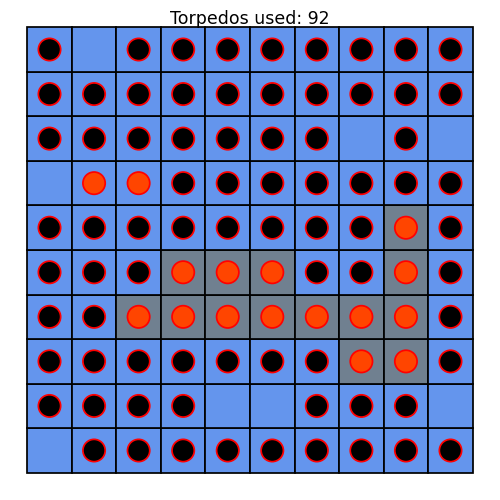

In [16]:
board = Board(10)

In [17]:
test_gym_env = BattleshipEnvClass()
agent = RLAgent(board, model, test_gym_env)
agent.play_until_completion()

KeyboardInterrupt: 